MDR, May 2017, personal study.

This notebook records a personal learning project, conducted during the Fast.AI course, in which a convnet is taught to ID distracted drivers. The dataset comes from an old Kaggle comp.

# Planning

## Tasks

After agreeing to the rules of the competition, the following tasks must be completed by the notebook, in order:
* set up the data;
    - set up the 'train', 'test' folders, and the 'sample' folders 'train' and 'valid';
    - create a validation set;
    - create a sample set;
    - check that each class is in a separate folder;
* explore the data:
    - get some idea of how it is organised, what is available to use, dimensions, classes, etc.;
* set up the model:
    - establish which pre-trained model to use
    - import the model
    - load the pre-trained weights
* set up for fine-tuning:
    - remove output layer
    - append new output layer (n classes)
    - set the batch size
* train the network (sample data)
* submit to Kaggle
* assess errors
* extend the fine-tuning
    - remove more layers
    

# Import packages, setup (every session)

<strong> N.B. </strong> You'll need to ensure that the files...<strong>
* 'utils.py' (by fast.ai), 
* 'vgg16.py' (adapted by fast.ai?), and
* 'vgg16bn' </strong>
...are findable by python - e.g. present in the root of the current directory.

## Define my fan-setting function (every session)

In [2]:
import os
def gpu_fans_up(speed = 0):
    "Puts the GPU fans into manual mode, and sets the speed to parameter value."
    "N.B. Setting to any speed <50 will switch to automatic mode."
    "... and anything above 90 is held to 90 (for now)."
    
    speed = int(speed)
    if speed > 90: speed = 90
    if speed >= 50:
        ## Turn the GPU fans up...
        speed = str(speed)
        man_comd = 'nvidia-settings -a [gpu:0]/GPUFanControlState=1'
        fan_comd = ' -a [fan:0]/GPUTargetFanSpeed=' + speed + ' -c :0.0'
        os.system(man_comd + fan_comd)
    else:
        ##turn the fans back to auto
        os.system('nvidia-settings -a [gpu:0]/GPUFanControlState=0')
    return;

## Import packages

In [3]:
%matplotlib inline
import numpy as np
import os

In [4]:
from shutil import copyfile    # N.B. when using copyfile, 'destination' must be the COMPLETE target file name
from shutil import copy        # but 'copy' has no such restrictions

In [5]:
import utils
from utils import *
#from imp import reload  # fixes a P2-P3 incompatibility
#reload(utils)

WARNING (theano.sandbox.cuda): The cuda backend is deprecated and will be removed in the next release (v0.10).  Please switch to the gpuarray backend. You can get more information about how to switch at this URL:
 https://github.com/Theano/Theano/wiki/Converting-to-the-new-gpu-back-end%28gpuarray%29

Using gpu device 0: GeForce GTX 1070 (CNMeM is disabled, cuDNN 5110)
Using Theano backend.


A function for checking for a folder name and creating one if needed.

In [6]:
import errno

def make_sure_path_exists(path):
    try:
        os.makedirs(path)
    except OSError as exception:
        if exception.errno != errno.EEXIST:
            raise

## Set up the path variables (Expt-specific)

<strong>DO re-run these cells, too...</strong>

In [7]:
current_dir = os.getcwd()
HOME_DIR = current_dir
DATA_HOME_DIR = current_dir + '/data'
print(' ', HOME_DIR, '\n ', DATA_HOME_DIR)

  /home/mark/Study/dl.fast.ai/deeplearning1/_MDR/2_distracted_driver 
  /home/mark/Study/dl.fast.ai/deeplearning1/_MDR/2_distracted_driver/data


This relative approach to folder referencing also works...

In [8]:
all_data_path = "data"
sampled_path = all_data_path + "/sample"
test_path = all_data_path + "/test"

# The following allows for easy switching...
data_path = all_data_path   
#data_path = sampled_path      

%ls $all_data_path

driver_imgs_list.csv      results/                   test/      valid/
driver_imgs_list.csv.zip  sample/                    train/
imgs.zip                  sample_submission.csv.zip  unzipped/


# Download, unzip, and organise the data 

The original order of tasks has been reorganised, to allow for the particular/peculiar results of the unzipping process to be understood and accounted for before we establish which new folders to create.

N.B. the folder structure that we're aiming for (under the root folder for the project) looks like this:

## Create the 'data' directory into which to load the Kaggle sets.

In [7]:
%ls

data/                          __pycache__/  vgg16bn.py
Distracted_Driver_MDR_1.ipynb  utils.py      vgg16.py


## Download the data

<strong>N.B. Don't rerun this - it takes ~30 min!</strong>

## Unzip the image data

N.B. to clean out the target directory for the unzip and start again, use the line below...

In [10]:
!tree -d $all_data_path

data
├── results
│   ├── conv_feat.dat
│   │   ├── data
│   │   └── meta
│   ├── conv_val_feat.dat
│   │   ├── data
│   │   └── meta
│   ├── test_filenames.dat
│   │   ├── data
│   │   └── meta
│   ├── test_preds.dat
│   │   ├── data
│   │   └── meta
│   ├── trn.dat
│   │   ├── data
│   │   └── meta
│   └── val.dat
│       ├── data
│       └── meta
├── sample
│   ├── test
│   │   └── unknown
│   ├── train
│   │   ├── c0
│   │   ├── c1
│   │   ├── c2
│   │   ├── c3
│   │   ├── c4
│   │   ├── c5
│   │   ├── c6
│   │   ├── c7
│   │   ├── c8
│   │   └── c9
│   └── valid
│       ├── c0
│       ├── c1
│       ├── c2
│       ├── c3
│       ├── c4
│       ├── c5
│       ├── c6
│       ├── c7
│       ├── c8
│       └── c9
├── test
│   └── unknown
├── train
│   ├── c0
│   ├── c1
│   ├── c2
│   ├── c3
│   ├── c4
│   ├── c5
│   ├── c6
│   ├── c7
│   ├── c8
│   └── c9
├── unzipped
└── valid
    ├── c0
    ├── c1
    ├── c2
    ├── c3
    ├── c4
    ├── c5
    ├── c6
    ├── c7
    ├── c8
    └── c9

In [12]:
!unzip $all_data_path/imgs.zip -d $all_data_path/unzipped  ## takes about 47s

Archive:  data/imgs.zip
   creating: data/unzipped/test/
  inflating: data/unzipped/test/img_1.jpg  
  inflating: data/unzipped/test/img_10.jpg  
  inflating: data/unzipped/test/img_100.jpg  
  inflating: data/unzipped/test/img_1000.jpg  
  inflating: data/unzipped/test/img_100000.jpg  
  inflating: data/unzipped/test/img_100001.jpg  
  inflating: data/unzipped/test/img_100002.jpg  
  inflating: data/unzipped/test/img_100003.jpg  
  inflating: data/unzipped/test/img_100004.jpg  
  inflating: data/unzipped/test/img_100005.jpg  
  inflating: data/unzipped/test/img_100007.jpg  
  inflating: data/unzipped/test/img_100008.jpg  
  inflating: data/unzipped/test/img_100009.jpg  
  inflating: data/unzipped/test/img_10001.jpg  
  inflating: data/unzipped/test/img_100010.jpg  
  inflating: data/unzipped/test/img_100011.jpg  
  inflating: data/unzipped/test/img_100012.jpg  
  inflating: data/unzipped/test/img_100013.jpg  
  inflating: data/unzipped/test/img_100014.jpg  
  inflating: data/unzipped/

  inflating: data/unzipped/test/img_100278.jpg  
  inflating: data/unzipped/test/img_100279.jpg  
  inflating: data/unzipped/test/img_10028.jpg  
  inflating: data/unzipped/test/img_100280.jpg  
  inflating: data/unzipped/test/img_100282.jpg  
  inflating: data/unzipped/test/img_100283.jpg  
  inflating: data/unzipped/test/img_100284.jpg  
  inflating: data/unzipped/test/img_100287.jpg  
  inflating: data/unzipped/test/img_100288.jpg  
  inflating: data/unzipped/test/img_100289.jpg  
  inflating: data/unzipped/test/img_10029.jpg  
  inflating: data/unzipped/test/img_100290.jpg  
  inflating: data/unzipped/test/img_100291.jpg  
  inflating: data/unzipped/test/img_100292.jpg  
  inflating: data/unzipped/test/img_100293.jpg  
  inflating: data/unzipped/test/img_100296.jpg  
  inflating: data/unzipped/test/img_100298.jpg  
  inflating: data/unzipped/test/img_1003.jpg  
  inflating: data/unzipped/test/img_10030.jpg  
  inflating: data/unzipped/test/img_100300.jpg  
  inflating: data/unzippe

  inflating: data/unzipped/test/img_100607.jpg  
  inflating: data/unzipped/test/img_100608.jpg  
  inflating: data/unzipped/test/img_100609.jpg  
  inflating: data/unzipped/test/img_10061.jpg  
  inflating: data/unzipped/test/img_100610.jpg  
  inflating: data/unzipped/test/img_100612.jpg  
  inflating: data/unzipped/test/img_100613.jpg  
  inflating: data/unzipped/test/img_100614.jpg  
  inflating: data/unzipped/test/img_100615.jpg  
  inflating: data/unzipped/test/img_100616.jpg  
  inflating: data/unzipped/test/img_100617.jpg  
  inflating: data/unzipped/test/img_100618.jpg  
  inflating: data/unzipped/test/img_100619.jpg  
  inflating: data/unzipped/test/img_100620.jpg  
  inflating: data/unzipped/test/img_100621.jpg  
  inflating: data/unzipped/test/img_100622.jpg  
  inflating: data/unzipped/test/img_100623.jpg  
  inflating: data/unzipped/test/img_100624.jpg  
  inflating: data/unzipped/test/img_100625.jpg  
  inflating: data/unzipped/test/img_100626.jpg  
  inflating: data/unz

  inflating: data/unzipped/test/img_100921.jpg  
  inflating: data/unzipped/test/img_100923.jpg  
  inflating: data/unzipped/test/img_100924.jpg  
  inflating: data/unzipped/test/img_100925.jpg  
  inflating: data/unzipped/test/img_100926.jpg  
  inflating: data/unzipped/test/img_100928.jpg  
  inflating: data/unzipped/test/img_100929.jpg  
  inflating: data/unzipped/test/img_100930.jpg  
  inflating: data/unzipped/test/img_100931.jpg  
  inflating: data/unzipped/test/img_100933.jpg  
  inflating: data/unzipped/test/img_100934.jpg  
  inflating: data/unzipped/test/img_100935.jpg  
  inflating: data/unzipped/test/img_100936.jpg  
  inflating: data/unzipped/test/img_100937.jpg  
  inflating: data/unzipped/test/img_100938.jpg  
  inflating: data/unzipped/test/img_100940.jpg  
  inflating: data/unzipped/test/img_100941.jpg  
  inflating: data/unzipped/test/img_100942.jpg  
  inflating: data/unzipped/test/img_100943.jpg  
  inflating: data/unzipped/test/img_100944.jpg  
  inflating: data/un

  inflating: data/unzipped/test/img_101250.jpg  
  inflating: data/unzipped/test/img_101251.jpg  
  inflating: data/unzipped/test/img_101253.jpg  
  inflating: data/unzipped/test/img_101254.jpg  
  inflating: data/unzipped/test/img_101255.jpg  
  inflating: data/unzipped/test/img_101256.jpg  
  inflating: data/unzipped/test/img_101257.jpg  
  inflating: data/unzipped/test/img_101259.jpg  
  inflating: data/unzipped/test/img_10126.jpg  
  inflating: data/unzipped/test/img_101260.jpg  
  inflating: data/unzipped/test/img_101261.jpg  
  inflating: data/unzipped/test/img_101262.jpg  
  inflating: data/unzipped/test/img_101263.jpg  
  inflating: data/unzipped/test/img_101265.jpg  
  inflating: data/unzipped/test/img_101266.jpg  
  inflating: data/unzipped/test/img_101268.jpg  
  inflating: data/unzipped/test/img_101269.jpg  
  inflating: data/unzipped/test/img_10127.jpg  
  inflating: data/unzipped/test/img_101270.jpg  
  inflating: data/unzipped/test/img_101271.jpg  
  inflating: data/unzi

  inflating: data/unzipped/test/img_101567.jpg  
  inflating: data/unzipped/test/img_101568.jpg  
  inflating: data/unzipped/test/img_101569.jpg  
  inflating: data/unzipped/test/img_10157.jpg  
  inflating: data/unzipped/test/img_101570.jpg  
  inflating: data/unzipped/test/img_101571.jpg  
  inflating: data/unzipped/test/img_101572.jpg  
  inflating: data/unzipped/test/img_101573.jpg  
  inflating: data/unzipped/test/img_101574.jpg  
  inflating: data/unzipped/test/img_101576.jpg  
  inflating: data/unzipped/test/img_101577.jpg  
  inflating: data/unzipped/test/img_10158.jpg  
  inflating: data/unzipped/test/img_101580.jpg  
  inflating: data/unzipped/test/img_101581.jpg  
  inflating: data/unzipped/test/img_101583.jpg  
  inflating: data/unzipped/test/img_101584.jpg  
  inflating: data/unzipped/test/img_101585.jpg  
  inflating: data/unzipped/test/img_101586.jpg  
  inflating: data/unzipped/test/img_101589.jpg  
  inflating: data/unzipped/test/img_10159.jpg  
  inflating: data/unzip

  inflating: data/unzipped/test/img_101882.jpg  
  inflating: data/unzipped/test/img_101883.jpg  
  inflating: data/unzipped/test/img_101884.jpg  
  inflating: data/unzipped/test/img_101885.jpg  
  inflating: data/unzipped/test/img_101886.jpg  
  inflating: data/unzipped/test/img_101887.jpg  
  inflating: data/unzipped/test/img_101888.jpg  
  inflating: data/unzipped/test/img_101889.jpg  
  inflating: data/unzipped/test/img_10189.jpg  
  inflating: data/unzipped/test/img_101890.jpg  
  inflating: data/unzipped/test/img_101891.jpg  
  inflating: data/unzipped/test/img_101892.jpg  
  inflating: data/unzipped/test/img_101893.jpg  
  inflating: data/unzipped/test/img_101894.jpg  
  inflating: data/unzipped/test/img_101895.jpg  
  inflating: data/unzipped/test/img_101896.jpg  
  inflating: data/unzipped/test/img_101897.jpg  
  inflating: data/unzipped/test/img_101899.jpg  
  inflating: data/unzipped/test/img_10190.jpg  
  inflating: data/unzipped/test/img_101900.jpg  
  inflating: data/unzi

  inflating: data/unzipped/test/img_10280.jpg  
  inflating: data/unzipped/test/img_10281.jpg  
  inflating: data/unzipped/test/img_10282.jpg  
  inflating: data/unzipped/test/img_10283.jpg  
  inflating: data/unzipped/test/img_10284.jpg  
  inflating: data/unzipped/test/img_10285.jpg  
  inflating: data/unzipped/test/img_10286.jpg  
  inflating: data/unzipped/test/img_10287.jpg  
  inflating: data/unzipped/test/img_10289.jpg  
  inflating: data/unzipped/test/img_1029.jpg  
  inflating: data/unzipped/test/img_10290.jpg  
  inflating: data/unzipped/test/img_10292.jpg  
  inflating: data/unzipped/test/img_10293.jpg  
  inflating: data/unzipped/test/img_10294.jpg  
  inflating: data/unzipped/test/img_10295.jpg  
  inflating: data/unzipped/test/img_10296.jpg  
  inflating: data/unzipped/test/img_10297.jpg  
  inflating: data/unzipped/test/img_10298.jpg  
  inflating: data/unzipped/test/img_10299.jpg  
  inflating: data/unzipped/test/img_103.jpg  
  inflating: data/unzipped/test/img_1030.jp

  inflating: data/unzipped/test/img_10579.jpg  
  inflating: data/unzipped/test/img_1058.jpg  
  inflating: data/unzipped/test/img_10581.jpg  
  inflating: data/unzipped/test/img_10583.jpg  
  inflating: data/unzipped/test/img_10584.jpg  
  inflating: data/unzipped/test/img_10585.jpg  
  inflating: data/unzipped/test/img_10586.jpg  
  inflating: data/unzipped/test/img_10587.jpg  
  inflating: data/unzipped/test/img_1059.jpg  
  inflating: data/unzipped/test/img_10590.jpg  
  inflating: data/unzipped/test/img_10593.jpg  
  inflating: data/unzipped/test/img_10594.jpg  
  inflating: data/unzipped/test/img_10595.jpg  
  inflating: data/unzipped/test/img_10596.jpg  
  inflating: data/unzipped/test/img_10597.jpg  
  inflating: data/unzipped/test/img_10598.jpg  
  inflating: data/unzipped/test/img_10599.jpg  
  inflating: data/unzipped/test/img_106.jpg  
  inflating: data/unzipped/test/img_1060.jpg  
  inflating: data/unzipped/test/img_10600.jpg  
  inflating: data/unzipped/test/img_10601.jpg

  inflating: data/unzipped/test/img_1090.jpg  
  inflating: data/unzipped/test/img_10900.jpg  
  inflating: data/unzipped/test/img_10901.jpg  
  inflating: data/unzipped/test/img_10903.jpg  
  inflating: data/unzipped/test/img_10904.jpg  
  inflating: data/unzipped/test/img_10905.jpg  
  inflating: data/unzipped/test/img_10906.jpg  
  inflating: data/unzipped/test/img_10907.jpg  
  inflating: data/unzipped/test/img_10908.jpg  
  inflating: data/unzipped/test/img_1091.jpg  
  inflating: data/unzipped/test/img_10910.jpg  
  inflating: data/unzipped/test/img_10911.jpg  
  inflating: data/unzipped/test/img_10912.jpg  
  inflating: data/unzipped/test/img_10913.jpg  
  inflating: data/unzipped/test/img_10914.jpg  
  inflating: data/unzipped/test/img_10915.jpg  
  inflating: data/unzipped/test/img_10916.jpg  
  inflating: data/unzipped/test/img_1092.jpg  
  inflating: data/unzipped/test/img_10920.jpg  
  inflating: data/unzipped/test/img_10921.jpg  
  inflating: data/unzipped/test/img_10923.j

  inflating: data/unzipped/test/img_11227.jpg  
  inflating: data/unzipped/test/img_11229.jpg  
  inflating: data/unzipped/test/img_1123.jpg  
  inflating: data/unzipped/test/img_11231.jpg  
  inflating: data/unzipped/test/img_11232.jpg  
  inflating: data/unzipped/test/img_11233.jpg  
  inflating: data/unzipped/test/img_11234.jpg  
  inflating: data/unzipped/test/img_11235.jpg  
  inflating: data/unzipped/test/img_11236.jpg  
  inflating: data/unzipped/test/img_11238.jpg  
  inflating: data/unzipped/test/img_1124.jpg  
  inflating: data/unzipped/test/img_11240.jpg  
  inflating: data/unzipped/test/img_11241.jpg  
  inflating: data/unzipped/test/img_11242.jpg  
  inflating: data/unzipped/test/img_11243.jpg  
  inflating: data/unzipped/test/img_11244.jpg  
  inflating: data/unzipped/test/img_11245.jpg  
  inflating: data/unzipped/test/img_11246.jpg  
  inflating: data/unzipped/test/img_11247.jpg  
  inflating: data/unzipped/test/img_11250.jpg  
  inflating: data/unzipped/test/img_11251.

  inflating: data/unzipped/test/img_11550.jpg  
  inflating: data/unzipped/test/img_11551.jpg  
  inflating: data/unzipped/test/img_11552.jpg  
  inflating: data/unzipped/test/img_11554.jpg  
  inflating: data/unzipped/test/img_11555.jpg  
  inflating: data/unzipped/test/img_11556.jpg  
  inflating: data/unzipped/test/img_11558.jpg  
  inflating: data/unzipped/test/img_11559.jpg  
  inflating: data/unzipped/test/img_1156.jpg  
  inflating: data/unzipped/test/img_11560.jpg  
  inflating: data/unzipped/test/img_11562.jpg  
  inflating: data/unzipped/test/img_11563.jpg  
  inflating: data/unzipped/test/img_11564.jpg  
  inflating: data/unzipped/test/img_11565.jpg  
  inflating: data/unzipped/test/img_11566.jpg  
  inflating: data/unzipped/test/img_11567.jpg  
  inflating: data/unzipped/test/img_11568.jpg  
  inflating: data/unzipped/test/img_11569.jpg  
  inflating: data/unzipped/test/img_1157.jpg  
  inflating: data/unzipped/test/img_11570.jpg  
  inflating: data/unzipped/test/img_11571.

  inflating: data/unzipped/test/img_11875.jpg  
  inflating: data/unzipped/test/img_11876.jpg  
  inflating: data/unzipped/test/img_11877.jpg  
  inflating: data/unzipped/test/img_11878.jpg  
  inflating: data/unzipped/test/img_11879.jpg  
  inflating: data/unzipped/test/img_1188.jpg  
  inflating: data/unzipped/test/img_11880.jpg  
  inflating: data/unzipped/test/img_11881.jpg  
  inflating: data/unzipped/test/img_11882.jpg  
  inflating: data/unzipped/test/img_11883.jpg  
  inflating: data/unzipped/test/img_11884.jpg  
  inflating: data/unzipped/test/img_11885.jpg  
  inflating: data/unzipped/test/img_11886.jpg  
  inflating: data/unzipped/test/img_11887.jpg  
  inflating: data/unzipped/test/img_11888.jpg  
  inflating: data/unzipped/test/img_11889.jpg  
  inflating: data/unzipped/test/img_1189.jpg  
  inflating: data/unzipped/test/img_11890.jpg  
  inflating: data/unzipped/test/img_11891.jpg  
  inflating: data/unzipped/test/img_11893.jpg  
  inflating: data/unzipped/test/img_11894.

  inflating: data/unzipped/test/img_12190.jpg  
  inflating: data/unzipped/test/img_12191.jpg  
  inflating: data/unzipped/test/img_12192.jpg  
  inflating: data/unzipped/test/img_12194.jpg  
  inflating: data/unzipped/test/img_12195.jpg  
  inflating: data/unzipped/test/img_12197.jpg  
  inflating: data/unzipped/test/img_12198.jpg  
  inflating: data/unzipped/test/img_12199.jpg  
  inflating: data/unzipped/test/img_122.jpg  
  inflating: data/unzipped/test/img_12200.jpg  
  inflating: data/unzipped/test/img_12201.jpg  
  inflating: data/unzipped/test/img_12202.jpg  
  inflating: data/unzipped/test/img_12205.jpg  
  inflating: data/unzipped/test/img_12207.jpg  
  inflating: data/unzipped/test/img_12208.jpg  
  inflating: data/unzipped/test/img_12209.jpg  
  inflating: data/unzipped/test/img_1221.jpg  
  inflating: data/unzipped/test/img_12210.jpg  
  inflating: data/unzipped/test/img_12212.jpg  
  inflating: data/unzipped/test/img_12213.jpg  
  inflating: data/unzipped/test/img_12215.j

  inflating: data/unzipped/test/img_12505.jpg  
  inflating: data/unzipped/test/img_12506.jpg  
  inflating: data/unzipped/test/img_12507.jpg  
  inflating: data/unzipped/test/img_12508.jpg  
  inflating: data/unzipped/test/img_12509.jpg  
  inflating: data/unzipped/test/img_1251.jpg  
  inflating: data/unzipped/test/img_12510.jpg  
  inflating: data/unzipped/test/img_12511.jpg  
  inflating: data/unzipped/test/img_12512.jpg  
  inflating: data/unzipped/test/img_12513.jpg  
  inflating: data/unzipped/test/img_12514.jpg  
  inflating: data/unzipped/test/img_12515.jpg  
  inflating: data/unzipped/test/img_12516.jpg  
  inflating: data/unzipped/test/img_12517.jpg  
  inflating: data/unzipped/test/img_12518.jpg  
  inflating: data/unzipped/test/img_1252.jpg  
  inflating: data/unzipped/test/img_12521.jpg  
  inflating: data/unzipped/test/img_12522.jpg  
  inflating: data/unzipped/test/img_12523.jpg  
  inflating: data/unzipped/test/img_12524.jpg  
  inflating: data/unzipped/test/img_12525.

  inflating: data/unzipped/test/img_12837.jpg  
  inflating: data/unzipped/test/img_12838.jpg  
  inflating: data/unzipped/test/img_12839.jpg  
  inflating: data/unzipped/test/img_1284.jpg  
  inflating: data/unzipped/test/img_12840.jpg  
  inflating: data/unzipped/test/img_12841.jpg  
  inflating: data/unzipped/test/img_12843.jpg  
  inflating: data/unzipped/test/img_12844.jpg  
  inflating: data/unzipped/test/img_12845.jpg  
  inflating: data/unzipped/test/img_12846.jpg  
  inflating: data/unzipped/test/img_12847.jpg  
  inflating: data/unzipped/test/img_12849.jpg  
  inflating: data/unzipped/test/img_1285.jpg  
  inflating: data/unzipped/test/img_12850.jpg  
  inflating: data/unzipped/test/img_12852.jpg  
  inflating: data/unzipped/test/img_12853.jpg  
  inflating: data/unzipped/test/img_12854.jpg  
  inflating: data/unzipped/test/img_12856.jpg  
  inflating: data/unzipped/test/img_12857.jpg  
  inflating: data/unzipped/test/img_12858.jpg  
  inflating: data/unzipped/test/img_12859.

  inflating: data/unzipped/test/img_13143.jpg  
  inflating: data/unzipped/test/img_13145.jpg  
  inflating: data/unzipped/test/img_13147.jpg  
  inflating: data/unzipped/test/img_13148.jpg  
  inflating: data/unzipped/test/img_13149.jpg  
  inflating: data/unzipped/test/img_1315.jpg  
  inflating: data/unzipped/test/img_13150.jpg  
  inflating: data/unzipped/test/img_13151.jpg  
  inflating: data/unzipped/test/img_13152.jpg  
  inflating: data/unzipped/test/img_13153.jpg  
  inflating: data/unzipped/test/img_13154.jpg  
  inflating: data/unzipped/test/img_13155.jpg  
  inflating: data/unzipped/test/img_13156.jpg  
  inflating: data/unzipped/test/img_13157.jpg  
  inflating: data/unzipped/test/img_13158.jpg  
  inflating: data/unzipped/test/img_13159.jpg  
  inflating: data/unzipped/test/img_1316.jpg  
  inflating: data/unzipped/test/img_13161.jpg  
  inflating: data/unzipped/test/img_13162.jpg  
  inflating: data/unzipped/test/img_13163.jpg  
  inflating: data/unzipped/test/img_13165.

  inflating: data/unzipped/test/img_13473.jpg  
  inflating: data/unzipped/test/img_13474.jpg  
  inflating: data/unzipped/test/img_13475.jpg  
  inflating: data/unzipped/test/img_13476.jpg  
  inflating: data/unzipped/test/img_13477.jpg  
  inflating: data/unzipped/test/img_13478.jpg  
  inflating: data/unzipped/test/img_13479.jpg  
  inflating: data/unzipped/test/img_1348.jpg  
  inflating: data/unzipped/test/img_13484.jpg  
  inflating: data/unzipped/test/img_13485.jpg  
  inflating: data/unzipped/test/img_13486.jpg  
  inflating: data/unzipped/test/img_13487.jpg  
  inflating: data/unzipped/test/img_13488.jpg  
  inflating: data/unzipped/test/img_13489.jpg  
  inflating: data/unzipped/test/img_1349.jpg  
  inflating: data/unzipped/test/img_13490.jpg  
  inflating: data/unzipped/test/img_13491.jpg  
  inflating: data/unzipped/test/img_13492.jpg  
  inflating: data/unzipped/test/img_13493.jpg  
  inflating: data/unzipped/test/img_13494.jpg  
  inflating: data/unzipped/test/img_13496.

  inflating: data/unzipped/test/img_13784.jpg  
  inflating: data/unzipped/test/img_13785.jpg  
  inflating: data/unzipped/test/img_13787.jpg  
  inflating: data/unzipped/test/img_13788.jpg  
  inflating: data/unzipped/test/img_13789.jpg  
  inflating: data/unzipped/test/img_1379.jpg  
  inflating: data/unzipped/test/img_13790.jpg  
  inflating: data/unzipped/test/img_13792.jpg  
  inflating: data/unzipped/test/img_13793.jpg  
  inflating: data/unzipped/test/img_13794.jpg  
  inflating: data/unzipped/test/img_13796.jpg  
  inflating: data/unzipped/test/img_13797.jpg  
  inflating: data/unzipped/test/img_13798.jpg  
  inflating: data/unzipped/test/img_13799.jpg  
  inflating: data/unzipped/test/img_1380.jpg  
  inflating: data/unzipped/test/img_13800.jpg  
  inflating: data/unzipped/test/img_13801.jpg  
  inflating: data/unzipped/test/img_13802.jpg  
  inflating: data/unzipped/test/img_13804.jpg  
  inflating: data/unzipped/test/img_13806.jpg  
  inflating: data/unzipped/test/img_13808.

  inflating: data/unzipped/test/img_14106.jpg  
  inflating: data/unzipped/test/img_14109.jpg  
  inflating: data/unzipped/test/img_1411.jpg  
  inflating: data/unzipped/test/img_14110.jpg  
  inflating: data/unzipped/test/img_14112.jpg  
  inflating: data/unzipped/test/img_14113.jpg  
  inflating: data/unzipped/test/img_14114.jpg  
  inflating: data/unzipped/test/img_14115.jpg  
  inflating: data/unzipped/test/img_14116.jpg  
  inflating: data/unzipped/test/img_14117.jpg  
  inflating: data/unzipped/test/img_14119.jpg  
  inflating: data/unzipped/test/img_1412.jpg  
  inflating: data/unzipped/test/img_14120.jpg  
  inflating: data/unzipped/test/img_14121.jpg  
  inflating: data/unzipped/test/img_14122.jpg  
  inflating: data/unzipped/test/img_14123.jpg  
  inflating: data/unzipped/test/img_14124.jpg  
  inflating: data/unzipped/test/img_14126.jpg  
  inflating: data/unzipped/test/img_14127.jpg  
  inflating: data/unzipped/test/img_14128.jpg  
  inflating: data/unzipped/test/img_14129.

  inflating: data/unzipped/test/img_14438.jpg  
  inflating: data/unzipped/test/img_14439.jpg  
  inflating: data/unzipped/test/img_14440.jpg  
  inflating: data/unzipped/test/img_14441.jpg  
  inflating: data/unzipped/test/img_14442.jpg  
  inflating: data/unzipped/test/img_14443.jpg  
  inflating: data/unzipped/test/img_14444.jpg  
  inflating: data/unzipped/test/img_14445.jpg  
  inflating: data/unzipped/test/img_14448.jpg  
  inflating: data/unzipped/test/img_14449.jpg  
  inflating: data/unzipped/test/img_1445.jpg  
  inflating: data/unzipped/test/img_14451.jpg  
  inflating: data/unzipped/test/img_14452.jpg  
  inflating: data/unzipped/test/img_14453.jpg  
  inflating: data/unzipped/test/img_14454.jpg  
  inflating: data/unzipped/test/img_14455.jpg  
  inflating: data/unzipped/test/img_14456.jpg  
  inflating: data/unzipped/test/img_14457.jpg  
  inflating: data/unzipped/test/img_14458.jpg  
  inflating: data/unzipped/test/img_1446.jpg  
  inflating: data/unzipped/test/img_14461.

  inflating: data/unzipped/test/img_14759.jpg  
  inflating: data/unzipped/test/img_1476.jpg  
  inflating: data/unzipped/test/img_14760.jpg  
  inflating: data/unzipped/test/img_14761.jpg  
  inflating: data/unzipped/test/img_14762.jpg  
  inflating: data/unzipped/test/img_14763.jpg  
  inflating: data/unzipped/test/img_14764.jpg  
  inflating: data/unzipped/test/img_14765.jpg  
  inflating: data/unzipped/test/img_14766.jpg  
  inflating: data/unzipped/test/img_14767.jpg  
  inflating: data/unzipped/test/img_14768.jpg  
  inflating: data/unzipped/test/img_14769.jpg  
  inflating: data/unzipped/test/img_1477.jpg  
  inflating: data/unzipped/test/img_14770.jpg  
  inflating: data/unzipped/test/img_14771.jpg  
  inflating: data/unzipped/test/img_14772.jpg  
  inflating: data/unzipped/test/img_14773.jpg  
  inflating: data/unzipped/test/img_14775.jpg  
  inflating: data/unzipped/test/img_14776.jpg  
  inflating: data/unzipped/test/img_14777.jpg  
  inflating: data/unzipped/test/img_1478.j

  inflating: data/unzipped/test/img_15076.jpg  
  inflating: data/unzipped/test/img_15077.jpg  
  inflating: data/unzipped/test/img_15078.jpg  
  inflating: data/unzipped/test/img_1508.jpg  
  inflating: data/unzipped/test/img_15080.jpg  
  inflating: data/unzipped/test/img_15081.jpg  
  inflating: data/unzipped/test/img_15082.jpg  
  inflating: data/unzipped/test/img_15083.jpg  
  inflating: data/unzipped/test/img_15084.jpg  
  inflating: data/unzipped/test/img_15085.jpg  
  inflating: data/unzipped/test/img_15086.jpg  
  inflating: data/unzipped/test/img_15087.jpg  
  inflating: data/unzipped/test/img_1509.jpg  
  inflating: data/unzipped/test/img_15090.jpg  
  inflating: data/unzipped/test/img_15091.jpg  
  inflating: data/unzipped/test/img_15092.jpg  
  inflating: data/unzipped/test/img_15093.jpg  
  inflating: data/unzipped/test/img_15094.jpg  
  inflating: data/unzipped/test/img_15095.jpg  
  inflating: data/unzipped/test/img_15096.jpg  
  inflating: data/unzipped/test/img_15097.

  inflating: data/unzipped/test/img_15401.jpg  
  inflating: data/unzipped/test/img_15402.jpg  
  inflating: data/unzipped/test/img_15403.jpg  
  inflating: data/unzipped/test/img_15404.jpg  
  inflating: data/unzipped/test/img_15405.jpg  
  inflating: data/unzipped/test/img_15406.jpg  
  inflating: data/unzipped/test/img_15407.jpg  
  inflating: data/unzipped/test/img_15409.jpg  
  inflating: data/unzipped/test/img_1541.jpg  
  inflating: data/unzipped/test/img_15410.jpg  
  inflating: data/unzipped/test/img_15411.jpg  
  inflating: data/unzipped/test/img_15412.jpg  
  inflating: data/unzipped/test/img_15413.jpg  
  inflating: data/unzipped/test/img_15414.jpg  
  inflating: data/unzipped/test/img_15415.jpg  
  inflating: data/unzipped/test/img_15416.jpg  
  inflating: data/unzipped/test/img_15418.jpg  
  inflating: data/unzipped/test/img_15419.jpg  
  inflating: data/unzipped/test/img_15420.jpg  
  inflating: data/unzipped/test/img_15421.jpg  
  inflating: data/unzipped/test/img_15423

  inflating: data/unzipped/test/img_15714.jpg  
  inflating: data/unzipped/test/img_15719.jpg  
  inflating: data/unzipped/test/img_1572.jpg  
  inflating: data/unzipped/test/img_15722.jpg  
  inflating: data/unzipped/test/img_15723.jpg  
  inflating: data/unzipped/test/img_15724.jpg  
  inflating: data/unzipped/test/img_15725.jpg  
  inflating: data/unzipped/test/img_15726.jpg  
  inflating: data/unzipped/test/img_15727.jpg  
  inflating: data/unzipped/test/img_15728.jpg  
  inflating: data/unzipped/test/img_15729.jpg  
  inflating: data/unzipped/test/img_1573.jpg  
  inflating: data/unzipped/test/img_15730.jpg  
  inflating: data/unzipped/test/img_15731.jpg  
  inflating: data/unzipped/test/img_15732.jpg  
  inflating: data/unzipped/test/img_15733.jpg  
  inflating: data/unzipped/test/img_15734.jpg  
  inflating: data/unzipped/test/img_15735.jpg  
  inflating: data/unzipped/test/img_15739.jpg  
  inflating: data/unzipped/test/img_1574.jpg  
  inflating: data/unzipped/test/img_15740.j

  inflating: data/unzipped/test/img_16031.jpg  
  inflating: data/unzipped/test/img_16032.jpg  
  inflating: data/unzipped/test/img_16034.jpg  
  inflating: data/unzipped/test/img_16036.jpg  
  inflating: data/unzipped/test/img_16037.jpg  
  inflating: data/unzipped/test/img_16038.jpg  
  inflating: data/unzipped/test/img_16039.jpg  
  inflating: data/unzipped/test/img_1604.jpg  
  inflating: data/unzipped/test/img_16040.jpg  
  inflating: data/unzipped/test/img_16041.jpg  
  inflating: data/unzipped/test/img_16042.jpg  
  inflating: data/unzipped/test/img_16043.jpg  
  inflating: data/unzipped/test/img_16044.jpg  
  inflating: data/unzipped/test/img_16047.jpg  
  inflating: data/unzipped/test/img_16048.jpg  
  inflating: data/unzipped/test/img_16050.jpg  
  inflating: data/unzipped/test/img_16053.jpg  
  inflating: data/unzipped/test/img_16055.jpg  
  inflating: data/unzipped/test/img_16056.jpg  
  inflating: data/unzipped/test/img_16057.jpg  
  inflating: data/unzipped/test/img_16058

  inflating: data/unzipped/test/img_16349.jpg  
  inflating: data/unzipped/test/img_1635.jpg  
  inflating: data/unzipped/test/img_16350.jpg  
  inflating: data/unzipped/test/img_16351.jpg  
  inflating: data/unzipped/test/img_16353.jpg  
  inflating: data/unzipped/test/img_16354.jpg  
  inflating: data/unzipped/test/img_16356.jpg  
  inflating: data/unzipped/test/img_16357.jpg  
  inflating: data/unzipped/test/img_16358.jpg  
  inflating: data/unzipped/test/img_1636.jpg  
  inflating: data/unzipped/test/img_16360.jpg  
  inflating: data/unzipped/test/img_16361.jpg  
  inflating: data/unzipped/test/img_16362.jpg  
  inflating: data/unzipped/test/img_16364.jpg  
  inflating: data/unzipped/test/img_16365.jpg  
  inflating: data/unzipped/test/img_16366.jpg  
  inflating: data/unzipped/test/img_16369.jpg  
  inflating: data/unzipped/test/img_1637.jpg  
  inflating: data/unzipped/test/img_16370.jpg  
  inflating: data/unzipped/test/img_16373.jpg  
  inflating: data/unzipped/test/img_16375.j

  inflating: data/unzipped/test/img_1666.jpg  
  inflating: data/unzipped/test/img_16660.jpg  
  inflating: data/unzipped/test/img_16662.jpg  
  inflating: data/unzipped/test/img_16664.jpg  
  inflating: data/unzipped/test/img_16665.jpg  
  inflating: data/unzipped/test/img_16667.jpg  
  inflating: data/unzipped/test/img_1667.jpg  
  inflating: data/unzipped/test/img_16670.jpg  
  inflating: data/unzipped/test/img_16672.jpg  
  inflating: data/unzipped/test/img_16673.jpg  
  inflating: data/unzipped/test/img_16674.jpg  
  inflating: data/unzipped/test/img_16675.jpg  
  inflating: data/unzipped/test/img_16676.jpg  
  inflating: data/unzipped/test/img_16678.jpg  
  inflating: data/unzipped/test/img_16679.jpg  
  inflating: data/unzipped/test/img_1668.jpg  
  inflating: data/unzipped/test/img_16681.jpg  
  inflating: data/unzipped/test/img_16684.jpg  
  inflating: data/unzipped/test/img_16685.jpg  
  inflating: data/unzipped/test/img_16686.jpg  
  inflating: data/unzipped/test/img_16687.j

  inflating: data/unzipped/test/img_16972.jpg  
  inflating: data/unzipped/test/img_16973.jpg  
  inflating: data/unzipped/test/img_16974.jpg  
  inflating: data/unzipped/test/img_16975.jpg  
  inflating: data/unzipped/test/img_16976.jpg  
  inflating: data/unzipped/test/img_16977.jpg  
  inflating: data/unzipped/test/img_16979.jpg  
  inflating: data/unzipped/test/img_1698.jpg  
  inflating: data/unzipped/test/img_16981.jpg  
  inflating: data/unzipped/test/img_16982.jpg  
  inflating: data/unzipped/test/img_16983.jpg  
  inflating: data/unzipped/test/img_16986.jpg  
  inflating: data/unzipped/test/img_16987.jpg  
  inflating: data/unzipped/test/img_16991.jpg  
  inflating: data/unzipped/test/img_16992.jpg  
  inflating: data/unzipped/test/img_16993.jpg  
  inflating: data/unzipped/test/img_16994.jpg  
  inflating: data/unzipped/test/img_16995.jpg  
  inflating: data/unzipped/test/img_16996.jpg  
  inflating: data/unzipped/test/img_16997.jpg  
  inflating: data/unzipped/test/img_16998

  inflating: data/unzipped/test/img_17290.jpg  
  inflating: data/unzipped/test/img_17292.jpg  
  inflating: data/unzipped/test/img_17293.jpg  
  inflating: data/unzipped/test/img_17294.jpg  
  inflating: data/unzipped/test/img_17295.jpg  
  inflating: data/unzipped/test/img_17296.jpg  
  inflating: data/unzipped/test/img_17297.jpg  
  inflating: data/unzipped/test/img_17299.jpg  
  inflating: data/unzipped/test/img_1730.jpg  
  inflating: data/unzipped/test/img_17300.jpg  
  inflating: data/unzipped/test/img_17301.jpg  
  inflating: data/unzipped/test/img_17302.jpg  
  inflating: data/unzipped/test/img_17303.jpg  
  inflating: data/unzipped/test/img_17304.jpg  
  inflating: data/unzipped/test/img_17306.jpg  
  inflating: data/unzipped/test/img_17307.jpg  
  inflating: data/unzipped/test/img_17308.jpg  
  inflating: data/unzipped/test/img_17309.jpg  
  inflating: data/unzipped/test/img_1731.jpg  
  inflating: data/unzipped/test/img_17311.jpg  
  inflating: data/unzipped/test/img_17312.

  inflating: data/unzipped/test/img_17609.jpg  
  inflating: data/unzipped/test/img_17610.jpg  
  inflating: data/unzipped/test/img_17611.jpg  
  inflating: data/unzipped/test/img_17612.jpg  
  inflating: data/unzipped/test/img_17614.jpg  
  inflating: data/unzipped/test/img_17616.jpg  
  inflating: data/unzipped/test/img_17618.jpg  
  inflating: data/unzipped/test/img_17619.jpg  
  inflating: data/unzipped/test/img_17620.jpg  
  inflating: data/unzipped/test/img_17621.jpg  
  inflating: data/unzipped/test/img_17622.jpg  
  inflating: data/unzipped/test/img_17623.jpg  
  inflating: data/unzipped/test/img_17624.jpg  
  inflating: data/unzipped/test/img_17625.jpg  
  inflating: data/unzipped/test/img_17626.jpg  
  inflating: data/unzipped/test/img_17627.jpg  
  inflating: data/unzipped/test/img_17628.jpg  
  inflating: data/unzipped/test/img_17629.jpg  
  inflating: data/unzipped/test/img_1763.jpg  
  inflating: data/unzipped/test/img_17630.jpg  
  inflating: data/unzipped/test/img_17631

  inflating: data/unzipped/test/img_17932.jpg  
  inflating: data/unzipped/test/img_17934.jpg  
  inflating: data/unzipped/test/img_17935.jpg  
  inflating: data/unzipped/test/img_17936.jpg  
  inflating: data/unzipped/test/img_17937.jpg  
  inflating: data/unzipped/test/img_17938.jpg  
  inflating: data/unzipped/test/img_1794.jpg  
  inflating: data/unzipped/test/img_17940.jpg  
  inflating: data/unzipped/test/img_17941.jpg  
  inflating: data/unzipped/test/img_17942.jpg  
  inflating: data/unzipped/test/img_17943.jpg  
  inflating: data/unzipped/test/img_17944.jpg  
  inflating: data/unzipped/test/img_17945.jpg  
  inflating: data/unzipped/test/img_17946.jpg  
  inflating: data/unzipped/test/img_17947.jpg  
  inflating: data/unzipped/test/img_17949.jpg  
  inflating: data/unzipped/test/img_1795.jpg  
  inflating: data/unzipped/test/img_17951.jpg  
  inflating: data/unzipped/test/img_17952.jpg  
  inflating: data/unzipped/test/img_17953.jpg  
  inflating: data/unzipped/test/img_17954.

  inflating: data/unzipped/test/img_18256.jpg  
  inflating: data/unzipped/test/img_18258.jpg  
  inflating: data/unzipped/test/img_18259.jpg  
  inflating: data/unzipped/test/img_1826.jpg  
  inflating: data/unzipped/test/img_18260.jpg  
  inflating: data/unzipped/test/img_18261.jpg  
  inflating: data/unzipped/test/img_18262.jpg  
  inflating: data/unzipped/test/img_18263.jpg  
  inflating: data/unzipped/test/img_18264.jpg  
  inflating: data/unzipped/test/img_18265.jpg  
  inflating: data/unzipped/test/img_18269.jpg  
  inflating: data/unzipped/test/img_18270.jpg  
  inflating: data/unzipped/test/img_18271.jpg  
  inflating: data/unzipped/test/img_18272.jpg  
  inflating: data/unzipped/test/img_18273.jpg  
  inflating: data/unzipped/test/img_18274.jpg  
  inflating: data/unzipped/test/img_18275.jpg  
  inflating: data/unzipped/test/img_18276.jpg  
  inflating: data/unzipped/test/img_18278.jpg  
  inflating: data/unzipped/test/img_18279.jpg  
  inflating: data/unzipped/test/img_1828.

  inflating: data/unzipped/test/img_18574.jpg  
  inflating: data/unzipped/test/img_18576.jpg  
  inflating: data/unzipped/test/img_18577.jpg  
  inflating: data/unzipped/test/img_18578.jpg  
  inflating: data/unzipped/test/img_18579.jpg  
  inflating: data/unzipped/test/img_1858.jpg  
  inflating: data/unzipped/test/img_18580.jpg  
  inflating: data/unzipped/test/img_18581.jpg  
  inflating: data/unzipped/test/img_18582.jpg  
  inflating: data/unzipped/test/img_18584.jpg  
  inflating: data/unzipped/test/img_18586.jpg  
  inflating: data/unzipped/test/img_18587.jpg  
  inflating: data/unzipped/test/img_18588.jpg  
  inflating: data/unzipped/test/img_18589.jpg  
  inflating: data/unzipped/test/img_1859.jpg  
  inflating: data/unzipped/test/img_18590.jpg  
  inflating: data/unzipped/test/img_18591.jpg  
  inflating: data/unzipped/test/img_18592.jpg  
  inflating: data/unzipped/test/img_18593.jpg  
  inflating: data/unzipped/test/img_18594.jpg  
  inflating: data/unzipped/test/img_18595.

  inflating: data/unzipped/test/img_18889.jpg  
  inflating: data/unzipped/test/img_1889.jpg  
  inflating: data/unzipped/test/img_18890.jpg  
  inflating: data/unzipped/test/img_18892.jpg  
  inflating: data/unzipped/test/img_18893.jpg  
  inflating: data/unzipped/test/img_18896.jpg  
  inflating: data/unzipped/test/img_18898.jpg  
  inflating: data/unzipped/test/img_18899.jpg  
  inflating: data/unzipped/test/img_189.jpg  
  inflating: data/unzipped/test/img_1890.jpg  
  inflating: data/unzipped/test/img_18900.jpg  
  inflating: data/unzipped/test/img_18902.jpg  
  inflating: data/unzipped/test/img_18904.jpg  
  inflating: data/unzipped/test/img_18905.jpg  
  inflating: data/unzipped/test/img_18906.jpg  
  inflating: data/unzipped/test/img_18911.jpg  
  inflating: data/unzipped/test/img_18912.jpg  
  inflating: data/unzipped/test/img_18913.jpg  
  inflating: data/unzipped/test/img_18914.jpg  
  inflating: data/unzipped/test/img_18915.jpg  
  inflating: data/unzipped/test/img_18916.jp

  inflating: data/unzipped/test/img_19218.jpg  
  inflating: data/unzipped/test/img_19219.jpg  
  inflating: data/unzipped/test/img_19221.jpg  
  inflating: data/unzipped/test/img_19222.jpg  
  inflating: data/unzipped/test/img_19223.jpg  
  inflating: data/unzipped/test/img_19225.jpg  
  inflating: data/unzipped/test/img_19226.jpg  
  inflating: data/unzipped/test/img_19227.jpg  
  inflating: data/unzipped/test/img_19228.jpg  
  inflating: data/unzipped/test/img_19229.jpg  
  inflating: data/unzipped/test/img_1923.jpg  
  inflating: data/unzipped/test/img_19230.jpg  
  inflating: data/unzipped/test/img_19231.jpg  
  inflating: data/unzipped/test/img_19232.jpg  
  inflating: data/unzipped/test/img_19233.jpg  
  inflating: data/unzipped/test/img_19234.jpg  
  inflating: data/unzipped/test/img_19235.jpg  
  inflating: data/unzipped/test/img_19236.jpg  
  inflating: data/unzipped/test/img_19237.jpg  
  inflating: data/unzipped/test/img_1924.jpg  
  inflating: data/unzipped/test/img_19240.

  inflating: data/unzipped/test/img_19542.jpg  
  inflating: data/unzipped/test/img_19544.jpg  
  inflating: data/unzipped/test/img_19545.jpg  
  inflating: data/unzipped/test/img_19546.jpg  
  inflating: data/unzipped/test/img_19547.jpg  
  inflating: data/unzipped/test/img_19548.jpg  
  inflating: data/unzipped/test/img_1955.jpg  
  inflating: data/unzipped/test/img_19550.jpg  
  inflating: data/unzipped/test/img_19551.jpg  
  inflating: data/unzipped/test/img_19552.jpg  
  inflating: data/unzipped/test/img_19553.jpg  
  inflating: data/unzipped/test/img_19554.jpg  
  inflating: data/unzipped/test/img_19556.jpg  
  inflating: data/unzipped/test/img_19558.jpg  
  inflating: data/unzipped/test/img_1956.jpg  
  inflating: data/unzipped/test/img_19560.jpg  
  inflating: data/unzipped/test/img_19562.jpg  
  inflating: data/unzipped/test/img_19564.jpg  
  inflating: data/unzipped/test/img_19565.jpg  
  inflating: data/unzipped/test/img_19566.jpg  
  inflating: data/unzipped/test/img_19567.

  inflating: data/unzipped/test/img_19838.jpg  
  inflating: data/unzipped/test/img_19839.jpg  
  inflating: data/unzipped/test/img_1984.jpg  
  inflating: data/unzipped/test/img_19840.jpg  
  inflating: data/unzipped/test/img_19841.jpg  
  inflating: data/unzipped/test/img_19842.jpg  
  inflating: data/unzipped/test/img_19844.jpg  
  inflating: data/unzipped/test/img_19846.jpg  
  inflating: data/unzipped/test/img_19847.jpg  
  inflating: data/unzipped/test/img_1985.jpg  
  inflating: data/unzipped/test/img_19850.jpg  
  inflating: data/unzipped/test/img_19851.jpg  
  inflating: data/unzipped/test/img_19852.jpg  
  inflating: data/unzipped/test/img_19853.jpg  
  inflating: data/unzipped/test/img_19855.jpg  
  inflating: data/unzipped/test/img_19857.jpg  
  inflating: data/unzipped/test/img_19858.jpg  
  inflating: data/unzipped/test/img_1986.jpg  
  inflating: data/unzipped/test/img_19860.jpg  
  inflating: data/unzipped/test/img_19861.jpg  
  inflating: data/unzipped/test/img_19864.j

  inflating: data/unzipped/test/img_2016.jpg  
  inflating: data/unzipped/test/img_20160.jpg  
  inflating: data/unzipped/test/img_20161.jpg  
  inflating: data/unzipped/test/img_20162.jpg  
  inflating: data/unzipped/test/img_20163.jpg  
  inflating: data/unzipped/test/img_20165.jpg  
  inflating: data/unzipped/test/img_20166.jpg  
  inflating: data/unzipped/test/img_20167.jpg  
  inflating: data/unzipped/test/img_2017.jpg  
  inflating: data/unzipped/test/img_20170.jpg  
  inflating: data/unzipped/test/img_20172.jpg  
  inflating: data/unzipped/test/img_20173.jpg  
  inflating: data/unzipped/test/img_20174.jpg  
  inflating: data/unzipped/test/img_20175.jpg  
  inflating: data/unzipped/test/img_20176.jpg  
  inflating: data/unzipped/test/img_20177.jpg  
  inflating: data/unzipped/test/img_20179.jpg  
  inflating: data/unzipped/test/img_2018.jpg  
  inflating: data/unzipped/test/img_20180.jpg  
  inflating: data/unzipped/test/img_20181.jpg  
  inflating: data/unzipped/test/img_20182.j

  inflating: data/unzipped/test/img_20491.jpg  
  inflating: data/unzipped/test/img_20493.jpg  
  inflating: data/unzipped/test/img_20495.jpg  
  inflating: data/unzipped/test/img_20496.jpg  
  inflating: data/unzipped/test/img_20499.jpg  
  inflating: data/unzipped/test/img_205.jpg  
  inflating: data/unzipped/test/img_2050.jpg  
  inflating: data/unzipped/test/img_20500.jpg  
  inflating: data/unzipped/test/img_20501.jpg  
  inflating: data/unzipped/test/img_20502.jpg  
  inflating: data/unzipped/test/img_20503.jpg  
  inflating: data/unzipped/test/img_20504.jpg  
  inflating: data/unzipped/test/img_20505.jpg  
  inflating: data/unzipped/test/img_20506.jpg  
  inflating: data/unzipped/test/img_20507.jpg  
  inflating: data/unzipped/test/img_20508.jpg  
  inflating: data/unzipped/test/img_20509.jpg  
  inflating: data/unzipped/test/img_20510.jpg  
  inflating: data/unzipped/test/img_20511.jpg  
  inflating: data/unzipped/test/img_20512.jpg  
  inflating: data/unzipped/test/img_20515.j

  inflating: data/unzipped/test/img_20820.jpg  
  inflating: data/unzipped/test/img_20821.jpg  
  inflating: data/unzipped/test/img_20822.jpg  
  inflating: data/unzipped/test/img_20823.jpg  
  inflating: data/unzipped/test/img_20824.jpg  
  inflating: data/unzipped/test/img_20825.jpg  
  inflating: data/unzipped/test/img_20826.jpg  
  inflating: data/unzipped/test/img_20828.jpg  
  inflating: data/unzipped/test/img_20829.jpg  
  inflating: data/unzipped/test/img_2083.jpg  
  inflating: data/unzipped/test/img_20830.jpg  
  inflating: data/unzipped/test/img_20831.jpg  
  inflating: data/unzipped/test/img_20832.jpg  
  inflating: data/unzipped/test/img_20833.jpg  
  inflating: data/unzipped/test/img_20834.jpg  
  inflating: data/unzipped/test/img_20835.jpg  
  inflating: data/unzipped/test/img_20836.jpg  
  inflating: data/unzipped/test/img_20838.jpg  
  inflating: data/unzipped/test/img_20839.jpg  
  inflating: data/unzipped/test/img_2084.jpg  
  inflating: data/unzipped/test/img_20840.

  inflating: data/unzipped/test/img_21117.jpg  
  inflating: data/unzipped/test/img_21118.jpg  
  inflating: data/unzipped/test/img_2112.jpg  
  inflating: data/unzipped/test/img_21120.jpg  
  inflating: data/unzipped/test/img_21121.jpg  
  inflating: data/unzipped/test/img_21122.jpg  
  inflating: data/unzipped/test/img_21123.jpg  
  inflating: data/unzipped/test/img_21124.jpg  
  inflating: data/unzipped/test/img_21125.jpg  
  inflating: data/unzipped/test/img_21126.jpg  
  inflating: data/unzipped/test/img_21127.jpg  
  inflating: data/unzipped/test/img_21128.jpg  
  inflating: data/unzipped/test/img_21129.jpg  
  inflating: data/unzipped/test/img_21130.jpg  
  inflating: data/unzipped/test/img_21131.jpg  
  inflating: data/unzipped/test/img_21132.jpg  
  inflating: data/unzipped/test/img_21133.jpg  
  inflating: data/unzipped/test/img_21134.jpg  
  inflating: data/unzipped/test/img_21135.jpg  
  inflating: data/unzipped/test/img_21136.jpg  
  inflating: data/unzipped/test/img_21138

  inflating: data/unzipped/test/img_21436.jpg  
  inflating: data/unzipped/test/img_21437.jpg  
  inflating: data/unzipped/test/img_21438.jpg  
  inflating: data/unzipped/test/img_21439.jpg  
  inflating: data/unzipped/test/img_21440.jpg  
  inflating: data/unzipped/test/img_21441.jpg  
  inflating: data/unzipped/test/img_21442.jpg  
  inflating: data/unzipped/test/img_21443.jpg  
  inflating: data/unzipped/test/img_21444.jpg  
  inflating: data/unzipped/test/img_21445.jpg  
  inflating: data/unzipped/test/img_21446.jpg  
  inflating: data/unzipped/test/img_21448.jpg  
  inflating: data/unzipped/test/img_21450.jpg  
  inflating: data/unzipped/test/img_21451.jpg  
  inflating: data/unzipped/test/img_21453.jpg  
  inflating: data/unzipped/test/img_21454.jpg  
  inflating: data/unzipped/test/img_21455.jpg  
  inflating: data/unzipped/test/img_21457.jpg  
  inflating: data/unzipped/test/img_21458.jpg  
  inflating: data/unzipped/test/img_21459.jpg  
  inflating: data/unzipped/test/img_2146

  inflating: data/unzipped/test/img_21754.jpg  
  inflating: data/unzipped/test/img_21757.jpg  
  inflating: data/unzipped/test/img_21758.jpg  
  inflating: data/unzipped/test/img_21759.jpg  
  inflating: data/unzipped/test/img_2176.jpg  
  inflating: data/unzipped/test/img_21760.jpg  
  inflating: data/unzipped/test/img_21761.jpg  
  inflating: data/unzipped/test/img_21763.jpg  
  inflating: data/unzipped/test/img_21765.jpg  
  inflating: data/unzipped/test/img_21768.jpg  
  inflating: data/unzipped/test/img_21769.jpg  
  inflating: data/unzipped/test/img_2177.jpg  
  inflating: data/unzipped/test/img_21770.jpg  
  inflating: data/unzipped/test/img_21771.jpg  
  inflating: data/unzipped/test/img_21774.jpg  
  inflating: data/unzipped/test/img_21775.jpg  
  inflating: data/unzipped/test/img_21777.jpg  
  inflating: data/unzipped/test/img_21778.jpg  
  inflating: data/unzipped/test/img_21779.jpg  
  inflating: data/unzipped/test/img_21780.jpg  
  inflating: data/unzipped/test/img_21781.

  inflating: data/unzipped/test/img_22071.jpg  
  inflating: data/unzipped/test/img_22072.jpg  
  inflating: data/unzipped/test/img_22073.jpg  
  inflating: data/unzipped/test/img_22074.jpg  
  inflating: data/unzipped/test/img_22076.jpg  
  inflating: data/unzipped/test/img_22077.jpg  
  inflating: data/unzipped/test/img_22078.jpg  
  inflating: data/unzipped/test/img_22079.jpg  
  inflating: data/unzipped/test/img_2208.jpg  
  inflating: data/unzipped/test/img_22080.jpg  
  inflating: data/unzipped/test/img_22081.jpg  
  inflating: data/unzipped/test/img_22082.jpg  
  inflating: data/unzipped/test/img_22083.jpg  
  inflating: data/unzipped/test/img_22084.jpg  
  inflating: data/unzipped/test/img_22085.jpg  
  inflating: data/unzipped/test/img_22087.jpg  
  inflating: data/unzipped/test/img_22088.jpg  
  inflating: data/unzipped/test/img_22089.jpg  
  inflating: data/unzipped/test/img_22090.jpg  
  inflating: data/unzipped/test/img_22092.jpg  
  inflating: data/unzipped/test/img_22093

  inflating: data/unzipped/test/img_224.jpg  
  inflating: data/unzipped/test/img_2240.jpg  
  inflating: data/unzipped/test/img_22400.jpg  
  inflating: data/unzipped/test/img_22402.jpg  
  inflating: data/unzipped/test/img_22405.jpg  
  inflating: data/unzipped/test/img_22406.jpg  
  inflating: data/unzipped/test/img_22407.jpg  
  inflating: data/unzipped/test/img_22408.jpg  
  inflating: data/unzipped/test/img_22409.jpg  
  inflating: data/unzipped/test/img_2241.jpg  
  inflating: data/unzipped/test/img_22412.jpg  
  inflating: data/unzipped/test/img_22413.jpg  
  inflating: data/unzipped/test/img_22415.jpg  
  inflating: data/unzipped/test/img_22417.jpg  
  inflating: data/unzipped/test/img_22418.jpg  
  inflating: data/unzipped/test/img_22419.jpg  
  inflating: data/unzipped/test/img_2242.jpg  
  inflating: data/unzipped/test/img_22420.jpg  
  inflating: data/unzipped/test/img_22422.jpg  
  inflating: data/unzipped/test/img_22423.jpg  
  inflating: data/unzipped/test/img_22424.jpg

  inflating: data/unzipped/test/img_22706.jpg  
  inflating: data/unzipped/test/img_22708.jpg  
  inflating: data/unzipped/test/img_2271.jpg  
  inflating: data/unzipped/test/img_22710.jpg  
  inflating: data/unzipped/test/img_22711.jpg  
  inflating: data/unzipped/test/img_22713.jpg  
  inflating: data/unzipped/test/img_22715.jpg  
  inflating: data/unzipped/test/img_22716.jpg  
  inflating: data/unzipped/test/img_22717.jpg  
  inflating: data/unzipped/test/img_22719.jpg  
  inflating: data/unzipped/test/img_2272.jpg  
  inflating: data/unzipped/test/img_22720.jpg  
  inflating: data/unzipped/test/img_22721.jpg  
  inflating: data/unzipped/test/img_22722.jpg  
  inflating: data/unzipped/test/img_22723.jpg  
  inflating: data/unzipped/test/img_22724.jpg  
  inflating: data/unzipped/test/img_22725.jpg  
  inflating: data/unzipped/test/img_22726.jpg  
  inflating: data/unzipped/test/img_22727.jpg  
  inflating: data/unzipped/test/img_22728.jpg  
  inflating: data/unzipped/test/img_22729.

  inflating: data/unzipped/test/img_23022.jpg  
  inflating: data/unzipped/test/img_23023.jpg  
  inflating: data/unzipped/test/img_23024.jpg  
  inflating: data/unzipped/test/img_23026.jpg  
  inflating: data/unzipped/test/img_23027.jpg  
  inflating: data/unzipped/test/img_23028.jpg  
  inflating: data/unzipped/test/img_23029.jpg  
  inflating: data/unzipped/test/img_2303.jpg  
  inflating: data/unzipped/test/img_23030.jpg  
  inflating: data/unzipped/test/img_23031.jpg  
  inflating: data/unzipped/test/img_23032.jpg  
  inflating: data/unzipped/test/img_23034.jpg  
  inflating: data/unzipped/test/img_23035.jpg  
  inflating: data/unzipped/test/img_23036.jpg  
  inflating: data/unzipped/test/img_23037.jpg  
  inflating: data/unzipped/test/img_23038.jpg  
  inflating: data/unzipped/test/img_23039.jpg  
  inflating: data/unzipped/test/img_2304.jpg  
  inflating: data/unzipped/test/img_23040.jpg  
  inflating: data/unzipped/test/img_23043.jpg  
  inflating: data/unzipped/test/img_23044.

  inflating: data/unzipped/test/img_23331.jpg  
  inflating: data/unzipped/test/img_23332.jpg  
  inflating: data/unzipped/test/img_23333.jpg  
  inflating: data/unzipped/test/img_23334.jpg  
  inflating: data/unzipped/test/img_23335.jpg  
  inflating: data/unzipped/test/img_23336.jpg  
  inflating: data/unzipped/test/img_23338.jpg  
  inflating: data/unzipped/test/img_23339.jpg  
  inflating: data/unzipped/test/img_23340.jpg  
  inflating: data/unzipped/test/img_23341.jpg  
  inflating: data/unzipped/test/img_23342.jpg  
  inflating: data/unzipped/test/img_23343.jpg  
  inflating: data/unzipped/test/img_23344.jpg  
  inflating: data/unzipped/test/img_23345.jpg  
  inflating: data/unzipped/test/img_23347.jpg  
  inflating: data/unzipped/test/img_2335.jpg  
  inflating: data/unzipped/test/img_23351.jpg  
  inflating: data/unzipped/test/img_23353.jpg  
  inflating: data/unzipped/test/img_23354.jpg  
  inflating: data/unzipped/test/img_23355.jpg  
  inflating: data/unzipped/test/img_23356

  inflating: data/unzipped/test/img_23660.jpg  
  inflating: data/unzipped/test/img_23661.jpg  
  inflating: data/unzipped/test/img_23662.jpg  
  inflating: data/unzipped/test/img_23663.jpg  
  inflating: data/unzipped/test/img_23664.jpg  
  inflating: data/unzipped/test/img_23665.jpg  
  inflating: data/unzipped/test/img_23666.jpg  
  inflating: data/unzipped/test/img_23668.jpg  
  inflating: data/unzipped/test/img_23669.jpg  
  inflating: data/unzipped/test/img_2367.jpg  
  inflating: data/unzipped/test/img_23670.jpg  
  inflating: data/unzipped/test/img_23671.jpg  
  inflating: data/unzipped/test/img_23673.jpg  
  inflating: data/unzipped/test/img_23674.jpg  
  inflating: data/unzipped/test/img_23678.jpg  
  inflating: data/unzipped/test/img_23679.jpg  
  inflating: data/unzipped/test/img_2368.jpg  
  inflating: data/unzipped/test/img_23681.jpg  
  inflating: data/unzipped/test/img_23682.jpg  
  inflating: data/unzipped/test/img_23684.jpg  
  inflating: data/unzipped/test/img_23685.

  inflating: data/unzipped/test/img_23937.jpg  
  inflating: data/unzipped/test/img_23938.jpg  
  inflating: data/unzipped/test/img_23939.jpg  
  inflating: data/unzipped/test/img_2394.jpg  
  inflating: data/unzipped/test/img_23940.jpg  
  inflating: data/unzipped/test/img_23941.jpg  
  inflating: data/unzipped/test/img_23942.jpg  
  inflating: data/unzipped/test/img_23943.jpg  
  inflating: data/unzipped/test/img_23944.jpg  
  inflating: data/unzipped/test/img_23945.jpg  
  inflating: data/unzipped/test/img_23947.jpg  
  inflating: data/unzipped/test/img_23949.jpg  
  inflating: data/unzipped/test/img_2395.jpg  
  inflating: data/unzipped/test/img_23951.jpg  
  inflating: data/unzipped/test/img_23952.jpg  
  inflating: data/unzipped/test/img_23953.jpg  
  inflating: data/unzipped/test/img_23954.jpg  
  inflating: data/unzipped/test/img_23955.jpg  
  inflating: data/unzipped/test/img_23956.jpg  
  inflating: data/unzipped/test/img_23958.jpg  
  inflating: data/unzipped/test/img_23959.

  inflating: data/unzipped/test/img_24267.jpg  
  inflating: data/unzipped/test/img_24268.jpg  
  inflating: data/unzipped/test/img_24269.jpg  
  inflating: data/unzipped/test/img_2427.jpg  
  inflating: data/unzipped/test/img_24272.jpg  
  inflating: data/unzipped/test/img_24273.jpg  
  inflating: data/unzipped/test/img_24274.jpg  
  inflating: data/unzipped/test/img_24278.jpg  
  inflating: data/unzipped/test/img_24279.jpg  
  inflating: data/unzipped/test/img_2428.jpg  
  inflating: data/unzipped/test/img_24280.jpg  
  inflating: data/unzipped/test/img_24281.jpg  
  inflating: data/unzipped/test/img_24282.jpg  
  inflating: data/unzipped/test/img_24283.jpg  
  inflating: data/unzipped/test/img_24284.jpg  
  inflating: data/unzipped/test/img_24285.jpg  
  inflating: data/unzipped/test/img_24287.jpg  
  inflating: data/unzipped/test/img_24288.jpg  
  inflating: data/unzipped/test/img_2429.jpg  
  inflating: data/unzipped/test/img_24292.jpg  
  inflating: data/unzipped/test/img_24293.j

  inflating: data/unzipped/test/img_24591.jpg  
  inflating: data/unzipped/test/img_24592.jpg  
  inflating: data/unzipped/test/img_24593.jpg  
  inflating: data/unzipped/test/img_24595.jpg  
  inflating: data/unzipped/test/img_24596.jpg  
  inflating: data/unzipped/test/img_24597.jpg  
  inflating: data/unzipped/test/img_24599.jpg  
  inflating: data/unzipped/test/img_246.jpg  
  inflating: data/unzipped/test/img_2460.jpg  
  inflating: data/unzipped/test/img_24600.jpg  
  inflating: data/unzipped/test/img_24601.jpg  
  inflating: data/unzipped/test/img_24602.jpg  
  inflating: data/unzipped/test/img_24603.jpg  
  inflating: data/unzipped/test/img_24604.jpg  
  inflating: data/unzipped/test/img_24605.jpg  
  inflating: data/unzipped/test/img_24606.jpg  
  inflating: data/unzipped/test/img_24608.jpg  
  inflating: data/unzipped/test/img_24609.jpg  
  inflating: data/unzipped/test/img_2461.jpg  
  inflating: data/unzipped/test/img_24610.jpg  
  inflating: data/unzipped/test/img_24611.jp

  inflating: data/unzipped/test/img_24903.jpg  
  inflating: data/unzipped/test/img_24904.jpg  
  inflating: data/unzipped/test/img_24906.jpg  
  inflating: data/unzipped/test/img_24907.jpg  
  inflating: data/unzipped/test/img_24908.jpg  
  inflating: data/unzipped/test/img_24909.jpg  
  inflating: data/unzipped/test/img_2491.jpg  
  inflating: data/unzipped/test/img_24910.jpg  
  inflating: data/unzipped/test/img_24911.jpg  
  inflating: data/unzipped/test/img_24912.jpg  
  inflating: data/unzipped/test/img_24913.jpg  
  inflating: data/unzipped/test/img_24914.jpg  
  inflating: data/unzipped/test/img_24915.jpg  
  inflating: data/unzipped/test/img_24918.jpg  
  inflating: data/unzipped/test/img_24919.jpg  
  inflating: data/unzipped/test/img_2492.jpg  
  inflating: data/unzipped/test/img_24920.jpg  
  inflating: data/unzipped/test/img_24922.jpg  
  inflating: data/unzipped/test/img_24923.jpg  
  inflating: data/unzipped/test/img_24924.jpg  
  inflating: data/unzipped/test/img_24926.

  inflating: data/unzipped/test/img_25217.jpg  
  inflating: data/unzipped/test/img_25218.jpg  
  inflating: data/unzipped/test/img_25219.jpg  
  inflating: data/unzipped/test/img_2522.jpg  
  inflating: data/unzipped/test/img_25220.jpg  
  inflating: data/unzipped/test/img_25221.jpg  
  inflating: data/unzipped/test/img_25222.jpg  
  inflating: data/unzipped/test/img_25223.jpg  
  inflating: data/unzipped/test/img_25225.jpg  
  inflating: data/unzipped/test/img_25226.jpg  
  inflating: data/unzipped/test/img_25227.jpg  
  inflating: data/unzipped/test/img_25228.jpg  
  inflating: data/unzipped/test/img_25229.jpg  
  inflating: data/unzipped/test/img_25230.jpg  
  inflating: data/unzipped/test/img_25232.jpg  
  inflating: data/unzipped/test/img_25233.jpg  
  inflating: data/unzipped/test/img_25234.jpg  
  inflating: data/unzipped/test/img_25236.jpg  
  inflating: data/unzipped/test/img_25237.jpg  
  inflating: data/unzipped/test/img_25238.jpg  
  inflating: data/unzipped/test/img_2524.

  inflating: data/unzipped/test/img_25523.jpg  
  inflating: data/unzipped/test/img_25524.jpg  
  inflating: data/unzipped/test/img_25525.jpg  
  inflating: data/unzipped/test/img_25526.jpg  
  inflating: data/unzipped/test/img_25527.jpg  
  inflating: data/unzipped/test/img_25528.jpg  
  inflating: data/unzipped/test/img_25529.jpg  
  inflating: data/unzipped/test/img_25531.jpg  
  inflating: data/unzipped/test/img_25532.jpg  
  inflating: data/unzipped/test/img_25533.jpg  
  inflating: data/unzipped/test/img_25534.jpg  
  inflating: data/unzipped/test/img_25536.jpg  
  inflating: data/unzipped/test/img_25537.jpg  
  inflating: data/unzipped/test/img_25539.jpg  
  inflating: data/unzipped/test/img_25541.jpg  
  inflating: data/unzipped/test/img_25542.jpg  
  inflating: data/unzipped/test/img_25543.jpg  
  inflating: data/unzipped/test/img_25546.jpg  
  inflating: data/unzipped/test/img_25548.jpg  
  inflating: data/unzipped/test/img_25549.jpg  
  inflating: data/unzipped/test/img_2555

  inflating: data/unzipped/test/img_2584.jpg  
  inflating: data/unzipped/test/img_25840.jpg  
  inflating: data/unzipped/test/img_25842.jpg  
  inflating: data/unzipped/test/img_25843.jpg  
  inflating: data/unzipped/test/img_25845.jpg  
  inflating: data/unzipped/test/img_25848.jpg  
  inflating: data/unzipped/test/img_25852.jpg  
  inflating: data/unzipped/test/img_25853.jpg  
  inflating: data/unzipped/test/img_25854.jpg  
  inflating: data/unzipped/test/img_25855.jpg  
  inflating: data/unzipped/test/img_25856.jpg  
  inflating: data/unzipped/test/img_25857.jpg  
  inflating: data/unzipped/test/img_25858.jpg  
  inflating: data/unzipped/test/img_2586.jpg  
  inflating: data/unzipped/test/img_25863.jpg  
  inflating: data/unzipped/test/img_25866.jpg  
  inflating: data/unzipped/test/img_25868.jpg  
  inflating: data/unzipped/test/img_25869.jpg  
  inflating: data/unzipped/test/img_2587.jpg  
  inflating: data/unzipped/test/img_25870.jpg  
  inflating: data/unzipped/test/img_25871.j

  inflating: data/unzipped/test/img_26163.jpg  
  inflating: data/unzipped/test/img_26165.jpg  
  inflating: data/unzipped/test/img_26167.jpg  
  inflating: data/unzipped/test/img_26168.jpg  
  inflating: data/unzipped/test/img_26169.jpg  
  inflating: data/unzipped/test/img_2617.jpg  
  inflating: data/unzipped/test/img_26170.jpg  
  inflating: data/unzipped/test/img_26171.jpg  
  inflating: data/unzipped/test/img_26172.jpg  
  inflating: data/unzipped/test/img_26173.jpg  
  inflating: data/unzipped/test/img_26174.jpg  
  inflating: data/unzipped/test/img_26175.jpg  
  inflating: data/unzipped/test/img_26176.jpg  
  inflating: data/unzipped/test/img_26177.jpg  
  inflating: data/unzipped/test/img_26178.jpg  
  inflating: data/unzipped/test/img_26179.jpg  
  inflating: data/unzipped/test/img_26180.jpg  
  inflating: data/unzipped/test/img_26181.jpg  
  inflating: data/unzipped/test/img_26182.jpg  
  inflating: data/unzipped/test/img_26183.jpg  
  inflating: data/unzipped/test/img_26186

  inflating: data/unzipped/test/img_26472.jpg  
  inflating: data/unzipped/test/img_26473.jpg  
  inflating: data/unzipped/test/img_26474.jpg  
  inflating: data/unzipped/test/img_26475.jpg  
  inflating: data/unzipped/test/img_26476.jpg  
  inflating: data/unzipped/test/img_26477.jpg  
  inflating: data/unzipped/test/img_26478.jpg  
  inflating: data/unzipped/test/img_26480.jpg  
  inflating: data/unzipped/test/img_26481.jpg  
  inflating: data/unzipped/test/img_26482.jpg  
  inflating: data/unzipped/test/img_26483.jpg  
  inflating: data/unzipped/test/img_26485.jpg  
  inflating: data/unzipped/test/img_26486.jpg  
  inflating: data/unzipped/test/img_26487.jpg  
  inflating: data/unzipped/test/img_2649.jpg  
  inflating: data/unzipped/test/img_26490.jpg  
  inflating: data/unzipped/test/img_26491.jpg  
  inflating: data/unzipped/test/img_26492.jpg  
  inflating: data/unzipped/test/img_26493.jpg  
  inflating: data/unzipped/test/img_26494.jpg  
  inflating: data/unzipped/test/img_26496

  inflating: data/unzipped/test/img_26777.jpg  
  inflating: data/unzipped/test/img_26778.jpg  
  inflating: data/unzipped/test/img_26779.jpg  
  inflating: data/unzipped/test/img_2678.jpg  
  inflating: data/unzipped/test/img_26780.jpg  
  inflating: data/unzipped/test/img_26782.jpg  
  inflating: data/unzipped/test/img_26783.jpg  
  inflating: data/unzipped/test/img_26784.jpg  
  inflating: data/unzipped/test/img_26785.jpg  
  inflating: data/unzipped/test/img_26786.jpg  
  inflating: data/unzipped/test/img_26787.jpg  
  inflating: data/unzipped/test/img_26788.jpg  
  inflating: data/unzipped/test/img_2679.jpg  
  inflating: data/unzipped/test/img_26791.jpg  
  inflating: data/unzipped/test/img_26792.jpg  
  inflating: data/unzipped/test/img_26793.jpg  
  inflating: data/unzipped/test/img_26794.jpg  
  inflating: data/unzipped/test/img_26795.jpg  
  inflating: data/unzipped/test/img_26796.jpg  
  inflating: data/unzipped/test/img_26798.jpg  
  inflating: data/unzipped/test/img_26799.

  inflating: data/unzipped/test/img_27078.jpg  
  inflating: data/unzipped/test/img_2708.jpg  
  inflating: data/unzipped/test/img_27080.jpg  
  inflating: data/unzipped/test/img_27081.jpg  
  inflating: data/unzipped/test/img_27082.jpg  
  inflating: data/unzipped/test/img_27084.jpg  
  inflating: data/unzipped/test/img_27085.jpg  
  inflating: data/unzipped/test/img_27086.jpg  
  inflating: data/unzipped/test/img_27087.jpg  
  inflating: data/unzipped/test/img_27088.jpg  
  inflating: data/unzipped/test/img_27089.jpg  
  inflating: data/unzipped/test/img_2709.jpg  
  inflating: data/unzipped/test/img_27090.jpg  
  inflating: data/unzipped/test/img_27091.jpg  
  inflating: data/unzipped/test/img_27093.jpg  
  inflating: data/unzipped/test/img_27094.jpg  
  inflating: data/unzipped/test/img_27096.jpg  
  inflating: data/unzipped/test/img_27097.jpg  
  inflating: data/unzipped/test/img_27098.jpg  
  inflating: data/unzipped/test/img_27099.jpg  
  inflating: data/unzipped/test/img_2710.j

  inflating: data/unzipped/test/img_27376.jpg  
  inflating: data/unzipped/test/img_27378.jpg  
  inflating: data/unzipped/test/img_2738.jpg  
  inflating: data/unzipped/test/img_27380.jpg  
  inflating: data/unzipped/test/img_27383.jpg  
  inflating: data/unzipped/test/img_27384.jpg  
  inflating: data/unzipped/test/img_27388.jpg  
  inflating: data/unzipped/test/img_27389.jpg  
  inflating: data/unzipped/test/img_27391.jpg  
  inflating: data/unzipped/test/img_27392.jpg  
  inflating: data/unzipped/test/img_27393.jpg  
  inflating: data/unzipped/test/img_27396.jpg  
  inflating: data/unzipped/test/img_27397.jpg  
  inflating: data/unzipped/test/img_27398.jpg  
  inflating: data/unzipped/test/img_2740.jpg  
  inflating: data/unzipped/test/img_27401.jpg  
  inflating: data/unzipped/test/img_27402.jpg  
  inflating: data/unzipped/test/img_27404.jpg  
  inflating: data/unzipped/test/img_27405.jpg  
  inflating: data/unzipped/test/img_27406.jpg  
  inflating: data/unzipped/test/img_27408.

  inflating: data/unzipped/test/img_27698.jpg  
  inflating: data/unzipped/test/img_27699.jpg  
  inflating: data/unzipped/test/img_277.jpg  
  inflating: data/unzipped/test/img_27700.jpg  
  inflating: data/unzipped/test/img_27702.jpg  
  inflating: data/unzipped/test/img_27704.jpg  
  inflating: data/unzipped/test/img_27705.jpg  
  inflating: data/unzipped/test/img_27706.jpg  
  inflating: data/unzipped/test/img_27708.jpg  
  inflating: data/unzipped/test/img_27709.jpg  
  inflating: data/unzipped/test/img_2771.jpg  
  inflating: data/unzipped/test/img_27710.jpg  
  inflating: data/unzipped/test/img_27711.jpg  
  inflating: data/unzipped/test/img_27712.jpg  
  inflating: data/unzipped/test/img_27713.jpg  
  inflating: data/unzipped/test/img_27714.jpg  
  inflating: data/unzipped/test/img_27715.jpg  
  inflating: data/unzipped/test/img_27716.jpg  
  inflating: data/unzipped/test/img_27717.jpg  
  inflating: data/unzipped/test/img_27718.jpg  
  inflating: data/unzipped/test/img_27719.j

  inflating: data/unzipped/test/img_280.jpg  
  inflating: data/unzipped/test/img_2800.jpg  
  inflating: data/unzipped/test/img_28000.jpg  
  inflating: data/unzipped/test/img_28001.jpg  
  inflating: data/unzipped/test/img_28002.jpg  
  inflating: data/unzipped/test/img_28003.jpg  
  inflating: data/unzipped/test/img_28004.jpg  
  inflating: data/unzipped/test/img_28005.jpg  
  inflating: data/unzipped/test/img_28006.jpg  
  inflating: data/unzipped/test/img_28007.jpg  
  inflating: data/unzipped/test/img_28008.jpg  
  inflating: data/unzipped/test/img_28009.jpg  
  inflating: data/unzipped/test/img_2801.jpg  
  inflating: data/unzipped/test/img_28010.jpg  
  inflating: data/unzipped/test/img_28011.jpg  
  inflating: data/unzipped/test/img_28014.jpg  
  inflating: data/unzipped/test/img_28016.jpg  
  inflating: data/unzipped/test/img_28017.jpg  
  inflating: data/unzipped/test/img_28018.jpg  
  inflating: data/unzipped/test/img_28019.jpg  
  inflating: data/unzipped/test/img_2802.jpg

  inflating: data/unzipped/test/img_28307.jpg  
  inflating: data/unzipped/test/img_2831.jpg  
  inflating: data/unzipped/test/img_28310.jpg  
  inflating: data/unzipped/test/img_28311.jpg  
  inflating: data/unzipped/test/img_28312.jpg  
  inflating: data/unzipped/test/img_28313.jpg  
  inflating: data/unzipped/test/img_28314.jpg  
  inflating: data/unzipped/test/img_28315.jpg  
  inflating: data/unzipped/test/img_28317.jpg  
  inflating: data/unzipped/test/img_28318.jpg  
  inflating: data/unzipped/test/img_28319.jpg  
  inflating: data/unzipped/test/img_28320.jpg  
  inflating: data/unzipped/test/img_28321.jpg  
  inflating: data/unzipped/test/img_28322.jpg  
  inflating: data/unzipped/test/img_28323.jpg  
  inflating: data/unzipped/test/img_28324.jpg  
  inflating: data/unzipped/test/img_28325.jpg  
  inflating: data/unzipped/test/img_28326.jpg  
  inflating: data/unzipped/test/img_28327.jpg  
  inflating: data/unzipped/test/img_28328.jpg  
  inflating: data/unzipped/test/img_2833.

  inflating: data/unzipped/test/img_28618.jpg  
  inflating: data/unzipped/test/img_28619.jpg  
  inflating: data/unzipped/test/img_2862.jpg  
  inflating: data/unzipped/test/img_28620.jpg  
  inflating: data/unzipped/test/img_28621.jpg  
  inflating: data/unzipped/test/img_28623.jpg  
  inflating: data/unzipped/test/img_28624.jpg  
  inflating: data/unzipped/test/img_28625.jpg  
  inflating: data/unzipped/test/img_28626.jpg  
  inflating: data/unzipped/test/img_28627.jpg  
  inflating: data/unzipped/test/img_28628.jpg  
  inflating: data/unzipped/test/img_28629.jpg  
  inflating: data/unzipped/test/img_2863.jpg  
  inflating: data/unzipped/test/img_28630.jpg  
  inflating: data/unzipped/test/img_28631.jpg  
  inflating: data/unzipped/test/img_28632.jpg  
  inflating: data/unzipped/test/img_28633.jpg  
  inflating: data/unzipped/test/img_28634.jpg  
  inflating: data/unzipped/test/img_28636.jpg  
  inflating: data/unzipped/test/img_28637.jpg  
  inflating: data/unzipped/test/img_28638.

  inflating: data/unzipped/test/img_28933.jpg  
  inflating: data/unzipped/test/img_28934.jpg  
  inflating: data/unzipped/test/img_28936.jpg  
  inflating: data/unzipped/test/img_28937.jpg  
  inflating: data/unzipped/test/img_28939.jpg  
  inflating: data/unzipped/test/img_2894.jpg  
  inflating: data/unzipped/test/img_28940.jpg  
  inflating: data/unzipped/test/img_28941.jpg  
  inflating: data/unzipped/test/img_28944.jpg  
  inflating: data/unzipped/test/img_28946.jpg  
  inflating: data/unzipped/test/img_28947.jpg  
  inflating: data/unzipped/test/img_28948.jpg  
  inflating: data/unzipped/test/img_28949.jpg  
  inflating: data/unzipped/test/img_2895.jpg  
  inflating: data/unzipped/test/img_28950.jpg  
  inflating: data/unzipped/test/img_28951.jpg  
  inflating: data/unzipped/test/img_28953.jpg  
  inflating: data/unzipped/test/img_28954.jpg  
  inflating: data/unzipped/test/img_28956.jpg  
  inflating: data/unzipped/test/img_28958.jpg  
  inflating: data/unzipped/test/img_28959.

  inflating: data/unzipped/test/img_29260.jpg  
  inflating: data/unzipped/test/img_29262.jpg  
  inflating: data/unzipped/test/img_29263.jpg  
  inflating: data/unzipped/test/img_29264.jpg  
  inflating: data/unzipped/test/img_29265.jpg  
  inflating: data/unzipped/test/img_29266.jpg  
  inflating: data/unzipped/test/img_29267.jpg  
  inflating: data/unzipped/test/img_29268.jpg  
  inflating: data/unzipped/test/img_29269.jpg  
  inflating: data/unzipped/test/img_2927.jpg  
  inflating: data/unzipped/test/img_29270.jpg  
  inflating: data/unzipped/test/img_29271.jpg  
  inflating: data/unzipped/test/img_29272.jpg  
  inflating: data/unzipped/test/img_29273.jpg  
  inflating: data/unzipped/test/img_29274.jpg  
  inflating: data/unzipped/test/img_29275.jpg  
  inflating: data/unzipped/test/img_29276.jpg  
  inflating: data/unzipped/test/img_29277.jpg  
  inflating: data/unzipped/test/img_29278.jpg  
  inflating: data/unzipped/test/img_29279.jpg  
  inflating: data/unzipped/test/img_29280

  inflating: data/unzipped/test/img_2959.jpg  
  inflating: data/unzipped/test/img_29590.jpg  
  inflating: data/unzipped/test/img_29591.jpg  
  inflating: data/unzipped/test/img_29592.jpg  
  inflating: data/unzipped/test/img_29593.jpg  
  inflating: data/unzipped/test/img_29594.jpg  
  inflating: data/unzipped/test/img_29595.jpg  
  inflating: data/unzipped/test/img_29596.jpg  
  inflating: data/unzipped/test/img_29597.jpg  
  inflating: data/unzipped/test/img_29598.jpg  
  inflating: data/unzipped/test/img_2960.jpg  
  inflating: data/unzipped/test/img_29602.jpg  
  inflating: data/unzipped/test/img_29603.jpg  
  inflating: data/unzipped/test/img_29604.jpg  
  inflating: data/unzipped/test/img_29605.jpg  
  inflating: data/unzipped/test/img_29607.jpg  
  inflating: data/unzipped/test/img_29608.jpg  
  inflating: data/unzipped/test/img_29609.jpg  
  inflating: data/unzipped/test/img_2961.jpg  
  inflating: data/unzipped/test/img_29611.jpg  
  inflating: data/unzipped/test/img_29612.j

  inflating: data/unzipped/test/img_29894.jpg  
  inflating: data/unzipped/test/img_29895.jpg  
  inflating: data/unzipped/test/img_29896.jpg  
  inflating: data/unzipped/test/img_29897.jpg  
  inflating: data/unzipped/test/img_29898.jpg  
  inflating: data/unzipped/test/img_29899.jpg  
  inflating: data/unzipped/test/img_299.jpg  
  inflating: data/unzipped/test/img_2990.jpg  
  inflating: data/unzipped/test/img_29900.jpg  
  inflating: data/unzipped/test/img_29901.jpg  
  inflating: data/unzipped/test/img_29902.jpg  
  inflating: data/unzipped/test/img_29903.jpg  
  inflating: data/unzipped/test/img_29905.jpg  
  inflating: data/unzipped/test/img_2991.jpg  
  inflating: data/unzipped/test/img_29912.jpg  
  inflating: data/unzipped/test/img_29913.jpg  
  inflating: data/unzipped/test/img_29916.jpg  
  inflating: data/unzipped/test/img_29917.jpg  
  inflating: data/unzipped/test/img_29919.jpg  
  inflating: data/unzipped/test/img_29920.jpg  
  inflating: data/unzipped/test/img_29921.jp

  inflating: data/unzipped/test/img_30219.jpg  
  inflating: data/unzipped/test/img_3022.jpg  
  inflating: data/unzipped/test/img_30220.jpg  
  inflating: data/unzipped/test/img_30221.jpg  
  inflating: data/unzipped/test/img_30224.jpg  
  inflating: data/unzipped/test/img_30225.jpg  
  inflating: data/unzipped/test/img_30226.jpg  
  inflating: data/unzipped/test/img_30227.jpg  
  inflating: data/unzipped/test/img_30228.jpg  
  inflating: data/unzipped/test/img_30229.jpg  
  inflating: data/unzipped/test/img_3023.jpg  
  inflating: data/unzipped/test/img_30230.jpg  
  inflating: data/unzipped/test/img_30231.jpg  
  inflating: data/unzipped/test/img_30232.jpg  
  inflating: data/unzipped/test/img_30233.jpg  
  inflating: data/unzipped/test/img_30235.jpg  
  inflating: data/unzipped/test/img_30236.jpg  
  inflating: data/unzipped/test/img_30237.jpg  
  inflating: data/unzipped/test/img_30238.jpg  
  inflating: data/unzipped/test/img_30239.jpg  
  inflating: data/unzipped/test/img_30240.

  inflating: data/unzipped/test/img_30544.jpg  
  inflating: data/unzipped/test/img_30545.jpg  
  inflating: data/unzipped/test/img_30546.jpg  
  inflating: data/unzipped/test/img_30547.jpg  
  inflating: data/unzipped/test/img_30549.jpg  
  inflating: data/unzipped/test/img_30550.jpg  
  inflating: data/unzipped/test/img_30551.jpg  
  inflating: data/unzipped/test/img_30555.jpg  
  inflating: data/unzipped/test/img_30556.jpg  
  inflating: data/unzipped/test/img_30557.jpg  
  inflating: data/unzipped/test/img_30558.jpg  
  inflating: data/unzipped/test/img_3056.jpg  
  inflating: data/unzipped/test/img_30560.jpg  
  inflating: data/unzipped/test/img_30561.jpg  
  inflating: data/unzipped/test/img_30563.jpg  
  inflating: data/unzipped/test/img_30564.jpg  
  inflating: data/unzipped/test/img_30567.jpg  
  inflating: data/unzipped/test/img_30568.jpg  
  inflating: data/unzipped/test/img_30569.jpg  
  inflating: data/unzipped/test/img_3057.jpg  
  inflating: data/unzipped/test/img_30570.

  inflating: data/unzipped/test/img_3085.jpg  
  inflating: data/unzipped/test/img_30850.jpg  
  inflating: data/unzipped/test/img_30851.jpg  
  inflating: data/unzipped/test/img_30852.jpg  
  inflating: data/unzipped/test/img_30853.jpg  
  inflating: data/unzipped/test/img_30857.jpg  
  inflating: data/unzipped/test/img_30858.jpg  
  inflating: data/unzipped/test/img_3086.jpg  
  inflating: data/unzipped/test/img_30860.jpg  
  inflating: data/unzipped/test/img_30862.jpg  
  inflating: data/unzipped/test/img_30863.jpg  
  inflating: data/unzipped/test/img_30864.jpg  
  inflating: data/unzipped/test/img_30865.jpg  
  inflating: data/unzipped/test/img_30866.jpg  
  inflating: data/unzipped/test/img_30867.jpg  
  inflating: data/unzipped/test/img_30868.jpg  
  inflating: data/unzipped/test/img_3087.jpg  
  inflating: data/unzipped/test/img_30870.jpg  
  inflating: data/unzipped/test/img_30871.jpg  
  inflating: data/unzipped/test/img_30872.jpg  
  inflating: data/unzipped/test/img_30873.j

  inflating: data/unzipped/test/img_31168.jpg  
  inflating: data/unzipped/test/img_31169.jpg  
  inflating: data/unzipped/test/img_3117.jpg  
  inflating: data/unzipped/test/img_31170.jpg  
  inflating: data/unzipped/test/img_31172.jpg  
  inflating: data/unzipped/test/img_31173.jpg  
  inflating: data/unzipped/test/img_31175.jpg  
  inflating: data/unzipped/test/img_31176.jpg  
  inflating: data/unzipped/test/img_31177.jpg  
  inflating: data/unzipped/test/img_31178.jpg  
  inflating: data/unzipped/test/img_31179.jpg  
  inflating: data/unzipped/test/img_3118.jpg  
  inflating: data/unzipped/test/img_31181.jpg  
  inflating: data/unzipped/test/img_31182.jpg  
  inflating: data/unzipped/test/img_31183.jpg  
  inflating: data/unzipped/test/img_31184.jpg  
  inflating: data/unzipped/test/img_31185.jpg  
  inflating: data/unzipped/test/img_31186.jpg  
  inflating: data/unzipped/test/img_31187.jpg  
  inflating: data/unzipped/test/img_31188.jpg  
  inflating: data/unzipped/test/img_31189.

  inflating: data/unzipped/test/img_31465.jpg  
  inflating: data/unzipped/test/img_31466.jpg  
  inflating: data/unzipped/test/img_31468.jpg  
  inflating: data/unzipped/test/img_3147.jpg  
  inflating: data/unzipped/test/img_31470.jpg  
  inflating: data/unzipped/test/img_31471.jpg  
  inflating: data/unzipped/test/img_31472.jpg  
  inflating: data/unzipped/test/img_31473.jpg  
  inflating: data/unzipped/test/img_31475.jpg  
  inflating: data/unzipped/test/img_31476.jpg  
  inflating: data/unzipped/test/img_31477.jpg  
  inflating: data/unzipped/test/img_3148.jpg  
  inflating: data/unzipped/test/img_31480.jpg  
  inflating: data/unzipped/test/img_31482.jpg  
  inflating: data/unzipped/test/img_31483.jpg  
  inflating: data/unzipped/test/img_31484.jpg  
  inflating: data/unzipped/test/img_31486.jpg  
  inflating: data/unzipped/test/img_31487.jpg  
  inflating: data/unzipped/test/img_31488.jpg  
  inflating: data/unzipped/test/img_31489.jpg  
  inflating: data/unzipped/test/img_31490.

  inflating: data/unzipped/test/img_31776.jpg  
  inflating: data/unzipped/test/img_31779.jpg  
  inflating: data/unzipped/test/img_31780.jpg  
  inflating: data/unzipped/test/img_31782.jpg  
  inflating: data/unzipped/test/img_31784.jpg  
  inflating: data/unzipped/test/img_31787.jpg  
  inflating: data/unzipped/test/img_31788.jpg  
  inflating: data/unzipped/test/img_31789.jpg  
  inflating: data/unzipped/test/img_3179.jpg  
  inflating: data/unzipped/test/img_31790.jpg  
  inflating: data/unzipped/test/img_31791.jpg  
  inflating: data/unzipped/test/img_31792.jpg  
  inflating: data/unzipped/test/img_31793.jpg  
  inflating: data/unzipped/test/img_31794.jpg  
  inflating: data/unzipped/test/img_31797.jpg  
  inflating: data/unzipped/test/img_31799.jpg  
  inflating: data/unzipped/test/img_318.jpg  
  inflating: data/unzipped/test/img_31800.jpg  
  inflating: data/unzipped/test/img_31801.jpg  
  inflating: data/unzipped/test/img_31802.jpg  
  inflating: data/unzipped/test/img_31803.j

  inflating: data/unzipped/test/img_32092.jpg  
  inflating: data/unzipped/test/img_32093.jpg  
  inflating: data/unzipped/test/img_32094.jpg  
  inflating: data/unzipped/test/img_32095.jpg  
  inflating: data/unzipped/test/img_32096.jpg  
  inflating: data/unzipped/test/img_32097.jpg  
  inflating: data/unzipped/test/img_32098.jpg  
  inflating: data/unzipped/test/img_32099.jpg  
  inflating: data/unzipped/test/img_321.jpg  
  inflating: data/unzipped/test/img_3210.jpg  
  inflating: data/unzipped/test/img_32100.jpg  
  inflating: data/unzipped/test/img_32101.jpg  
  inflating: data/unzipped/test/img_32102.jpg  
  inflating: data/unzipped/test/img_32103.jpg  
  inflating: data/unzipped/test/img_32104.jpg  
  inflating: data/unzipped/test/img_32105.jpg  
  inflating: data/unzipped/test/img_32106.jpg  
  inflating: data/unzipped/test/img_32107.jpg  
  inflating: data/unzipped/test/img_32108.jpg  
  inflating: data/unzipped/test/img_3211.jpg  
  inflating: data/unzipped/test/img_32110.jp

  inflating: data/unzipped/test/img_324.jpg  
  inflating: data/unzipped/test/img_32400.jpg  
  inflating: data/unzipped/test/img_32402.jpg  
  inflating: data/unzipped/test/img_32403.jpg  
  inflating: data/unzipped/test/img_32404.jpg  
  inflating: data/unzipped/test/img_32406.jpg  
  inflating: data/unzipped/test/img_32407.jpg  
  inflating: data/unzipped/test/img_32408.jpg  
  inflating: data/unzipped/test/img_32409.jpg  
  inflating: data/unzipped/test/img_3241.jpg  
  inflating: data/unzipped/test/img_32411.jpg  
  inflating: data/unzipped/test/img_32412.jpg  
  inflating: data/unzipped/test/img_32413.jpg  
  inflating: data/unzipped/test/img_32414.jpg  
  inflating: data/unzipped/test/img_32415.jpg  
  inflating: data/unzipped/test/img_32416.jpg  
  inflating: data/unzipped/test/img_32419.jpg  
  inflating: data/unzipped/test/img_3242.jpg  
  inflating: data/unzipped/test/img_32420.jpg  
  inflating: data/unzipped/test/img_32422.jpg  
  inflating: data/unzipped/test/img_32423.jp

  inflating: data/unzipped/test/img_32729.jpg  
  inflating: data/unzipped/test/img_3273.jpg  
  inflating: data/unzipped/test/img_32730.jpg  
  inflating: data/unzipped/test/img_32731.jpg  
  inflating: data/unzipped/test/img_32732.jpg  
  inflating: data/unzipped/test/img_32733.jpg  
  inflating: data/unzipped/test/img_32734.jpg  
  inflating: data/unzipped/test/img_32735.jpg  
  inflating: data/unzipped/test/img_32737.jpg  
  inflating: data/unzipped/test/img_32738.jpg  
  inflating: data/unzipped/test/img_32739.jpg  
  inflating: data/unzipped/test/img_3274.jpg  
  inflating: data/unzipped/test/img_32740.jpg  
  inflating: data/unzipped/test/img_32741.jpg  
  inflating: data/unzipped/test/img_32742.jpg  
  inflating: data/unzipped/test/img_32743.jpg  
  inflating: data/unzipped/test/img_32744.jpg  
  inflating: data/unzipped/test/img_32745.jpg  
  inflating: data/unzipped/test/img_32746.jpg  
  inflating: data/unzipped/test/img_32749.jpg  
  inflating: data/unzipped/test/img_3275.j

  inflating: data/unzipped/test/img_33050.jpg  
  inflating: data/unzipped/test/img_33051.jpg  
  inflating: data/unzipped/test/img_33052.jpg  
  inflating: data/unzipped/test/img_33053.jpg  
  inflating: data/unzipped/test/img_33054.jpg  
  inflating: data/unzipped/test/img_33056.jpg  
  inflating: data/unzipped/test/img_33057.jpg  
  inflating: data/unzipped/test/img_3306.jpg  
  inflating: data/unzipped/test/img_33060.jpg  
  inflating: data/unzipped/test/img_33061.jpg  
  inflating: data/unzipped/test/img_33062.jpg  
  inflating: data/unzipped/test/img_33063.jpg  
  inflating: data/unzipped/test/img_33066.jpg  
  inflating: data/unzipped/test/img_3307.jpg  
  inflating: data/unzipped/test/img_33070.jpg  
  inflating: data/unzipped/test/img_33073.jpg  
  inflating: data/unzipped/test/img_33075.jpg  
  inflating: data/unzipped/test/img_33077.jpg  
  inflating: data/unzipped/test/img_33078.jpg  
  inflating: data/unzipped/test/img_33079.jpg  
  inflating: data/unzipped/test/img_33080.

  inflating: data/unzipped/test/img_33366.jpg  
  inflating: data/unzipped/test/img_33367.jpg  
  inflating: data/unzipped/test/img_33369.jpg  
  inflating: data/unzipped/test/img_3337.jpg  
  inflating: data/unzipped/test/img_33370.jpg  
  inflating: data/unzipped/test/img_33371.jpg  
  inflating: data/unzipped/test/img_33372.jpg  
  inflating: data/unzipped/test/img_33373.jpg  
  inflating: data/unzipped/test/img_33374.jpg  
  inflating: data/unzipped/test/img_33377.jpg  
  inflating: data/unzipped/test/img_33378.jpg  
  inflating: data/unzipped/test/img_33379.jpg  
  inflating: data/unzipped/test/img_3338.jpg  
  inflating: data/unzipped/test/img_33380.jpg  
  inflating: data/unzipped/test/img_33381.jpg  
  inflating: data/unzipped/test/img_33385.jpg  
  inflating: data/unzipped/test/img_33386.jpg  
  inflating: data/unzipped/test/img_33387.jpg  
  inflating: data/unzipped/test/img_33388.jpg  
  inflating: data/unzipped/test/img_33389.jpg  
  inflating: data/unzipped/test/img_3339.j

  inflating: data/unzipped/test/img_33663.jpg  
  inflating: data/unzipped/test/img_33664.jpg  
  inflating: data/unzipped/test/img_33665.jpg  
  inflating: data/unzipped/test/img_33666.jpg  
  inflating: data/unzipped/test/img_33667.jpg  
  inflating: data/unzipped/test/img_33668.jpg  
  inflating: data/unzipped/test/img_3367.jpg  
  inflating: data/unzipped/test/img_33670.jpg  
  inflating: data/unzipped/test/img_33674.jpg  
  inflating: data/unzipped/test/img_33675.jpg  
  inflating: data/unzipped/test/img_33676.jpg  
  inflating: data/unzipped/test/img_33677.jpg  
  inflating: data/unzipped/test/img_33678.jpg  
  inflating: data/unzipped/test/img_33679.jpg  
  inflating: data/unzipped/test/img_33681.jpg  
  inflating: data/unzipped/test/img_33682.jpg  
  inflating: data/unzipped/test/img_33683.jpg  
  inflating: data/unzipped/test/img_33685.jpg  
  inflating: data/unzipped/test/img_33686.jpg  
  inflating: data/unzipped/test/img_33687.jpg  
  inflating: data/unzipped/test/img_33688

  inflating: data/unzipped/test/img_33977.jpg  
  inflating: data/unzipped/test/img_33978.jpg  
  inflating: data/unzipped/test/img_33979.jpg  
  inflating: data/unzipped/test/img_3398.jpg  
  inflating: data/unzipped/test/img_33980.jpg  
  inflating: data/unzipped/test/img_33981.jpg  
  inflating: data/unzipped/test/img_33982.jpg  
  inflating: data/unzipped/test/img_33983.jpg  
  inflating: data/unzipped/test/img_33984.jpg  
  inflating: data/unzipped/test/img_33985.jpg  
  inflating: data/unzipped/test/img_33986.jpg  
  inflating: data/unzipped/test/img_33987.jpg  
  inflating: data/unzipped/test/img_33988.jpg  
  inflating: data/unzipped/test/img_3399.jpg  
  inflating: data/unzipped/test/img_33990.jpg  
  inflating: data/unzipped/test/img_33991.jpg  
  inflating: data/unzipped/test/img_33992.jpg  
  inflating: data/unzipped/test/img_33993.jpg  
  inflating: data/unzipped/test/img_33995.jpg  
  inflating: data/unzipped/test/img_33996.jpg  
  inflating: data/unzipped/test/img_33999.

  inflating: data/unzipped/test/img_34276.jpg  
  inflating: data/unzipped/test/img_34277.jpg  
  inflating: data/unzipped/test/img_34278.jpg  
  inflating: data/unzipped/test/img_34281.jpg  
  inflating: data/unzipped/test/img_34282.jpg  
  inflating: data/unzipped/test/img_34285.jpg  
  inflating: data/unzipped/test/img_34286.jpg  
  inflating: data/unzipped/test/img_34287.jpg  
  inflating: data/unzipped/test/img_34289.jpg  
  inflating: data/unzipped/test/img_3429.jpg  
  inflating: data/unzipped/test/img_34291.jpg  
  inflating: data/unzipped/test/img_34292.jpg  
  inflating: data/unzipped/test/img_34294.jpg  
  inflating: data/unzipped/test/img_34296.jpg  
  inflating: data/unzipped/test/img_34297.jpg  
  inflating: data/unzipped/test/img_34298.jpg  
  inflating: data/unzipped/test/img_34299.jpg  
  inflating: data/unzipped/test/img_343.jpg  
  inflating: data/unzipped/test/img_34300.jpg  
  inflating: data/unzipped/test/img_34302.jpg  
  inflating: data/unzipped/test/img_34303.j

  inflating: data/unzipped/test/img_34596.jpg  
  inflating: data/unzipped/test/img_34597.jpg  
  inflating: data/unzipped/test/img_34598.jpg  
  inflating: data/unzipped/test/img_34599.jpg  
  inflating: data/unzipped/test/img_3460.jpg  
  inflating: data/unzipped/test/img_34600.jpg  
  inflating: data/unzipped/test/img_34601.jpg  
  inflating: data/unzipped/test/img_34602.jpg  
  inflating: data/unzipped/test/img_34603.jpg  
  inflating: data/unzipped/test/img_34604.jpg  
  inflating: data/unzipped/test/img_34605.jpg  
  inflating: data/unzipped/test/img_34606.jpg  
  inflating: data/unzipped/test/img_34608.jpg  
  inflating: data/unzipped/test/img_3461.jpg  
  inflating: data/unzipped/test/img_34610.jpg  
  inflating: data/unzipped/test/img_34613.jpg  
  inflating: data/unzipped/test/img_34614.jpg  
  inflating: data/unzipped/test/img_34615.jpg  
  inflating: data/unzipped/test/img_34616.jpg  
  inflating: data/unzipped/test/img_34617.jpg  
  inflating: data/unzipped/test/img_34618.

  inflating: data/unzipped/test/img_34906.jpg  
  inflating: data/unzipped/test/img_34907.jpg  
  inflating: data/unzipped/test/img_34908.jpg  
  inflating: data/unzipped/test/img_34909.jpg  
  inflating: data/unzipped/test/img_3491.jpg  
  inflating: data/unzipped/test/img_34910.jpg  
  inflating: data/unzipped/test/img_34911.jpg  
  inflating: data/unzipped/test/img_34912.jpg  
  inflating: data/unzipped/test/img_34913.jpg  
  inflating: data/unzipped/test/img_34915.jpg  
  inflating: data/unzipped/test/img_34917.jpg  
  inflating: data/unzipped/test/img_34918.jpg  
  inflating: data/unzipped/test/img_34919.jpg  
  inflating: data/unzipped/test/img_3492.jpg  
  inflating: data/unzipped/test/img_34921.jpg  
  inflating: data/unzipped/test/img_34922.jpg  
  inflating: data/unzipped/test/img_34923.jpg  
  inflating: data/unzipped/test/img_34924.jpg  
  inflating: data/unzipped/test/img_34926.jpg  
  inflating: data/unzipped/test/img_34929.jpg  
  inflating: data/unzipped/test/img_34930.

  inflating: data/unzipped/test/img_35211.jpg  
  inflating: data/unzipped/test/img_35213.jpg  
  inflating: data/unzipped/test/img_35214.jpg  
  inflating: data/unzipped/test/img_35215.jpg  
  inflating: data/unzipped/test/img_35216.jpg  
  inflating: data/unzipped/test/img_35217.jpg  
  inflating: data/unzipped/test/img_35218.jpg  
  inflating: data/unzipped/test/img_3522.jpg  
  inflating: data/unzipped/test/img_35220.jpg  
  inflating: data/unzipped/test/img_35221.jpg  
  inflating: data/unzipped/test/img_35222.jpg  
  inflating: data/unzipped/test/img_35224.jpg  
  inflating: data/unzipped/test/img_35225.jpg  
  inflating: data/unzipped/test/img_35226.jpg  
  inflating: data/unzipped/test/img_35227.jpg  
  inflating: data/unzipped/test/img_35228.jpg  
  inflating: data/unzipped/test/img_35229.jpg  
  inflating: data/unzipped/test/img_3523.jpg  
  inflating: data/unzipped/test/img_35230.jpg  
  inflating: data/unzipped/test/img_35232.jpg  
  inflating: data/unzipped/test/img_35233.

  inflating: data/unzipped/test/img_35517.jpg  
  inflating: data/unzipped/test/img_35518.jpg  
  inflating: data/unzipped/test/img_35519.jpg  
  inflating: data/unzipped/test/img_3552.jpg  
  inflating: data/unzipped/test/img_35521.jpg  
  inflating: data/unzipped/test/img_35522.jpg  
  inflating: data/unzipped/test/img_35523.jpg  
  inflating: data/unzipped/test/img_35524.jpg  
  inflating: data/unzipped/test/img_35526.jpg  
  inflating: data/unzipped/test/img_35527.jpg  
  inflating: data/unzipped/test/img_35529.jpg  
  inflating: data/unzipped/test/img_3553.jpg  
  inflating: data/unzipped/test/img_35530.jpg  
  inflating: data/unzipped/test/img_35531.jpg  
  inflating: data/unzipped/test/img_35533.jpg  
  inflating: data/unzipped/test/img_35534.jpg  
  inflating: data/unzipped/test/img_35536.jpg  
  inflating: data/unzipped/test/img_35537.jpg  
  inflating: data/unzipped/test/img_35538.jpg  
  inflating: data/unzipped/test/img_3554.jpg  
  inflating: data/unzipped/test/img_35540.j

  inflating: data/unzipped/test/img_35817.jpg  
  inflating: data/unzipped/test/img_35819.jpg  
  inflating: data/unzipped/test/img_3582.jpg  
  inflating: data/unzipped/test/img_35820.jpg  
  inflating: data/unzipped/test/img_35821.jpg  
  inflating: data/unzipped/test/img_35822.jpg  
  inflating: data/unzipped/test/img_35823.jpg  
  inflating: data/unzipped/test/img_35824.jpg  
  inflating: data/unzipped/test/img_35825.jpg  
  inflating: data/unzipped/test/img_35827.jpg  
  inflating: data/unzipped/test/img_35828.jpg  
  inflating: data/unzipped/test/img_35829.jpg  
  inflating: data/unzipped/test/img_3583.jpg  
  inflating: data/unzipped/test/img_35830.jpg  
  inflating: data/unzipped/test/img_35832.jpg  
  inflating: data/unzipped/test/img_35834.jpg  
  inflating: data/unzipped/test/img_35835.jpg  
  inflating: data/unzipped/test/img_35837.jpg  
  inflating: data/unzipped/test/img_35838.jpg  
  inflating: data/unzipped/test/img_35839.jpg  
  inflating: data/unzipped/test/img_3584.j

  inflating: data/unzipped/test/img_36129.jpg  
  inflating: data/unzipped/test/img_3613.jpg  
  inflating: data/unzipped/test/img_36130.jpg  
  inflating: data/unzipped/test/img_36132.jpg  
  inflating: data/unzipped/test/img_36135.jpg  
  inflating: data/unzipped/test/img_36139.jpg  
  inflating: data/unzipped/test/img_3614.jpg  
  inflating: data/unzipped/test/img_36141.jpg  
  inflating: data/unzipped/test/img_36142.jpg  
  inflating: data/unzipped/test/img_36143.jpg  
  inflating: data/unzipped/test/img_36144.jpg  
  inflating: data/unzipped/test/img_36145.jpg  
  inflating: data/unzipped/test/img_36146.jpg  
  inflating: data/unzipped/test/img_36147.jpg  
  inflating: data/unzipped/test/img_36148.jpg  
  inflating: data/unzipped/test/img_36149.jpg  
  inflating: data/unzipped/test/img_3615.jpg  
  inflating: data/unzipped/test/img_36153.jpg  
  inflating: data/unzipped/test/img_36154.jpg  
  inflating: data/unzipped/test/img_36156.jpg  
  inflating: data/unzipped/test/img_36157.j

  inflating: data/unzipped/test/img_36449.jpg  
  inflating: data/unzipped/test/img_36450.jpg  
  inflating: data/unzipped/test/img_36451.jpg  
  inflating: data/unzipped/test/img_36452.jpg  
  inflating: data/unzipped/test/img_36453.jpg  
  inflating: data/unzipped/test/img_36455.jpg  
  inflating: data/unzipped/test/img_36456.jpg  
  inflating: data/unzipped/test/img_36458.jpg  
  inflating: data/unzipped/test/img_3646.jpg  
  inflating: data/unzipped/test/img_36461.jpg  
  inflating: data/unzipped/test/img_36462.jpg  
  inflating: data/unzipped/test/img_36463.jpg  
  inflating: data/unzipped/test/img_36464.jpg  
  inflating: data/unzipped/test/img_36465.jpg  
  inflating: data/unzipped/test/img_36467.jpg  
  inflating: data/unzipped/test/img_36469.jpg  
  inflating: data/unzipped/test/img_3647.jpg  
  inflating: data/unzipped/test/img_36470.jpg  
  inflating: data/unzipped/test/img_36471.jpg  
  inflating: data/unzipped/test/img_36472.jpg  
  inflating: data/unzipped/test/img_36473.

  inflating: data/unzipped/test/img_36755.jpg  
  inflating: data/unzipped/test/img_36756.jpg  
  inflating: data/unzipped/test/img_36759.jpg  
  inflating: data/unzipped/test/img_3676.jpg  
  inflating: data/unzipped/test/img_36760.jpg  
  inflating: data/unzipped/test/img_36763.jpg  
  inflating: data/unzipped/test/img_36764.jpg  
  inflating: data/unzipped/test/img_36765.jpg  
  inflating: data/unzipped/test/img_36766.jpg  
  inflating: data/unzipped/test/img_36767.jpg  
  inflating: data/unzipped/test/img_36768.jpg  
  inflating: data/unzipped/test/img_3677.jpg  
  inflating: data/unzipped/test/img_36770.jpg  
  inflating: data/unzipped/test/img_36771.jpg  
  inflating: data/unzipped/test/img_36772.jpg  
  inflating: data/unzipped/test/img_36773.jpg  
  inflating: data/unzipped/test/img_36774.jpg  
  inflating: data/unzipped/test/img_36775.jpg  
  inflating: data/unzipped/test/img_36776.jpg  
  inflating: data/unzipped/test/img_36777.jpg  
  inflating: data/unzipped/test/img_36778.

  inflating: data/unzipped/test/img_37071.jpg  
  inflating: data/unzipped/test/img_37073.jpg  
  inflating: data/unzipped/test/img_37074.jpg  
  inflating: data/unzipped/test/img_37075.jpg  
  inflating: data/unzipped/test/img_37076.jpg  
  inflating: data/unzipped/test/img_37077.jpg  
  inflating: data/unzipped/test/img_37078.jpg  
  inflating: data/unzipped/test/img_37079.jpg  
  inflating: data/unzipped/test/img_3708.jpg  
  inflating: data/unzipped/test/img_37080.jpg  
  inflating: data/unzipped/test/img_37081.jpg  
  inflating: data/unzipped/test/img_37082.jpg  
  inflating: data/unzipped/test/img_37083.jpg  
  inflating: data/unzipped/test/img_37084.jpg  
  inflating: data/unzipped/test/img_37085.jpg  
  inflating: data/unzipped/test/img_37086.jpg  
  inflating: data/unzipped/test/img_37088.jpg  
  inflating: data/unzipped/test/img_37089.jpg  
  inflating: data/unzipped/test/img_37090.jpg  
  inflating: data/unzipped/test/img_37093.jpg  
  inflating: data/unzipped/test/img_37095

  inflating: data/unzipped/test/img_37382.jpg  
  inflating: data/unzipped/test/img_37383.jpg  
  inflating: data/unzipped/test/img_37384.jpg  
  inflating: data/unzipped/test/img_37386.jpg  
  inflating: data/unzipped/test/img_37387.jpg  
  inflating: data/unzipped/test/img_37388.jpg  
  inflating: data/unzipped/test/img_37389.jpg  
  inflating: data/unzipped/test/img_37391.jpg  
  inflating: data/unzipped/test/img_37393.jpg  
  inflating: data/unzipped/test/img_37394.jpg  
  inflating: data/unzipped/test/img_37395.jpg  
  inflating: data/unzipped/test/img_37396.jpg  
  inflating: data/unzipped/test/img_37397.jpg  
  inflating: data/unzipped/test/img_37398.jpg  
  inflating: data/unzipped/test/img_37399.jpg  
  inflating: data/unzipped/test/img_374.jpg  
  inflating: data/unzipped/test/img_3740.jpg  
  inflating: data/unzipped/test/img_37400.jpg  
  inflating: data/unzipped/test/img_37402.jpg  
  inflating: data/unzipped/test/img_37403.jpg  
  inflating: data/unzipped/test/img_37404.j

  inflating: data/unzipped/test/img_37701.jpg  
  inflating: data/unzipped/test/img_37702.jpg  
  inflating: data/unzipped/test/img_37703.jpg  
  inflating: data/unzipped/test/img_37704.jpg  
  inflating: data/unzipped/test/img_37705.jpg  
  inflating: data/unzipped/test/img_37706.jpg  
  inflating: data/unzipped/test/img_37707.jpg  
  inflating: data/unzipped/test/img_37709.jpg  
  inflating: data/unzipped/test/img_3771.jpg  
  inflating: data/unzipped/test/img_37710.jpg  
  inflating: data/unzipped/test/img_37712.jpg  
  inflating: data/unzipped/test/img_37715.jpg  
  inflating: data/unzipped/test/img_37716.jpg  
  inflating: data/unzipped/test/img_37717.jpg  
  inflating: data/unzipped/test/img_37718.jpg  
  inflating: data/unzipped/test/img_37719.jpg  
  inflating: data/unzipped/test/img_3772.jpg  
  inflating: data/unzipped/test/img_37722.jpg  
  inflating: data/unzipped/test/img_37723.jpg  
  inflating: data/unzipped/test/img_37724.jpg  
  inflating: data/unzipped/test/img_37725.

  inflating: data/unzipped/test/img_37996.jpg  
  inflating: data/unzipped/test/img_37997.jpg  
  inflating: data/unzipped/test/img_37998.jpg  
  inflating: data/unzipped/test/img_38.jpg  
  inflating: data/unzipped/test/img_3800.jpg  
  inflating: data/unzipped/test/img_38001.jpg  
  inflating: data/unzipped/test/img_38002.jpg  
  inflating: data/unzipped/test/img_38003.jpg  
  inflating: data/unzipped/test/img_38004.jpg  
  inflating: data/unzipped/test/img_38006.jpg  
  inflating: data/unzipped/test/img_38007.jpg  
  inflating: data/unzipped/test/img_38008.jpg  
  inflating: data/unzipped/test/img_38009.jpg  
  inflating: data/unzipped/test/img_3801.jpg  
  inflating: data/unzipped/test/img_38010.jpg  
  inflating: data/unzipped/test/img_38011.jpg  
  inflating: data/unzipped/test/img_38012.jpg  
  inflating: data/unzipped/test/img_38013.jpg  
  inflating: data/unzipped/test/img_38014.jpg  
  inflating: data/unzipped/test/img_38015.jpg  
  inflating: data/unzipped/test/img_38016.jpg

  inflating: data/unzipped/test/img_38298.jpg  
  inflating: data/unzipped/test/img_3830.jpg  
  inflating: data/unzipped/test/img_38300.jpg  
  inflating: data/unzipped/test/img_38301.jpg  
  inflating: data/unzipped/test/img_38302.jpg  
  inflating: data/unzipped/test/img_38303.jpg  
  inflating: data/unzipped/test/img_38304.jpg  
  inflating: data/unzipped/test/img_38306.jpg  
  inflating: data/unzipped/test/img_38307.jpg  
  inflating: data/unzipped/test/img_38308.jpg  
  inflating: data/unzipped/test/img_38310.jpg  
  inflating: data/unzipped/test/img_38311.jpg  
  inflating: data/unzipped/test/img_38313.jpg  
  inflating: data/unzipped/test/img_38314.jpg  
  inflating: data/unzipped/test/img_38315.jpg  
  inflating: data/unzipped/test/img_38318.jpg  
  inflating: data/unzipped/test/img_38319.jpg  
  inflating: data/unzipped/test/img_3832.jpg  
  inflating: data/unzipped/test/img_38320.jpg  
  inflating: data/unzipped/test/img_38323.jpg  
  inflating: data/unzipped/test/img_38324.

  inflating: data/unzipped/test/img_38604.jpg  
  inflating: data/unzipped/test/img_38605.jpg  
  inflating: data/unzipped/test/img_38606.jpg  
  inflating: data/unzipped/test/img_38608.jpg  
  inflating: data/unzipped/test/img_38609.jpg  
  inflating: data/unzipped/test/img_3861.jpg  
  inflating: data/unzipped/test/img_38610.jpg  
  inflating: data/unzipped/test/img_38611.jpg  
  inflating: data/unzipped/test/img_38612.jpg  
  inflating: data/unzipped/test/img_38614.jpg  
  inflating: data/unzipped/test/img_38618.jpg  
  inflating: data/unzipped/test/img_3862.jpg  
  inflating: data/unzipped/test/img_38620.jpg  
  inflating: data/unzipped/test/img_38622.jpg  
  inflating: data/unzipped/test/img_38623.jpg  
  inflating: data/unzipped/test/img_38624.jpg  
  inflating: data/unzipped/test/img_38625.jpg  
  inflating: data/unzipped/test/img_38626.jpg  
  inflating: data/unzipped/test/img_38627.jpg  
  inflating: data/unzipped/test/img_38629.jpg  
  inflating: data/unzipped/test/img_3863.j

  inflating: data/unzipped/test/img_38886.jpg  
  inflating: data/unzipped/test/img_38887.jpg  
  inflating: data/unzipped/test/img_38888.jpg  
  inflating: data/unzipped/test/img_38889.jpg  
  inflating: data/unzipped/test/img_3889.jpg  
  inflating: data/unzipped/test/img_38890.jpg  
  inflating: data/unzipped/test/img_38891.jpg  
  inflating: data/unzipped/test/img_38892.jpg  
  inflating: data/unzipped/test/img_38893.jpg  
  inflating: data/unzipped/test/img_38894.jpg  
  inflating: data/unzipped/test/img_38895.jpg  
  inflating: data/unzipped/test/img_38897.jpg  
  inflating: data/unzipped/test/img_38898.jpg  
  inflating: data/unzipped/test/img_38899.jpg  
  inflating: data/unzipped/test/img_389.jpg  
  inflating: data/unzipped/test/img_3890.jpg  
  inflating: data/unzipped/test/img_38900.jpg  
  inflating: data/unzipped/test/img_38901.jpg  
  inflating: data/unzipped/test/img_38902.jpg  
  inflating: data/unzipped/test/img_38903.jpg  
  inflating: data/unzipped/test/img_38904.jp

  inflating: data/unzipped/test/img_39129.jpg  
  inflating: data/unzipped/test/img_3913.jpg  
  inflating: data/unzipped/test/img_39130.jpg  
  inflating: data/unzipped/test/img_39132.jpg  
  inflating: data/unzipped/test/img_39133.jpg  
  inflating: data/unzipped/test/img_39135.jpg  
  inflating: data/unzipped/test/img_39136.jpg  
  inflating: data/unzipped/test/img_39138.jpg  
  inflating: data/unzipped/test/img_39139.jpg  
  inflating: data/unzipped/test/img_3914.jpg  
  inflating: data/unzipped/test/img_39140.jpg  
  inflating: data/unzipped/test/img_39141.jpg  
  inflating: data/unzipped/test/img_39142.jpg  
  inflating: data/unzipped/test/img_39143.jpg  
  inflating: data/unzipped/test/img_39147.jpg  
  inflating: data/unzipped/test/img_39148.jpg  
  inflating: data/unzipped/test/img_39149.jpg  
  inflating: data/unzipped/test/img_3915.jpg  
  inflating: data/unzipped/test/img_39150.jpg  
  inflating: data/unzipped/test/img_39151.jpg  
  inflating: data/unzipped/test/img_39152.j

  inflating: data/unzipped/test/img_39432.jpg  
  inflating: data/unzipped/test/img_39433.jpg  
  inflating: data/unzipped/test/img_39435.jpg  
  inflating: data/unzipped/test/img_39436.jpg  
  inflating: data/unzipped/test/img_39437.jpg  
  inflating: data/unzipped/test/img_39439.jpg  
  inflating: data/unzipped/test/img_3944.jpg  
  inflating: data/unzipped/test/img_39440.jpg  
  inflating: data/unzipped/test/img_39441.jpg  
  inflating: data/unzipped/test/img_39442.jpg  
  inflating: data/unzipped/test/img_39443.jpg  
  inflating: data/unzipped/test/img_39444.jpg  
  inflating: data/unzipped/test/img_39445.jpg  
  inflating: data/unzipped/test/img_39446.jpg  
  inflating: data/unzipped/test/img_39450.jpg  
  inflating: data/unzipped/test/img_39451.jpg  
  inflating: data/unzipped/test/img_39452.jpg  
  inflating: data/unzipped/test/img_39453.jpg  
  inflating: data/unzipped/test/img_39454.jpg  
  inflating: data/unzipped/test/img_39455.jpg  
  inflating: data/unzipped/test/img_39457

  inflating: data/unzipped/test/img_3974.jpg  
  inflating: data/unzipped/test/img_39742.jpg  
  inflating: data/unzipped/test/img_39743.jpg  
  inflating: data/unzipped/test/img_39744.jpg  
  inflating: data/unzipped/test/img_39745.jpg  
  inflating: data/unzipped/test/img_39746.jpg  
  inflating: data/unzipped/test/img_39748.jpg  
  inflating: data/unzipped/test/img_39750.jpg  
  inflating: data/unzipped/test/img_39751.jpg  
  inflating: data/unzipped/test/img_39752.jpg  
  inflating: data/unzipped/test/img_39753.jpg  
  inflating: data/unzipped/test/img_39756.jpg  
  inflating: data/unzipped/test/img_39757.jpg  
  inflating: data/unzipped/test/img_39758.jpg  
  inflating: data/unzipped/test/img_39759.jpg  
  inflating: data/unzipped/test/img_3976.jpg  
  inflating: data/unzipped/test/img_39760.jpg  
  inflating: data/unzipped/test/img_39762.jpg  
  inflating: data/unzipped/test/img_39763.jpg  
  inflating: data/unzipped/test/img_39764.jpg  
  inflating: data/unzipped/test/img_39765.

  inflating: data/unzipped/test/img_39980.jpg  
  inflating: data/unzipped/test/img_39981.jpg  
  inflating: data/unzipped/test/img_39982.jpg  
  inflating: data/unzipped/test/img_39983.jpg  
  inflating: data/unzipped/test/img_39985.jpg  
  inflating: data/unzipped/test/img_39987.jpg  
  inflating: data/unzipped/test/img_39988.jpg  
  inflating: data/unzipped/test/img_3999.jpg  
  inflating: data/unzipped/test/img_39993.jpg  
  inflating: data/unzipped/test/img_39994.jpg  
  inflating: data/unzipped/test/img_39995.jpg  
  inflating: data/unzipped/test/img_39996.jpg  
  inflating: data/unzipped/test/img_39997.jpg  
  inflating: data/unzipped/test/img_39998.jpg  
  inflating: data/unzipped/test/img_39999.jpg  
  inflating: data/unzipped/test/img_4.jpg  
  inflating: data/unzipped/test/img_40.jpg  
  inflating: data/unzipped/test/img_400.jpg  
  inflating: data/unzipped/test/img_4000.jpg  
  inflating: data/unzipped/test/img_40000.jpg  
  inflating: data/unzipped/test/img_40001.jpg  
  i

  inflating: data/unzipped/test/img_40293.jpg  
  inflating: data/unzipped/test/img_40294.jpg  
  inflating: data/unzipped/test/img_40295.jpg  
  inflating: data/unzipped/test/img_40296.jpg  
  inflating: data/unzipped/test/img_40297.jpg  
  inflating: data/unzipped/test/img_40298.jpg  
  inflating: data/unzipped/test/img_40299.jpg  
  inflating: data/unzipped/test/img_403.jpg  
  inflating: data/unzipped/test/img_4030.jpg  
  inflating: data/unzipped/test/img_40300.jpg  
  inflating: data/unzipped/test/img_40301.jpg  
  inflating: data/unzipped/test/img_40302.jpg  
  inflating: data/unzipped/test/img_40303.jpg  
  inflating: data/unzipped/test/img_40304.jpg  
  inflating: data/unzipped/test/img_40305.jpg  
  inflating: data/unzipped/test/img_40306.jpg  
  inflating: data/unzipped/test/img_40309.jpg  
  inflating: data/unzipped/test/img_4031.jpg  
  inflating: data/unzipped/test/img_40310.jpg  
  inflating: data/unzipped/test/img_40311.jpg  
  inflating: data/unzipped/test/img_40314.jp

  inflating: data/unzipped/test/img_40587.jpg  
  inflating: data/unzipped/test/img_4059.jpg  
  inflating: data/unzipped/test/img_40590.jpg  
  inflating: data/unzipped/test/img_40591.jpg  
  inflating: data/unzipped/test/img_40592.jpg  
  inflating: data/unzipped/test/img_40593.jpg  
  inflating: data/unzipped/test/img_40594.jpg  
  inflating: data/unzipped/test/img_40595.jpg  
  inflating: data/unzipped/test/img_40596.jpg  
  inflating: data/unzipped/test/img_40597.jpg  
  inflating: data/unzipped/test/img_40598.jpg  
  inflating: data/unzipped/test/img_40599.jpg  
  inflating: data/unzipped/test/img_406.jpg  
  inflating: data/unzipped/test/img_4060.jpg  
  inflating: data/unzipped/test/img_40601.jpg  
  inflating: data/unzipped/test/img_40603.jpg  
  inflating: data/unzipped/test/img_40604.jpg  
  inflating: data/unzipped/test/img_40605.jpg  
  inflating: data/unzipped/test/img_40606.jpg  
  inflating: data/unzipped/test/img_40607.jpg  
  inflating: data/unzipped/test/img_40609.jp

  inflating: data/unzipped/test/img_40904.jpg  
  inflating: data/unzipped/test/img_40905.jpg  
  inflating: data/unzipped/test/img_40906.jpg  
  inflating: data/unzipped/test/img_40909.jpg  
  inflating: data/unzipped/test/img_40910.jpg  
  inflating: data/unzipped/test/img_40913.jpg  
  inflating: data/unzipped/test/img_40914.jpg  
  inflating: data/unzipped/test/img_40915.jpg  
  inflating: data/unzipped/test/img_40916.jpg  
  inflating: data/unzipped/test/img_40918.jpg  
  inflating: data/unzipped/test/img_40919.jpg  
  inflating: data/unzipped/test/img_40920.jpg  
  inflating: data/unzipped/test/img_40921.jpg  
  inflating: data/unzipped/test/img_40922.jpg  
  inflating: data/unzipped/test/img_40923.jpg  
  inflating: data/unzipped/test/img_40924.jpg  
  inflating: data/unzipped/test/img_40926.jpg  
  inflating: data/unzipped/test/img_40928.jpg  
  inflating: data/unzipped/test/img_40929.jpg  
  inflating: data/unzipped/test/img_4093.jpg  
  inflating: data/unzipped/test/img_40932

  inflating: data/unzipped/test/img_41212.jpg  
  inflating: data/unzipped/test/img_41213.jpg  
  inflating: data/unzipped/test/img_41215.jpg  
  inflating: data/unzipped/test/img_41216.jpg  
  inflating: data/unzipped/test/img_41217.jpg  
  inflating: data/unzipped/test/img_41218.jpg  
  inflating: data/unzipped/test/img_4122.jpg  
  inflating: data/unzipped/test/img_41220.jpg  
  inflating: data/unzipped/test/img_41221.jpg  
  inflating: data/unzipped/test/img_41222.jpg  
  inflating: data/unzipped/test/img_41223.jpg  
  inflating: data/unzipped/test/img_41224.jpg  
  inflating: data/unzipped/test/img_41225.jpg  
  inflating: data/unzipped/test/img_41227.jpg  
  inflating: data/unzipped/test/img_41228.jpg  
  inflating: data/unzipped/test/img_41229.jpg  
  inflating: data/unzipped/test/img_4123.jpg  
  inflating: data/unzipped/test/img_41230.jpg  
  inflating: data/unzipped/test/img_41231.jpg  
  inflating: data/unzipped/test/img_41232.jpg  
  inflating: data/unzipped/test/img_41233.

  inflating: data/unzipped/test/img_4152.jpg  
  inflating: data/unzipped/test/img_41520.jpg  
  inflating: data/unzipped/test/img_41521.jpg  
  inflating: data/unzipped/test/img_41522.jpg  
  inflating: data/unzipped/test/img_41523.jpg  
  inflating: data/unzipped/test/img_41524.jpg  
  inflating: data/unzipped/test/img_41525.jpg  
  inflating: data/unzipped/test/img_41526.jpg  
  inflating: data/unzipped/test/img_41527.jpg  
  inflating: data/unzipped/test/img_41528.jpg  
  inflating: data/unzipped/test/img_41529.jpg  
  inflating: data/unzipped/test/img_4153.jpg  
  inflating: data/unzipped/test/img_41530.jpg  
  inflating: data/unzipped/test/img_41531.jpg  
  inflating: data/unzipped/test/img_41532.jpg  
  inflating: data/unzipped/test/img_41533.jpg  
  inflating: data/unzipped/test/img_41534.jpg  
  inflating: data/unzipped/test/img_41535.jpg  
  inflating: data/unzipped/test/img_41536.jpg  
  inflating: data/unzipped/test/img_41537.jpg  
  inflating: data/unzipped/test/img_41538.

  inflating: data/unzipped/test/img_41843.jpg  
  inflating: data/unzipped/test/img_41844.jpg  
  inflating: data/unzipped/test/img_41845.jpg  
  inflating: data/unzipped/test/img_41846.jpg  
  inflating: data/unzipped/test/img_41849.jpg  
  inflating: data/unzipped/test/img_41850.jpg  
  inflating: data/unzipped/test/img_41851.jpg  
  inflating: data/unzipped/test/img_41852.jpg  
  inflating: data/unzipped/test/img_41853.jpg  
  inflating: data/unzipped/test/img_41854.jpg  
  inflating: data/unzipped/test/img_41855.jpg  
  inflating: data/unzipped/test/img_41857.jpg  
  inflating: data/unzipped/test/img_41858.jpg  
  inflating: data/unzipped/test/img_41860.jpg  
  inflating: data/unzipped/test/img_41861.jpg  
  inflating: data/unzipped/test/img_41862.jpg  
  inflating: data/unzipped/test/img_41864.jpg  
  inflating: data/unzipped/test/img_41865.jpg  
  inflating: data/unzipped/test/img_41866.jpg  
  inflating: data/unzipped/test/img_41867.jpg  
  inflating: data/unzipped/test/img_4186

  inflating: data/unzipped/test/img_42158.jpg  
  inflating: data/unzipped/test/img_4216.jpg  
  inflating: data/unzipped/test/img_42160.jpg  
  inflating: data/unzipped/test/img_42161.jpg  
  inflating: data/unzipped/test/img_42162.jpg  
  inflating: data/unzipped/test/img_42163.jpg  
  inflating: data/unzipped/test/img_42164.jpg  
  inflating: data/unzipped/test/img_42165.jpg  
  inflating: data/unzipped/test/img_42166.jpg  
  inflating: data/unzipped/test/img_42167.jpg  
  inflating: data/unzipped/test/img_42168.jpg  
  inflating: data/unzipped/test/img_42170.jpg  
  inflating: data/unzipped/test/img_42171.jpg  
  inflating: data/unzipped/test/img_42172.jpg  
  inflating: data/unzipped/test/img_42173.jpg  
  inflating: data/unzipped/test/img_42174.jpg  
  inflating: data/unzipped/test/img_42175.jpg  
  inflating: data/unzipped/test/img_42176.jpg  
  inflating: data/unzipped/test/img_42177.jpg  
  inflating: data/unzipped/test/img_42178.jpg  
  inflating: data/unzipped/test/img_42179

  inflating: data/unzipped/test/img_4246.jpg  
  inflating: data/unzipped/test/img_42461.jpg  
  inflating: data/unzipped/test/img_42462.jpg  
  inflating: data/unzipped/test/img_42463.jpg  
  inflating: data/unzipped/test/img_42464.jpg  
  inflating: data/unzipped/test/img_42465.jpg  
  inflating: data/unzipped/test/img_42466.jpg  
  inflating: data/unzipped/test/img_42468.jpg  
  inflating: data/unzipped/test/img_42469.jpg  
  inflating: data/unzipped/test/img_4247.jpg  
  inflating: data/unzipped/test/img_42471.jpg  
  inflating: data/unzipped/test/img_42472.jpg  
  inflating: data/unzipped/test/img_42473.jpg  
  inflating: data/unzipped/test/img_42474.jpg  
  inflating: data/unzipped/test/img_42476.jpg  
  inflating: data/unzipped/test/img_42477.jpg  
  inflating: data/unzipped/test/img_42478.jpg  
  inflating: data/unzipped/test/img_42479.jpg  
  inflating: data/unzipped/test/img_4248.jpg  
  inflating: data/unzipped/test/img_42481.jpg  
  inflating: data/unzipped/test/img_42482.j

  inflating: data/unzipped/test/img_42765.jpg  
  inflating: data/unzipped/test/img_42767.jpg  
  inflating: data/unzipped/test/img_42768.jpg  
  inflating: data/unzipped/test/img_42769.jpg  
  inflating: data/unzipped/test/img_4277.jpg  
  inflating: data/unzipped/test/img_42770.jpg  
  inflating: data/unzipped/test/img_42771.jpg  
  inflating: data/unzipped/test/img_42772.jpg  
  inflating: data/unzipped/test/img_42774.jpg  
  inflating: data/unzipped/test/img_42775.jpg  
  inflating: data/unzipped/test/img_42778.jpg  
  inflating: data/unzipped/test/img_4278.jpg  
  inflating: data/unzipped/test/img_42780.jpg  
  inflating: data/unzipped/test/img_42781.jpg  
  inflating: data/unzipped/test/img_42782.jpg  
  inflating: data/unzipped/test/img_42783.jpg  
  inflating: data/unzipped/test/img_42784.jpg  
  inflating: data/unzipped/test/img_42786.jpg  
  inflating: data/unzipped/test/img_42787.jpg  
  inflating: data/unzipped/test/img_42788.jpg  
  inflating: data/unzipped/test/img_42789.

  inflating: data/unzipped/test/img_43065.jpg  
  inflating: data/unzipped/test/img_43067.jpg  
  inflating: data/unzipped/test/img_43068.jpg  
  inflating: data/unzipped/test/img_43069.jpg  
  inflating: data/unzipped/test/img_4307.jpg  
  inflating: data/unzipped/test/img_43070.jpg  
  inflating: data/unzipped/test/img_43071.jpg  
  inflating: data/unzipped/test/img_43072.jpg  
  inflating: data/unzipped/test/img_43073.jpg  
  inflating: data/unzipped/test/img_43075.jpg  
  inflating: data/unzipped/test/img_43077.jpg  
  inflating: data/unzipped/test/img_43078.jpg  
  inflating: data/unzipped/test/img_43080.jpg  
  inflating: data/unzipped/test/img_43082.jpg  
  inflating: data/unzipped/test/img_43083.jpg  
  inflating: data/unzipped/test/img_43084.jpg  
  inflating: data/unzipped/test/img_43085.jpg  
  inflating: data/unzipped/test/img_43087.jpg  
  inflating: data/unzipped/test/img_43088.jpg  
  inflating: data/unzipped/test/img_4309.jpg  
  inflating: data/unzipped/test/img_43090.

  inflating: data/unzipped/test/img_43373.jpg  
  inflating: data/unzipped/test/img_43374.jpg  
  inflating: data/unzipped/test/img_43375.jpg  
  inflating: data/unzipped/test/img_43376.jpg  
  inflating: data/unzipped/test/img_43377.jpg  
  inflating: data/unzipped/test/img_43379.jpg  
  inflating: data/unzipped/test/img_4338.jpg  
  inflating: data/unzipped/test/img_43380.jpg  
  inflating: data/unzipped/test/img_43381.jpg  
  inflating: data/unzipped/test/img_43382.jpg  
  inflating: data/unzipped/test/img_43383.jpg  
  inflating: data/unzipped/test/img_43384.jpg  
  inflating: data/unzipped/test/img_43385.jpg  
  inflating: data/unzipped/test/img_43386.jpg  
  inflating: data/unzipped/test/img_43387.jpg  
  inflating: data/unzipped/test/img_43388.jpg  
  inflating: data/unzipped/test/img_43389.jpg  
  inflating: data/unzipped/test/img_4339.jpg  
  inflating: data/unzipped/test/img_43390.jpg  
  inflating: data/unzipped/test/img_43391.jpg  
  inflating: data/unzipped/test/img_43392.

  inflating: data/unzipped/test/img_43692.jpg  
  inflating: data/unzipped/test/img_43693.jpg  
  inflating: data/unzipped/test/img_43694.jpg  
  inflating: data/unzipped/test/img_43695.jpg  
  inflating: data/unzipped/test/img_43697.jpg  
  inflating: data/unzipped/test/img_43698.jpg  
  inflating: data/unzipped/test/img_43699.jpg  
  inflating: data/unzipped/test/img_437.jpg  
  inflating: data/unzipped/test/img_4370.jpg  
  inflating: data/unzipped/test/img_43700.jpg  
  inflating: data/unzipped/test/img_43701.jpg  
  inflating: data/unzipped/test/img_43702.jpg  
  inflating: data/unzipped/test/img_43703.jpg  
  inflating: data/unzipped/test/img_43704.jpg  
  inflating: data/unzipped/test/img_43705.jpg  
  inflating: data/unzipped/test/img_43706.jpg  
  inflating: data/unzipped/test/img_43707.jpg  
  inflating: data/unzipped/test/img_43708.jpg  
  inflating: data/unzipped/test/img_43710.jpg  
  inflating: data/unzipped/test/img_43711.jpg  
  inflating: data/unzipped/test/img_43713.j

  inflating: data/unzipped/test/img_44018.jpg  
  inflating: data/unzipped/test/img_44019.jpg  
  inflating: data/unzipped/test/img_44020.jpg  
  inflating: data/unzipped/test/img_44022.jpg  
  inflating: data/unzipped/test/img_44023.jpg  
  inflating: data/unzipped/test/img_44024.jpg  
  inflating: data/unzipped/test/img_44025.jpg  
  inflating: data/unzipped/test/img_44026.jpg  
  inflating: data/unzipped/test/img_44027.jpg  
  inflating: data/unzipped/test/img_44029.jpg  
  inflating: data/unzipped/test/img_4403.jpg  
  inflating: data/unzipped/test/img_44032.jpg  
  inflating: data/unzipped/test/img_44033.jpg  
  inflating: data/unzipped/test/img_44034.jpg  
  inflating: data/unzipped/test/img_44035.jpg  
  inflating: data/unzipped/test/img_44036.jpg  
  inflating: data/unzipped/test/img_44037.jpg  
  inflating: data/unzipped/test/img_44038.jpg  
  inflating: data/unzipped/test/img_44039.jpg  
  inflating: data/unzipped/test/img_4404.jpg  
  inflating: data/unzipped/test/img_44040.

  inflating: data/unzipped/test/img_44309.jpg  
  inflating: data/unzipped/test/img_4431.jpg  
  inflating: data/unzipped/test/img_44310.jpg  
  inflating: data/unzipped/test/img_44311.jpg  
  inflating: data/unzipped/test/img_44313.jpg  
  inflating: data/unzipped/test/img_44315.jpg  
  inflating: data/unzipped/test/img_44316.jpg  
  inflating: data/unzipped/test/img_44317.jpg  
  inflating: data/unzipped/test/img_44318.jpg  
  inflating: data/unzipped/test/img_44319.jpg  
  inflating: data/unzipped/test/img_4432.jpg  
  inflating: data/unzipped/test/img_44320.jpg  
  inflating: data/unzipped/test/img_44323.jpg  
  inflating: data/unzipped/test/img_44324.jpg  
  inflating: data/unzipped/test/img_44325.jpg  
  inflating: data/unzipped/test/img_44327.jpg  
  inflating: data/unzipped/test/img_44328.jpg  
  inflating: data/unzipped/test/img_44329.jpg  
  inflating: data/unzipped/test/img_4433.jpg  
  inflating: data/unzipped/test/img_44330.jpg  
  inflating: data/unzipped/test/img_44331.j

  inflating: data/unzipped/test/img_44608.jpg  
  inflating: data/unzipped/test/img_44609.jpg  
  inflating: data/unzipped/test/img_44611.jpg  
  inflating: data/unzipped/test/img_44613.jpg  
  inflating: data/unzipped/test/img_44614.jpg  
  inflating: data/unzipped/test/img_44616.jpg  
  inflating: data/unzipped/test/img_44617.jpg  
  inflating: data/unzipped/test/img_44618.jpg  
  inflating: data/unzipped/test/img_44619.jpg  
  inflating: data/unzipped/test/img_4462.jpg  
  inflating: data/unzipped/test/img_44620.jpg  
  inflating: data/unzipped/test/img_44621.jpg  
  inflating: data/unzipped/test/img_44622.jpg  
  inflating: data/unzipped/test/img_44623.jpg  
  inflating: data/unzipped/test/img_44624.jpg  
  inflating: data/unzipped/test/img_44625.jpg  
  inflating: data/unzipped/test/img_44629.jpg  
  inflating: data/unzipped/test/img_44630.jpg  
  inflating: data/unzipped/test/img_44631.jpg  
  inflating: data/unzipped/test/img_44632.jpg  
  inflating: data/unzipped/test/img_44635

  inflating: data/unzipped/test/img_44919.jpg  
  inflating: data/unzipped/test/img_4492.jpg  
  inflating: data/unzipped/test/img_44920.jpg  
  inflating: data/unzipped/test/img_44921.jpg  
  inflating: data/unzipped/test/img_44923.jpg  
  inflating: data/unzipped/test/img_44924.jpg  
  inflating: data/unzipped/test/img_44925.jpg  
  inflating: data/unzipped/test/img_44927.jpg  
  inflating: data/unzipped/test/img_44928.jpg  
  inflating: data/unzipped/test/img_44929.jpg  
  inflating: data/unzipped/test/img_4493.jpg  
  inflating: data/unzipped/test/img_44930.jpg  
  inflating: data/unzipped/test/img_44931.jpg  
  inflating: data/unzipped/test/img_44934.jpg  
  inflating: data/unzipped/test/img_44935.jpg  
  inflating: data/unzipped/test/img_44936.jpg  
  inflating: data/unzipped/test/img_44937.jpg  
  inflating: data/unzipped/test/img_44938.jpg  
  inflating: data/unzipped/test/img_44939.jpg  
  inflating: data/unzipped/test/img_4494.jpg  
  inflating: data/unzipped/test/img_44941.j

  inflating: data/unzipped/test/img_45213.jpg  
  inflating: data/unzipped/test/img_45214.jpg  
  inflating: data/unzipped/test/img_45215.jpg  
  inflating: data/unzipped/test/img_45216.jpg  
  inflating: data/unzipped/test/img_45218.jpg  
  inflating: data/unzipped/test/img_45219.jpg  
  inflating: data/unzipped/test/img_4522.jpg  
  inflating: data/unzipped/test/img_45220.jpg  
  inflating: data/unzipped/test/img_45221.jpg  
  inflating: data/unzipped/test/img_45222.jpg  
  inflating: data/unzipped/test/img_45223.jpg  
  inflating: data/unzipped/test/img_45224.jpg  
  inflating: data/unzipped/test/img_45225.jpg  
  inflating: data/unzipped/test/img_45227.jpg  
  inflating: data/unzipped/test/img_45229.jpg  
  inflating: data/unzipped/test/img_4523.jpg  
  inflating: data/unzipped/test/img_45230.jpg  
  inflating: data/unzipped/test/img_45231.jpg  
  inflating: data/unzipped/test/img_45232.jpg  
  inflating: data/unzipped/test/img_45233.jpg  
  inflating: data/unzipped/test/img_45234.

  inflating: data/unzipped/test/img_45518.jpg  
  inflating: data/unzipped/test/img_45519.jpg  
  inflating: data/unzipped/test/img_4552.jpg  
  inflating: data/unzipped/test/img_45520.jpg  
  inflating: data/unzipped/test/img_45521.jpg  
  inflating: data/unzipped/test/img_45522.jpg  
  inflating: data/unzipped/test/img_45524.jpg  
  inflating: data/unzipped/test/img_45525.jpg  
  inflating: data/unzipped/test/img_45527.jpg  
  inflating: data/unzipped/test/img_45528.jpg  
  inflating: data/unzipped/test/img_45529.jpg  
  inflating: data/unzipped/test/img_4553.jpg  
  inflating: data/unzipped/test/img_45530.jpg  
  inflating: data/unzipped/test/img_45532.jpg  
  inflating: data/unzipped/test/img_45533.jpg  
  inflating: data/unzipped/test/img_45534.jpg  
  inflating: data/unzipped/test/img_45535.jpg  
  inflating: data/unzipped/test/img_45536.jpg  
  inflating: data/unzipped/test/img_45537.jpg  
  inflating: data/unzipped/test/img_45538.jpg  
  inflating: data/unzipped/test/img_4554.j

  inflating: data/unzipped/test/img_45808.jpg  
  inflating: data/unzipped/test/img_45810.jpg  
  inflating: data/unzipped/test/img_45811.jpg  
  inflating: data/unzipped/test/img_45812.jpg  
  inflating: data/unzipped/test/img_45813.jpg  
  inflating: data/unzipped/test/img_45814.jpg  
  inflating: data/unzipped/test/img_45816.jpg  
  inflating: data/unzipped/test/img_45817.jpg  
  inflating: data/unzipped/test/img_45819.jpg  
  inflating: data/unzipped/test/img_4582.jpg  
  inflating: data/unzipped/test/img_45820.jpg  
  inflating: data/unzipped/test/img_45821.jpg  
  inflating: data/unzipped/test/img_45822.jpg  
  inflating: data/unzipped/test/img_45823.jpg  
  inflating: data/unzipped/test/img_45824.jpg  
  inflating: data/unzipped/test/img_45826.jpg  
  inflating: data/unzipped/test/img_45827.jpg  
  inflating: data/unzipped/test/img_45829.jpg  
  inflating: data/unzipped/test/img_45831.jpg  
  inflating: data/unzipped/test/img_45832.jpg  
  inflating: data/unzipped/test/img_45834

  inflating: data/unzipped/test/img_46127.jpg  
  inflating: data/unzipped/test/img_46128.jpg  
  inflating: data/unzipped/test/img_46129.jpg  
  inflating: data/unzipped/test/img_4613.jpg  
  inflating: data/unzipped/test/img_46130.jpg  
  inflating: data/unzipped/test/img_46131.jpg  
  inflating: data/unzipped/test/img_46132.jpg  
  inflating: data/unzipped/test/img_46133.jpg  
  inflating: data/unzipped/test/img_46134.jpg  
  inflating: data/unzipped/test/img_46135.jpg  
  inflating: data/unzipped/test/img_46136.jpg  
  inflating: data/unzipped/test/img_46138.jpg  
  inflating: data/unzipped/test/img_46139.jpg  
  inflating: data/unzipped/test/img_46140.jpg  
  inflating: data/unzipped/test/img_46143.jpg  
  inflating: data/unzipped/test/img_46144.jpg  
  inflating: data/unzipped/test/img_46145.jpg  
  inflating: data/unzipped/test/img_46146.jpg  
  inflating: data/unzipped/test/img_46147.jpg  
  inflating: data/unzipped/test/img_46148.jpg  
  inflating: data/unzipped/test/img_46149

  inflating: data/unzipped/test/img_46370.jpg  
  inflating: data/unzipped/test/img_46371.jpg  
  inflating: data/unzipped/test/img_46372.jpg  
  inflating: data/unzipped/test/img_46375.jpg  
  inflating: data/unzipped/test/img_46376.jpg  
  inflating: data/unzipped/test/img_46377.jpg  
  inflating: data/unzipped/test/img_46378.jpg  
  inflating: data/unzipped/test/img_46379.jpg  
  inflating: data/unzipped/test/img_4638.jpg  
  inflating: data/unzipped/test/img_46381.jpg  
  inflating: data/unzipped/test/img_46382.jpg  
  inflating: data/unzipped/test/img_46384.jpg  
  inflating: data/unzipped/test/img_46385.jpg  
  inflating: data/unzipped/test/img_46386.jpg  
  inflating: data/unzipped/test/img_46387.jpg  
  inflating: data/unzipped/test/img_46389.jpg  
  inflating: data/unzipped/test/img_4639.jpg  
  inflating: data/unzipped/test/img_46391.jpg  
  inflating: data/unzipped/test/img_46392.jpg  
  inflating: data/unzipped/test/img_46393.jpg  
  inflating: data/unzipped/test/img_46394.

  inflating: data/unzipped/test/img_46575.jpg  
  inflating: data/unzipped/test/img_46576.jpg  
  inflating: data/unzipped/test/img_46578.jpg  
  inflating: data/unzipped/test/img_46581.jpg  
  inflating: data/unzipped/test/img_46582.jpg  
  inflating: data/unzipped/test/img_46583.jpg  
  inflating: data/unzipped/test/img_46584.jpg  
  inflating: data/unzipped/test/img_46585.jpg  
  inflating: data/unzipped/test/img_46586.jpg  
  inflating: data/unzipped/test/img_46587.jpg  
  inflating: data/unzipped/test/img_46588.jpg  
  inflating: data/unzipped/test/img_4659.jpg  
  inflating: data/unzipped/test/img_46590.jpg  
  inflating: data/unzipped/test/img_46591.jpg  
  inflating: data/unzipped/test/img_46592.jpg  
  inflating: data/unzipped/test/img_46593.jpg  
  inflating: data/unzipped/test/img_46594.jpg  
  inflating: data/unzipped/test/img_46595.jpg  
  inflating: data/unzipped/test/img_46596.jpg  
  inflating: data/unzipped/test/img_46597.jpg  
  inflating: data/unzipped/test/img_46598

  inflating: data/unzipped/test/img_4686.jpg  
  inflating: data/unzipped/test/img_46860.jpg  
  inflating: data/unzipped/test/img_46861.jpg  
  inflating: data/unzipped/test/img_46862.jpg  
  inflating: data/unzipped/test/img_46865.jpg  
  inflating: data/unzipped/test/img_46866.jpg  
  inflating: data/unzipped/test/img_46868.jpg  
  inflating: data/unzipped/test/img_46869.jpg  
  inflating: data/unzipped/test/img_4687.jpg  
  inflating: data/unzipped/test/img_46870.jpg  
  inflating: data/unzipped/test/img_46873.jpg  
  inflating: data/unzipped/test/img_46874.jpg  
  inflating: data/unzipped/test/img_46876.jpg  
  inflating: data/unzipped/test/img_46878.jpg  
  inflating: data/unzipped/test/img_46879.jpg  
  inflating: data/unzipped/test/img_4688.jpg  
  inflating: data/unzipped/test/img_46880.jpg  
  inflating: data/unzipped/test/img_46881.jpg  
  inflating: data/unzipped/test/img_46883.jpg  
  inflating: data/unzipped/test/img_46884.jpg  
  inflating: data/unzipped/test/img_46885.j

  inflating: data/unzipped/test/img_47178.jpg  
  inflating: data/unzipped/test/img_47180.jpg  
  inflating: data/unzipped/test/img_47181.jpg  
  inflating: data/unzipped/test/img_47183.jpg  
  inflating: data/unzipped/test/img_47185.jpg  
  inflating: data/unzipped/test/img_47187.jpg  
  inflating: data/unzipped/test/img_47188.jpg  
  inflating: data/unzipped/test/img_47189.jpg  
  inflating: data/unzipped/test/img_4719.jpg  
  inflating: data/unzipped/test/img_47190.jpg  
  inflating: data/unzipped/test/img_47192.jpg  
  inflating: data/unzipped/test/img_47193.jpg  
  inflating: data/unzipped/test/img_47194.jpg  
  inflating: data/unzipped/test/img_47195.jpg  
  inflating: data/unzipped/test/img_47197.jpg  
  inflating: data/unzipped/test/img_47200.jpg  
  inflating: data/unzipped/test/img_47201.jpg  
  inflating: data/unzipped/test/img_47202.jpg  
  inflating: data/unzipped/test/img_47204.jpg  
  inflating: data/unzipped/test/img_47205.jpg  
  inflating: data/unzipped/test/img_47206

  inflating: data/unzipped/test/img_47507.jpg  
  inflating: data/unzipped/test/img_47508.jpg  
  inflating: data/unzipped/test/img_47509.jpg  
  inflating: data/unzipped/test/img_4751.jpg  
  inflating: data/unzipped/test/img_47510.jpg  
  inflating: data/unzipped/test/img_47511.jpg  
  inflating: data/unzipped/test/img_47512.jpg  
  inflating: data/unzipped/test/img_47513.jpg  
  inflating: data/unzipped/test/img_47514.jpg  
  inflating: data/unzipped/test/img_47515.jpg  
  inflating: data/unzipped/test/img_47516.jpg  
  inflating: data/unzipped/test/img_47517.jpg  
  inflating: data/unzipped/test/img_47519.jpg  
  inflating: data/unzipped/test/img_4752.jpg  
  inflating: data/unzipped/test/img_47520.jpg  
  inflating: data/unzipped/test/img_47521.jpg  
  inflating: data/unzipped/test/img_47522.jpg  
  inflating: data/unzipped/test/img_47523.jpg  
  inflating: data/unzipped/test/img_47524.jpg  
  inflating: data/unzipped/test/img_47525.jpg  
  inflating: data/unzipped/test/img_47526.

  inflating: data/unzipped/test/img_47792.jpg  
  inflating: data/unzipped/test/img_47793.jpg  
  inflating: data/unzipped/test/img_47794.jpg  
  inflating: data/unzipped/test/img_47795.jpg  
  inflating: data/unzipped/test/img_47796.jpg  
  inflating: data/unzipped/test/img_47797.jpg  
  inflating: data/unzipped/test/img_47799.jpg  
  inflating: data/unzipped/test/img_478.jpg  
  inflating: data/unzipped/test/img_4780.jpg  
  inflating: data/unzipped/test/img_47800.jpg  
  inflating: data/unzipped/test/img_47802.jpg  
  inflating: data/unzipped/test/img_47803.jpg  
  inflating: data/unzipped/test/img_47805.jpg  
  inflating: data/unzipped/test/img_47806.jpg  
  inflating: data/unzipped/test/img_47807.jpg  
  inflating: data/unzipped/test/img_47808.jpg  
  inflating: data/unzipped/test/img_47809.jpg  
  inflating: data/unzipped/test/img_4781.jpg  
  inflating: data/unzipped/test/img_47810.jpg  
  inflating: data/unzipped/test/img_47811.jpg  
  inflating: data/unzipped/test/img_47812.jp

  inflating: data/unzipped/test/img_48104.jpg  
  inflating: data/unzipped/test/img_48106.jpg  
  inflating: data/unzipped/test/img_48107.jpg  
  inflating: data/unzipped/test/img_48109.jpg  
  inflating: data/unzipped/test/img_4811.jpg  
  inflating: data/unzipped/test/img_48110.jpg  
  inflating: data/unzipped/test/img_48111.jpg  
  inflating: data/unzipped/test/img_48112.jpg  
  inflating: data/unzipped/test/img_48113.jpg  
  inflating: data/unzipped/test/img_48114.jpg  
  inflating: data/unzipped/test/img_48115.jpg  
  inflating: data/unzipped/test/img_48116.jpg  
  inflating: data/unzipped/test/img_48118.jpg  
  inflating: data/unzipped/test/img_48119.jpg  
  inflating: data/unzipped/test/img_4812.jpg  
  inflating: data/unzipped/test/img_48120.jpg  
  inflating: data/unzipped/test/img_48121.jpg  
  inflating: data/unzipped/test/img_48122.jpg  
  inflating: data/unzipped/test/img_48123.jpg  
  inflating: data/unzipped/test/img_48124.jpg  
  inflating: data/unzipped/test/img_48126.

  inflating: data/unzipped/test/img_48420.jpg  
  inflating: data/unzipped/test/img_48421.jpg  
  inflating: data/unzipped/test/img_48422.jpg  
  inflating: data/unzipped/test/img_48424.jpg  
  inflating: data/unzipped/test/img_48425.jpg  
  inflating: data/unzipped/test/img_48427.jpg  
  inflating: data/unzipped/test/img_48428.jpg  
  inflating: data/unzipped/test/img_48429.jpg  
  inflating: data/unzipped/test/img_4843.jpg  
  inflating: data/unzipped/test/img_48431.jpg  
  inflating: data/unzipped/test/img_48432.jpg  
  inflating: data/unzipped/test/img_48433.jpg  
  inflating: data/unzipped/test/img_48434.jpg  
  inflating: data/unzipped/test/img_48435.jpg  
  inflating: data/unzipped/test/img_48436.jpg  
  inflating: data/unzipped/test/img_48437.jpg  
  inflating: data/unzipped/test/img_48438.jpg  
  inflating: data/unzipped/test/img_48439.jpg  
  inflating: data/unzipped/test/img_48440.jpg  
  inflating: data/unzipped/test/img_48442.jpg  
  inflating: data/unzipped/test/img_48443

  inflating: data/unzipped/test/img_48724.jpg  
  inflating: data/unzipped/test/img_48725.jpg  
  inflating: data/unzipped/test/img_48726.jpg  
  inflating: data/unzipped/test/img_48727.jpg  
  inflating: data/unzipped/test/img_48728.jpg  
  inflating: data/unzipped/test/img_48730.jpg  
  inflating: data/unzipped/test/img_48731.jpg  
  inflating: data/unzipped/test/img_48732.jpg  
  inflating: data/unzipped/test/img_48733.jpg  
  inflating: data/unzipped/test/img_48734.jpg  
  inflating: data/unzipped/test/img_48736.jpg  
  inflating: data/unzipped/test/img_48739.jpg  
  inflating: data/unzipped/test/img_4874.jpg  
  inflating: data/unzipped/test/img_48740.jpg  
  inflating: data/unzipped/test/img_48741.jpg  
  inflating: data/unzipped/test/img_48742.jpg  
  inflating: data/unzipped/test/img_48743.jpg  
  inflating: data/unzipped/test/img_48744.jpg  
  inflating: data/unzipped/test/img_48745.jpg  
  inflating: data/unzipped/test/img_48746.jpg  
  inflating: data/unzipped/test/img_48747

  inflating: data/unzipped/test/img_49036.jpg  
  inflating: data/unzipped/test/img_49037.jpg  
  inflating: data/unzipped/test/img_49038.jpg  
  inflating: data/unzipped/test/img_49040.jpg  
  inflating: data/unzipped/test/img_49042.jpg  
  inflating: data/unzipped/test/img_49043.jpg  
  inflating: data/unzipped/test/img_49044.jpg  
  inflating: data/unzipped/test/img_49045.jpg  
  inflating: data/unzipped/test/img_49046.jpg  
  inflating: data/unzipped/test/img_49047.jpg  
  inflating: data/unzipped/test/img_49049.jpg  
  inflating: data/unzipped/test/img_4905.jpg  
  inflating: data/unzipped/test/img_49050.jpg  
  inflating: data/unzipped/test/img_49051.jpg  
  inflating: data/unzipped/test/img_49052.jpg  
  inflating: data/unzipped/test/img_49053.jpg  
  inflating: data/unzipped/test/img_49054.jpg  
  inflating: data/unzipped/test/img_49055.jpg  
  inflating: data/unzipped/test/img_49056.jpg  
  inflating: data/unzipped/test/img_49057.jpg  
  inflating: data/unzipped/test/img_49059

  inflating: data/unzipped/test/img_49362.jpg  
  inflating: data/unzipped/test/img_49363.jpg  
  inflating: data/unzipped/test/img_49365.jpg  
  inflating: data/unzipped/test/img_49366.jpg  
  inflating: data/unzipped/test/img_49367.jpg  
  inflating: data/unzipped/test/img_4937.jpg  
  inflating: data/unzipped/test/img_49370.jpg  
  inflating: data/unzipped/test/img_49371.jpg  
  inflating: data/unzipped/test/img_49372.jpg  
  inflating: data/unzipped/test/img_49373.jpg  
  inflating: data/unzipped/test/img_49374.jpg  
  inflating: data/unzipped/test/img_49376.jpg  
  inflating: data/unzipped/test/img_49377.jpg  
  inflating: data/unzipped/test/img_49378.jpg  
  inflating: data/unzipped/test/img_4938.jpg  
  inflating: data/unzipped/test/img_49380.jpg  
  inflating: data/unzipped/test/img_49381.jpg  
  inflating: data/unzipped/test/img_49382.jpg  
  inflating: data/unzipped/test/img_49383.jpg  
  inflating: data/unzipped/test/img_49384.jpg  
  inflating: data/unzipped/test/img_49385.

  inflating: data/unzipped/test/img_49659.jpg  
  inflating: data/unzipped/test/img_4966.jpg  
  inflating: data/unzipped/test/img_49660.jpg  
  inflating: data/unzipped/test/img_49661.jpg  
  inflating: data/unzipped/test/img_49663.jpg  
  inflating: data/unzipped/test/img_49665.jpg  
  inflating: data/unzipped/test/img_49666.jpg  
  inflating: data/unzipped/test/img_49667.jpg  
  inflating: data/unzipped/test/img_49668.jpg  
  inflating: data/unzipped/test/img_49669.jpg  
  inflating: data/unzipped/test/img_49670.jpg  
  inflating: data/unzipped/test/img_49671.jpg  
  inflating: data/unzipped/test/img_49673.jpg  
  inflating: data/unzipped/test/img_49675.jpg  
  inflating: data/unzipped/test/img_49676.jpg  
  inflating: data/unzipped/test/img_49677.jpg  
  inflating: data/unzipped/test/img_49678.jpg  
  inflating: data/unzipped/test/img_49679.jpg  
  inflating: data/unzipped/test/img_4968.jpg  
  inflating: data/unzipped/test/img_49680.jpg  
  inflating: data/unzipped/test/img_49681.

  inflating: data/unzipped/test/img_49979.jpg  
  inflating: data/unzipped/test/img_49980.jpg  
  inflating: data/unzipped/test/img_49981.jpg  
  inflating: data/unzipped/test/img_49982.jpg  
  inflating: data/unzipped/test/img_49983.jpg  
  inflating: data/unzipped/test/img_49984.jpg  
  inflating: data/unzipped/test/img_49985.jpg  
  inflating: data/unzipped/test/img_49986.jpg  
  inflating: data/unzipped/test/img_49987.jpg  
  inflating: data/unzipped/test/img_49988.jpg  
  inflating: data/unzipped/test/img_49989.jpg  
  inflating: data/unzipped/test/img_4999.jpg  
  inflating: data/unzipped/test/img_49990.jpg  
  inflating: data/unzipped/test/img_49991.jpg  
  inflating: data/unzipped/test/img_49992.jpg  
  inflating: data/unzipped/test/img_49993.jpg  
  inflating: data/unzipped/test/img_49994.jpg  
  inflating: data/unzipped/test/img_49995.jpg  
  inflating: data/unzipped/test/img_49996.jpg  
  inflating: data/unzipped/test/img_49999.jpg  
  inflating: data/unzipped/test/img_500.j

  inflating: data/unzipped/test/img_50287.jpg  
  inflating: data/unzipped/test/img_50288.jpg  
  inflating: data/unzipped/test/img_50289.jpg  
  inflating: data/unzipped/test/img_5029.jpg  
  inflating: data/unzipped/test/img_50290.jpg  
  inflating: data/unzipped/test/img_50291.jpg  
  inflating: data/unzipped/test/img_50292.jpg  
  inflating: data/unzipped/test/img_50296.jpg  
  inflating: data/unzipped/test/img_50297.jpg  
  inflating: data/unzipped/test/img_50298.jpg  
  inflating: data/unzipped/test/img_50299.jpg  
  inflating: data/unzipped/test/img_5030.jpg  
  inflating: data/unzipped/test/img_50300.jpg  
  inflating: data/unzipped/test/img_50301.jpg  
  inflating: data/unzipped/test/img_50302.jpg  
  inflating: data/unzipped/test/img_50303.jpg  
  inflating: data/unzipped/test/img_50304.jpg  
  inflating: data/unzipped/test/img_50305.jpg  
  inflating: data/unzipped/test/img_50306.jpg  
  inflating: data/unzipped/test/img_50307.jpg  
  inflating: data/unzipped/test/img_50309.

  inflating: data/unzipped/test/img_50590.jpg  
  inflating: data/unzipped/test/img_50591.jpg  
  inflating: data/unzipped/test/img_50592.jpg  
  inflating: data/unzipped/test/img_50593.jpg  
  inflating: data/unzipped/test/img_50594.jpg  
  inflating: data/unzipped/test/img_50595.jpg  
  inflating: data/unzipped/test/img_50596.jpg  
  inflating: data/unzipped/test/img_50597.jpg  
  inflating: data/unzipped/test/img_50598.jpg  
  inflating: data/unzipped/test/img_50599.jpg  
  inflating: data/unzipped/test/img_506.jpg  
  inflating: data/unzipped/test/img_5060.jpg  
  inflating: data/unzipped/test/img_50600.jpg  
  inflating: data/unzipped/test/img_50601.jpg  
  inflating: data/unzipped/test/img_50602.jpg  
  inflating: data/unzipped/test/img_50603.jpg  
  inflating: data/unzipped/test/img_50604.jpg  
  inflating: data/unzipped/test/img_50605.jpg  
  inflating: data/unzipped/test/img_50606.jpg  
  inflating: data/unzipped/test/img_50607.jpg  
  inflating: data/unzipped/test/img_50608.j

  inflating: data/unzipped/test/img_50900.jpg  
  inflating: data/unzipped/test/img_50901.jpg  
  inflating: data/unzipped/test/img_50903.jpg  
  inflating: data/unzipped/test/img_50904.jpg  
  inflating: data/unzipped/test/img_50906.jpg  
  inflating: data/unzipped/test/img_50907.jpg  
  inflating: data/unzipped/test/img_50908.jpg  
  inflating: data/unzipped/test/img_50909.jpg  
  inflating: data/unzipped/test/img_5091.jpg  
  inflating: data/unzipped/test/img_50910.jpg  
  inflating: data/unzipped/test/img_50912.jpg  
  inflating: data/unzipped/test/img_50913.jpg  
  inflating: data/unzipped/test/img_50915.jpg  
  inflating: data/unzipped/test/img_50917.jpg  
  inflating: data/unzipped/test/img_50918.jpg  
  inflating: data/unzipped/test/img_5092.jpg  
  inflating: data/unzipped/test/img_50921.jpg  
  inflating: data/unzipped/test/img_50922.jpg  
  inflating: data/unzipped/test/img_50923.jpg  
  inflating: data/unzipped/test/img_50924.jpg  
  inflating: data/unzipped/test/img_50925.

  inflating: data/unzipped/test/img_51211.jpg  
  inflating: data/unzipped/test/img_51212.jpg  
  inflating: data/unzipped/test/img_51213.jpg  
  inflating: data/unzipped/test/img_51214.jpg  
  inflating: data/unzipped/test/img_51215.jpg  
  inflating: data/unzipped/test/img_51216.jpg  
  inflating: data/unzipped/test/img_51218.jpg  
  inflating: data/unzipped/test/img_51219.jpg  
  inflating: data/unzipped/test/img_5122.jpg  
  inflating: data/unzipped/test/img_51220.jpg  
  inflating: data/unzipped/test/img_51221.jpg  
  inflating: data/unzipped/test/img_51223.jpg  
  inflating: data/unzipped/test/img_51224.jpg  
  inflating: data/unzipped/test/img_51225.jpg  
  inflating: data/unzipped/test/img_51226.jpg  
  inflating: data/unzipped/test/img_51228.jpg  
  inflating: data/unzipped/test/img_5123.jpg  
  inflating: data/unzipped/test/img_51231.jpg  
  inflating: data/unzipped/test/img_51234.jpg  
  inflating: data/unzipped/test/img_51236.jpg  
  inflating: data/unzipped/test/img_51237.

  inflating: data/unzipped/test/img_5152.jpg  
  inflating: data/unzipped/test/img_51520.jpg  
  inflating: data/unzipped/test/img_51522.jpg  
  inflating: data/unzipped/test/img_51523.jpg  
  inflating: data/unzipped/test/img_51524.jpg  
  inflating: data/unzipped/test/img_51525.jpg  
  inflating: data/unzipped/test/img_51526.jpg  
  inflating: data/unzipped/test/img_51527.jpg  
  inflating: data/unzipped/test/img_51528.jpg  
  inflating: data/unzipped/test/img_51529.jpg  
  inflating: data/unzipped/test/img_51530.jpg  
  inflating: data/unzipped/test/img_51531.jpg  
  inflating: data/unzipped/test/img_51532.jpg  
  inflating: data/unzipped/test/img_51533.jpg  
  inflating: data/unzipped/test/img_51534.jpg  
  inflating: data/unzipped/test/img_51535.jpg  
  inflating: data/unzipped/test/img_51536.jpg  
  inflating: data/unzipped/test/img_51538.jpg  
  inflating: data/unzipped/test/img_5154.jpg  
  inflating: data/unzipped/test/img_51541.jpg  
  inflating: data/unzipped/test/img_51542.

  inflating: data/unzipped/test/img_51825.jpg  
  inflating: data/unzipped/test/img_51829.jpg  
  inflating: data/unzipped/test/img_5183.jpg  
  inflating: data/unzipped/test/img_51831.jpg  
  inflating: data/unzipped/test/img_51834.jpg  
  inflating: data/unzipped/test/img_51835.jpg  
  inflating: data/unzipped/test/img_51836.jpg  
  inflating: data/unzipped/test/img_51837.jpg  
  inflating: data/unzipped/test/img_51838.jpg  
  inflating: data/unzipped/test/img_51839.jpg  
  inflating: data/unzipped/test/img_5184.jpg  
  inflating: data/unzipped/test/img_51840.jpg  
  inflating: data/unzipped/test/img_51841.jpg  
  inflating: data/unzipped/test/img_51842.jpg  
  inflating: data/unzipped/test/img_51843.jpg  
  inflating: data/unzipped/test/img_51844.jpg  
  inflating: data/unzipped/test/img_51845.jpg  
  inflating: data/unzipped/test/img_51846.jpg  
  inflating: data/unzipped/test/img_51847.jpg  
  inflating: data/unzipped/test/img_5185.jpg  
  inflating: data/unzipped/test/img_51850.j

  inflating: data/unzipped/test/img_5216.jpg  
  inflating: data/unzipped/test/img_52160.jpg  
  inflating: data/unzipped/test/img_52161.jpg  
  inflating: data/unzipped/test/img_52163.jpg  
  inflating: data/unzipped/test/img_52164.jpg  
  inflating: data/unzipped/test/img_52167.jpg  
  inflating: data/unzipped/test/img_52169.jpg  
  inflating: data/unzipped/test/img_5217.jpg  
  inflating: data/unzipped/test/img_52170.jpg  
  inflating: data/unzipped/test/img_52171.jpg  
  inflating: data/unzipped/test/img_52172.jpg  
  inflating: data/unzipped/test/img_52174.jpg  
  inflating: data/unzipped/test/img_52175.jpg  
  inflating: data/unzipped/test/img_52176.jpg  
  inflating: data/unzipped/test/img_52179.jpg  
  inflating: data/unzipped/test/img_52181.jpg  
  inflating: data/unzipped/test/img_52182.jpg  
  inflating: data/unzipped/test/img_52183.jpg  
  inflating: data/unzipped/test/img_52184.jpg  
  inflating: data/unzipped/test/img_52185.jpg  
  inflating: data/unzipped/test/img_52186.

  inflating: data/unzipped/test/img_52506.jpg  
  inflating: data/unzipped/test/img_52508.jpg  
  inflating: data/unzipped/test/img_52509.jpg  
  inflating: data/unzipped/test/img_5251.jpg  
  inflating: data/unzipped/test/img_52510.jpg  
  inflating: data/unzipped/test/img_52511.jpg  
  inflating: data/unzipped/test/img_52512.jpg  
  inflating: data/unzipped/test/img_52513.jpg  
  inflating: data/unzipped/test/img_52514.jpg  
  inflating: data/unzipped/test/img_52515.jpg  
  inflating: data/unzipped/test/img_52517.jpg  
  inflating: data/unzipped/test/img_52518.jpg  
  inflating: data/unzipped/test/img_52519.jpg  
  inflating: data/unzipped/test/img_5252.jpg  
  inflating: data/unzipped/test/img_52520.jpg  
  inflating: data/unzipped/test/img_52521.jpg  
  inflating: data/unzipped/test/img_52522.jpg  
  inflating: data/unzipped/test/img_52523.jpg  
  inflating: data/unzipped/test/img_52524.jpg  
  inflating: data/unzipped/test/img_52525.jpg  
  inflating: data/unzipped/test/img_52527.

  inflating: data/unzipped/test/img_52811.jpg  
  inflating: data/unzipped/test/img_52812.jpg  
  inflating: data/unzipped/test/img_52813.jpg  
  inflating: data/unzipped/test/img_52814.jpg  
  inflating: data/unzipped/test/img_52815.jpg  
  inflating: data/unzipped/test/img_5282.jpg  
  inflating: data/unzipped/test/img_52820.jpg  
  inflating: data/unzipped/test/img_52821.jpg  
  inflating: data/unzipped/test/img_52822.jpg  
  inflating: data/unzipped/test/img_52823.jpg  
  inflating: data/unzipped/test/img_52824.jpg  
  inflating: data/unzipped/test/img_52825.jpg  
  inflating: data/unzipped/test/img_52828.jpg  
  inflating: data/unzipped/test/img_52829.jpg  
  inflating: data/unzipped/test/img_5283.jpg  
  inflating: data/unzipped/test/img_52831.jpg  
  inflating: data/unzipped/test/img_52832.jpg  
  inflating: data/unzipped/test/img_52833.jpg  
  inflating: data/unzipped/test/img_52834.jpg  
  inflating: data/unzipped/test/img_52835.jpg  
  inflating: data/unzipped/test/img_52836.

  inflating: data/unzipped/test/img_53124.jpg  
  inflating: data/unzipped/test/img_53125.jpg  
  inflating: data/unzipped/test/img_53126.jpg  
  inflating: data/unzipped/test/img_53128.jpg  
  inflating: data/unzipped/test/img_53129.jpg  
  inflating: data/unzipped/test/img_5313.jpg  
  inflating: data/unzipped/test/img_53131.jpg  
  inflating: data/unzipped/test/img_53132.jpg  
  inflating: data/unzipped/test/img_53133.jpg  
  inflating: data/unzipped/test/img_53134.jpg  
  inflating: data/unzipped/test/img_53135.jpg  
  inflating: data/unzipped/test/img_53136.jpg  
  inflating: data/unzipped/test/img_53138.jpg  
  inflating: data/unzipped/test/img_53139.jpg  
  inflating: data/unzipped/test/img_5314.jpg  
  inflating: data/unzipped/test/img_53141.jpg  
  inflating: data/unzipped/test/img_53142.jpg  
  inflating: data/unzipped/test/img_53143.jpg  
  inflating: data/unzipped/test/img_53144.jpg  
  inflating: data/unzipped/test/img_53146.jpg  
  inflating: data/unzipped/test/img_53147.

  inflating: data/unzipped/test/img_53429.jpg  
  inflating: data/unzipped/test/img_53430.jpg  
  inflating: data/unzipped/test/img_53431.jpg  
  inflating: data/unzipped/test/img_53433.jpg  
  inflating: data/unzipped/test/img_53434.jpg  
  inflating: data/unzipped/test/img_53435.jpg  
  inflating: data/unzipped/test/img_53438.jpg  
  inflating: data/unzipped/test/img_53439.jpg  
  inflating: data/unzipped/test/img_5344.jpg  
  inflating: data/unzipped/test/img_53440.jpg  
  inflating: data/unzipped/test/img_53441.jpg  
  inflating: data/unzipped/test/img_53442.jpg  
  inflating: data/unzipped/test/img_53443.jpg  
  inflating: data/unzipped/test/img_53444.jpg  
  inflating: data/unzipped/test/img_53445.jpg  
  inflating: data/unzipped/test/img_53446.jpg  
  inflating: data/unzipped/test/img_53447.jpg  
  inflating: data/unzipped/test/img_53448.jpg  
  inflating: data/unzipped/test/img_53449.jpg  
  inflating: data/unzipped/test/img_5345.jpg  
  inflating: data/unzipped/test/img_53450.

  inflating: data/unzipped/test/img_53741.jpg  
  inflating: data/unzipped/test/img_53742.jpg  
  inflating: data/unzipped/test/img_53743.jpg  
  inflating: data/unzipped/test/img_53744.jpg  
  inflating: data/unzipped/test/img_53745.jpg  
  inflating: data/unzipped/test/img_53746.jpg  
  inflating: data/unzipped/test/img_53747.jpg  
  inflating: data/unzipped/test/img_53749.jpg  
  inflating: data/unzipped/test/img_5375.jpg  
  inflating: data/unzipped/test/img_53750.jpg  
  inflating: data/unzipped/test/img_53751.jpg  
  inflating: data/unzipped/test/img_53752.jpg  
  inflating: data/unzipped/test/img_53753.jpg  
  inflating: data/unzipped/test/img_53755.jpg  
  inflating: data/unzipped/test/img_53756.jpg  
  inflating: data/unzipped/test/img_53757.jpg  
  inflating: data/unzipped/test/img_53758.jpg  
  inflating: data/unzipped/test/img_53759.jpg  
  inflating: data/unzipped/test/img_5376.jpg  
  inflating: data/unzipped/test/img_53760.jpg  
  inflating: data/unzipped/test/img_53761.

  inflating: data/unzipped/test/img_54044.jpg  
  inflating: data/unzipped/test/img_54045.jpg  
  inflating: data/unzipped/test/img_54048.jpg  
  inflating: data/unzipped/test/img_54049.jpg  
  inflating: data/unzipped/test/img_5405.jpg  
  inflating: data/unzipped/test/img_54051.jpg  
  inflating: data/unzipped/test/img_54052.jpg  
  inflating: data/unzipped/test/img_54053.jpg  
  inflating: data/unzipped/test/img_54056.jpg  
  inflating: data/unzipped/test/img_54057.jpg  
  inflating: data/unzipped/test/img_54058.jpg  
  inflating: data/unzipped/test/img_5406.jpg  
  inflating: data/unzipped/test/img_54060.jpg  
  inflating: data/unzipped/test/img_54061.jpg  
  inflating: data/unzipped/test/img_54062.jpg  
  inflating: data/unzipped/test/img_54063.jpg  
  inflating: data/unzipped/test/img_54066.jpg  
  inflating: data/unzipped/test/img_54067.jpg  
  inflating: data/unzipped/test/img_54069.jpg  
  inflating: data/unzipped/test/img_5407.jpg  
  inflating: data/unzipped/test/img_54070.j

  inflating: data/unzipped/test/img_54349.jpg  
  inflating: data/unzipped/test/img_5435.jpg  
  inflating: data/unzipped/test/img_54350.jpg  
  inflating: data/unzipped/test/img_54351.jpg  
  inflating: data/unzipped/test/img_54352.jpg  
  inflating: data/unzipped/test/img_54353.jpg  
  inflating: data/unzipped/test/img_54354.jpg  
  inflating: data/unzipped/test/img_54355.jpg  
  inflating: data/unzipped/test/img_54357.jpg  
  inflating: data/unzipped/test/img_54358.jpg  
  inflating: data/unzipped/test/img_54359.jpg  
  inflating: data/unzipped/test/img_5436.jpg  
  inflating: data/unzipped/test/img_54360.jpg  
  inflating: data/unzipped/test/img_54361.jpg  
  inflating: data/unzipped/test/img_54362.jpg  
  inflating: data/unzipped/test/img_54363.jpg  
  inflating: data/unzipped/test/img_54364.jpg  
  inflating: data/unzipped/test/img_54367.jpg  
  inflating: data/unzipped/test/img_54368.jpg  
  inflating: data/unzipped/test/img_54369.jpg  
  inflating: data/unzipped/test/img_54370.

  inflating: data/unzipped/test/img_54687.jpg  
  inflating: data/unzipped/test/img_5469.jpg  
  inflating: data/unzipped/test/img_54691.jpg  
  inflating: data/unzipped/test/img_54692.jpg  
  inflating: data/unzipped/test/img_54693.jpg  
  inflating: data/unzipped/test/img_54694.jpg  
  inflating: data/unzipped/test/img_54695.jpg  
  inflating: data/unzipped/test/img_54696.jpg  
  inflating: data/unzipped/test/img_54697.jpg  
  inflating: data/unzipped/test/img_54698.jpg  
  inflating: data/unzipped/test/img_54699.jpg  
  inflating: data/unzipped/test/img_547.jpg  
  inflating: data/unzipped/test/img_5470.jpg  
  inflating: data/unzipped/test/img_54700.jpg  
  inflating: data/unzipped/test/img_54701.jpg  
  inflating: data/unzipped/test/img_54702.jpg  
  inflating: data/unzipped/test/img_54703.jpg  
  inflating: data/unzipped/test/img_54705.jpg  
  inflating: data/unzipped/test/img_54706.jpg  
  inflating: data/unzipped/test/img_54707.jpg  
  inflating: data/unzipped/test/img_54708.jp

  inflating: data/unzipped/test/img_55020.jpg  
  inflating: data/unzipped/test/img_55021.jpg  
  inflating: data/unzipped/test/img_55022.jpg  
  inflating: data/unzipped/test/img_55023.jpg  
  inflating: data/unzipped/test/img_55024.jpg  
  inflating: data/unzipped/test/img_55025.jpg  
  inflating: data/unzipped/test/img_55026.jpg  
  inflating: data/unzipped/test/img_55027.jpg  
  inflating: data/unzipped/test/img_55028.jpg  
  inflating: data/unzipped/test/img_55029.jpg  
  inflating: data/unzipped/test/img_55030.jpg  
  inflating: data/unzipped/test/img_55034.jpg  
  inflating: data/unzipped/test/img_55035.jpg  
  inflating: data/unzipped/test/img_55036.jpg  
  inflating: data/unzipped/test/img_55037.jpg  
  inflating: data/unzipped/test/img_55038.jpg  
  inflating: data/unzipped/test/img_55039.jpg  
  inflating: data/unzipped/test/img_5504.jpg  
  inflating: data/unzipped/test/img_55040.jpg  
  inflating: data/unzipped/test/img_55041.jpg  
  inflating: data/unzipped/test/img_55042

  inflating: data/unzipped/test/img_55328.jpg  
  inflating: data/unzipped/test/img_55329.jpg  
  inflating: data/unzipped/test/img_5533.jpg  
  inflating: data/unzipped/test/img_55330.jpg  
  inflating: data/unzipped/test/img_55332.jpg  
  inflating: data/unzipped/test/img_55333.jpg  
  inflating: data/unzipped/test/img_55334.jpg  
  inflating: data/unzipped/test/img_55335.jpg  
  inflating: data/unzipped/test/img_55336.jpg  
  inflating: data/unzipped/test/img_55337.jpg  
  inflating: data/unzipped/test/img_5534.jpg  
  inflating: data/unzipped/test/img_55340.jpg  
  inflating: data/unzipped/test/img_55341.jpg  
  inflating: data/unzipped/test/img_55342.jpg  
  inflating: data/unzipped/test/img_55343.jpg  
  inflating: data/unzipped/test/img_55345.jpg  
  inflating: data/unzipped/test/img_55346.jpg  
  inflating: data/unzipped/test/img_55347.jpg  
  inflating: data/unzipped/test/img_55348.jpg  
  inflating: data/unzipped/test/img_55349.jpg  
  inflating: data/unzipped/test/img_5535.j

  inflating: data/unzipped/test/img_55627.jpg  
  inflating: data/unzipped/test/img_55628.jpg  
  inflating: data/unzipped/test/img_55629.jpg  
  inflating: data/unzipped/test/img_5563.jpg  
  inflating: data/unzipped/test/img_55630.jpg  
  inflating: data/unzipped/test/img_55631.jpg  
  inflating: data/unzipped/test/img_55632.jpg  
  inflating: data/unzipped/test/img_55633.jpg  
  inflating: data/unzipped/test/img_55634.jpg  
  inflating: data/unzipped/test/img_55635.jpg  
  inflating: data/unzipped/test/img_55636.jpg  
  inflating: data/unzipped/test/img_55637.jpg  
  inflating: data/unzipped/test/img_55638.jpg  
  inflating: data/unzipped/test/img_55639.jpg  
  inflating: data/unzipped/test/img_55642.jpg  
  inflating: data/unzipped/test/img_55643.jpg  
  inflating: data/unzipped/test/img_55644.jpg  
  inflating: data/unzipped/test/img_55645.jpg  
  inflating: data/unzipped/test/img_55647.jpg  
  inflating: data/unzipped/test/img_55648.jpg  
  inflating: data/unzipped/test/img_55649

  inflating: data/unzipped/test/img_55932.jpg  
  inflating: data/unzipped/test/img_55935.jpg  
  inflating: data/unzipped/test/img_55936.jpg  
  inflating: data/unzipped/test/img_55937.jpg  
  inflating: data/unzipped/test/img_5594.jpg  
  inflating: data/unzipped/test/img_55940.jpg  
  inflating: data/unzipped/test/img_55942.jpg  
  inflating: data/unzipped/test/img_55943.jpg  
  inflating: data/unzipped/test/img_55944.jpg  
  inflating: data/unzipped/test/img_55945.jpg  
  inflating: data/unzipped/test/img_55946.jpg  
  inflating: data/unzipped/test/img_55947.jpg  
  inflating: data/unzipped/test/img_55948.jpg  
  inflating: data/unzipped/test/img_55949.jpg  
  inflating: data/unzipped/test/img_5595.jpg  
  inflating: data/unzipped/test/img_55950.jpg  
  inflating: data/unzipped/test/img_55952.jpg  
  inflating: data/unzipped/test/img_55954.jpg  
  inflating: data/unzipped/test/img_55955.jpg  
  inflating: data/unzipped/test/img_55956.jpg  
  inflating: data/unzipped/test/img_55958.

  inflating: data/unzipped/test/img_56248.jpg  
  inflating: data/unzipped/test/img_56249.jpg  
  inflating: data/unzipped/test/img_5625.jpg  
  inflating: data/unzipped/test/img_56252.jpg  
  inflating: data/unzipped/test/img_56253.jpg  
  inflating: data/unzipped/test/img_56254.jpg  
  inflating: data/unzipped/test/img_56255.jpg  
  inflating: data/unzipped/test/img_56256.jpg  
  inflating: data/unzipped/test/img_56257.jpg  
  inflating: data/unzipped/test/img_56258.jpg  
  inflating: data/unzipped/test/img_56259.jpg  
  inflating: data/unzipped/test/img_5626.jpg  
  inflating: data/unzipped/test/img_56260.jpg  
  inflating: data/unzipped/test/img_56261.jpg  
  inflating: data/unzipped/test/img_56262.jpg  
  inflating: data/unzipped/test/img_56263.jpg  
  inflating: data/unzipped/test/img_56264.jpg  
  inflating: data/unzipped/test/img_56265.jpg  
  inflating: data/unzipped/test/img_56266.jpg  
  inflating: data/unzipped/test/img_56270.jpg  
  inflating: data/unzipped/test/img_56271.

  inflating: data/unzipped/test/img_56579.jpg  
  inflating: data/unzipped/test/img_5658.jpg  
  inflating: data/unzipped/test/img_56580.jpg  
  inflating: data/unzipped/test/img_56582.jpg  
  inflating: data/unzipped/test/img_56583.jpg  
  inflating: data/unzipped/test/img_56585.jpg  
  inflating: data/unzipped/test/img_56586.jpg  
  inflating: data/unzipped/test/img_56587.jpg  
  inflating: data/unzipped/test/img_56589.jpg  
  inflating: data/unzipped/test/img_56590.jpg  
  inflating: data/unzipped/test/img_56591.jpg  
  inflating: data/unzipped/test/img_56592.jpg  
  inflating: data/unzipped/test/img_56593.jpg  
  inflating: data/unzipped/test/img_56594.jpg  
  inflating: data/unzipped/test/img_56596.jpg  
  inflating: data/unzipped/test/img_56598.jpg  
  inflating: data/unzipped/test/img_56599.jpg  
  inflating: data/unzipped/test/img_5660.jpg  
  inflating: data/unzipped/test/img_56600.jpg  
  inflating: data/unzipped/test/img_56601.jpg  
  inflating: data/unzipped/test/img_56603.

  inflating: data/unzipped/test/img_56888.jpg  
  inflating: data/unzipped/test/img_56889.jpg  
  inflating: data/unzipped/test/img_5689.jpg  
  inflating: data/unzipped/test/img_56890.jpg  
  inflating: data/unzipped/test/img_56892.jpg  
  inflating: data/unzipped/test/img_56893.jpg  
  inflating: data/unzipped/test/img_56894.jpg  
  inflating: data/unzipped/test/img_56896.jpg  
  inflating: data/unzipped/test/img_56897.jpg  
  inflating: data/unzipped/test/img_56898.jpg  
  inflating: data/unzipped/test/img_56900.jpg  
  inflating: data/unzipped/test/img_56901.jpg  
  inflating: data/unzipped/test/img_56902.jpg  
  inflating: data/unzipped/test/img_56903.jpg  
  inflating: data/unzipped/test/img_56904.jpg  
  inflating: data/unzipped/test/img_56905.jpg  
  inflating: data/unzipped/test/img_56906.jpg  
  inflating: data/unzipped/test/img_56907.jpg  
  inflating: data/unzipped/test/img_56908.jpg  
  inflating: data/unzipped/test/img_56909.jpg  
  inflating: data/unzipped/test/img_5691.

  inflating: data/unzipped/test/img_5720.jpg  
  inflating: data/unzipped/test/img_57200.jpg  
  inflating: data/unzipped/test/img_57201.jpg  
  inflating: data/unzipped/test/img_57202.jpg  
  inflating: data/unzipped/test/img_57203.jpg  
  inflating: data/unzipped/test/img_57204.jpg  
  inflating: data/unzipped/test/img_57206.jpg  
  inflating: data/unzipped/test/img_57208.jpg  
  inflating: data/unzipped/test/img_57209.jpg  
  inflating: data/unzipped/test/img_5721.jpg  
  inflating: data/unzipped/test/img_57210.jpg  
  inflating: data/unzipped/test/img_57211.jpg  
  inflating: data/unzipped/test/img_57212.jpg  
  inflating: data/unzipped/test/img_57213.jpg  
  inflating: data/unzipped/test/img_57217.jpg  
  inflating: data/unzipped/test/img_57218.jpg  
  inflating: data/unzipped/test/img_57219.jpg  
  inflating: data/unzipped/test/img_57220.jpg  
  inflating: data/unzipped/test/img_57221.jpg  
  inflating: data/unzipped/test/img_57222.jpg  
  inflating: data/unzipped/test/img_57223.

  inflating: data/unzipped/test/img_57487.jpg  
  inflating: data/unzipped/test/img_57489.jpg  
  inflating: data/unzipped/test/img_57490.jpg  
  inflating: data/unzipped/test/img_57491.jpg  
  inflating: data/unzipped/test/img_57492.jpg  
  inflating: data/unzipped/test/img_57493.jpg  
  inflating: data/unzipped/test/img_57495.jpg  
  inflating: data/unzipped/test/img_57496.jpg  
  inflating: data/unzipped/test/img_57497.jpg  
  inflating: data/unzipped/test/img_57498.jpg  
  inflating: data/unzipped/test/img_57499.jpg  
  inflating: data/unzipped/test/img_57503.jpg  
  inflating: data/unzipped/test/img_57505.jpg  
  inflating: data/unzipped/test/img_57506.jpg  
  inflating: data/unzipped/test/img_57507.jpg  
  inflating: data/unzipped/test/img_57508.jpg  
  inflating: data/unzipped/test/img_57509.jpg  
  inflating: data/unzipped/test/img_5751.jpg  
  inflating: data/unzipped/test/img_57510.jpg  
  inflating: data/unzipped/test/img_57511.jpg  
  inflating: data/unzipped/test/img_57512

  inflating: data/unzipped/test/img_57800.jpg  
  inflating: data/unzipped/test/img_57801.jpg  
  inflating: data/unzipped/test/img_57802.jpg  
  inflating: data/unzipped/test/img_57803.jpg  
  inflating: data/unzipped/test/img_57805.jpg  
  inflating: data/unzipped/test/img_57806.jpg  
  inflating: data/unzipped/test/img_57807.jpg  
  inflating: data/unzipped/test/img_57809.jpg  
  inflating: data/unzipped/test/img_5781.jpg  
  inflating: data/unzipped/test/img_57810.jpg  
  inflating: data/unzipped/test/img_57811.jpg  
  inflating: data/unzipped/test/img_57812.jpg  
  inflating: data/unzipped/test/img_57813.jpg  
  inflating: data/unzipped/test/img_57815.jpg  
  inflating: data/unzipped/test/img_57816.jpg  
  inflating: data/unzipped/test/img_57817.jpg  
  inflating: data/unzipped/test/img_57818.jpg  
  inflating: data/unzipped/test/img_57819.jpg  
  inflating: data/unzipped/test/img_5782.jpg  
  inflating: data/unzipped/test/img_57820.jpg  
  inflating: data/unzipped/test/img_57821.

  inflating: data/unzipped/test/img_58129.jpg  
  inflating: data/unzipped/test/img_5813.jpg  
  inflating: data/unzipped/test/img_58130.jpg  
  inflating: data/unzipped/test/img_58131.jpg  
  inflating: data/unzipped/test/img_58133.jpg  
  inflating: data/unzipped/test/img_58134.jpg  
  inflating: data/unzipped/test/img_58136.jpg  
  inflating: data/unzipped/test/img_58139.jpg  
  inflating: data/unzipped/test/img_58140.jpg  
  inflating: data/unzipped/test/img_58141.jpg  
  inflating: data/unzipped/test/img_58142.jpg  
  inflating: data/unzipped/test/img_58143.jpg  
  inflating: data/unzipped/test/img_58144.jpg  
  inflating: data/unzipped/test/img_58146.jpg  
  inflating: data/unzipped/test/img_58148.jpg  
  inflating: data/unzipped/test/img_5815.jpg  
  inflating: data/unzipped/test/img_58150.jpg  
  inflating: data/unzipped/test/img_58151.jpg  
  inflating: data/unzipped/test/img_58152.jpg  
  inflating: data/unzipped/test/img_58153.jpg  
  inflating: data/unzipped/test/img_58154.

  inflating: data/unzipped/test/img_58471.jpg  
  inflating: data/unzipped/test/img_58473.jpg  
  inflating: data/unzipped/test/img_58474.jpg  
  inflating: data/unzipped/test/img_58475.jpg  
  inflating: data/unzipped/test/img_58477.jpg  
  inflating: data/unzipped/test/img_58478.jpg  
  inflating: data/unzipped/test/img_58479.jpg  
  inflating: data/unzipped/test/img_5848.jpg  
  inflating: data/unzipped/test/img_58480.jpg  
  inflating: data/unzipped/test/img_58481.jpg  
  inflating: data/unzipped/test/img_58483.jpg  
  inflating: data/unzipped/test/img_58484.jpg  
  inflating: data/unzipped/test/img_58485.jpg  
  inflating: data/unzipped/test/img_58486.jpg  
  inflating: data/unzipped/test/img_58487.jpg  
  inflating: data/unzipped/test/img_58488.jpg  
  inflating: data/unzipped/test/img_58489.jpg  
  inflating: data/unzipped/test/img_58490.jpg  
  inflating: data/unzipped/test/img_58491.jpg  
  inflating: data/unzipped/test/img_58492.jpg  
  inflating: data/unzipped/test/img_58493

  inflating: data/unzipped/test/img_58780.jpg  
  inflating: data/unzipped/test/img_58782.jpg  
  inflating: data/unzipped/test/img_58783.jpg  
  inflating: data/unzipped/test/img_58784.jpg  
  inflating: data/unzipped/test/img_58785.jpg  
  inflating: data/unzipped/test/img_58786.jpg  
  inflating: data/unzipped/test/img_58788.jpg  
  inflating: data/unzipped/test/img_58789.jpg  
  inflating: data/unzipped/test/img_5879.jpg  
  inflating: data/unzipped/test/img_58790.jpg  
  inflating: data/unzipped/test/img_58792.jpg  
  inflating: data/unzipped/test/img_58794.jpg  
  inflating: data/unzipped/test/img_58795.jpg  
  inflating: data/unzipped/test/img_58796.jpg  
  inflating: data/unzipped/test/img_58797.jpg  
  inflating: data/unzipped/test/img_58798.jpg  
  inflating: data/unzipped/test/img_58799.jpg  
  inflating: data/unzipped/test/img_588.jpg  
  inflating: data/unzipped/test/img_5880.jpg  
  inflating: data/unzipped/test/img_58800.jpg  
  inflating: data/unzipped/test/img_58802.jp

  inflating: data/unzipped/test/img_59059.jpg  
  inflating: data/unzipped/test/img_5906.jpg  
  inflating: data/unzipped/test/img_59060.jpg  
  inflating: data/unzipped/test/img_59061.jpg  
  inflating: data/unzipped/test/img_59062.jpg  
  inflating: data/unzipped/test/img_59063.jpg  
  inflating: data/unzipped/test/img_59064.jpg  
  inflating: data/unzipped/test/img_59065.jpg  
  inflating: data/unzipped/test/img_59066.jpg  
  inflating: data/unzipped/test/img_59068.jpg  
  inflating: data/unzipped/test/img_59069.jpg  
  inflating: data/unzipped/test/img_5907.jpg  
  inflating: data/unzipped/test/img_59070.jpg  
  inflating: data/unzipped/test/img_59071.jpg  
  inflating: data/unzipped/test/img_59072.jpg  
  inflating: data/unzipped/test/img_59073.jpg  
  inflating: data/unzipped/test/img_59074.jpg  
  inflating: data/unzipped/test/img_59075.jpg  
  inflating: data/unzipped/test/img_59076.jpg  
  inflating: data/unzipped/test/img_59078.jpg  
  inflating: data/unzipped/test/img_5908.j

  inflating: data/unzipped/test/img_59339.jpg  
  inflating: data/unzipped/test/img_5934.jpg  
  inflating: data/unzipped/test/img_59340.jpg  
  inflating: data/unzipped/test/img_59341.jpg  
  inflating: data/unzipped/test/img_59343.jpg  
  inflating: data/unzipped/test/img_59345.jpg  
  inflating: data/unzipped/test/img_59346.jpg  
  inflating: data/unzipped/test/img_59347.jpg  
  inflating: data/unzipped/test/img_59348.jpg  
  inflating: data/unzipped/test/img_59349.jpg  
  inflating: data/unzipped/test/img_5935.jpg  
  inflating: data/unzipped/test/img_59350.jpg  
  inflating: data/unzipped/test/img_59351.jpg  
  inflating: data/unzipped/test/img_59352.jpg  
  inflating: data/unzipped/test/img_59354.jpg  
  inflating: data/unzipped/test/img_59355.jpg  
  inflating: data/unzipped/test/img_59356.jpg  
  inflating: data/unzipped/test/img_59358.jpg  
  inflating: data/unzipped/test/img_59359.jpg  
  inflating: data/unzipped/test/img_5936.jpg  
  inflating: data/unzipped/test/img_59360.j

  inflating: data/unzipped/test/img_59605.jpg  
  inflating: data/unzipped/test/img_59606.jpg  
  inflating: data/unzipped/test/img_59607.jpg  
  inflating: data/unzipped/test/img_59608.jpg  
  inflating: data/unzipped/test/img_59609.jpg  
  inflating: data/unzipped/test/img_5961.jpg  
  inflating: data/unzipped/test/img_59610.jpg  
  inflating: data/unzipped/test/img_59611.jpg  
  inflating: data/unzipped/test/img_59612.jpg  
  inflating: data/unzipped/test/img_59614.jpg  
  inflating: data/unzipped/test/img_59615.jpg  
  inflating: data/unzipped/test/img_59616.jpg  
  inflating: data/unzipped/test/img_59617.jpg  
  inflating: data/unzipped/test/img_59618.jpg  
  inflating: data/unzipped/test/img_59619.jpg  
  inflating: data/unzipped/test/img_5962.jpg  
  inflating: data/unzipped/test/img_59620.jpg  
  inflating: data/unzipped/test/img_59621.jpg  
  inflating: data/unzipped/test/img_59622.jpg  
  inflating: data/unzipped/test/img_59623.jpg  
  inflating: data/unzipped/test/img_59624.

  inflating: data/unzipped/test/img_59875.jpg  
  inflating: data/unzipped/test/img_59876.jpg  
  inflating: data/unzipped/test/img_59877.jpg  
  inflating: data/unzipped/test/img_59878.jpg  
  inflating: data/unzipped/test/img_59879.jpg  
  inflating: data/unzipped/test/img_5988.jpg  
  inflating: data/unzipped/test/img_59881.jpg  
  inflating: data/unzipped/test/img_59883.jpg  
  inflating: data/unzipped/test/img_59885.jpg  
  inflating: data/unzipped/test/img_59886.jpg  
  inflating: data/unzipped/test/img_59887.jpg  
  inflating: data/unzipped/test/img_59888.jpg  
  inflating: data/unzipped/test/img_5989.jpg  
  inflating: data/unzipped/test/img_59892.jpg  
  inflating: data/unzipped/test/img_59893.jpg  
  inflating: data/unzipped/test/img_59894.jpg  
  inflating: data/unzipped/test/img_59895.jpg  
  inflating: data/unzipped/test/img_59896.jpg  
  inflating: data/unzipped/test/img_59897.jpg  
  inflating: data/unzipped/test/img_59898.jpg  
  inflating: data/unzipped/test/img_59899.

  inflating: data/unzipped/test/img_60143.jpg  
  inflating: data/unzipped/test/img_60144.jpg  
  inflating: data/unzipped/test/img_60145.jpg  
  inflating: data/unzipped/test/img_60146.jpg  
  inflating: data/unzipped/test/img_60147.jpg  
  inflating: data/unzipped/test/img_60148.jpg  
  inflating: data/unzipped/test/img_60149.jpg  
  inflating: data/unzipped/test/img_6015.jpg  
  inflating: data/unzipped/test/img_60150.jpg  
  inflating: data/unzipped/test/img_60152.jpg  
  inflating: data/unzipped/test/img_60153.jpg  
  inflating: data/unzipped/test/img_60154.jpg  
  inflating: data/unzipped/test/img_60155.jpg  
  inflating: data/unzipped/test/img_60156.jpg  
  inflating: data/unzipped/test/img_60157.jpg  
  inflating: data/unzipped/test/img_60158.jpg  
  inflating: data/unzipped/test/img_6016.jpg  
  inflating: data/unzipped/test/img_60160.jpg  
  inflating: data/unzipped/test/img_60161.jpg  
  inflating: data/unzipped/test/img_60162.jpg  
  inflating: data/unzipped/test/img_60163.

  inflating: data/unzipped/test/img_60403.jpg  
  inflating: data/unzipped/test/img_60405.jpg  
  inflating: data/unzipped/test/img_60406.jpg  
  inflating: data/unzipped/test/img_60407.jpg  
  inflating: data/unzipped/test/img_60409.jpg  
  inflating: data/unzipped/test/img_6041.jpg  
  inflating: data/unzipped/test/img_60410.jpg  
  inflating: data/unzipped/test/img_60411.jpg  
  inflating: data/unzipped/test/img_60412.jpg  
  inflating: data/unzipped/test/img_60413.jpg  
  inflating: data/unzipped/test/img_60414.jpg  
  inflating: data/unzipped/test/img_60415.jpg  
  inflating: data/unzipped/test/img_60416.jpg  
  inflating: data/unzipped/test/img_60418.jpg  
  inflating: data/unzipped/test/img_6042.jpg  
  inflating: data/unzipped/test/img_60420.jpg  
  inflating: data/unzipped/test/img_60421.jpg  
  inflating: data/unzipped/test/img_60422.jpg  
  inflating: data/unzipped/test/img_60424.jpg  
  inflating: data/unzipped/test/img_60425.jpg  
  inflating: data/unzipped/test/img_60426.

  inflating: data/unzipped/test/img_60662.jpg  
  inflating: data/unzipped/test/img_60664.jpg  
  inflating: data/unzipped/test/img_60665.jpg  
  inflating: data/unzipped/test/img_60666.jpg  
  inflating: data/unzipped/test/img_60667.jpg  
  inflating: data/unzipped/test/img_60668.jpg  
  inflating: data/unzipped/test/img_60669.jpg  
  inflating: data/unzipped/test/img_6067.jpg  
  inflating: data/unzipped/test/img_60671.jpg  
  inflating: data/unzipped/test/img_60672.jpg  
  inflating: data/unzipped/test/img_60675.jpg  
  inflating: data/unzipped/test/img_60676.jpg  
  inflating: data/unzipped/test/img_60677.jpg  
  inflating: data/unzipped/test/img_60679.jpg  
  inflating: data/unzipped/test/img_6068.jpg  
  inflating: data/unzipped/test/img_60680.jpg  
  inflating: data/unzipped/test/img_60681.jpg  
  inflating: data/unzipped/test/img_60682.jpg  
  inflating: data/unzipped/test/img_60683.jpg  
  inflating: data/unzipped/test/img_60685.jpg  
  inflating: data/unzipped/test/img_60686.

  inflating: data/unzipped/test/img_60942.jpg  
  inflating: data/unzipped/test/img_60943.jpg  
  inflating: data/unzipped/test/img_60946.jpg  
  inflating: data/unzipped/test/img_60947.jpg  
  inflating: data/unzipped/test/img_60948.jpg  
  inflating: data/unzipped/test/img_60949.jpg  
  inflating: data/unzipped/test/img_6095.jpg  
  inflating: data/unzipped/test/img_60950.jpg  
  inflating: data/unzipped/test/img_60951.jpg  
  inflating: data/unzipped/test/img_60952.jpg  
  inflating: data/unzipped/test/img_60953.jpg  
  inflating: data/unzipped/test/img_60954.jpg  
  inflating: data/unzipped/test/img_60955.jpg  
  inflating: data/unzipped/test/img_60956.jpg  
  inflating: data/unzipped/test/img_60957.jpg  
  inflating: data/unzipped/test/img_60958.jpg  
  inflating: data/unzipped/test/img_6096.jpg  
  inflating: data/unzipped/test/img_60960.jpg  
  inflating: data/unzipped/test/img_60961.jpg  
  inflating: data/unzipped/test/img_60962.jpg  
  inflating: data/unzipped/test/img_60964.

  inflating: data/unzipped/test/img_6118.jpg  
  inflating: data/unzipped/test/img_61180.jpg  
  inflating: data/unzipped/test/img_61181.jpg  
  inflating: data/unzipped/test/img_61182.jpg  
  inflating: data/unzipped/test/img_61183.jpg  
  inflating: data/unzipped/test/img_61184.jpg  
  inflating: data/unzipped/test/img_61185.jpg  
  inflating: data/unzipped/test/img_61186.jpg  
  inflating: data/unzipped/test/img_61187.jpg  
  inflating: data/unzipped/test/img_61188.jpg  
  inflating: data/unzipped/test/img_61189.jpg  
  inflating: data/unzipped/test/img_6119.jpg  
  inflating: data/unzipped/test/img_61190.jpg  
  inflating: data/unzipped/test/img_61191.jpg  
  inflating: data/unzipped/test/img_61192.jpg  
  inflating: data/unzipped/test/img_61194.jpg  
  inflating: data/unzipped/test/img_61195.jpg  
  inflating: data/unzipped/test/img_61198.jpg  
  inflating: data/unzipped/test/img_61199.jpg  
  inflating: data/unzipped/test/img_6120.jpg  
  inflating: data/unzipped/test/img_61200.j

  inflating: data/unzipped/test/img_61486.jpg  
  inflating: data/unzipped/test/img_61487.jpg  
  inflating: data/unzipped/test/img_61488.jpg  
  inflating: data/unzipped/test/img_61489.jpg  
  inflating: data/unzipped/test/img_61490.jpg  
  inflating: data/unzipped/test/img_61491.jpg  
  inflating: data/unzipped/test/img_61492.jpg  
  inflating: data/unzipped/test/img_61496.jpg  
  inflating: data/unzipped/test/img_61497.jpg  
  inflating: data/unzipped/test/img_61498.jpg  
  inflating: data/unzipped/test/img_61499.jpg  
  inflating: data/unzipped/test/img_615.jpg  
  inflating: data/unzipped/test/img_61500.jpg  
  inflating: data/unzipped/test/img_61501.jpg  
  inflating: data/unzipped/test/img_61502.jpg  
  inflating: data/unzipped/test/img_61503.jpg  
  inflating: data/unzipped/test/img_61504.jpg  
  inflating: data/unzipped/test/img_61505.jpg  
  inflating: data/unzipped/test/img_61506.jpg  
  inflating: data/unzipped/test/img_61507.jpg  
  inflating: data/unzipped/test/img_61508.

  inflating: data/unzipped/test/img_61784.jpg  
  inflating: data/unzipped/test/img_61785.jpg  
  inflating: data/unzipped/test/img_61786.jpg  
  inflating: data/unzipped/test/img_61787.jpg  
  inflating: data/unzipped/test/img_61789.jpg  
  inflating: data/unzipped/test/img_6179.jpg  
  inflating: data/unzipped/test/img_61791.jpg  
  inflating: data/unzipped/test/img_61792.jpg  
  inflating: data/unzipped/test/img_61793.jpg  
  inflating: data/unzipped/test/img_61795.jpg  
  inflating: data/unzipped/test/img_61797.jpg  
  inflating: data/unzipped/test/img_61798.jpg  
  inflating: data/unzipped/test/img_61799.jpg  
  inflating: data/unzipped/test/img_618.jpg  
  inflating: data/unzipped/test/img_6180.jpg  
  inflating: data/unzipped/test/img_61801.jpg  
  inflating: data/unzipped/test/img_61803.jpg  
  inflating: data/unzipped/test/img_61804.jpg  
  inflating: data/unzipped/test/img_61805.jpg  
  inflating: data/unzipped/test/img_61809.jpg  
  inflating: data/unzipped/test/img_6181.jpg

  inflating: data/unzipped/test/img_62088.jpg  
  inflating: data/unzipped/test/img_6209.jpg  
  inflating: data/unzipped/test/img_62091.jpg  
  inflating: data/unzipped/test/img_62092.jpg  
  inflating: data/unzipped/test/img_62093.jpg  
  inflating: data/unzipped/test/img_62094.jpg  
  inflating: data/unzipped/test/img_62096.jpg  
  inflating: data/unzipped/test/img_62097.jpg  
  inflating: data/unzipped/test/img_62098.jpg  
  inflating: data/unzipped/test/img_6210.jpg  
  inflating: data/unzipped/test/img_62100.jpg  
  inflating: data/unzipped/test/img_62102.jpg  
  inflating: data/unzipped/test/img_62103.jpg  
  inflating: data/unzipped/test/img_62105.jpg  
  inflating: data/unzipped/test/img_62106.jpg  
  inflating: data/unzipped/test/img_62107.jpg  
  inflating: data/unzipped/test/img_62108.jpg  
  inflating: data/unzipped/test/img_62109.jpg  
  inflating: data/unzipped/test/img_62112.jpg  
  inflating: data/unzipped/test/img_62113.jpg  
  inflating: data/unzipped/test/img_62114.

  inflating: data/unzipped/test/img_62386.jpg  
  inflating: data/unzipped/test/img_62387.jpg  
  inflating: data/unzipped/test/img_62388.jpg  
  inflating: data/unzipped/test/img_6239.jpg  
  inflating: data/unzipped/test/img_62390.jpg  
  inflating: data/unzipped/test/img_62391.jpg  
  inflating: data/unzipped/test/img_62392.jpg  
  inflating: data/unzipped/test/img_62394.jpg  
  inflating: data/unzipped/test/img_62395.jpg  
  inflating: data/unzipped/test/img_62396.jpg  
  inflating: data/unzipped/test/img_62397.jpg  
  inflating: data/unzipped/test/img_62398.jpg  
  inflating: data/unzipped/test/img_62399.jpg  
  inflating: data/unzipped/test/img_624.jpg  
  inflating: data/unzipped/test/img_62400.jpg  
  inflating: data/unzipped/test/img_62401.jpg  
  inflating: data/unzipped/test/img_62402.jpg  
  inflating: data/unzipped/test/img_62403.jpg  
  inflating: data/unzipped/test/img_62404.jpg  
  inflating: data/unzipped/test/img_62405.jpg  
  inflating: data/unzipped/test/img_62406.j

  inflating: data/unzipped/test/img_6269.jpg  
  inflating: data/unzipped/test/img_62690.jpg  
  inflating: data/unzipped/test/img_62691.jpg  
  inflating: data/unzipped/test/img_62692.jpg  
  inflating: data/unzipped/test/img_62693.jpg  
  inflating: data/unzipped/test/img_62694.jpg  
  inflating: data/unzipped/test/img_62695.jpg  
  inflating: data/unzipped/test/img_62696.jpg  
  inflating: data/unzipped/test/img_62697.jpg  
  inflating: data/unzipped/test/img_627.jpg  
  inflating: data/unzipped/test/img_6270.jpg  
  inflating: data/unzipped/test/img_62700.jpg  
  inflating: data/unzipped/test/img_62701.jpg  
  inflating: data/unzipped/test/img_62703.jpg  
  inflating: data/unzipped/test/img_62704.jpg  
  inflating: data/unzipped/test/img_62705.jpg  
  inflating: data/unzipped/test/img_62706.jpg  
  inflating: data/unzipped/test/img_62707.jpg  
  inflating: data/unzipped/test/img_62708.jpg  
  inflating: data/unzipped/test/img_62709.jpg  
  inflating: data/unzipped/test/img_6271.jpg

  inflating: data/unzipped/test/img_62994.jpg  
  inflating: data/unzipped/test/img_62995.jpg  
  inflating: data/unzipped/test/img_62996.jpg  
  inflating: data/unzipped/test/img_62997.jpg  
  inflating: data/unzipped/test/img_62999.jpg  
  inflating: data/unzipped/test/img_630.jpg  
  inflating: data/unzipped/test/img_63000.jpg  
  inflating: data/unzipped/test/img_63001.jpg  
  inflating: data/unzipped/test/img_63002.jpg  
  inflating: data/unzipped/test/img_63003.jpg  
  inflating: data/unzipped/test/img_63005.jpg  
  inflating: data/unzipped/test/img_63006.jpg  
  inflating: data/unzipped/test/img_63007.jpg  
  inflating: data/unzipped/test/img_63008.jpg  
  inflating: data/unzipped/test/img_63009.jpg  
  inflating: data/unzipped/test/img_6301.jpg  
  inflating: data/unzipped/test/img_63010.jpg  
  inflating: data/unzipped/test/img_63012.jpg  
  inflating: data/unzipped/test/img_63013.jpg  
  inflating: data/unzipped/test/img_63014.jpg  
  inflating: data/unzipped/test/img_63016.j

  inflating: data/unzipped/test/img_63293.jpg  
  inflating: data/unzipped/test/img_63294.jpg  
  inflating: data/unzipped/test/img_63295.jpg  
  inflating: data/unzipped/test/img_63296.jpg  
  inflating: data/unzipped/test/img_63297.jpg  
  inflating: data/unzipped/test/img_63298.jpg  
  inflating: data/unzipped/test/img_63299.jpg  
  inflating: data/unzipped/test/img_633.jpg  
  inflating: data/unzipped/test/img_6330.jpg  
  inflating: data/unzipped/test/img_63300.jpg  
  inflating: data/unzipped/test/img_63302.jpg  
  inflating: data/unzipped/test/img_63305.jpg  
  inflating: data/unzipped/test/img_63306.jpg  
  inflating: data/unzipped/test/img_63307.jpg  
  inflating: data/unzipped/test/img_6331.jpg  
  inflating: data/unzipped/test/img_63310.jpg  
  inflating: data/unzipped/test/img_63311.jpg  
  inflating: data/unzipped/test/img_63313.jpg  
  inflating: data/unzipped/test/img_63315.jpg  
  inflating: data/unzipped/test/img_63316.jpg  
  inflating: data/unzipped/test/img_63319.jp

  inflating: data/unzipped/test/img_63592.jpg  
  inflating: data/unzipped/test/img_63593.jpg  
  inflating: data/unzipped/test/img_63594.jpg  
  inflating: data/unzipped/test/img_63596.jpg  
  inflating: data/unzipped/test/img_63597.jpg  
  inflating: data/unzipped/test/img_63598.jpg  
  inflating: data/unzipped/test/img_6360.jpg  
  inflating: data/unzipped/test/img_63602.jpg  
  inflating: data/unzipped/test/img_63603.jpg  
  inflating: data/unzipped/test/img_63604.jpg  
  inflating: data/unzipped/test/img_63605.jpg  
  inflating: data/unzipped/test/img_63606.jpg  
  inflating: data/unzipped/test/img_63608.jpg  
  inflating: data/unzipped/test/img_63609.jpg  
  inflating: data/unzipped/test/img_6361.jpg  
  inflating: data/unzipped/test/img_63610.jpg  
  inflating: data/unzipped/test/img_63611.jpg  
  inflating: data/unzipped/test/img_63612.jpg  
  inflating: data/unzipped/test/img_63613.jpg  
  inflating: data/unzipped/test/img_63614.jpg  
  inflating: data/unzipped/test/img_63617.

  inflating: data/unzipped/test/img_63909.jpg  
  inflating: data/unzipped/test/img_6391.jpg  
  inflating: data/unzipped/test/img_63910.jpg  
  inflating: data/unzipped/test/img_63911.jpg  
  inflating: data/unzipped/test/img_63912.jpg  
  inflating: data/unzipped/test/img_63913.jpg  
  inflating: data/unzipped/test/img_63914.jpg  
  inflating: data/unzipped/test/img_63916.jpg  
  inflating: data/unzipped/test/img_63917.jpg  
  inflating: data/unzipped/test/img_63919.jpg  
  inflating: data/unzipped/test/img_6392.jpg  
  inflating: data/unzipped/test/img_63920.jpg  
  inflating: data/unzipped/test/img_63921.jpg  
  inflating: data/unzipped/test/img_63922.jpg  
  inflating: data/unzipped/test/img_63923.jpg  
  inflating: data/unzipped/test/img_63924.jpg  
  inflating: data/unzipped/test/img_63925.jpg  
  inflating: data/unzipped/test/img_63926.jpg  
  inflating: data/unzipped/test/img_63927.jpg  
  inflating: data/unzipped/test/img_63928.jpg  
  inflating: data/unzipped/test/img_6393.j

  inflating: data/unzipped/test/img_64199.jpg  
  inflating: data/unzipped/test/img_642.jpg  
  inflating: data/unzipped/test/img_6420.jpg  
  inflating: data/unzipped/test/img_64201.jpg  
  inflating: data/unzipped/test/img_64202.jpg  
  inflating: data/unzipped/test/img_64204.jpg  
  inflating: data/unzipped/test/img_64205.jpg  
  inflating: data/unzipped/test/img_64206.jpg  
  inflating: data/unzipped/test/img_64208.jpg  
  inflating: data/unzipped/test/img_64209.jpg  
  inflating: data/unzipped/test/img_64210.jpg  
  inflating: data/unzipped/test/img_64211.jpg  
  inflating: data/unzipped/test/img_64212.jpg  
  inflating: data/unzipped/test/img_64213.jpg  
  inflating: data/unzipped/test/img_64214.jpg  
  inflating: data/unzipped/test/img_64215.jpg  
  inflating: data/unzipped/test/img_64218.jpg  
  inflating: data/unzipped/test/img_64219.jpg  
  inflating: data/unzipped/test/img_6422.jpg  
  inflating: data/unzipped/test/img_64220.jpg  
  inflating: data/unzipped/test/img_64221.jp

  inflating: data/unzipped/test/img_64497.jpg  
  inflating: data/unzipped/test/img_64498.jpg  
  inflating: data/unzipped/test/img_64499.jpg  
  inflating: data/unzipped/test/img_645.jpg  
  inflating: data/unzipped/test/img_64500.jpg  
  inflating: data/unzipped/test/img_64501.jpg  
  inflating: data/unzipped/test/img_64502.jpg  
  inflating: data/unzipped/test/img_64504.jpg  
  inflating: data/unzipped/test/img_64505.jpg  
  inflating: data/unzipped/test/img_64506.jpg  
  inflating: data/unzipped/test/img_64507.jpg  
  inflating: data/unzipped/test/img_64509.jpg  
  inflating: data/unzipped/test/img_6451.jpg  
  inflating: data/unzipped/test/img_64510.jpg  
  inflating: data/unzipped/test/img_64511.jpg  
  inflating: data/unzipped/test/img_64512.jpg  
  inflating: data/unzipped/test/img_64513.jpg  
  inflating: data/unzipped/test/img_64514.jpg  
  inflating: data/unzipped/test/img_64515.jpg  
  inflating: data/unzipped/test/img_64516.jpg  
  inflating: data/unzipped/test/img_64517.j

  inflating: data/unzipped/test/img_64803.jpg  
  inflating: data/unzipped/test/img_64804.jpg  
  inflating: data/unzipped/test/img_64805.jpg  
  inflating: data/unzipped/test/img_64806.jpg  
  inflating: data/unzipped/test/img_64807.jpg  
  inflating: data/unzipped/test/img_64808.jpg  
  inflating: data/unzipped/test/img_64809.jpg  
  inflating: data/unzipped/test/img_64811.jpg  
  inflating: data/unzipped/test/img_64812.jpg  
  inflating: data/unzipped/test/img_64813.jpg  
  inflating: data/unzipped/test/img_64815.jpg  
  inflating: data/unzipped/test/img_64816.jpg  
  inflating: data/unzipped/test/img_64818.jpg  
  inflating: data/unzipped/test/img_64819.jpg  
  inflating: data/unzipped/test/img_64820.jpg  
  inflating: data/unzipped/test/img_64822.jpg  
  inflating: data/unzipped/test/img_64823.jpg  
  inflating: data/unzipped/test/img_64824.jpg  
  inflating: data/unzipped/test/img_64825.jpg  
  inflating: data/unzipped/test/img_64826.jpg  
  inflating: data/unzipped/test/img_6482

  inflating: data/unzipped/test/img_65110.jpg  
  inflating: data/unzipped/test/img_65111.jpg  
  inflating: data/unzipped/test/img_65113.jpg  
  inflating: data/unzipped/test/img_65114.jpg  
  inflating: data/unzipped/test/img_65115.jpg  
  inflating: data/unzipped/test/img_65117.jpg  
  inflating: data/unzipped/test/img_65118.jpg  
  inflating: data/unzipped/test/img_65119.jpg  
  inflating: data/unzipped/test/img_6512.jpg  
  inflating: data/unzipped/test/img_65120.jpg  
  inflating: data/unzipped/test/img_65122.jpg  
  inflating: data/unzipped/test/img_65123.jpg  
  inflating: data/unzipped/test/img_65124.jpg  
  inflating: data/unzipped/test/img_65125.jpg  
  inflating: data/unzipped/test/img_65126.jpg  
  inflating: data/unzipped/test/img_65127.jpg  
  inflating: data/unzipped/test/img_65128.jpg  
  inflating: data/unzipped/test/img_65129.jpg  
  inflating: data/unzipped/test/img_6513.jpg  
  inflating: data/unzipped/test/img_65130.jpg  
  inflating: data/unzipped/test/img_65131.

  inflating: data/unzipped/test/img_65389.jpg  
  inflating: data/unzipped/test/img_6539.jpg  
  inflating: data/unzipped/test/img_65390.jpg  
  inflating: data/unzipped/test/img_65391.jpg  
  inflating: data/unzipped/test/img_65392.jpg  
  inflating: data/unzipped/test/img_65393.jpg  
  inflating: data/unzipped/test/img_65395.jpg  
  inflating: data/unzipped/test/img_65396.jpg  
  inflating: data/unzipped/test/img_65397.jpg  
  inflating: data/unzipped/test/img_65398.jpg  
  inflating: data/unzipped/test/img_65399.jpg  
  inflating: data/unzipped/test/img_654.jpg  
  inflating: data/unzipped/test/img_6540.jpg  
  inflating: data/unzipped/test/img_65400.jpg  
  inflating: data/unzipped/test/img_65401.jpg  
  inflating: data/unzipped/test/img_65402.jpg  
  inflating: data/unzipped/test/img_65403.jpg  
  inflating: data/unzipped/test/img_65404.jpg  
  inflating: data/unzipped/test/img_65405.jpg  
  inflating: data/unzipped/test/img_65406.jpg  
  inflating: data/unzipped/test/img_65407.jp

  inflating: data/unzipped/test/img_65699.jpg  
  inflating: data/unzipped/test/img_657.jpg  
  inflating: data/unzipped/test/img_65700.jpg  
  inflating: data/unzipped/test/img_65701.jpg  
  inflating: data/unzipped/test/img_65702.jpg  
  inflating: data/unzipped/test/img_65704.jpg  
  inflating: data/unzipped/test/img_65705.jpg  
  inflating: data/unzipped/test/img_65707.jpg  
  inflating: data/unzipped/test/img_65709.jpg  
  inflating: data/unzipped/test/img_65710.jpg  
  inflating: data/unzipped/test/img_65712.jpg  
  inflating: data/unzipped/test/img_65713.jpg  
  inflating: data/unzipped/test/img_65714.jpg  
  inflating: data/unzipped/test/img_65715.jpg  
  inflating: data/unzipped/test/img_65716.jpg  
  inflating: data/unzipped/test/img_65717.jpg  
  inflating: data/unzipped/test/img_65718.jpg  
  inflating: data/unzipped/test/img_65719.jpg  
  inflating: data/unzipped/test/img_6572.jpg  
  inflating: data/unzipped/test/img_65720.jpg  
  inflating: data/unzipped/test/img_65721.j

  inflating: data/unzipped/test/img_65993.jpg  
  inflating: data/unzipped/test/img_65994.jpg  
  inflating: data/unzipped/test/img_65996.jpg  
  inflating: data/unzipped/test/img_65997.jpg  
  inflating: data/unzipped/test/img_65998.jpg  
  inflating: data/unzipped/test/img_65999.jpg  
  inflating: data/unzipped/test/img_66.jpg  
  inflating: data/unzipped/test/img_660.jpg  
  inflating: data/unzipped/test/img_66000.jpg  
  inflating: data/unzipped/test/img_66001.jpg  
  inflating: data/unzipped/test/img_66003.jpg  
  inflating: data/unzipped/test/img_66004.jpg  
  inflating: data/unzipped/test/img_66005.jpg  
  inflating: data/unzipped/test/img_66006.jpg  
  inflating: data/unzipped/test/img_66007.jpg  
  inflating: data/unzipped/test/img_66008.jpg  
  inflating: data/unzipped/test/img_66009.jpg  
  inflating: data/unzipped/test/img_6601.jpg  
  inflating: data/unzipped/test/img_66011.jpg  
  inflating: data/unzipped/test/img_66012.jpg  
  inflating: data/unzipped/test/img_66013.jpg 

  inflating: data/unzipped/test/img_66283.jpg  
  inflating: data/unzipped/test/img_66284.jpg  
  inflating: data/unzipped/test/img_66285.jpg  
  inflating: data/unzipped/test/img_66286.jpg  
  inflating: data/unzipped/test/img_66288.jpg  
  inflating: data/unzipped/test/img_66289.jpg  
  inflating: data/unzipped/test/img_6629.jpg  
  inflating: data/unzipped/test/img_66290.jpg  
  inflating: data/unzipped/test/img_66291.jpg  
  inflating: data/unzipped/test/img_66292.jpg  
  inflating: data/unzipped/test/img_66293.jpg  
  inflating: data/unzipped/test/img_66295.jpg  
  inflating: data/unzipped/test/img_66296.jpg  
  inflating: data/unzipped/test/img_66297.jpg  
  inflating: data/unzipped/test/img_66299.jpg  
  inflating: data/unzipped/test/img_663.jpg  
  inflating: data/unzipped/test/img_6630.jpg  
  inflating: data/unzipped/test/img_66300.jpg  
  inflating: data/unzipped/test/img_66301.jpg  
  inflating: data/unzipped/test/img_66302.jpg  
  inflating: data/unzipped/test/img_66304.jp

  inflating: data/unzipped/test/img_66583.jpg  
  inflating: data/unzipped/test/img_66584.jpg  
  inflating: data/unzipped/test/img_66585.jpg  
  inflating: data/unzipped/test/img_66586.jpg  
  inflating: data/unzipped/test/img_66587.jpg  
  inflating: data/unzipped/test/img_66588.jpg  
  inflating: data/unzipped/test/img_66589.jpg  
  inflating: data/unzipped/test/img_6659.jpg  
  inflating: data/unzipped/test/img_66590.jpg  
  inflating: data/unzipped/test/img_66591.jpg  
  inflating: data/unzipped/test/img_66592.jpg  
  inflating: data/unzipped/test/img_66593.jpg  
  inflating: data/unzipped/test/img_66594.jpg  
  inflating: data/unzipped/test/img_66595.jpg  
  inflating: data/unzipped/test/img_66596.jpg  
  inflating: data/unzipped/test/img_66597.jpg  
  inflating: data/unzipped/test/img_66598.jpg  
  inflating: data/unzipped/test/img_66599.jpg  
  inflating: data/unzipped/test/img_666.jpg  
  inflating: data/unzipped/test/img_6660.jpg  
  inflating: data/unzipped/test/img_66600.jp

  inflating: data/unzipped/test/img_669.jpg  
  inflating: data/unzipped/test/img_66901.jpg  
  inflating: data/unzipped/test/img_66902.jpg  
  inflating: data/unzipped/test/img_66903.jpg  
  inflating: data/unzipped/test/img_66905.jpg  
  inflating: data/unzipped/test/img_66906.jpg  
  inflating: data/unzipped/test/img_66909.jpg  
  inflating: data/unzipped/test/img_6691.jpg  
  inflating: data/unzipped/test/img_66910.jpg  
  inflating: data/unzipped/test/img_66911.jpg  
  inflating: data/unzipped/test/img_66913.jpg  
  inflating: data/unzipped/test/img_66915.jpg  
  inflating: data/unzipped/test/img_66918.jpg  
  inflating: data/unzipped/test/img_6692.jpg  
  inflating: data/unzipped/test/img_66920.jpg  
  inflating: data/unzipped/test/img_66921.jpg  
  inflating: data/unzipped/test/img_66922.jpg  
  inflating: data/unzipped/test/img_66923.jpg  
  inflating: data/unzipped/test/img_66924.jpg  
  inflating: data/unzipped/test/img_66925.jpg  
  inflating: data/unzipped/test/img_66926.jp

  inflating: data/unzipped/test/img_67211.jpg  
  inflating: data/unzipped/test/img_67212.jpg  
  inflating: data/unzipped/test/img_67213.jpg  
  inflating: data/unzipped/test/img_67215.jpg  
  inflating: data/unzipped/test/img_67216.jpg  
  inflating: data/unzipped/test/img_6722.jpg  
  inflating: data/unzipped/test/img_67220.jpg  
  inflating: data/unzipped/test/img_67221.jpg  
  inflating: data/unzipped/test/img_67223.jpg  
  inflating: data/unzipped/test/img_67225.jpg  
  inflating: data/unzipped/test/img_67226.jpg  
  inflating: data/unzipped/test/img_67227.jpg  
  inflating: data/unzipped/test/img_67228.jpg  
  inflating: data/unzipped/test/img_67229.jpg  
  inflating: data/unzipped/test/img_6723.jpg  
  inflating: data/unzipped/test/img_67230.jpg  
  inflating: data/unzipped/test/img_67231.jpg  
  inflating: data/unzipped/test/img_67232.jpg  
  inflating: data/unzipped/test/img_67233.jpg  
  inflating: data/unzipped/test/img_67235.jpg  
  inflating: data/unzipped/test/img_67236.

  inflating: data/unzipped/test/img_67515.jpg  
  inflating: data/unzipped/test/img_67517.jpg  
  inflating: data/unzipped/test/img_67518.jpg  
  inflating: data/unzipped/test/img_6752.jpg  
  inflating: data/unzipped/test/img_67520.jpg  
  inflating: data/unzipped/test/img_67522.jpg  
  inflating: data/unzipped/test/img_67524.jpg  
  inflating: data/unzipped/test/img_67525.jpg  
  inflating: data/unzipped/test/img_67526.jpg  
  inflating: data/unzipped/test/img_67528.jpg  
  inflating: data/unzipped/test/img_67530.jpg  
  inflating: data/unzipped/test/img_67531.jpg  
  inflating: data/unzipped/test/img_67532.jpg  
  inflating: data/unzipped/test/img_67533.jpg  
  inflating: data/unzipped/test/img_67534.jpg  
  inflating: data/unzipped/test/img_67535.jpg  
  inflating: data/unzipped/test/img_67536.jpg  
  inflating: data/unzipped/test/img_67537.jpg  
  inflating: data/unzipped/test/img_67538.jpg  
  inflating: data/unzipped/test/img_67539.jpg  
  inflating: data/unzipped/test/img_6754.

  inflating: data/unzipped/test/img_67808.jpg  
  inflating: data/unzipped/test/img_67809.jpg  
  inflating: data/unzipped/test/img_6781.jpg  
  inflating: data/unzipped/test/img_67810.jpg  
  inflating: data/unzipped/test/img_67812.jpg  
  inflating: data/unzipped/test/img_67814.jpg  
  inflating: data/unzipped/test/img_67815.jpg  
  inflating: data/unzipped/test/img_67817.jpg  
  inflating: data/unzipped/test/img_67818.jpg  
  inflating: data/unzipped/test/img_67819.jpg  
  inflating: data/unzipped/test/img_67822.jpg  
  inflating: data/unzipped/test/img_67823.jpg  
  inflating: data/unzipped/test/img_67824.jpg  
  inflating: data/unzipped/test/img_67825.jpg  
  inflating: data/unzipped/test/img_67826.jpg  
  inflating: data/unzipped/test/img_6783.jpg  
  inflating: data/unzipped/test/img_67830.jpg  
  inflating: data/unzipped/test/img_67831.jpg  
  inflating: data/unzipped/test/img_67832.jpg  
  inflating: data/unzipped/test/img_67833.jpg  
  inflating: data/unzipped/test/img_67836.

  inflating: data/unzipped/test/img_68122.jpg  
  inflating: data/unzipped/test/img_68123.jpg  
  inflating: data/unzipped/test/img_68124.jpg  
  inflating: data/unzipped/test/img_68125.jpg  
  inflating: data/unzipped/test/img_68127.jpg  
  inflating: data/unzipped/test/img_68129.jpg  
  inflating: data/unzipped/test/img_6813.jpg  
  inflating: data/unzipped/test/img_68130.jpg  
  inflating: data/unzipped/test/img_68131.jpg  
  inflating: data/unzipped/test/img_68132.jpg  
  inflating: data/unzipped/test/img_68133.jpg  
  inflating: data/unzipped/test/img_68135.jpg  
  inflating: data/unzipped/test/img_68139.jpg  
  inflating: data/unzipped/test/img_68140.jpg  
  inflating: data/unzipped/test/img_68141.jpg  
  inflating: data/unzipped/test/img_68144.jpg  
  inflating: data/unzipped/test/img_68145.jpg  
  inflating: data/unzipped/test/img_68146.jpg  
  inflating: data/unzipped/test/img_68148.jpg  
  inflating: data/unzipped/test/img_68149.jpg  
  inflating: data/unzipped/test/img_6815.

  inflating: data/unzipped/test/img_68446.jpg  
  inflating: data/unzipped/test/img_68447.jpg  
  inflating: data/unzipped/test/img_68448.jpg  
  inflating: data/unzipped/test/img_68451.jpg  
  inflating: data/unzipped/test/img_68452.jpg  
  inflating: data/unzipped/test/img_68453.jpg  
  inflating: data/unzipped/test/img_68454.jpg  
  inflating: data/unzipped/test/img_68455.jpg  
  inflating: data/unzipped/test/img_68456.jpg  
  inflating: data/unzipped/test/img_68457.jpg  
  inflating: data/unzipped/test/img_68458.jpg  
  inflating: data/unzipped/test/img_68459.jpg  
  inflating: data/unzipped/test/img_6846.jpg  
  inflating: data/unzipped/test/img_68460.jpg  
  inflating: data/unzipped/test/img_68461.jpg  
  inflating: data/unzipped/test/img_68462.jpg  
  inflating: data/unzipped/test/img_68463.jpg  
  inflating: data/unzipped/test/img_68464.jpg  
  inflating: data/unzipped/test/img_68467.jpg  
  inflating: data/unzipped/test/img_68468.jpg  
  inflating: data/unzipped/test/img_68469

  inflating: data/unzipped/test/img_68747.jpg  
  inflating: data/unzipped/test/img_68748.jpg  
  inflating: data/unzipped/test/img_68749.jpg  
  inflating: data/unzipped/test/img_6875.jpg  
  inflating: data/unzipped/test/img_68750.jpg  
  inflating: data/unzipped/test/img_68751.jpg  
  inflating: data/unzipped/test/img_68752.jpg  
  inflating: data/unzipped/test/img_68753.jpg  
  inflating: data/unzipped/test/img_68754.jpg  
  inflating: data/unzipped/test/img_68755.jpg  
  inflating: data/unzipped/test/img_68756.jpg  
  inflating: data/unzipped/test/img_68757.jpg  
  inflating: data/unzipped/test/img_68758.jpg  
  inflating: data/unzipped/test/img_68759.jpg  
  inflating: data/unzipped/test/img_6876.jpg  
  inflating: data/unzipped/test/img_68760.jpg  
  inflating: data/unzipped/test/img_68761.jpg  
  inflating: data/unzipped/test/img_68762.jpg  
  inflating: data/unzipped/test/img_68763.jpg  
  inflating: data/unzipped/test/img_68764.jpg  
  inflating: data/unzipped/test/img_68767.

  inflating: data/unzipped/test/img_68983.jpg  
  inflating: data/unzipped/test/img_68984.jpg  
  inflating: data/unzipped/test/img_68985.jpg  
  inflating: data/unzipped/test/img_68986.jpg  
  inflating: data/unzipped/test/img_68988.jpg  
  inflating: data/unzipped/test/img_68991.jpg  
  inflating: data/unzipped/test/img_68992.jpg  
  inflating: data/unzipped/test/img_68993.jpg  
  inflating: data/unzipped/test/img_68995.jpg  
  inflating: data/unzipped/test/img_68996.jpg  
  inflating: data/unzipped/test/img_68998.jpg  
  inflating: data/unzipped/test/img_69.jpg  
  inflating: data/unzipped/test/img_690.jpg  
  inflating: data/unzipped/test/img_6900.jpg  
  inflating: data/unzipped/test/img_69000.jpg  
  inflating: data/unzipped/test/img_69001.jpg  
  inflating: data/unzipped/test/img_69002.jpg  
  inflating: data/unzipped/test/img_69004.jpg  
  inflating: data/unzipped/test/img_69005.jpg  
  inflating: data/unzipped/test/img_69006.jpg  
  inflating: data/unzipped/test/img_69007.jpg 

  inflating: data/unzipped/test/img_69302.jpg  
  inflating: data/unzipped/test/img_69303.jpg  
  inflating: data/unzipped/test/img_69304.jpg  
  inflating: data/unzipped/test/img_69307.jpg  
  inflating: data/unzipped/test/img_69308.jpg  
  inflating: data/unzipped/test/img_69309.jpg  
  inflating: data/unzipped/test/img_6931.jpg  
  inflating: data/unzipped/test/img_69311.jpg  
  inflating: data/unzipped/test/img_69312.jpg  
  inflating: data/unzipped/test/img_69313.jpg  
  inflating: data/unzipped/test/img_69314.jpg  
  inflating: data/unzipped/test/img_69315.jpg  
  inflating: data/unzipped/test/img_69316.jpg  
  inflating: data/unzipped/test/img_69317.jpg  
  inflating: data/unzipped/test/img_69318.jpg  
  inflating: data/unzipped/test/img_69320.jpg  
  inflating: data/unzipped/test/img_69321.jpg  
  inflating: data/unzipped/test/img_69322.jpg  
  inflating: data/unzipped/test/img_69324.jpg  
  inflating: data/unzipped/test/img_69325.jpg  
  inflating: data/unzipped/test/img_69326

  inflating: data/unzipped/test/img_69603.jpg  
  inflating: data/unzipped/test/img_69604.jpg  
  inflating: data/unzipped/test/img_69605.jpg  
  inflating: data/unzipped/test/img_69606.jpg  
  inflating: data/unzipped/test/img_69609.jpg  
  inflating: data/unzipped/test/img_6961.jpg  
  inflating: data/unzipped/test/img_69610.jpg  
  inflating: data/unzipped/test/img_69611.jpg  
  inflating: data/unzipped/test/img_69612.jpg  
  inflating: data/unzipped/test/img_69613.jpg  
  inflating: data/unzipped/test/img_69614.jpg  
  inflating: data/unzipped/test/img_69615.jpg  
  inflating: data/unzipped/test/img_69616.jpg  
  inflating: data/unzipped/test/img_69617.jpg  
  inflating: data/unzipped/test/img_69618.jpg  
  inflating: data/unzipped/test/img_69619.jpg  
  inflating: data/unzipped/test/img_6962.jpg  
  inflating: data/unzipped/test/img_69620.jpg  
  inflating: data/unzipped/test/img_69622.jpg  
  inflating: data/unzipped/test/img_69624.jpg  
  inflating: data/unzipped/test/img_69625.

  inflating: data/unzipped/test/img_69908.jpg  
  inflating: data/unzipped/test/img_69909.jpg  
  inflating: data/unzipped/test/img_6991.jpg  
  inflating: data/unzipped/test/img_69910.jpg  
  inflating: data/unzipped/test/img_69911.jpg  
  inflating: data/unzipped/test/img_69912.jpg  
  inflating: data/unzipped/test/img_69915.jpg  
  inflating: data/unzipped/test/img_69916.jpg  
  inflating: data/unzipped/test/img_69917.jpg  
  inflating: data/unzipped/test/img_69918.jpg  
  inflating: data/unzipped/test/img_69919.jpg  
  inflating: data/unzipped/test/img_6992.jpg  
  inflating: data/unzipped/test/img_69920.jpg  
  inflating: data/unzipped/test/img_69921.jpg  
  inflating: data/unzipped/test/img_69922.jpg  
  inflating: data/unzipped/test/img_69923.jpg  
  inflating: data/unzipped/test/img_69924.jpg  
  inflating: data/unzipped/test/img_69925.jpg  
  inflating: data/unzipped/test/img_69926.jpg  
  inflating: data/unzipped/test/img_69927.jpg  
  inflating: data/unzipped/test/img_69929.

  inflating: data/unzipped/test/img_70203.jpg  
  inflating: data/unzipped/test/img_70204.jpg  
  inflating: data/unzipped/test/img_70205.jpg  
  inflating: data/unzipped/test/img_70206.jpg  
  inflating: data/unzipped/test/img_70208.jpg  
  inflating: data/unzipped/test/img_70209.jpg  
  inflating: data/unzipped/test/img_7021.jpg  
  inflating: data/unzipped/test/img_70210.jpg  
  inflating: data/unzipped/test/img_70212.jpg  
  inflating: data/unzipped/test/img_70213.jpg  
  inflating: data/unzipped/test/img_70215.jpg  
  inflating: data/unzipped/test/img_70216.jpg  
  inflating: data/unzipped/test/img_70218.jpg  
  inflating: data/unzipped/test/img_70219.jpg  
  inflating: data/unzipped/test/img_7022.jpg  
  inflating: data/unzipped/test/img_70221.jpg  
  inflating: data/unzipped/test/img_70222.jpg  
  inflating: data/unzipped/test/img_70223.jpg  
  inflating: data/unzipped/test/img_70224.jpg  
  inflating: data/unzipped/test/img_70225.jpg  
  inflating: data/unzipped/test/img_70229.

  inflating: data/unzipped/test/img_70522.jpg  
  inflating: data/unzipped/test/img_70523.jpg  
  inflating: data/unzipped/test/img_70524.jpg  
  inflating: data/unzipped/test/img_70525.jpg  
  inflating: data/unzipped/test/img_70527.jpg  
  inflating: data/unzipped/test/img_70528.jpg  
  inflating: data/unzipped/test/img_70530.jpg  
  inflating: data/unzipped/test/img_70531.jpg  
  inflating: data/unzipped/test/img_70532.jpg  
  inflating: data/unzipped/test/img_70533.jpg  
  inflating: data/unzipped/test/img_70534.jpg  
  inflating: data/unzipped/test/img_70535.jpg  
  inflating: data/unzipped/test/img_70536.jpg  
  inflating: data/unzipped/test/img_70537.jpg  
  inflating: data/unzipped/test/img_70538.jpg  
  inflating: data/unzipped/test/img_7054.jpg  
  inflating: data/unzipped/test/img_70541.jpg  
  inflating: data/unzipped/test/img_70542.jpg  
  inflating: data/unzipped/test/img_70543.jpg  
  inflating: data/unzipped/test/img_70544.jpg  
  inflating: data/unzipped/test/img_70548

  inflating: data/unzipped/test/img_70840.jpg  
  inflating: data/unzipped/test/img_70841.jpg  
  inflating: data/unzipped/test/img_70842.jpg  
  inflating: data/unzipped/test/img_70843.jpg  
  inflating: data/unzipped/test/img_70844.jpg  
  inflating: data/unzipped/test/img_70845.jpg  
  inflating: data/unzipped/test/img_70847.jpg  
  inflating: data/unzipped/test/img_70848.jpg  
  inflating: data/unzipped/test/img_70849.jpg  
  inflating: data/unzipped/test/img_70850.jpg  
  inflating: data/unzipped/test/img_70851.jpg  
  inflating: data/unzipped/test/img_70852.jpg  
  inflating: data/unzipped/test/img_70853.jpg  
  inflating: data/unzipped/test/img_70854.jpg  
  inflating: data/unzipped/test/img_70855.jpg  
  inflating: data/unzipped/test/img_70856.jpg  
  inflating: data/unzipped/test/img_70857.jpg  
  inflating: data/unzipped/test/img_70858.jpg  
  inflating: data/unzipped/test/img_70859.jpg  
  inflating: data/unzipped/test/img_7086.jpg  
  inflating: data/unzipped/test/img_70861

  inflating: data/unzipped/test/img_71157.jpg  
  inflating: data/unzipped/test/img_71158.jpg  
  inflating: data/unzipped/test/img_71159.jpg  
  inflating: data/unzipped/test/img_7116.jpg  
  inflating: data/unzipped/test/img_71161.jpg  
  inflating: data/unzipped/test/img_71162.jpg  
  inflating: data/unzipped/test/img_71163.jpg  
  inflating: data/unzipped/test/img_71166.jpg  
  inflating: data/unzipped/test/img_71167.jpg  
  inflating: data/unzipped/test/img_7117.jpg  
  inflating: data/unzipped/test/img_71171.jpg  
  inflating: data/unzipped/test/img_71172.jpg  
  inflating: data/unzipped/test/img_71173.jpg  
  inflating: data/unzipped/test/img_71175.jpg  
  inflating: data/unzipped/test/img_71177.jpg  
  inflating: data/unzipped/test/img_71178.jpg  
  inflating: data/unzipped/test/img_71179.jpg  
  inflating: data/unzipped/test/img_7118.jpg  
  inflating: data/unzipped/test/img_71180.jpg  
  inflating: data/unzipped/test/img_71181.jpg  
  inflating: data/unzipped/test/img_71182.j

  inflating: data/unzipped/test/img_71472.jpg  
  inflating: data/unzipped/test/img_71473.jpg  
  inflating: data/unzipped/test/img_71474.jpg  
  inflating: data/unzipped/test/img_71475.jpg  
  inflating: data/unzipped/test/img_71477.jpg  
  inflating: data/unzipped/test/img_71479.jpg  
  inflating: data/unzipped/test/img_7148.jpg  
  inflating: data/unzipped/test/img_71480.jpg  
  inflating: data/unzipped/test/img_71481.jpg  
  inflating: data/unzipped/test/img_71482.jpg  
  inflating: data/unzipped/test/img_71484.jpg  
  inflating: data/unzipped/test/img_71485.jpg  
  inflating: data/unzipped/test/img_71486.jpg  
  inflating: data/unzipped/test/img_71488.jpg  
  inflating: data/unzipped/test/img_71489.jpg  
  inflating: data/unzipped/test/img_71491.jpg  
  inflating: data/unzipped/test/img_71492.jpg  
  inflating: data/unzipped/test/img_71493.jpg  
  inflating: data/unzipped/test/img_71494.jpg  
  inflating: data/unzipped/test/img_71496.jpg  
  inflating: data/unzipped/test/img_71498

  inflating: data/unzipped/test/img_71793.jpg  
  inflating: data/unzipped/test/img_71794.jpg  
  inflating: data/unzipped/test/img_71795.jpg  
  inflating: data/unzipped/test/img_71796.jpg  
  inflating: data/unzipped/test/img_71797.jpg  
  inflating: data/unzipped/test/img_71798.jpg  
  inflating: data/unzipped/test/img_71799.jpg  
  inflating: data/unzipped/test/img_718.jpg  
  inflating: data/unzipped/test/img_7180.jpg  
  inflating: data/unzipped/test/img_71800.jpg  
  inflating: data/unzipped/test/img_71801.jpg  
  inflating: data/unzipped/test/img_71802.jpg  
  inflating: data/unzipped/test/img_71804.jpg  
  inflating: data/unzipped/test/img_71805.jpg  
  inflating: data/unzipped/test/img_71806.jpg  
  inflating: data/unzipped/test/img_71807.jpg  
  inflating: data/unzipped/test/img_71808.jpg  
  inflating: data/unzipped/test/img_71810.jpg  
  inflating: data/unzipped/test/img_71812.jpg  
  inflating: data/unzipped/test/img_71813.jpg  
  inflating: data/unzipped/test/img_71814.j

  inflating: data/unzipped/test/img_72096.jpg  
  inflating: data/unzipped/test/img_72098.jpg  
  inflating: data/unzipped/test/img_72099.jpg  
  inflating: data/unzipped/test/img_721.jpg  
  inflating: data/unzipped/test/img_7210.jpg  
  inflating: data/unzipped/test/img_72100.jpg  
  inflating: data/unzipped/test/img_72101.jpg  
  inflating: data/unzipped/test/img_72102.jpg  
  inflating: data/unzipped/test/img_72103.jpg  
  inflating: data/unzipped/test/img_72104.jpg  
  inflating: data/unzipped/test/img_72105.jpg  
  inflating: data/unzipped/test/img_72106.jpg  
  inflating: data/unzipped/test/img_72108.jpg  
  inflating: data/unzipped/test/img_72109.jpg  
  inflating: data/unzipped/test/img_7211.jpg  
  inflating: data/unzipped/test/img_72110.jpg  
  inflating: data/unzipped/test/img_72111.jpg  
  inflating: data/unzipped/test/img_72112.jpg  
  inflating: data/unzipped/test/img_72113.jpg  
  inflating: data/unzipped/test/img_72114.jpg  
  inflating: data/unzipped/test/img_72115.jp

  inflating: data/unzipped/test/img_72596.jpg  
  inflating: data/unzipped/test/img_72598.jpg  
  inflating: data/unzipped/test/img_726.jpg  
  inflating: data/unzipped/test/img_7260.jpg  
  inflating: data/unzipped/test/img_72600.jpg  
  inflating: data/unzipped/test/img_72601.jpg  
  inflating: data/unzipped/test/img_72602.jpg  
  inflating: data/unzipped/test/img_72604.jpg  
  inflating: data/unzipped/test/img_72605.jpg  
  inflating: data/unzipped/test/img_72606.jpg  
  inflating: data/unzipped/test/img_72607.jpg  
  inflating: data/unzipped/test/img_72609.jpg  
  inflating: data/unzipped/test/img_7261.jpg  
  inflating: data/unzipped/test/img_72610.jpg  
  inflating: data/unzipped/test/img_72611.jpg  
  inflating: data/unzipped/test/img_72612.jpg  
  inflating: data/unzipped/test/img_72613.jpg  
  inflating: data/unzipped/test/img_72615.jpg  
  inflating: data/unzipped/test/img_72617.jpg  
  inflating: data/unzipped/test/img_72618.jpg  
  inflating: data/unzipped/test/img_72619.jp

  inflating: data/unzipped/test/img_72900.jpg  
  inflating: data/unzipped/test/img_72901.jpg  
  inflating: data/unzipped/test/img_72902.jpg  
  inflating: data/unzipped/test/img_72903.jpg  
  inflating: data/unzipped/test/img_72904.jpg  
  inflating: data/unzipped/test/img_72905.jpg  
  inflating: data/unzipped/test/img_72906.jpg  
  inflating: data/unzipped/test/img_72908.jpg  
  inflating: data/unzipped/test/img_72909.jpg  
  inflating: data/unzipped/test/img_72910.jpg  
  inflating: data/unzipped/test/img_72911.jpg  
  inflating: data/unzipped/test/img_72912.jpg  
  inflating: data/unzipped/test/img_72915.jpg  
  inflating: data/unzipped/test/img_72917.jpg  
  inflating: data/unzipped/test/img_72918.jpg  
  inflating: data/unzipped/test/img_72919.jpg  
  inflating: data/unzipped/test/img_7292.jpg  
  inflating: data/unzipped/test/img_72920.jpg  
  inflating: data/unzipped/test/img_72921.jpg  
  inflating: data/unzipped/test/img_72922.jpg  
  inflating: data/unzipped/test/img_72924

  inflating: data/unzipped/test/img_73201.jpg  
  inflating: data/unzipped/test/img_73203.jpg  
  inflating: data/unzipped/test/img_73204.jpg  
  inflating: data/unzipped/test/img_73205.jpg  
  inflating: data/unzipped/test/img_73206.jpg  
  inflating: data/unzipped/test/img_73207.jpg  
  inflating: data/unzipped/test/img_73208.jpg  
  inflating: data/unzipped/test/img_73209.jpg  
  inflating: data/unzipped/test/img_7321.jpg  
  inflating: data/unzipped/test/img_73210.jpg  
  inflating: data/unzipped/test/img_73211.jpg  
  inflating: data/unzipped/test/img_73212.jpg  
  inflating: data/unzipped/test/img_73213.jpg  
  inflating: data/unzipped/test/img_73214.jpg  
  inflating: data/unzipped/test/img_73216.jpg  
  inflating: data/unzipped/test/img_73217.jpg  
  inflating: data/unzipped/test/img_73218.jpg  
  inflating: data/unzipped/test/img_73219.jpg  
  inflating: data/unzipped/test/img_73221.jpg  
  inflating: data/unzipped/test/img_73223.jpg  
  inflating: data/unzipped/test/img_73224

  inflating: data/unzipped/test/img_73493.jpg  
  inflating: data/unzipped/test/img_73495.jpg  
  inflating: data/unzipped/test/img_73496.jpg  
  inflating: data/unzipped/test/img_73498.jpg  
  inflating: data/unzipped/test/img_73499.jpg  
  inflating: data/unzipped/test/img_7350.jpg  
  inflating: data/unzipped/test/img_73500.jpg  
  inflating: data/unzipped/test/img_73501.jpg  
  inflating: data/unzipped/test/img_73502.jpg  
  inflating: data/unzipped/test/img_73503.jpg  
  inflating: data/unzipped/test/img_73504.jpg  
  inflating: data/unzipped/test/img_73508.jpg  
  inflating: data/unzipped/test/img_7351.jpg  
  inflating: data/unzipped/test/img_73510.jpg  
  inflating: data/unzipped/test/img_73511.jpg  
  inflating: data/unzipped/test/img_73512.jpg  
  inflating: data/unzipped/test/img_73513.jpg  
  inflating: data/unzipped/test/img_73514.jpg  
  inflating: data/unzipped/test/img_73515.jpg  
  inflating: data/unzipped/test/img_73516.jpg  
  inflating: data/unzipped/test/img_73518.

  inflating: data/unzipped/test/img_7381.jpg  
  inflating: data/unzipped/test/img_73811.jpg  
  inflating: data/unzipped/test/img_73814.jpg  
  inflating: data/unzipped/test/img_73815.jpg  
  inflating: data/unzipped/test/img_73816.jpg  
  inflating: data/unzipped/test/img_73818.jpg  
  inflating: data/unzipped/test/img_7382.jpg  
  inflating: data/unzipped/test/img_73820.jpg  
  inflating: data/unzipped/test/img_73821.jpg  
  inflating: data/unzipped/test/img_73822.jpg  
  inflating: data/unzipped/test/img_73823.jpg  
  inflating: data/unzipped/test/img_73827.jpg  
  inflating: data/unzipped/test/img_73828.jpg  
  inflating: data/unzipped/test/img_73829.jpg  
  inflating: data/unzipped/test/img_7383.jpg  
  inflating: data/unzipped/test/img_73831.jpg  
  inflating: data/unzipped/test/img_73832.jpg  
  inflating: data/unzipped/test/img_73833.jpg  
  inflating: data/unzipped/test/img_7384.jpg  
  inflating: data/unzipped/test/img_73841.jpg  
  inflating: data/unzipped/test/img_73842.jp

  inflating: data/unzipped/test/img_74111.jpg  
  inflating: data/unzipped/test/img_74113.jpg  
  inflating: data/unzipped/test/img_74114.jpg  
  inflating: data/unzipped/test/img_74117.jpg  
  inflating: data/unzipped/test/img_74118.jpg  
  inflating: data/unzipped/test/img_74119.jpg  
  inflating: data/unzipped/test/img_7412.jpg  
  inflating: data/unzipped/test/img_74120.jpg  
  inflating: data/unzipped/test/img_74121.jpg  
  inflating: data/unzipped/test/img_74122.jpg  
  inflating: data/unzipped/test/img_74123.jpg  
  inflating: data/unzipped/test/img_74126.jpg  
  inflating: data/unzipped/test/img_74127.jpg  
  inflating: data/unzipped/test/img_7413.jpg  
  inflating: data/unzipped/test/img_74130.jpg  
  inflating: data/unzipped/test/img_74131.jpg  
  inflating: data/unzipped/test/img_74132.jpg  
  inflating: data/unzipped/test/img_74134.jpg  
  inflating: data/unzipped/test/img_74135.jpg  
  inflating: data/unzipped/test/img_74136.jpg  
  inflating: data/unzipped/test/img_74137.

  inflating: data/unzipped/test/img_74423.jpg  
  inflating: data/unzipped/test/img_74425.jpg  
  inflating: data/unzipped/test/img_74426.jpg  
  inflating: data/unzipped/test/img_74427.jpg  
  inflating: data/unzipped/test/img_74428.jpg  
  inflating: data/unzipped/test/img_74429.jpg  
  inflating: data/unzipped/test/img_7443.jpg  
  inflating: data/unzipped/test/img_74431.jpg  
  inflating: data/unzipped/test/img_74432.jpg  
  inflating: data/unzipped/test/img_74435.jpg  
  inflating: data/unzipped/test/img_74438.jpg  
  inflating: data/unzipped/test/img_74439.jpg  
  inflating: data/unzipped/test/img_7444.jpg  
  inflating: data/unzipped/test/img_74440.jpg  
  inflating: data/unzipped/test/img_74441.jpg  
  inflating: data/unzipped/test/img_74443.jpg  
  inflating: data/unzipped/test/img_74444.jpg  
  inflating: data/unzipped/test/img_74445.jpg  
  inflating: data/unzipped/test/img_74446.jpg  
  inflating: data/unzipped/test/img_74447.jpg  
  inflating: data/unzipped/test/img_74448.

  inflating: data/unzipped/test/img_74736.jpg  
  inflating: data/unzipped/test/img_74737.jpg  
  inflating: data/unzipped/test/img_74738.jpg  
  inflating: data/unzipped/test/img_74739.jpg  
  inflating: data/unzipped/test/img_7474.jpg  
  inflating: data/unzipped/test/img_74740.jpg  
  inflating: data/unzipped/test/img_74741.jpg  
  inflating: data/unzipped/test/img_74743.jpg  
  inflating: data/unzipped/test/img_74745.jpg  
  inflating: data/unzipped/test/img_74747.jpg  
  inflating: data/unzipped/test/img_74748.jpg  
  inflating: data/unzipped/test/img_7475.jpg  
  inflating: data/unzipped/test/img_74750.jpg  
  inflating: data/unzipped/test/img_74752.jpg  
  inflating: data/unzipped/test/img_74754.jpg  
  inflating: data/unzipped/test/img_74755.jpg  
  inflating: data/unzipped/test/img_74756.jpg  
  inflating: data/unzipped/test/img_74757.jpg  
  inflating: data/unzipped/test/img_74758.jpg  
  inflating: data/unzipped/test/img_74759.jpg  
  inflating: data/unzipped/test/img_7476.j

  inflating: data/unzipped/test/img_75038.jpg  
  inflating: data/unzipped/test/img_75039.jpg  
  inflating: data/unzipped/test/img_7504.jpg  
  inflating: data/unzipped/test/img_75040.jpg  
  inflating: data/unzipped/test/img_75041.jpg  
  inflating: data/unzipped/test/img_75042.jpg  
  inflating: data/unzipped/test/img_75043.jpg  
  inflating: data/unzipped/test/img_75044.jpg  
  inflating: data/unzipped/test/img_75046.jpg  
  inflating: data/unzipped/test/img_75047.jpg  
  inflating: data/unzipped/test/img_75048.jpg  
  inflating: data/unzipped/test/img_75049.jpg  
  inflating: data/unzipped/test/img_7505.jpg  
  inflating: data/unzipped/test/img_75050.jpg  
  inflating: data/unzipped/test/img_75051.jpg  
  inflating: data/unzipped/test/img_75053.jpg  
  inflating: data/unzipped/test/img_75054.jpg  
  inflating: data/unzipped/test/img_75055.jpg  
  inflating: data/unzipped/test/img_75056.jpg  
  inflating: data/unzipped/test/img_75057.jpg  
  inflating: data/unzipped/test/img_75058.

  inflating: data/unzipped/test/img_75278.jpg  
  inflating: data/unzipped/test/img_75279.jpg  
  inflating: data/unzipped/test/img_7528.jpg  
  inflating: data/unzipped/test/img_75280.jpg  
  inflating: data/unzipped/test/img_75281.jpg  
  inflating: data/unzipped/test/img_75282.jpg  
  inflating: data/unzipped/test/img_75283.jpg  
  inflating: data/unzipped/test/img_75284.jpg  
  inflating: data/unzipped/test/img_75285.jpg  
  inflating: data/unzipped/test/img_75286.jpg  
  inflating: data/unzipped/test/img_75288.jpg  
  inflating: data/unzipped/test/img_75289.jpg  
  inflating: data/unzipped/test/img_7529.jpg  
  inflating: data/unzipped/test/img_75290.jpg  
  inflating: data/unzipped/test/img_75291.jpg  
  inflating: data/unzipped/test/img_75292.jpg  
  inflating: data/unzipped/test/img_75293.jpg  
  inflating: data/unzipped/test/img_75296.jpg  
  inflating: data/unzipped/test/img_75297.jpg  
  inflating: data/unzipped/test/img_75298.jpg  
  inflating: data/unzipped/test/img_753.jp

  inflating: data/unzipped/test/img_75470.jpg  
  inflating: data/unzipped/test/img_75471.jpg  
  inflating: data/unzipped/test/img_75472.jpg  
  inflating: data/unzipped/test/img_75473.jpg  
  inflating: data/unzipped/test/img_75476.jpg  
  inflating: data/unzipped/test/img_75478.jpg  
  inflating: data/unzipped/test/img_75479.jpg  
  inflating: data/unzipped/test/img_7548.jpg  
  inflating: data/unzipped/test/img_75480.jpg  
  inflating: data/unzipped/test/img_75481.jpg  
  inflating: data/unzipped/test/img_75482.jpg  
  inflating: data/unzipped/test/img_75483.jpg  
  inflating: data/unzipped/test/img_75484.jpg  
  inflating: data/unzipped/test/img_75485.jpg  
  inflating: data/unzipped/test/img_75486.jpg  
  inflating: data/unzipped/test/img_75487.jpg  
  inflating: data/unzipped/test/img_75488.jpg  
  inflating: data/unzipped/test/img_75490.jpg  
  inflating: data/unzipped/test/img_75491.jpg  
  inflating: data/unzipped/test/img_75492.jpg  
  inflating: data/unzipped/test/img_75494

  inflating: data/unzipped/test/img_75728.jpg  
  inflating: data/unzipped/test/img_75729.jpg  
  inflating: data/unzipped/test/img_7573.jpg  
  inflating: data/unzipped/test/img_75730.jpg  
  inflating: data/unzipped/test/img_75731.jpg  
  inflating: data/unzipped/test/img_75732.jpg  
  inflating: data/unzipped/test/img_75734.jpg  
  inflating: data/unzipped/test/img_75736.jpg  
  inflating: data/unzipped/test/img_75737.jpg  
  inflating: data/unzipped/test/img_75738.jpg  
  inflating: data/unzipped/test/img_75739.jpg  
  inflating: data/unzipped/test/img_75742.jpg  
  inflating: data/unzipped/test/img_75744.jpg  
  inflating: data/unzipped/test/img_75745.jpg  
  inflating: data/unzipped/test/img_75746.jpg  
  inflating: data/unzipped/test/img_75747.jpg  
  inflating: data/unzipped/test/img_75748.jpg  
  inflating: data/unzipped/test/img_75749.jpg  
  inflating: data/unzipped/test/img_7575.jpg  
  inflating: data/unzipped/test/img_75750.jpg  
  inflating: data/unzipped/test/img_75751.

  inflating: data/unzipped/test/img_76047.jpg  
  inflating: data/unzipped/test/img_76048.jpg  
  inflating: data/unzipped/test/img_76049.jpg  
  inflating: data/unzipped/test/img_76051.jpg  
  inflating: data/unzipped/test/img_76053.jpg  
  inflating: data/unzipped/test/img_76054.jpg  
  inflating: data/unzipped/test/img_76055.jpg  
  inflating: data/unzipped/test/img_76056.jpg  
  inflating: data/unzipped/test/img_76057.jpg  
  inflating: data/unzipped/test/img_76058.jpg  
  inflating: data/unzipped/test/img_76059.jpg  
  inflating: data/unzipped/test/img_7606.jpg  
  inflating: data/unzipped/test/img_76060.jpg  
  inflating: data/unzipped/test/img_76061.jpg  
  inflating: data/unzipped/test/img_76062.jpg  
  inflating: data/unzipped/test/img_76063.jpg  
  inflating: data/unzipped/test/img_76064.jpg  
  inflating: data/unzipped/test/img_76065.jpg  
  inflating: data/unzipped/test/img_76066.jpg  
  inflating: data/unzipped/test/img_76067.jpg  
  inflating: data/unzipped/test/img_76068

  inflating: data/unzipped/test/img_76343.jpg  
  inflating: data/unzipped/test/img_76344.jpg  
  inflating: data/unzipped/test/img_76345.jpg  
  inflating: data/unzipped/test/img_76346.jpg  
  inflating: data/unzipped/test/img_76347.jpg  
  inflating: data/unzipped/test/img_76348.jpg  
  inflating: data/unzipped/test/img_7635.jpg  
  inflating: data/unzipped/test/img_76350.jpg  
  inflating: data/unzipped/test/img_76351.jpg  
  inflating: data/unzipped/test/img_76352.jpg  
  inflating: data/unzipped/test/img_76353.jpg  
  inflating: data/unzipped/test/img_76354.jpg  
  inflating: data/unzipped/test/img_76356.jpg  
  inflating: data/unzipped/test/img_76357.jpg  
  inflating: data/unzipped/test/img_7636.jpg  
  inflating: data/unzipped/test/img_76360.jpg  
  inflating: data/unzipped/test/img_76361.jpg  
  inflating: data/unzipped/test/img_76362.jpg  
  inflating: data/unzipped/test/img_76363.jpg  
  inflating: data/unzipped/test/img_76364.jpg  
  inflating: data/unzipped/test/img_76365.

  inflating: data/unzipped/test/img_76655.jpg  
  inflating: data/unzipped/test/img_76656.jpg  
  inflating: data/unzipped/test/img_76657.jpg  
  inflating: data/unzipped/test/img_76658.jpg  
  inflating: data/unzipped/test/img_76659.jpg  
  inflating: data/unzipped/test/img_7666.jpg  
  inflating: data/unzipped/test/img_76661.jpg  
  inflating: data/unzipped/test/img_76664.jpg  
  inflating: data/unzipped/test/img_76665.jpg  
  inflating: data/unzipped/test/img_76666.jpg  
  inflating: data/unzipped/test/img_76668.jpg  
  inflating: data/unzipped/test/img_76669.jpg  
  inflating: data/unzipped/test/img_7667.jpg  
  inflating: data/unzipped/test/img_76670.jpg  
  inflating: data/unzipped/test/img_76671.jpg  
  inflating: data/unzipped/test/img_76672.jpg  
  inflating: data/unzipped/test/img_76673.jpg  
  inflating: data/unzipped/test/img_76674.jpg  
  inflating: data/unzipped/test/img_76675.jpg  
  inflating: data/unzipped/test/img_76676.jpg  
  inflating: data/unzipped/test/img_76679.

  inflating: data/unzipped/test/img_76946.jpg  
  inflating: data/unzipped/test/img_76947.jpg  
  inflating: data/unzipped/test/img_76949.jpg  
  inflating: data/unzipped/test/img_7695.jpg  
  inflating: data/unzipped/test/img_76950.jpg  
  inflating: data/unzipped/test/img_76951.jpg  
  inflating: data/unzipped/test/img_76952.jpg  
  inflating: data/unzipped/test/img_76953.jpg  
  inflating: data/unzipped/test/img_76954.jpg  
  inflating: data/unzipped/test/img_76955.jpg  
  inflating: data/unzipped/test/img_76956.jpg  
  inflating: data/unzipped/test/img_76957.jpg  
  inflating: data/unzipped/test/img_76959.jpg  
  inflating: data/unzipped/test/img_7696.jpg  
  inflating: data/unzipped/test/img_76960.jpg  
  inflating: data/unzipped/test/img_76961.jpg  
  inflating: data/unzipped/test/img_76962.jpg  
  inflating: data/unzipped/test/img_76966.jpg  
  inflating: data/unzipped/test/img_76967.jpg  
  inflating: data/unzipped/test/img_76968.jpg  
  inflating: data/unzipped/test/img_76969.

  inflating: data/unzipped/test/img_77243.jpg  
  inflating: data/unzipped/test/img_77244.jpg  
  inflating: data/unzipped/test/img_77245.jpg  
  inflating: data/unzipped/test/img_77246.jpg  
  inflating: data/unzipped/test/img_77248.jpg  
  inflating: data/unzipped/test/img_77249.jpg  
  inflating: data/unzipped/test/img_7725.jpg  
  inflating: data/unzipped/test/img_77250.jpg  
  inflating: data/unzipped/test/img_77251.jpg  
  inflating: data/unzipped/test/img_77253.jpg  
  inflating: data/unzipped/test/img_77255.jpg  
  inflating: data/unzipped/test/img_77256.jpg  
  inflating: data/unzipped/test/img_77257.jpg  
  inflating: data/unzipped/test/img_77258.jpg  
  inflating: data/unzipped/test/img_7726.jpg  
  inflating: data/unzipped/test/img_77261.jpg  
  inflating: data/unzipped/test/img_77262.jpg  
  inflating: data/unzipped/test/img_77263.jpg  
  inflating: data/unzipped/test/img_77265.jpg  
  inflating: data/unzipped/test/img_77267.jpg  
  inflating: data/unzipped/test/img_77269.

  inflating: data/unzipped/test/img_77548.jpg  
  inflating: data/unzipped/test/img_77549.jpg  
  inflating: data/unzipped/test/img_7755.jpg  
  inflating: data/unzipped/test/img_77550.jpg  
  inflating: data/unzipped/test/img_77551.jpg  
  inflating: data/unzipped/test/img_77552.jpg  
  inflating: data/unzipped/test/img_77553.jpg  
  inflating: data/unzipped/test/img_77554.jpg  
  inflating: data/unzipped/test/img_77555.jpg  
  inflating: data/unzipped/test/img_77557.jpg  
  inflating: data/unzipped/test/img_77559.jpg  
  inflating: data/unzipped/test/img_7756.jpg  
  inflating: data/unzipped/test/img_77560.jpg  
  inflating: data/unzipped/test/img_77561.jpg  
  inflating: data/unzipped/test/img_77563.jpg  
  inflating: data/unzipped/test/img_77564.jpg  
  inflating: data/unzipped/test/img_77565.jpg  
  inflating: data/unzipped/test/img_77566.jpg  
  inflating: data/unzipped/test/img_77567.jpg  
  inflating: data/unzipped/test/img_77568.jpg  
  inflating: data/unzipped/test/img_77569.

  inflating: data/unzipped/test/img_77840.jpg  
  inflating: data/unzipped/test/img_77842.jpg  
  inflating: data/unzipped/test/img_77843.jpg  
  inflating: data/unzipped/test/img_77844.jpg  
  inflating: data/unzipped/test/img_77847.jpg  
  inflating: data/unzipped/test/img_77849.jpg  
  inflating: data/unzipped/test/img_7785.jpg  
  inflating: data/unzipped/test/img_77850.jpg  
  inflating: data/unzipped/test/img_77851.jpg  
  inflating: data/unzipped/test/img_77853.jpg  
  inflating: data/unzipped/test/img_77855.jpg  
  inflating: data/unzipped/test/img_77856.jpg  
  inflating: data/unzipped/test/img_77858.jpg  
  inflating: data/unzipped/test/img_77859.jpg  
  inflating: data/unzipped/test/img_7786.jpg  
  inflating: data/unzipped/test/img_77860.jpg  
  inflating: data/unzipped/test/img_77861.jpg  
  inflating: data/unzipped/test/img_77862.jpg  
  inflating: data/unzipped/test/img_77864.jpg  
  inflating: data/unzipped/test/img_77865.jpg  
  inflating: data/unzipped/test/img_77866.

  inflating: data/unzipped/test/img_78143.jpg  
  inflating: data/unzipped/test/img_78144.jpg  
  inflating: data/unzipped/test/img_78145.jpg  
  inflating: data/unzipped/test/img_78147.jpg  
  inflating: data/unzipped/test/img_78148.jpg  
  inflating: data/unzipped/test/img_78149.jpg  
  inflating: data/unzipped/test/img_7815.jpg  
  inflating: data/unzipped/test/img_78150.jpg  
  inflating: data/unzipped/test/img_78151.jpg  
  inflating: data/unzipped/test/img_78153.jpg  
  inflating: data/unzipped/test/img_78154.jpg  
  inflating: data/unzipped/test/img_78155.jpg  
  inflating: data/unzipped/test/img_78156.jpg  
  inflating: data/unzipped/test/img_78157.jpg  
  inflating: data/unzipped/test/img_78158.jpg  
  inflating: data/unzipped/test/img_78159.jpg  
  inflating: data/unzipped/test/img_7816.jpg  
  inflating: data/unzipped/test/img_78160.jpg  
  inflating: data/unzipped/test/img_78161.jpg  
  inflating: data/unzipped/test/img_78164.jpg  
  inflating: data/unzipped/test/img_78166.

  inflating: data/unzipped/test/img_78443.jpg  
  inflating: data/unzipped/test/img_78444.jpg  
  inflating: data/unzipped/test/img_78446.jpg  
  inflating: data/unzipped/test/img_78447.jpg  
  inflating: data/unzipped/test/img_78448.jpg  
  inflating: data/unzipped/test/img_7845.jpg  
  inflating: data/unzipped/test/img_78450.jpg  
  inflating: data/unzipped/test/img_78451.jpg  
  inflating: data/unzipped/test/img_78452.jpg  
  inflating: data/unzipped/test/img_78453.jpg  
  inflating: data/unzipped/test/img_78454.jpg  
  inflating: data/unzipped/test/img_78455.jpg  
  inflating: data/unzipped/test/img_78456.jpg  
  inflating: data/unzipped/test/img_78458.jpg  
  inflating: data/unzipped/test/img_78459.jpg  
  inflating: data/unzipped/test/img_7846.jpg  
  inflating: data/unzipped/test/img_78460.jpg  
  inflating: data/unzipped/test/img_78461.jpg  
  inflating: data/unzipped/test/img_78462.jpg  
  inflating: data/unzipped/test/img_78463.jpg  
  inflating: data/unzipped/test/img_78464.

  inflating: data/unzipped/test/img_78738.jpg  
  inflating: data/unzipped/test/img_78739.jpg  
  inflating: data/unzipped/test/img_7874.jpg  
  inflating: data/unzipped/test/img_78740.jpg  
  inflating: data/unzipped/test/img_78741.jpg  
  inflating: data/unzipped/test/img_78743.jpg  
  inflating: data/unzipped/test/img_78745.jpg  
  inflating: data/unzipped/test/img_78746.jpg  
  inflating: data/unzipped/test/img_78747.jpg  
  inflating: data/unzipped/test/img_78748.jpg  
  inflating: data/unzipped/test/img_78750.jpg  
  inflating: data/unzipped/test/img_78751.jpg  
  inflating: data/unzipped/test/img_78752.jpg  
  inflating: data/unzipped/test/img_78753.jpg  
  inflating: data/unzipped/test/img_78754.jpg  
  inflating: data/unzipped/test/img_78755.jpg  
  inflating: data/unzipped/test/img_78756.jpg  
  inflating: data/unzipped/test/img_78757.jpg  
  inflating: data/unzipped/test/img_78758.jpg  
  inflating: data/unzipped/test/img_78759.jpg  
  inflating: data/unzipped/test/img_7876.

  inflating: data/unzipped/test/img_79041.jpg  
  inflating: data/unzipped/test/img_79044.jpg  
  inflating: data/unzipped/test/img_79046.jpg  
  inflating: data/unzipped/test/img_79047.jpg  
  inflating: data/unzipped/test/img_79048.jpg  
  inflating: data/unzipped/test/img_79049.jpg  
  inflating: data/unzipped/test/img_79051.jpg  
  inflating: data/unzipped/test/img_79053.jpg  
  inflating: data/unzipped/test/img_79054.jpg  
  inflating: data/unzipped/test/img_79055.jpg  
  inflating: data/unzipped/test/img_79056.jpg  
  inflating: data/unzipped/test/img_79057.jpg  
  inflating: data/unzipped/test/img_79058.jpg  
  inflating: data/unzipped/test/img_79059.jpg  
  inflating: data/unzipped/test/img_7906.jpg  
  inflating: data/unzipped/test/img_79060.jpg  
  inflating: data/unzipped/test/img_79063.jpg  
  inflating: data/unzipped/test/img_79066.jpg  
  inflating: data/unzipped/test/img_79067.jpg  
  inflating: data/unzipped/test/img_79068.jpg  
  inflating: data/unzipped/test/img_79069

  inflating: data/unzipped/test/img_79349.jpg  
  inflating: data/unzipped/test/img_79350.jpg  
  inflating: data/unzipped/test/img_79351.jpg  
  inflating: data/unzipped/test/img_79354.jpg  
  inflating: data/unzipped/test/img_79356.jpg  
  inflating: data/unzipped/test/img_79357.jpg  
  inflating: data/unzipped/test/img_79359.jpg  
  inflating: data/unzipped/test/img_7936.jpg  
  inflating: data/unzipped/test/img_79360.jpg  
  inflating: data/unzipped/test/img_79361.jpg  
  inflating: data/unzipped/test/img_79362.jpg  
  inflating: data/unzipped/test/img_79364.jpg  
  inflating: data/unzipped/test/img_79365.jpg  
  inflating: data/unzipped/test/img_79367.jpg  
  inflating: data/unzipped/test/img_79368.jpg  
  inflating: data/unzipped/test/img_79369.jpg  
  inflating: data/unzipped/test/img_7937.jpg  
  inflating: data/unzipped/test/img_79371.jpg  
  inflating: data/unzipped/test/img_79373.jpg  
  inflating: data/unzipped/test/img_79374.jpg  
  inflating: data/unzipped/test/img_79375.

  inflating: data/unzipped/test/img_79660.jpg  
  inflating: data/unzipped/test/img_79661.jpg  
  inflating: data/unzipped/test/img_79662.jpg  
  inflating: data/unzipped/test/img_79663.jpg  
  inflating: data/unzipped/test/img_79664.jpg  
  inflating: data/unzipped/test/img_79666.jpg  
  inflating: data/unzipped/test/img_79667.jpg  
  inflating: data/unzipped/test/img_79668.jpg  
  inflating: data/unzipped/test/img_7967.jpg  
  inflating: data/unzipped/test/img_79670.jpg  
  inflating: data/unzipped/test/img_79672.jpg  
  inflating: data/unzipped/test/img_79673.jpg  
  inflating: data/unzipped/test/img_79674.jpg  
  inflating: data/unzipped/test/img_79675.jpg  
  inflating: data/unzipped/test/img_79676.jpg  
  inflating: data/unzipped/test/img_79677.jpg  
  inflating: data/unzipped/test/img_79678.jpg  
  inflating: data/unzipped/test/img_79679.jpg  
  inflating: data/unzipped/test/img_7968.jpg  
  inflating: data/unzipped/test/img_79680.jpg  
  inflating: data/unzipped/test/img_79681.

  inflating: data/unzipped/test/img_79954.jpg  
  inflating: data/unzipped/test/img_79955.jpg  
  inflating: data/unzipped/test/img_79956.jpg  
  inflating: data/unzipped/test/img_79957.jpg  
  inflating: data/unzipped/test/img_79958.jpg  
  inflating: data/unzipped/test/img_7996.jpg  
  inflating: data/unzipped/test/img_79961.jpg  
  inflating: data/unzipped/test/img_79962.jpg  
  inflating: data/unzipped/test/img_79963.jpg  
  inflating: data/unzipped/test/img_79965.jpg  
  inflating: data/unzipped/test/img_79966.jpg  
  inflating: data/unzipped/test/img_79968.jpg  
  inflating: data/unzipped/test/img_79969.jpg  
  inflating: data/unzipped/test/img_7997.jpg  
  inflating: data/unzipped/test/img_79970.jpg  
  inflating: data/unzipped/test/img_79971.jpg  
  inflating: data/unzipped/test/img_79972.jpg  
  inflating: data/unzipped/test/img_79973.jpg  
  inflating: data/unzipped/test/img_79975.jpg  
  inflating: data/unzipped/test/img_79976.jpg  
  inflating: data/unzipped/test/img_79979.

  inflating: data/unzipped/test/img_80262.jpg  
  inflating: data/unzipped/test/img_80264.jpg  
  inflating: data/unzipped/test/img_80265.jpg  
  inflating: data/unzipped/test/img_80266.jpg  
  inflating: data/unzipped/test/img_8027.jpg  
  inflating: data/unzipped/test/img_80270.jpg  
  inflating: data/unzipped/test/img_80271.jpg  
  inflating: data/unzipped/test/img_80272.jpg  
  inflating: data/unzipped/test/img_80273.jpg  
  inflating: data/unzipped/test/img_80276.jpg  
  inflating: data/unzipped/test/img_80277.jpg  
  inflating: data/unzipped/test/img_80278.jpg  
  inflating: data/unzipped/test/img_80279.jpg  
  inflating: data/unzipped/test/img_8028.jpg  
  inflating: data/unzipped/test/img_80280.jpg  
  inflating: data/unzipped/test/img_80281.jpg  
  inflating: data/unzipped/test/img_80282.jpg  
  inflating: data/unzipped/test/img_80283.jpg  
  inflating: data/unzipped/test/img_80284.jpg  
  inflating: data/unzipped/test/img_80285.jpg  
  inflating: data/unzipped/test/img_80286.

  inflating: data/unzipped/test/img_80580.jpg  
  inflating: data/unzipped/test/img_80581.jpg  
  inflating: data/unzipped/test/img_80582.jpg  
  inflating: data/unzipped/test/img_80583.jpg  
  inflating: data/unzipped/test/img_80585.jpg  
  inflating: data/unzipped/test/img_80586.jpg  
  inflating: data/unzipped/test/img_80588.jpg  
  inflating: data/unzipped/test/img_8059.jpg  
  inflating: data/unzipped/test/img_80590.jpg  
  inflating: data/unzipped/test/img_80591.jpg  
  inflating: data/unzipped/test/img_80592.jpg  
  inflating: data/unzipped/test/img_80593.jpg  
  inflating: data/unzipped/test/img_80594.jpg  
  inflating: data/unzipped/test/img_80595.jpg  
  inflating: data/unzipped/test/img_80597.jpg  
  inflating: data/unzipped/test/img_80598.jpg  
  inflating: data/unzipped/test/img_80599.jpg  
  inflating: data/unzipped/test/img_806.jpg  
  inflating: data/unzipped/test/img_8060.jpg  
  inflating: data/unzipped/test/img_80600.jpg  
  inflating: data/unzipped/test/img_80601.jp

  inflating: data/unzipped/test/img_8088.jpg  
  inflating: data/unzipped/test/img_80880.jpg  
  inflating: data/unzipped/test/img_80881.jpg  
  inflating: data/unzipped/test/img_80882.jpg  
  inflating: data/unzipped/test/img_80883.jpg  
  inflating: data/unzipped/test/img_80884.jpg  
  inflating: data/unzipped/test/img_80886.jpg  
  inflating: data/unzipped/test/img_80887.jpg  
  inflating: data/unzipped/test/img_80888.jpg  
  inflating: data/unzipped/test/img_80889.jpg  
  inflating: data/unzipped/test/img_8089.jpg  
  inflating: data/unzipped/test/img_80891.jpg  
  inflating: data/unzipped/test/img_80894.jpg  
  inflating: data/unzipped/test/img_80895.jpg  
  inflating: data/unzipped/test/img_80896.jpg  
  inflating: data/unzipped/test/img_80897.jpg  
  inflating: data/unzipped/test/img_80898.jpg  
  inflating: data/unzipped/test/img_80899.jpg  
  inflating: data/unzipped/test/img_809.jpg  
  inflating: data/unzipped/test/img_8090.jpg  
  inflating: data/unzipped/test/img_80900.jpg

  inflating: data/unzipped/test/img_81187.jpg  
  inflating: data/unzipped/test/img_81188.jpg  
  inflating: data/unzipped/test/img_81189.jpg  
  inflating: data/unzipped/test/img_81190.jpg  
  inflating: data/unzipped/test/img_81193.jpg  
  inflating: data/unzipped/test/img_81195.jpg  
  inflating: data/unzipped/test/img_81196.jpg  
  inflating: data/unzipped/test/img_81197.jpg  
  inflating: data/unzipped/test/img_81198.jpg  
  inflating: data/unzipped/test/img_81199.jpg  
  inflating: data/unzipped/test/img_8120.jpg  
  inflating: data/unzipped/test/img_81200.jpg  
  inflating: data/unzipped/test/img_81201.jpg  
  inflating: data/unzipped/test/img_81203.jpg  
  inflating: data/unzipped/test/img_81204.jpg  
  inflating: data/unzipped/test/img_81208.jpg  
  inflating: data/unzipped/test/img_81209.jpg  
  inflating: data/unzipped/test/img_8121.jpg  
  inflating: data/unzipped/test/img_81210.jpg  
  inflating: data/unzipped/test/img_81211.jpg  
  inflating: data/unzipped/test/img_81213.

  inflating: data/unzipped/test/img_81500.jpg  
  inflating: data/unzipped/test/img_81501.jpg  
  inflating: data/unzipped/test/img_81504.jpg  
  inflating: data/unzipped/test/img_81505.jpg  
  inflating: data/unzipped/test/img_81506.jpg  
  inflating: data/unzipped/test/img_81507.jpg  
  inflating: data/unzipped/test/img_81508.jpg  
  inflating: data/unzipped/test/img_81509.jpg  
  inflating: data/unzipped/test/img_8151.jpg  
  inflating: data/unzipped/test/img_81510.jpg  
  inflating: data/unzipped/test/img_81512.jpg  
  inflating: data/unzipped/test/img_81513.jpg  
  inflating: data/unzipped/test/img_81514.jpg  
  inflating: data/unzipped/test/img_81516.jpg  
  inflating: data/unzipped/test/img_81518.jpg  
  inflating: data/unzipped/test/img_81519.jpg  
  inflating: data/unzipped/test/img_81521.jpg  
  inflating: data/unzipped/test/img_81522.jpg  
  inflating: data/unzipped/test/img_81523.jpg  
  inflating: data/unzipped/test/img_81524.jpg  
  inflating: data/unzipped/test/img_81525

  inflating: data/unzipped/test/img_81808.jpg  
  inflating: data/unzipped/test/img_81809.jpg  
  inflating: data/unzipped/test/img_8181.jpg  
  inflating: data/unzipped/test/img_81810.jpg  
  inflating: data/unzipped/test/img_81811.jpg  
  inflating: data/unzipped/test/img_81812.jpg  
  inflating: data/unzipped/test/img_81813.jpg  
  inflating: data/unzipped/test/img_81814.jpg  
  inflating: data/unzipped/test/img_81815.jpg  
  inflating: data/unzipped/test/img_81816.jpg  
  inflating: data/unzipped/test/img_81817.jpg  
  inflating: data/unzipped/test/img_81818.jpg  
  inflating: data/unzipped/test/img_8182.jpg  
  inflating: data/unzipped/test/img_81820.jpg  
  inflating: data/unzipped/test/img_81823.jpg  
  inflating: data/unzipped/test/img_81824.jpg  
  inflating: data/unzipped/test/img_81825.jpg  
  inflating: data/unzipped/test/img_81827.jpg  
  inflating: data/unzipped/test/img_81829.jpg  
  inflating: data/unzipped/test/img_8183.jpg  
  inflating: data/unzipped/test/img_81831.j

  inflating: data/unzipped/test/img_82090.jpg  
  inflating: data/unzipped/test/img_82091.jpg  
  inflating: data/unzipped/test/img_82092.jpg  
  inflating: data/unzipped/test/img_82093.jpg  
  inflating: data/unzipped/test/img_82094.jpg  
  inflating: data/unzipped/test/img_82095.jpg  
  inflating: data/unzipped/test/img_82097.jpg  
  inflating: data/unzipped/test/img_82098.jpg  
  inflating: data/unzipped/test/img_82099.jpg  
  inflating: data/unzipped/test/img_821.jpg  
  inflating: data/unzipped/test/img_82100.jpg  
  inflating: data/unzipped/test/img_82102.jpg  
  inflating: data/unzipped/test/img_82103.jpg  
  inflating: data/unzipped/test/img_82104.jpg  
  inflating: data/unzipped/test/img_82105.jpg  
  inflating: data/unzipped/test/img_82106.jpg  
  inflating: data/unzipped/test/img_82107.jpg  
  inflating: data/unzipped/test/img_82108.jpg  
  inflating: data/unzipped/test/img_82109.jpg  
  inflating: data/unzipped/test/img_8211.jpg  
  inflating: data/unzipped/test/img_82110.j

  inflating: data/unzipped/test/img_82408.jpg  
  inflating: data/unzipped/test/img_8241.jpg  
  inflating: data/unzipped/test/img_82410.jpg  
  inflating: data/unzipped/test/img_82411.jpg  
  inflating: data/unzipped/test/img_82412.jpg  
  inflating: data/unzipped/test/img_82413.jpg  
  inflating: data/unzipped/test/img_82414.jpg  
  inflating: data/unzipped/test/img_82415.jpg  
  inflating: data/unzipped/test/img_82416.jpg  
  inflating: data/unzipped/test/img_82417.jpg  
  inflating: data/unzipped/test/img_82418.jpg  
  inflating: data/unzipped/test/img_82419.jpg  
  inflating: data/unzipped/test/img_8242.jpg  
  inflating: data/unzipped/test/img_82420.jpg  
  inflating: data/unzipped/test/img_82421.jpg  
  inflating: data/unzipped/test/img_82422.jpg  
  inflating: data/unzipped/test/img_82423.jpg  
  inflating: data/unzipped/test/img_82424.jpg  
  inflating: data/unzipped/test/img_82425.jpg  
  inflating: data/unzipped/test/img_82426.jpg  
  inflating: data/unzipped/test/img_82427.

  inflating: data/unzipped/test/img_82700.jpg  
  inflating: data/unzipped/test/img_82703.jpg  
  inflating: data/unzipped/test/img_82706.jpg  
  inflating: data/unzipped/test/img_82707.jpg  
  inflating: data/unzipped/test/img_82708.jpg  
  inflating: data/unzipped/test/img_82709.jpg  
  inflating: data/unzipped/test/img_8271.jpg  
  inflating: data/unzipped/test/img_82710.jpg  
  inflating: data/unzipped/test/img_82712.jpg  
  inflating: data/unzipped/test/img_82713.jpg  
  inflating: data/unzipped/test/img_82714.jpg  
  inflating: data/unzipped/test/img_82716.jpg  
  inflating: data/unzipped/test/img_82717.jpg  
  inflating: data/unzipped/test/img_82719.jpg  
  inflating: data/unzipped/test/img_82720.jpg  
  inflating: data/unzipped/test/img_82722.jpg  
  inflating: data/unzipped/test/img_82723.jpg  
  inflating: data/unzipped/test/img_82724.jpg  
  inflating: data/unzipped/test/img_82725.jpg  
  inflating: data/unzipped/test/img_82727.jpg  
  inflating: data/unzipped/test/img_82728

  inflating: data/unzipped/test/img_83014.jpg  
  inflating: data/unzipped/test/img_83015.jpg  
  inflating: data/unzipped/test/img_83016.jpg  
  inflating: data/unzipped/test/img_83018.jpg  
  inflating: data/unzipped/test/img_83019.jpg  
  inflating: data/unzipped/test/img_83021.jpg  
  inflating: data/unzipped/test/img_83022.jpg  
  inflating: data/unzipped/test/img_83023.jpg  
  inflating: data/unzipped/test/img_83025.jpg  
  inflating: data/unzipped/test/img_83026.jpg  
  inflating: data/unzipped/test/img_83027.jpg  
  inflating: data/unzipped/test/img_83029.jpg  
  inflating: data/unzipped/test/img_83030.jpg  
  inflating: data/unzipped/test/img_83031.jpg  
  inflating: data/unzipped/test/img_83032.jpg  
  inflating: data/unzipped/test/img_83033.jpg  
  inflating: data/unzipped/test/img_83034.jpg  
  inflating: data/unzipped/test/img_83035.jpg  
  inflating: data/unzipped/test/img_83036.jpg  
  inflating: data/unzipped/test/img_83038.jpg  
  inflating: data/unzipped/test/img_8303

  inflating: data/unzipped/test/img_83217.jpg  
  inflating: data/unzipped/test/img_83218.jpg  
  inflating: data/unzipped/test/img_83219.jpg  
  inflating: data/unzipped/test/img_8322.jpg  
  inflating: data/unzipped/test/img_83220.jpg  
  inflating: data/unzipped/test/img_83221.jpg  
  inflating: data/unzipped/test/img_83222.jpg  
  inflating: data/unzipped/test/img_83224.jpg  
  inflating: data/unzipped/test/img_83225.jpg  
  inflating: data/unzipped/test/img_83226.jpg  
  inflating: data/unzipped/test/img_83227.jpg  
  inflating: data/unzipped/test/img_83228.jpg  
  inflating: data/unzipped/test/img_83229.jpg  
  inflating: data/unzipped/test/img_8323.jpg  
  inflating: data/unzipped/test/img_83230.jpg  
  inflating: data/unzipped/test/img_83231.jpg  
  inflating: data/unzipped/test/img_83232.jpg  
  inflating: data/unzipped/test/img_83233.jpg  
  inflating: data/unzipped/test/img_83234.jpg  
  inflating: data/unzipped/test/img_83235.jpg  
  inflating: data/unzipped/test/img_83236.

  inflating: data/unzipped/test/img_83531.jpg  
  inflating: data/unzipped/test/img_83534.jpg  
  inflating: data/unzipped/test/img_83535.jpg  
  inflating: data/unzipped/test/img_83536.jpg  
  inflating: data/unzipped/test/img_83537.jpg  
  inflating: data/unzipped/test/img_83538.jpg  
  inflating: data/unzipped/test/img_8354.jpg  
  inflating: data/unzipped/test/img_83540.jpg  
  inflating: data/unzipped/test/img_83541.jpg  
  inflating: data/unzipped/test/img_83542.jpg  
  inflating: data/unzipped/test/img_83543.jpg  
  inflating: data/unzipped/test/img_83545.jpg  
  inflating: data/unzipped/test/img_83546.jpg  
  inflating: data/unzipped/test/img_83547.jpg  
  inflating: data/unzipped/test/img_83548.jpg  
  inflating: data/unzipped/test/img_83549.jpg  
  inflating: data/unzipped/test/img_8355.jpg  
  inflating: data/unzipped/test/img_83552.jpg  
  inflating: data/unzipped/test/img_83553.jpg  
  inflating: data/unzipped/test/img_83555.jpg  
  inflating: data/unzipped/test/img_83556.

  inflating: data/unzipped/test/img_83823.jpg  
  inflating: data/unzipped/test/img_83824.jpg  
  inflating: data/unzipped/test/img_83825.jpg  
  inflating: data/unzipped/test/img_83826.jpg  
  inflating: data/unzipped/test/img_83827.jpg  
  inflating: data/unzipped/test/img_83828.jpg  
  inflating: data/unzipped/test/img_8383.jpg  
  inflating: data/unzipped/test/img_83832.jpg  
  inflating: data/unzipped/test/img_83833.jpg  
  inflating: data/unzipped/test/img_83834.jpg  
  inflating: data/unzipped/test/img_83835.jpg  
  inflating: data/unzipped/test/img_83836.jpg  
  inflating: data/unzipped/test/img_83837.jpg  
  inflating: data/unzipped/test/img_83839.jpg  
  inflating: data/unzipped/test/img_8384.jpg  
  inflating: data/unzipped/test/img_83840.jpg  
  inflating: data/unzipped/test/img_83841.jpg  
  inflating: data/unzipped/test/img_83842.jpg  
  inflating: data/unzipped/test/img_83843.jpg  
  inflating: data/unzipped/test/img_83844.jpg  
  inflating: data/unzipped/test/img_83845.

  inflating: data/unzipped/test/img_84122.jpg  
  inflating: data/unzipped/test/img_84123.jpg  
  inflating: data/unzipped/test/img_84124.jpg  
  inflating: data/unzipped/test/img_84125.jpg  
  inflating: data/unzipped/test/img_84126.jpg  
  inflating: data/unzipped/test/img_84127.jpg  
  inflating: data/unzipped/test/img_84128.jpg  
  inflating: data/unzipped/test/img_84129.jpg  
  inflating: data/unzipped/test/img_8413.jpg  
  inflating: data/unzipped/test/img_84130.jpg  
  inflating: data/unzipped/test/img_84133.jpg  
  inflating: data/unzipped/test/img_84134.jpg  
  inflating: data/unzipped/test/img_84135.jpg  
  inflating: data/unzipped/test/img_84137.jpg  
  inflating: data/unzipped/test/img_84139.jpg  
  inflating: data/unzipped/test/img_8414.jpg  
  inflating: data/unzipped/test/img_84140.jpg  
  inflating: data/unzipped/test/img_84143.jpg  
  inflating: data/unzipped/test/img_84144.jpg  
  inflating: data/unzipped/test/img_84145.jpg  
  inflating: data/unzipped/test/img_84146.

  inflating: data/unzipped/test/img_8444.jpg  
  inflating: data/unzipped/test/img_84441.jpg  
  inflating: data/unzipped/test/img_84442.jpg  
  inflating: data/unzipped/test/img_84443.jpg  
  inflating: data/unzipped/test/img_84444.jpg  
  inflating: data/unzipped/test/img_84445.jpg  
  inflating: data/unzipped/test/img_84447.jpg  
  inflating: data/unzipped/test/img_84448.jpg  
  inflating: data/unzipped/test/img_8445.jpg  
  inflating: data/unzipped/test/img_84450.jpg  
  inflating: data/unzipped/test/img_84451.jpg  
  inflating: data/unzipped/test/img_84452.jpg  
  inflating: data/unzipped/test/img_84453.jpg  
  inflating: data/unzipped/test/img_84457.jpg  
  inflating: data/unzipped/test/img_84458.jpg  
  inflating: data/unzipped/test/img_8446.jpg  
  inflating: data/unzipped/test/img_84461.jpg  
  inflating: data/unzipped/test/img_84462.jpg  
  inflating: data/unzipped/test/img_84466.jpg  
  inflating: data/unzipped/test/img_84467.jpg  
  inflating: data/unzipped/test/img_84468.j

  inflating: data/unzipped/test/img_84759.jpg  
  inflating: data/unzipped/test/img_8476.jpg  
  inflating: data/unzipped/test/img_84760.jpg  
  inflating: data/unzipped/test/img_84761.jpg  
  inflating: data/unzipped/test/img_84762.jpg  
  inflating: data/unzipped/test/img_84763.jpg  
  inflating: data/unzipped/test/img_84764.jpg  
  inflating: data/unzipped/test/img_84766.jpg  
  inflating: data/unzipped/test/img_84767.jpg  
  inflating: data/unzipped/test/img_84768.jpg  
  inflating: data/unzipped/test/img_84769.jpg  
  inflating: data/unzipped/test/img_8477.jpg  
  inflating: data/unzipped/test/img_84770.jpg  
  inflating: data/unzipped/test/img_84772.jpg  
  inflating: data/unzipped/test/img_84774.jpg  
  inflating: data/unzipped/test/img_84775.jpg  
  inflating: data/unzipped/test/img_84777.jpg  
  inflating: data/unzipped/test/img_84778.jpg  
  inflating: data/unzipped/test/img_84779.jpg  
  inflating: data/unzipped/test/img_8478.jpg  
  inflating: data/unzipped/test/img_84780.j

  inflating: data/unzipped/test/img_85068.jpg  
  inflating: data/unzipped/test/img_85069.jpg  
  inflating: data/unzipped/test/img_8507.jpg  
  inflating: data/unzipped/test/img_85070.jpg  
  inflating: data/unzipped/test/img_85071.jpg  
  inflating: data/unzipped/test/img_85073.jpg  
  inflating: data/unzipped/test/img_85074.jpg  
  inflating: data/unzipped/test/img_85076.jpg  
  inflating: data/unzipped/test/img_85077.jpg  
  inflating: data/unzipped/test/img_85078.jpg  
  inflating: data/unzipped/test/img_85079.jpg  
  inflating: data/unzipped/test/img_8508.jpg  
  inflating: data/unzipped/test/img_85081.jpg  
  inflating: data/unzipped/test/img_85082.jpg  
  inflating: data/unzipped/test/img_85083.jpg  
  inflating: data/unzipped/test/img_85084.jpg  
  inflating: data/unzipped/test/img_85086.jpg  
  inflating: data/unzipped/test/img_85087.jpg  
  inflating: data/unzipped/test/img_85088.jpg  
  inflating: data/unzipped/test/img_85089.jpg  
  inflating: data/unzipped/test/img_85090.

  inflating: data/unzipped/test/img_85369.jpg  
  inflating: data/unzipped/test/img_8537.jpg  
  inflating: data/unzipped/test/img_85371.jpg  
  inflating: data/unzipped/test/img_85372.jpg  
  inflating: data/unzipped/test/img_85373.jpg  
  inflating: data/unzipped/test/img_85374.jpg  
  inflating: data/unzipped/test/img_85375.jpg  
  inflating: data/unzipped/test/img_85376.jpg  
  inflating: data/unzipped/test/img_85377.jpg  
  inflating: data/unzipped/test/img_85378.jpg  
  inflating: data/unzipped/test/img_8538.jpg  
  inflating: data/unzipped/test/img_85380.jpg  
  inflating: data/unzipped/test/img_85381.jpg  
  inflating: data/unzipped/test/img_85382.jpg  
  inflating: data/unzipped/test/img_85383.jpg  
  inflating: data/unzipped/test/img_85385.jpg  
  inflating: data/unzipped/test/img_85386.jpg  
  inflating: data/unzipped/test/img_85387.jpg  
  inflating: data/unzipped/test/img_8539.jpg  
  inflating: data/unzipped/test/img_85390.jpg  
  inflating: data/unzipped/test/img_85391.j

  inflating: data/unzipped/test/img_85661.jpg  
  inflating: data/unzipped/test/img_85662.jpg  
  inflating: data/unzipped/test/img_85663.jpg  
  inflating: data/unzipped/test/img_85664.jpg  
  inflating: data/unzipped/test/img_85665.jpg  
  inflating: data/unzipped/test/img_85666.jpg  
  inflating: data/unzipped/test/img_85667.jpg  
  inflating: data/unzipped/test/img_85668.jpg  
  inflating: data/unzipped/test/img_85669.jpg  
  inflating: data/unzipped/test/img_8567.jpg  
  inflating: data/unzipped/test/img_85670.jpg  
  inflating: data/unzipped/test/img_85674.jpg  
  inflating: data/unzipped/test/img_85675.jpg  
  inflating: data/unzipped/test/img_85676.jpg  
  inflating: data/unzipped/test/img_85677.jpg  
  inflating: data/unzipped/test/img_85678.jpg  
  inflating: data/unzipped/test/img_85679.jpg  
  inflating: data/unzipped/test/img_8568.jpg  
  inflating: data/unzipped/test/img_85680.jpg  
  inflating: data/unzipped/test/img_85681.jpg  
  inflating: data/unzipped/test/img_85682.

  inflating: data/unzipped/test/img_85978.jpg  
  inflating: data/unzipped/test/img_8598.jpg  
  inflating: data/unzipped/test/img_85981.jpg  
  inflating: data/unzipped/test/img_85983.jpg  
  inflating: data/unzipped/test/img_85984.jpg  
  inflating: data/unzipped/test/img_85985.jpg  
  inflating: data/unzipped/test/img_85986.jpg  
  inflating: data/unzipped/test/img_85987.jpg  
  inflating: data/unzipped/test/img_85988.jpg  
  inflating: data/unzipped/test/img_85991.jpg  
  inflating: data/unzipped/test/img_85992.jpg  
  inflating: data/unzipped/test/img_85993.jpg  
  inflating: data/unzipped/test/img_85994.jpg  
  inflating: data/unzipped/test/img_85995.jpg  
  inflating: data/unzipped/test/img_85998.jpg  
  inflating: data/unzipped/test/img_85999.jpg  
  inflating: data/unzipped/test/img_86.jpg  
  inflating: data/unzipped/test/img_8600.jpg  
  inflating: data/unzipped/test/img_86002.jpg  
  inflating: data/unzipped/test/img_86003.jpg  
  inflating: data/unzipped/test/img_86004.jpg

  inflating: data/unzipped/test/img_86289.jpg  
  inflating: data/unzipped/test/img_8629.jpg  
  inflating: data/unzipped/test/img_86290.jpg  
  inflating: data/unzipped/test/img_86291.jpg  
  inflating: data/unzipped/test/img_86293.jpg  
  inflating: data/unzipped/test/img_86294.jpg  
  inflating: data/unzipped/test/img_86296.jpg  
  inflating: data/unzipped/test/img_86297.jpg  
  inflating: data/unzipped/test/img_86298.jpg  
  inflating: data/unzipped/test/img_86299.jpg  
  inflating: data/unzipped/test/img_863.jpg  
  inflating: data/unzipped/test/img_8630.jpg  
  inflating: data/unzipped/test/img_86300.jpg  
  inflating: data/unzipped/test/img_86301.jpg  
  inflating: data/unzipped/test/img_86302.jpg  
  inflating: data/unzipped/test/img_86304.jpg  
  inflating: data/unzipped/test/img_86305.jpg  
  inflating: data/unzipped/test/img_86306.jpg  
  inflating: data/unzipped/test/img_86307.jpg  
  inflating: data/unzipped/test/img_86308.jpg  
  inflating: data/unzipped/test/img_86309.jp

  inflating: data/unzipped/test/img_8661.jpg  
  inflating: data/unzipped/test/img_86610.jpg  
  inflating: data/unzipped/test/img_86611.jpg  
  inflating: data/unzipped/test/img_86614.jpg  
  inflating: data/unzipped/test/img_86616.jpg  
  inflating: data/unzipped/test/img_86617.jpg  
  inflating: data/unzipped/test/img_86618.jpg  
  inflating: data/unzipped/test/img_86621.jpg  
  inflating: data/unzipped/test/img_86622.jpg  
  inflating: data/unzipped/test/img_86623.jpg  
  inflating: data/unzipped/test/img_86624.jpg  
  inflating: data/unzipped/test/img_86625.jpg  
  inflating: data/unzipped/test/img_86626.jpg  
  inflating: data/unzipped/test/img_86627.jpg  
  inflating: data/unzipped/test/img_86628.jpg  
  inflating: data/unzipped/test/img_86629.jpg  
  inflating: data/unzipped/test/img_86630.jpg  
  inflating: data/unzipped/test/img_86631.jpg  
  inflating: data/unzipped/test/img_86632.jpg  
  inflating: data/unzipped/test/img_86633.jpg  
  inflating: data/unzipped/test/img_86634

  inflating: data/unzipped/test/img_86912.jpg  
  inflating: data/unzipped/test/img_86914.jpg  
  inflating: data/unzipped/test/img_86915.jpg  
  inflating: data/unzipped/test/img_86918.jpg  
  inflating: data/unzipped/test/img_8692.jpg  
  inflating: data/unzipped/test/img_86920.jpg  
  inflating: data/unzipped/test/img_86922.jpg  
  inflating: data/unzipped/test/img_86923.jpg  
  inflating: data/unzipped/test/img_86925.jpg  
  inflating: data/unzipped/test/img_86926.jpg  
  inflating: data/unzipped/test/img_86927.jpg  
  inflating: data/unzipped/test/img_86928.jpg  
  inflating: data/unzipped/test/img_86929.jpg  
  inflating: data/unzipped/test/img_8693.jpg  
  inflating: data/unzipped/test/img_86930.jpg  
  inflating: data/unzipped/test/img_86931.jpg  
  inflating: data/unzipped/test/img_86932.jpg  
  inflating: data/unzipped/test/img_86933.jpg  
  inflating: data/unzipped/test/img_86934.jpg  
  inflating: data/unzipped/test/img_86935.jpg  
  inflating: data/unzipped/test/img_86936.

  inflating: data/unzipped/test/img_87233.jpg  
  inflating: data/unzipped/test/img_87234.jpg  
  inflating: data/unzipped/test/img_87235.jpg  
  inflating: data/unzipped/test/img_87237.jpg  
  inflating: data/unzipped/test/img_87238.jpg  
  inflating: data/unzipped/test/img_87239.jpg  
  inflating: data/unzipped/test/img_87240.jpg  
  inflating: data/unzipped/test/img_87241.jpg  
  inflating: data/unzipped/test/img_87242.jpg  
  inflating: data/unzipped/test/img_87243.jpg  
  inflating: data/unzipped/test/img_87244.jpg  
  inflating: data/unzipped/test/img_87246.jpg  
  inflating: data/unzipped/test/img_87248.jpg  
  inflating: data/unzipped/test/img_8725.jpg  
  inflating: data/unzipped/test/img_87250.jpg  
  inflating: data/unzipped/test/img_87251.jpg  
  inflating: data/unzipped/test/img_87254.jpg  
  inflating: data/unzipped/test/img_87255.jpg  
  inflating: data/unzipped/test/img_87256.jpg  
  inflating: data/unzipped/test/img_87257.jpg  
  inflating: data/unzipped/test/img_87258

  inflating: data/unzipped/test/img_87541.jpg  
  inflating: data/unzipped/test/img_87542.jpg  
  inflating: data/unzipped/test/img_87543.jpg  
  inflating: data/unzipped/test/img_87544.jpg  
  inflating: data/unzipped/test/img_87545.jpg  
  inflating: data/unzipped/test/img_87546.jpg  
  inflating: data/unzipped/test/img_87548.jpg  
  inflating: data/unzipped/test/img_87549.jpg  
  inflating: data/unzipped/test/img_8755.jpg  
  inflating: data/unzipped/test/img_87550.jpg  
  inflating: data/unzipped/test/img_87551.jpg  
  inflating: data/unzipped/test/img_87553.jpg  
  inflating: data/unzipped/test/img_87555.jpg  
  inflating: data/unzipped/test/img_87556.jpg  
  inflating: data/unzipped/test/img_87557.jpg  
  inflating: data/unzipped/test/img_87559.jpg  
  inflating: data/unzipped/test/img_8756.jpg  
  inflating: data/unzipped/test/img_87560.jpg  
  inflating: data/unzipped/test/img_87561.jpg  
  inflating: data/unzipped/test/img_87562.jpg  
  inflating: data/unzipped/test/img_87563.

  inflating: data/unzipped/test/img_87847.jpg  
  inflating: data/unzipped/test/img_87848.jpg  
  inflating: data/unzipped/test/img_87849.jpg  
  inflating: data/unzipped/test/img_8785.jpg  
  inflating: data/unzipped/test/img_87854.jpg  
  inflating: data/unzipped/test/img_87855.jpg  
  inflating: data/unzipped/test/img_87856.jpg  
  inflating: data/unzipped/test/img_87857.jpg  
  inflating: data/unzipped/test/img_87859.jpg  
  inflating: data/unzipped/test/img_8786.jpg  
  inflating: data/unzipped/test/img_87861.jpg  
  inflating: data/unzipped/test/img_87862.jpg  
  inflating: data/unzipped/test/img_87863.jpg  
  inflating: data/unzipped/test/img_87864.jpg  
  inflating: data/unzipped/test/img_87865.jpg  
  inflating: data/unzipped/test/img_87866.jpg  
  inflating: data/unzipped/test/img_87867.jpg  
  inflating: data/unzipped/test/img_87869.jpg  
  inflating: data/unzipped/test/img_8787.jpg  
  inflating: data/unzipped/test/img_87870.jpg  
  inflating: data/unzipped/test/img_87871.j

  inflating: data/unzipped/test/img_88179.jpg  
  inflating: data/unzipped/test/img_8818.jpg  
  inflating: data/unzipped/test/img_88180.jpg  
  inflating: data/unzipped/test/img_88181.jpg  
  inflating: data/unzipped/test/img_88182.jpg  
  inflating: data/unzipped/test/img_88184.jpg  
  inflating: data/unzipped/test/img_88186.jpg  
  inflating: data/unzipped/test/img_88187.jpg  
  inflating: data/unzipped/test/img_88188.jpg  
  inflating: data/unzipped/test/img_88189.jpg  
  inflating: data/unzipped/test/img_8819.jpg  
  inflating: data/unzipped/test/img_88190.jpg  
  inflating: data/unzipped/test/img_88193.jpg  
  inflating: data/unzipped/test/img_88194.jpg  
  inflating: data/unzipped/test/img_88195.jpg  
  inflating: data/unzipped/test/img_88196.jpg  
  inflating: data/unzipped/test/img_88198.jpg  
  inflating: data/unzipped/test/img_882.jpg  
  inflating: data/unzipped/test/img_8820.jpg  
  inflating: data/unzipped/test/img_88200.jpg  
  inflating: data/unzipped/test/img_88203.jpg

  inflating: data/unzipped/test/img_88515.jpg  
  inflating: data/unzipped/test/img_88516.jpg  
  inflating: data/unzipped/test/img_88517.jpg  
  inflating: data/unzipped/test/img_88518.jpg  
  inflating: data/unzipped/test/img_88519.jpg  
  inflating: data/unzipped/test/img_88522.jpg  
  inflating: data/unzipped/test/img_88524.jpg  
  inflating: data/unzipped/test/img_88525.jpg  
  inflating: data/unzipped/test/img_88526.jpg  
  inflating: data/unzipped/test/img_88527.jpg  
  inflating: data/unzipped/test/img_88528.jpg  
  inflating: data/unzipped/test/img_88529.jpg  
  inflating: data/unzipped/test/img_8853.jpg  
  inflating: data/unzipped/test/img_88530.jpg  
  inflating: data/unzipped/test/img_88532.jpg  
  inflating: data/unzipped/test/img_88533.jpg  
  inflating: data/unzipped/test/img_88534.jpg  
  inflating: data/unzipped/test/img_88536.jpg  
  inflating: data/unzipped/test/img_88537.jpg  
  inflating: data/unzipped/test/img_88539.jpg  
  inflating: data/unzipped/test/img_8854.

  inflating: data/unzipped/test/img_88841.jpg  
  inflating: data/unzipped/test/img_88843.jpg  
  inflating: data/unzipped/test/img_88844.jpg  
  inflating: data/unzipped/test/img_88845.jpg  
  inflating: data/unzipped/test/img_88847.jpg  
  inflating: data/unzipped/test/img_88848.jpg  
  inflating: data/unzipped/test/img_88850.jpg  
  inflating: data/unzipped/test/img_88851.jpg  
  inflating: data/unzipped/test/img_88853.jpg  
  inflating: data/unzipped/test/img_88855.jpg  
  inflating: data/unzipped/test/img_88858.jpg  
  inflating: data/unzipped/test/img_8886.jpg  
  inflating: data/unzipped/test/img_88860.jpg  
  inflating: data/unzipped/test/img_88861.jpg  
  inflating: data/unzipped/test/img_88862.jpg  
  inflating: data/unzipped/test/img_88864.jpg  
  inflating: data/unzipped/test/img_88865.jpg  
  inflating: data/unzipped/test/img_88866.jpg  
  inflating: data/unzipped/test/img_88867.jpg  
  inflating: data/unzipped/test/img_88868.jpg  
  inflating: data/unzipped/test/img_88869

  inflating: data/unzipped/test/img_89154.jpg  
  inflating: data/unzipped/test/img_89155.jpg  
  inflating: data/unzipped/test/img_89156.jpg  
  inflating: data/unzipped/test/img_89157.jpg  
  inflating: data/unzipped/test/img_89158.jpg  
  inflating: data/unzipped/test/img_89159.jpg  
  inflating: data/unzipped/test/img_8916.jpg  
  inflating: data/unzipped/test/img_89160.jpg  
  inflating: data/unzipped/test/img_89161.jpg  
  inflating: data/unzipped/test/img_89162.jpg  
  inflating: data/unzipped/test/img_89163.jpg  
  inflating: data/unzipped/test/img_89164.jpg  
  inflating: data/unzipped/test/img_89167.jpg  
  inflating: data/unzipped/test/img_89169.jpg  
  inflating: data/unzipped/test/img_8917.jpg  
  inflating: data/unzipped/test/img_89170.jpg  
  inflating: data/unzipped/test/img_89171.jpg  
  inflating: data/unzipped/test/img_89172.jpg  
  inflating: data/unzipped/test/img_89174.jpg  
  inflating: data/unzipped/test/img_89175.jpg  
  inflating: data/unzipped/test/img_89176.

  inflating: data/unzipped/test/img_89452.jpg  
  inflating: data/unzipped/test/img_89453.jpg  
  inflating: data/unzipped/test/img_89454.jpg  
  inflating: data/unzipped/test/img_89456.jpg  
  inflating: data/unzipped/test/img_89457.jpg  
  inflating: data/unzipped/test/img_89458.jpg  
  inflating: data/unzipped/test/img_89459.jpg  
  inflating: data/unzipped/test/img_8946.jpg  
  inflating: data/unzipped/test/img_89461.jpg  
  inflating: data/unzipped/test/img_89463.jpg  
  inflating: data/unzipped/test/img_89465.jpg  
  inflating: data/unzipped/test/img_89467.jpg  
  inflating: data/unzipped/test/img_89468.jpg  
  inflating: data/unzipped/test/img_89469.jpg  
  inflating: data/unzipped/test/img_89470.jpg  
  inflating: data/unzipped/test/img_89471.jpg  
  inflating: data/unzipped/test/img_89473.jpg  
  inflating: data/unzipped/test/img_89474.jpg  
  inflating: data/unzipped/test/img_89475.jpg  
  inflating: data/unzipped/test/img_89477.jpg  
  inflating: data/unzipped/test/img_89478

  inflating: data/unzipped/test/img_89771.jpg  
  inflating: data/unzipped/test/img_89772.jpg  
  inflating: data/unzipped/test/img_89773.jpg  
  inflating: data/unzipped/test/img_89774.jpg  
  inflating: data/unzipped/test/img_89775.jpg  
  inflating: data/unzipped/test/img_89777.jpg  
  inflating: data/unzipped/test/img_89778.jpg  
  inflating: data/unzipped/test/img_8978.jpg  
  inflating: data/unzipped/test/img_89780.jpg  
  inflating: data/unzipped/test/img_89781.jpg  
  inflating: data/unzipped/test/img_89783.jpg  
  inflating: data/unzipped/test/img_89784.jpg  
  inflating: data/unzipped/test/img_89785.jpg  
  inflating: data/unzipped/test/img_89786.jpg  
  inflating: data/unzipped/test/img_89788.jpg  
  inflating: data/unzipped/test/img_8979.jpg  
  inflating: data/unzipped/test/img_89790.jpg  
  inflating: data/unzipped/test/img_89791.jpg  
  inflating: data/unzipped/test/img_89792.jpg  
  inflating: data/unzipped/test/img_89793.jpg  
  inflating: data/unzipped/test/img_89794.

  inflating: data/unzipped/test/img_90080.jpg  
  inflating: data/unzipped/test/img_90081.jpg  
  inflating: data/unzipped/test/img_90082.jpg  
  inflating: data/unzipped/test/img_90083.jpg  
  inflating: data/unzipped/test/img_90084.jpg  
  inflating: data/unzipped/test/img_90085.jpg  
  inflating: data/unzipped/test/img_90086.jpg  
  inflating: data/unzipped/test/img_90087.jpg  
  inflating: data/unzipped/test/img_90088.jpg  
  inflating: data/unzipped/test/img_90089.jpg  
  inflating: data/unzipped/test/img_9009.jpg  
  inflating: data/unzipped/test/img_90090.jpg  
  inflating: data/unzipped/test/img_90091.jpg  
  inflating: data/unzipped/test/img_90092.jpg  
  inflating: data/unzipped/test/img_90093.jpg  
  inflating: data/unzipped/test/img_90094.jpg  
  inflating: data/unzipped/test/img_90095.jpg  
  inflating: data/unzipped/test/img_90096.jpg  
  inflating: data/unzipped/test/img_90097.jpg  
  inflating: data/unzipped/test/img_90098.jpg  
  inflating: data/unzipped/test/img_90099

  inflating: data/unzipped/test/img_90400.jpg  
  inflating: data/unzipped/test/img_90401.jpg  
  inflating: data/unzipped/test/img_90402.jpg  
  inflating: data/unzipped/test/img_90403.jpg  
  inflating: data/unzipped/test/img_90404.jpg  
  inflating: data/unzipped/test/img_90405.jpg  
  inflating: data/unzipped/test/img_90406.jpg  
  inflating: data/unzipped/test/img_90407.jpg  
  inflating: data/unzipped/test/img_90408.jpg  
  inflating: data/unzipped/test/img_90409.jpg  
  inflating: data/unzipped/test/img_9041.jpg  
  inflating: data/unzipped/test/img_90410.jpg  
  inflating: data/unzipped/test/img_90411.jpg  
  inflating: data/unzipped/test/img_90412.jpg  
  inflating: data/unzipped/test/img_90413.jpg  
  inflating: data/unzipped/test/img_90414.jpg  
  inflating: data/unzipped/test/img_90415.jpg  
  inflating: data/unzipped/test/img_90416.jpg  
  inflating: data/unzipped/test/img_90418.jpg  
  inflating: data/unzipped/test/img_90419.jpg  
  inflating: data/unzipped/test/img_90420

  inflating: data/unzipped/test/img_90712.jpg  
  inflating: data/unzipped/test/img_90713.jpg  
  inflating: data/unzipped/test/img_90714.jpg  
  inflating: data/unzipped/test/img_90715.jpg  
  inflating: data/unzipped/test/img_90716.jpg  
  inflating: data/unzipped/test/img_90718.jpg  
  inflating: data/unzipped/test/img_9072.jpg  
  inflating: data/unzipped/test/img_90720.jpg  
  inflating: data/unzipped/test/img_90721.jpg  
  inflating: data/unzipped/test/img_90723.jpg  
  inflating: data/unzipped/test/img_90726.jpg  
  inflating: data/unzipped/test/img_90728.jpg  
  inflating: data/unzipped/test/img_90729.jpg  
  inflating: data/unzipped/test/img_9073.jpg  
  inflating: data/unzipped/test/img_90731.jpg  
  inflating: data/unzipped/test/img_90733.jpg  
  inflating: data/unzipped/test/img_90734.jpg  
  inflating: data/unzipped/test/img_90735.jpg  
  inflating: data/unzipped/test/img_90736.jpg  
  inflating: data/unzipped/test/img_90737.jpg  
  inflating: data/unzipped/test/img_90738.

  inflating: data/unzipped/test/img_91024.jpg  
  inflating: data/unzipped/test/img_91025.jpg  
  inflating: data/unzipped/test/img_91026.jpg  
  inflating: data/unzipped/test/img_91030.jpg  
  inflating: data/unzipped/test/img_91031.jpg  
  inflating: data/unzipped/test/img_91033.jpg  
  inflating: data/unzipped/test/img_91034.jpg  
  inflating: data/unzipped/test/img_91035.jpg  
  inflating: data/unzipped/test/img_91036.jpg  
  inflating: data/unzipped/test/img_91038.jpg  
  inflating: data/unzipped/test/img_91040.jpg  
  inflating: data/unzipped/test/img_91041.jpg  
  inflating: data/unzipped/test/img_91043.jpg  
  inflating: data/unzipped/test/img_91044.jpg  
  inflating: data/unzipped/test/img_91045.jpg  
  inflating: data/unzipped/test/img_91047.jpg  
  inflating: data/unzipped/test/img_91048.jpg  
  inflating: data/unzipped/test/img_91049.jpg  
  inflating: data/unzipped/test/img_9105.jpg  
  inflating: data/unzipped/test/img_91050.jpg  
  inflating: data/unzipped/test/img_91051

  inflating: data/unzipped/test/img_91355.jpg  
  inflating: data/unzipped/test/img_91357.jpg  
  inflating: data/unzipped/test/img_91358.jpg  
  inflating: data/unzipped/test/img_91359.jpg  
  inflating: data/unzipped/test/img_9136.jpg  
  inflating: data/unzipped/test/img_91360.jpg  
  inflating: data/unzipped/test/img_91361.jpg  
  inflating: data/unzipped/test/img_91362.jpg  
  inflating: data/unzipped/test/img_91363.jpg  
  inflating: data/unzipped/test/img_91364.jpg  
  inflating: data/unzipped/test/img_91365.jpg  
  inflating: data/unzipped/test/img_91367.jpg  
  inflating: data/unzipped/test/img_91368.jpg  
  inflating: data/unzipped/test/img_91369.jpg  
  inflating: data/unzipped/test/img_9137.jpg  
  inflating: data/unzipped/test/img_91370.jpg  
  inflating: data/unzipped/test/img_91371.jpg  
  inflating: data/unzipped/test/img_91372.jpg  
  inflating: data/unzipped/test/img_91373.jpg  
  inflating: data/unzipped/test/img_91374.jpg  
  inflating: data/unzipped/test/img_91375.

  inflating: data/unzipped/test/img_91671.jpg  
  inflating: data/unzipped/test/img_91672.jpg  
  inflating: data/unzipped/test/img_91674.jpg  
  inflating: data/unzipped/test/img_91675.jpg  
  inflating: data/unzipped/test/img_91677.jpg  
  inflating: data/unzipped/test/img_91679.jpg  
  inflating: data/unzipped/test/img_9168.jpg  
  inflating: data/unzipped/test/img_91680.jpg  
  inflating: data/unzipped/test/img_91681.jpg  
  inflating: data/unzipped/test/img_91682.jpg  
  inflating: data/unzipped/test/img_91683.jpg  
  inflating: data/unzipped/test/img_91684.jpg  
  inflating: data/unzipped/test/img_91685.jpg  
  inflating: data/unzipped/test/img_91686.jpg  
  inflating: data/unzipped/test/img_91687.jpg  
  inflating: data/unzipped/test/img_91688.jpg  
  inflating: data/unzipped/test/img_91689.jpg  
  inflating: data/unzipped/test/img_9169.jpg  
  inflating: data/unzipped/test/img_91690.jpg  
  inflating: data/unzipped/test/img_91692.jpg  
  inflating: data/unzipped/test/img_91693.

  inflating: data/unzipped/test/img_91989.jpg  
  inflating: data/unzipped/test/img_9199.jpg  
  inflating: data/unzipped/test/img_91990.jpg  
  inflating: data/unzipped/test/img_91991.jpg  
  inflating: data/unzipped/test/img_91992.jpg  
  inflating: data/unzipped/test/img_91994.jpg  
  inflating: data/unzipped/test/img_91995.jpg  
  inflating: data/unzipped/test/img_91996.jpg  
  inflating: data/unzipped/test/img_91997.jpg  
  inflating: data/unzipped/test/img_91998.jpg  
  inflating: data/unzipped/test/img_91999.jpg  
  inflating: data/unzipped/test/img_92.jpg  
  inflating: data/unzipped/test/img_920.jpg  
  inflating: data/unzipped/test/img_9200.jpg  
  inflating: data/unzipped/test/img_92001.jpg  
  inflating: data/unzipped/test/img_92003.jpg  
  inflating: data/unzipped/test/img_92004.jpg  
  inflating: data/unzipped/test/img_92006.jpg  
  inflating: data/unzipped/test/img_92007.jpg  
  inflating: data/unzipped/test/img_9201.jpg  
  inflating: data/unzipped/test/img_92010.jpg  


  inflating: data/unzipped/test/img_923.jpg  
  inflating: data/unzipped/test/img_92300.jpg  
  inflating: data/unzipped/test/img_92301.jpg  
  inflating: data/unzipped/test/img_92302.jpg  
  inflating: data/unzipped/test/img_92303.jpg  
  inflating: data/unzipped/test/img_92304.jpg  
  inflating: data/unzipped/test/img_92305.jpg  
  inflating: data/unzipped/test/img_92306.jpg  
  inflating: data/unzipped/test/img_92307.jpg  
  inflating: data/unzipped/test/img_92309.jpg  
  inflating: data/unzipped/test/img_92310.jpg  
  inflating: data/unzipped/test/img_92311.jpg  
  inflating: data/unzipped/test/img_92312.jpg  
  inflating: data/unzipped/test/img_92313.jpg  
  inflating: data/unzipped/test/img_92316.jpg  
  inflating: data/unzipped/test/img_92317.jpg  
  inflating: data/unzipped/test/img_92318.jpg  
  inflating: data/unzipped/test/img_92319.jpg  
  inflating: data/unzipped/test/img_92320.jpg  
  inflating: data/unzipped/test/img_92321.jpg  
  inflating: data/unzipped/test/img_92322.

  inflating: data/unzipped/test/img_92605.jpg  
  inflating: data/unzipped/test/img_92606.jpg  
  inflating: data/unzipped/test/img_92607.jpg  
  inflating: data/unzipped/test/img_92608.jpg  
  inflating: data/unzipped/test/img_92609.jpg  
  inflating: data/unzipped/test/img_9261.jpg  
  inflating: data/unzipped/test/img_92610.jpg  
  inflating: data/unzipped/test/img_92612.jpg  
  inflating: data/unzipped/test/img_92613.jpg  
  inflating: data/unzipped/test/img_92615.jpg  
  inflating: data/unzipped/test/img_92616.jpg  
  inflating: data/unzipped/test/img_92617.jpg  
  inflating: data/unzipped/test/img_92618.jpg  
  inflating: data/unzipped/test/img_92619.jpg  
  inflating: data/unzipped/test/img_9262.jpg  
  inflating: data/unzipped/test/img_92620.jpg  
  inflating: data/unzipped/test/img_92621.jpg  
  inflating: data/unzipped/test/img_92622.jpg  
  inflating: data/unzipped/test/img_92623.jpg  
  inflating: data/unzipped/test/img_92624.jpg  
  inflating: data/unzipped/test/img_92626.

  inflating: data/unzipped/test/img_92942.jpg  
  inflating: data/unzipped/test/img_92943.jpg  
  inflating: data/unzipped/test/img_92944.jpg  
  inflating: data/unzipped/test/img_92945.jpg  
  inflating: data/unzipped/test/img_92946.jpg  
  inflating: data/unzipped/test/img_92948.jpg  
  inflating: data/unzipped/test/img_92949.jpg  
  inflating: data/unzipped/test/img_9295.jpg  
  inflating: data/unzipped/test/img_92950.jpg  
  inflating: data/unzipped/test/img_92951.jpg  
  inflating: data/unzipped/test/img_92953.jpg  
  inflating: data/unzipped/test/img_92954.jpg  
  inflating: data/unzipped/test/img_92955.jpg  
  inflating: data/unzipped/test/img_92956.jpg  
  inflating: data/unzipped/test/img_92958.jpg  
  inflating: data/unzipped/test/img_9296.jpg  
  inflating: data/unzipped/test/img_92960.jpg  
  inflating: data/unzipped/test/img_92961.jpg  
  inflating: data/unzipped/test/img_92962.jpg  
  inflating: data/unzipped/test/img_92963.jpg  
  inflating: data/unzipped/test/img_92964.

  inflating: data/unzipped/test/img_93251.jpg  
  inflating: data/unzipped/test/img_93252.jpg  
  inflating: data/unzipped/test/img_93253.jpg  
  inflating: data/unzipped/test/img_93254.jpg  
  inflating: data/unzipped/test/img_93255.jpg  
  inflating: data/unzipped/test/img_93256.jpg  
  inflating: data/unzipped/test/img_93257.jpg  
  inflating: data/unzipped/test/img_93258.jpg  
  inflating: data/unzipped/test/img_93259.jpg  
  inflating: data/unzipped/test/img_9326.jpg  
  inflating: data/unzipped/test/img_93260.jpg  
  inflating: data/unzipped/test/img_93262.jpg  
  inflating: data/unzipped/test/img_93263.jpg  
  inflating: data/unzipped/test/img_93264.jpg  
  inflating: data/unzipped/test/img_93265.jpg  
  inflating: data/unzipped/test/img_93267.jpg  
  inflating: data/unzipped/test/img_93269.jpg  
  inflating: data/unzipped/test/img_9327.jpg  
  inflating: data/unzipped/test/img_93270.jpg  
  inflating: data/unzipped/test/img_93271.jpg  
  inflating: data/unzipped/test/img_93272.

  inflating: data/unzipped/test/img_93571.jpg  
  inflating: data/unzipped/test/img_93572.jpg  
  inflating: data/unzipped/test/img_93573.jpg  
  inflating: data/unzipped/test/img_93574.jpg  
  inflating: data/unzipped/test/img_93576.jpg  
  inflating: data/unzipped/test/img_93578.jpg  
  inflating: data/unzipped/test/img_93579.jpg  
  inflating: data/unzipped/test/img_9358.jpg  
  inflating: data/unzipped/test/img_93580.jpg  
  inflating: data/unzipped/test/img_93581.jpg  
  inflating: data/unzipped/test/img_93582.jpg  
  inflating: data/unzipped/test/img_93583.jpg  
  inflating: data/unzipped/test/img_93584.jpg  
  inflating: data/unzipped/test/img_93585.jpg  
  inflating: data/unzipped/test/img_93587.jpg  
  inflating: data/unzipped/test/img_93588.jpg  
  inflating: data/unzipped/test/img_93589.jpg  
  inflating: data/unzipped/test/img_9359.jpg  
  inflating: data/unzipped/test/img_93590.jpg  
  inflating: data/unzipped/test/img_93591.jpg  
  inflating: data/unzipped/test/img_93593.

  inflating: data/unzipped/test/img_93888.jpg  
  inflating: data/unzipped/test/img_93889.jpg  
  inflating: data/unzipped/test/img_9389.jpg  
  inflating: data/unzipped/test/img_93890.jpg  
  inflating: data/unzipped/test/img_93891.jpg  
  inflating: data/unzipped/test/img_93892.jpg  
  inflating: data/unzipped/test/img_93893.jpg  
  inflating: data/unzipped/test/img_93895.jpg  
  inflating: data/unzipped/test/img_93896.jpg  
  inflating: data/unzipped/test/img_93897.jpg  
  inflating: data/unzipped/test/img_93898.jpg  
  inflating: data/unzipped/test/img_93899.jpg  
  inflating: data/unzipped/test/img_9390.jpg  
  inflating: data/unzipped/test/img_93901.jpg  
  inflating: data/unzipped/test/img_93902.jpg  
  inflating: data/unzipped/test/img_93905.jpg  
  inflating: data/unzipped/test/img_93906.jpg  
  inflating: data/unzipped/test/img_93908.jpg  
  inflating: data/unzipped/test/img_93909.jpg  
  inflating: data/unzipped/test/img_9391.jpg  
  inflating: data/unzipped/test/img_93910.j

  inflating: data/unzipped/test/img_94203.jpg  
  inflating: data/unzipped/test/img_94204.jpg  
  inflating: data/unzipped/test/img_94206.jpg  
  inflating: data/unzipped/test/img_94207.jpg  
  inflating: data/unzipped/test/img_94208.jpg  
  inflating: data/unzipped/test/img_94209.jpg  
  inflating: data/unzipped/test/img_9421.jpg  
  inflating: data/unzipped/test/img_94210.jpg  
  inflating: data/unzipped/test/img_94211.jpg  
  inflating: data/unzipped/test/img_94212.jpg  
  inflating: data/unzipped/test/img_94213.jpg  
  inflating: data/unzipped/test/img_94214.jpg  
  inflating: data/unzipped/test/img_94217.jpg  
  inflating: data/unzipped/test/img_94219.jpg  
  inflating: data/unzipped/test/img_94220.jpg  
  inflating: data/unzipped/test/img_94222.jpg  
  inflating: data/unzipped/test/img_94223.jpg  
  inflating: data/unzipped/test/img_94224.jpg  
  inflating: data/unzipped/test/img_94225.jpg  
  inflating: data/unzipped/test/img_94227.jpg  
  inflating: data/unzipped/test/img_94228

  inflating: data/unzipped/test/img_94512.jpg  
  inflating: data/unzipped/test/img_94513.jpg  
  inflating: data/unzipped/test/img_94514.jpg  
  inflating: data/unzipped/test/img_94515.jpg  
  inflating: data/unzipped/test/img_94517.jpg  
  inflating: data/unzipped/test/img_94518.jpg  
  inflating: data/unzipped/test/img_94519.jpg  
  inflating: data/unzipped/test/img_9452.jpg  
  inflating: data/unzipped/test/img_94520.jpg  
  inflating: data/unzipped/test/img_94522.jpg  
  inflating: data/unzipped/test/img_94523.jpg  
  inflating: data/unzipped/test/img_94524.jpg  
  inflating: data/unzipped/test/img_94526.jpg  
  inflating: data/unzipped/test/img_94527.jpg  
  inflating: data/unzipped/test/img_94528.jpg  
  inflating: data/unzipped/test/img_9453.jpg  
  inflating: data/unzipped/test/img_94530.jpg  
  inflating: data/unzipped/test/img_94531.jpg  
  inflating: data/unzipped/test/img_94534.jpg  
  inflating: data/unzipped/test/img_94535.jpg  
  inflating: data/unzipped/test/img_94536.

  inflating: data/unzipped/test/img_94821.jpg  
  inflating: data/unzipped/test/img_94822.jpg  
  inflating: data/unzipped/test/img_94823.jpg  
  inflating: data/unzipped/test/img_94825.jpg  
  inflating: data/unzipped/test/img_94826.jpg  
  inflating: data/unzipped/test/img_94827.jpg  
  inflating: data/unzipped/test/img_94828.jpg  
  inflating: data/unzipped/test/img_94829.jpg  
  inflating: data/unzipped/test/img_9483.jpg  
  inflating: data/unzipped/test/img_94830.jpg  
  inflating: data/unzipped/test/img_94831.jpg  
  inflating: data/unzipped/test/img_94832.jpg  
  inflating: data/unzipped/test/img_94833.jpg  
  inflating: data/unzipped/test/img_94834.jpg  
  inflating: data/unzipped/test/img_94837.jpg  
  inflating: data/unzipped/test/img_94839.jpg  
  inflating: data/unzipped/test/img_94840.jpg  
  inflating: data/unzipped/test/img_94841.jpg  
  inflating: data/unzipped/test/img_94846.jpg  
  inflating: data/unzipped/test/img_94847.jpg  
  inflating: data/unzipped/test/img_94848

  inflating: data/unzipped/test/img_95117.jpg  
  inflating: data/unzipped/test/img_95118.jpg  
  inflating: data/unzipped/test/img_95119.jpg  
  inflating: data/unzipped/test/img_95121.jpg  
  inflating: data/unzipped/test/img_95122.jpg  
  inflating: data/unzipped/test/img_95124.jpg  
  inflating: data/unzipped/test/img_95125.jpg  
  inflating: data/unzipped/test/img_95126.jpg  
  inflating: data/unzipped/test/img_95127.jpg  
  inflating: data/unzipped/test/img_95129.jpg  
  inflating: data/unzipped/test/img_9513.jpg  
  inflating: data/unzipped/test/img_95130.jpg  
  inflating: data/unzipped/test/img_95131.jpg  
  inflating: data/unzipped/test/img_95132.jpg  
  inflating: data/unzipped/test/img_95133.jpg  
  inflating: data/unzipped/test/img_95134.jpg  
  inflating: data/unzipped/test/img_95135.jpg  
  inflating: data/unzipped/test/img_95136.jpg  
  inflating: data/unzipped/test/img_95137.jpg  
  inflating: data/unzipped/test/img_95138.jpg  
  inflating: data/unzipped/test/img_95139

  inflating: data/unzipped/test/img_95428.jpg  
  inflating: data/unzipped/test/img_95429.jpg  
  inflating: data/unzipped/test/img_9543.jpg  
  inflating: data/unzipped/test/img_95431.jpg  
  inflating: data/unzipped/test/img_95432.jpg  
  inflating: data/unzipped/test/img_95433.jpg  
  inflating: data/unzipped/test/img_95434.jpg  
  inflating: data/unzipped/test/img_95435.jpg  
  inflating: data/unzipped/test/img_95438.jpg  
  inflating: data/unzipped/test/img_95439.jpg  
  inflating: data/unzipped/test/img_9544.jpg  
  inflating: data/unzipped/test/img_95440.jpg  
  inflating: data/unzipped/test/img_95441.jpg  
  inflating: data/unzipped/test/img_95442.jpg  
  inflating: data/unzipped/test/img_95444.jpg  
  inflating: data/unzipped/test/img_95445.jpg  
  inflating: data/unzipped/test/img_95447.jpg  
  inflating: data/unzipped/test/img_95448.jpg  
  inflating: data/unzipped/test/img_9545.jpg  
  inflating: data/unzipped/test/img_95451.jpg  
  inflating: data/unzipped/test/img_95452.j

  inflating: data/unzipped/test/img_95750.jpg  
  inflating: data/unzipped/test/img_95751.jpg  
  inflating: data/unzipped/test/img_95752.jpg  
  inflating: data/unzipped/test/img_95753.jpg  
  inflating: data/unzipped/test/img_95754.jpg  
  inflating: data/unzipped/test/img_95755.jpg  
  inflating: data/unzipped/test/img_95756.jpg  
  inflating: data/unzipped/test/img_95757.jpg  
  inflating: data/unzipped/test/img_95759.jpg  
  inflating: data/unzipped/test/img_9576.jpg  
  inflating: data/unzipped/test/img_95761.jpg  
  inflating: data/unzipped/test/img_95762.jpg  
  inflating: data/unzipped/test/img_95763.jpg  
  inflating: data/unzipped/test/img_95764.jpg  
  inflating: data/unzipped/test/img_95765.jpg  
  inflating: data/unzipped/test/img_95766.jpg  
  inflating: data/unzipped/test/img_95767.jpg  
  inflating: data/unzipped/test/img_95768.jpg  
  inflating: data/unzipped/test/img_95769.jpg  
  inflating: data/unzipped/test/img_9577.jpg  
  inflating: data/unzipped/test/img_95771.

  inflating: data/unzipped/test/img_96060.jpg  
  inflating: data/unzipped/test/img_96061.jpg  
  inflating: data/unzipped/test/img_96062.jpg  
  inflating: data/unzipped/test/img_96064.jpg  
  inflating: data/unzipped/test/img_96065.jpg  
  inflating: data/unzipped/test/img_96066.jpg  
  inflating: data/unzipped/test/img_96067.jpg  
  inflating: data/unzipped/test/img_96068.jpg  
  inflating: data/unzipped/test/img_96069.jpg  
  inflating: data/unzipped/test/img_9607.jpg  
  inflating: data/unzipped/test/img_96071.jpg  
  inflating: data/unzipped/test/img_96072.jpg  
  inflating: data/unzipped/test/img_96073.jpg  
  inflating: data/unzipped/test/img_96074.jpg  
  inflating: data/unzipped/test/img_96075.jpg  
  inflating: data/unzipped/test/img_96076.jpg  
  inflating: data/unzipped/test/img_96077.jpg  
  inflating: data/unzipped/test/img_96078.jpg  
  inflating: data/unzipped/test/img_96079.jpg  
  inflating: data/unzipped/test/img_9608.jpg  
  inflating: data/unzipped/test/img_96080.

  inflating: data/unzipped/test/img_96377.jpg  
  inflating: data/unzipped/test/img_96379.jpg  
  inflating: data/unzipped/test/img_9638.jpg  
  inflating: data/unzipped/test/img_96380.jpg  
  inflating: data/unzipped/test/img_96381.jpg  
  inflating: data/unzipped/test/img_96382.jpg  
  inflating: data/unzipped/test/img_96383.jpg  
  inflating: data/unzipped/test/img_96384.jpg  
  inflating: data/unzipped/test/img_96385.jpg  
  inflating: data/unzipped/test/img_96386.jpg  
  inflating: data/unzipped/test/img_96387.jpg  
  inflating: data/unzipped/test/img_96388.jpg  
  inflating: data/unzipped/test/img_96389.jpg  
  inflating: data/unzipped/test/img_9639.jpg  
  inflating: data/unzipped/test/img_96390.jpg  
  inflating: data/unzipped/test/img_96391.jpg  
  inflating: data/unzipped/test/img_96392.jpg  
  inflating: data/unzipped/test/img_96394.jpg  
  inflating: data/unzipped/test/img_96398.jpg  
  inflating: data/unzipped/test/img_96399.jpg  
  inflating: data/unzipped/test/img_964.jp

  inflating: data/unzipped/test/img_96701.jpg  
  inflating: data/unzipped/test/img_96703.jpg  
  inflating: data/unzipped/test/img_96704.jpg  
  inflating: data/unzipped/test/img_96706.jpg  
  inflating: data/unzipped/test/img_96707.jpg  
  inflating: data/unzipped/test/img_96708.jpg  
  inflating: data/unzipped/test/img_96709.jpg  
  inflating: data/unzipped/test/img_9671.jpg  
  inflating: data/unzipped/test/img_96711.jpg  
  inflating: data/unzipped/test/img_96712.jpg  
  inflating: data/unzipped/test/img_96713.jpg  
  inflating: data/unzipped/test/img_96714.jpg  
  inflating: data/unzipped/test/img_96715.jpg  
  inflating: data/unzipped/test/img_96716.jpg  
  inflating: data/unzipped/test/img_96717.jpg  
  inflating: data/unzipped/test/img_96718.jpg  
  inflating: data/unzipped/test/img_9672.jpg  
  inflating: data/unzipped/test/img_96720.jpg  
  inflating: data/unzipped/test/img_96721.jpg  
  inflating: data/unzipped/test/img_96722.jpg  
  inflating: data/unzipped/test/img_96724.

  inflating: data/unzipped/test/img_97029.jpg  
  inflating: data/unzipped/test/img_9703.jpg  
  inflating: data/unzipped/test/img_97030.jpg  
  inflating: data/unzipped/test/img_97032.jpg  
  inflating: data/unzipped/test/img_97033.jpg  
  inflating: data/unzipped/test/img_97034.jpg  
  inflating: data/unzipped/test/img_97036.jpg  
  inflating: data/unzipped/test/img_97037.jpg  
  inflating: data/unzipped/test/img_97038.jpg  
  inflating: data/unzipped/test/img_97040.jpg  
  inflating: data/unzipped/test/img_97041.jpg  
  inflating: data/unzipped/test/img_97042.jpg  
  inflating: data/unzipped/test/img_97043.jpg  
  inflating: data/unzipped/test/img_97044.jpg  
  inflating: data/unzipped/test/img_97045.jpg  
  inflating: data/unzipped/test/img_97046.jpg  
  inflating: data/unzipped/test/img_97047.jpg  
  inflating: data/unzipped/test/img_97048.jpg  
  inflating: data/unzipped/test/img_97049.jpg  
  inflating: data/unzipped/test/img_9705.jpg  
  inflating: data/unzipped/test/img_97052.

  inflating: data/unzipped/test/img_97338.jpg  
  inflating: data/unzipped/test/img_97339.jpg  
  inflating: data/unzipped/test/img_9734.jpg  
  inflating: data/unzipped/test/img_97340.jpg  
  inflating: data/unzipped/test/img_97342.jpg  
  inflating: data/unzipped/test/img_97343.jpg  
  inflating: data/unzipped/test/img_97344.jpg  
  inflating: data/unzipped/test/img_97345.jpg  
  inflating: data/unzipped/test/img_97346.jpg  
  inflating: data/unzipped/test/img_97347.jpg  
  inflating: data/unzipped/test/img_97348.jpg  
  inflating: data/unzipped/test/img_97349.jpg  
  inflating: data/unzipped/test/img_9735.jpg  
  inflating: data/unzipped/test/img_97350.jpg  
  inflating: data/unzipped/test/img_97351.jpg  
  inflating: data/unzipped/test/img_97352.jpg  
  inflating: data/unzipped/test/img_97354.jpg  
  inflating: data/unzipped/test/img_97355.jpg  
  inflating: data/unzipped/test/img_97356.jpg  
  inflating: data/unzipped/test/img_97357.jpg  
  inflating: data/unzipped/test/img_97358.

  inflating: data/unzipped/test/img_97654.jpg  
  inflating: data/unzipped/test/img_97656.jpg  
  inflating: data/unzipped/test/img_97657.jpg  
  inflating: data/unzipped/test/img_97658.jpg  
  inflating: data/unzipped/test/img_97659.jpg  
  inflating: data/unzipped/test/img_9766.jpg  
  inflating: data/unzipped/test/img_97661.jpg  
  inflating: data/unzipped/test/img_97662.jpg  
  inflating: data/unzipped/test/img_97663.jpg  
  inflating: data/unzipped/test/img_97664.jpg  
  inflating: data/unzipped/test/img_97666.jpg  
  inflating: data/unzipped/test/img_97667.jpg  
  inflating: data/unzipped/test/img_97668.jpg  
  inflating: data/unzipped/test/img_97669.jpg  
  inflating: data/unzipped/test/img_9767.jpg  
  inflating: data/unzipped/test/img_97670.jpg  
  inflating: data/unzipped/test/img_97671.jpg  
  inflating: data/unzipped/test/img_97675.jpg  
  inflating: data/unzipped/test/img_97676.jpg  
  inflating: data/unzipped/test/img_97677.jpg  
  inflating: data/unzipped/test/img_97678.

  inflating: data/unzipped/test/img_97990.jpg  
  inflating: data/unzipped/test/img_97991.jpg  
  inflating: data/unzipped/test/img_97992.jpg  
  inflating: data/unzipped/test/img_97993.jpg  
  inflating: data/unzipped/test/img_97994.jpg  
  inflating: data/unzipped/test/img_97995.jpg  
  inflating: data/unzipped/test/img_97996.jpg  
  inflating: data/unzipped/test/img_97997.jpg  
  inflating: data/unzipped/test/img_97998.jpg  
  inflating: data/unzipped/test/img_98.jpg  
  inflating: data/unzipped/test/img_980.jpg  
  inflating: data/unzipped/test/img_9800.jpg  
  inflating: data/unzipped/test/img_98000.jpg  
  inflating: data/unzipped/test/img_98001.jpg  
  inflating: data/unzipped/test/img_98002.jpg  
  inflating: data/unzipped/test/img_98004.jpg  
  inflating: data/unzipped/test/img_98005.jpg  
  inflating: data/unzipped/test/img_98006.jpg  
  inflating: data/unzipped/test/img_98007.jpg  
  inflating: data/unzipped/test/img_98008.jpg  
  inflating: data/unzipped/test/img_98009.jpg 

  inflating: data/unzipped/test/img_9828.jpg  
  inflating: data/unzipped/test/img_98280.jpg  
  inflating: data/unzipped/test/img_98281.jpg  
  inflating: data/unzipped/test/img_98283.jpg  
  inflating: data/unzipped/test/img_98284.jpg  
  inflating: data/unzipped/test/img_98286.jpg  
  inflating: data/unzipped/test/img_98288.jpg  
  inflating: data/unzipped/test/img_98289.jpg  
  inflating: data/unzipped/test/img_9829.jpg  
  inflating: data/unzipped/test/img_98290.jpg  
  inflating: data/unzipped/test/img_98291.jpg  
  inflating: data/unzipped/test/img_98293.jpg  
  inflating: data/unzipped/test/img_98295.jpg  
  inflating: data/unzipped/test/img_98297.jpg  
  inflating: data/unzipped/test/img_98298.jpg  
  inflating: data/unzipped/test/img_98299.jpg  
  inflating: data/unzipped/test/img_983.jpg  
  inflating: data/unzipped/test/img_9830.jpg  
  inflating: data/unzipped/test/img_98300.jpg  
  inflating: data/unzipped/test/img_98301.jpg  
  inflating: data/unzipped/test/img_98302.jpg

  inflating: data/unzipped/test/img_98492.jpg  
  inflating: data/unzipped/test/img_98493.jpg  
  inflating: data/unzipped/test/img_98496.jpg  
  inflating: data/unzipped/test/img_98497.jpg  
  inflating: data/unzipped/test/img_98498.jpg  
  inflating: data/unzipped/test/img_985.jpg  
  inflating: data/unzipped/test/img_9850.jpg  
  inflating: data/unzipped/test/img_98500.jpg  
  inflating: data/unzipped/test/img_98502.jpg  
  inflating: data/unzipped/test/img_98503.jpg  
  inflating: data/unzipped/test/img_98504.jpg  
  inflating: data/unzipped/test/img_98506.jpg  
  inflating: data/unzipped/test/img_98508.jpg  
  inflating: data/unzipped/test/img_98509.jpg  
  inflating: data/unzipped/test/img_9851.jpg  
  inflating: data/unzipped/test/img_98510.jpg  
  inflating: data/unzipped/test/img_98511.jpg  
  inflating: data/unzipped/test/img_98512.jpg  
  inflating: data/unzipped/test/img_98513.jpg  
  inflating: data/unzipped/test/img_98515.jpg  
  inflating: data/unzipped/test/img_98516.jp

  inflating: data/unzipped/test/img_98814.jpg  
  inflating: data/unzipped/test/img_98815.jpg  
  inflating: data/unzipped/test/img_98816.jpg  
  inflating: data/unzipped/test/img_98818.jpg  
  inflating: data/unzipped/test/img_98820.jpg  
  inflating: data/unzipped/test/img_98821.jpg  
  inflating: data/unzipped/test/img_98822.jpg  
  inflating: data/unzipped/test/img_98823.jpg  
  inflating: data/unzipped/test/img_98824.jpg  
  inflating: data/unzipped/test/img_98825.jpg  
  inflating: data/unzipped/test/img_98827.jpg  
  inflating: data/unzipped/test/img_98828.jpg  
  inflating: data/unzipped/test/img_98829.jpg  
  inflating: data/unzipped/test/img_9883.jpg  
  inflating: data/unzipped/test/img_98830.jpg  
  inflating: data/unzipped/test/img_98831.jpg  
  inflating: data/unzipped/test/img_98832.jpg  
  inflating: data/unzipped/test/img_98833.jpg  
  inflating: data/unzipped/test/img_98834.jpg  
  inflating: data/unzipped/test/img_98835.jpg  
  inflating: data/unzipped/test/img_9884.

  inflating: data/unzipped/test/img_99125.jpg  
  inflating: data/unzipped/test/img_99126.jpg  
  inflating: data/unzipped/test/img_99127.jpg  
  inflating: data/unzipped/test/img_99128.jpg  
  inflating: data/unzipped/test/img_99129.jpg  
  inflating: data/unzipped/test/img_9913.jpg  
  inflating: data/unzipped/test/img_99130.jpg  
  inflating: data/unzipped/test/img_99131.jpg  
  inflating: data/unzipped/test/img_99132.jpg  
  inflating: data/unzipped/test/img_99133.jpg  
  inflating: data/unzipped/test/img_99134.jpg  
  inflating: data/unzipped/test/img_99136.jpg  
  inflating: data/unzipped/test/img_99137.jpg  
  inflating: data/unzipped/test/img_99138.jpg  
  inflating: data/unzipped/test/img_99139.jpg  
  inflating: data/unzipped/test/img_9914.jpg  
  inflating: data/unzipped/test/img_99140.jpg  
  inflating: data/unzipped/test/img_99141.jpg  
  inflating: data/unzipped/test/img_99142.jpg  
  inflating: data/unzipped/test/img_99143.jpg  
  inflating: data/unzipped/test/img_99145.

  inflating: data/unzipped/test/img_99420.jpg  
  inflating: data/unzipped/test/img_99421.jpg  
  inflating: data/unzipped/test/img_99423.jpg  
  inflating: data/unzipped/test/img_99424.jpg  
  inflating: data/unzipped/test/img_99425.jpg  
  inflating: data/unzipped/test/img_99426.jpg  
  inflating: data/unzipped/test/img_99427.jpg  
  inflating: data/unzipped/test/img_99428.jpg  
  inflating: data/unzipped/test/img_9943.jpg  
  inflating: data/unzipped/test/img_99430.jpg  
  inflating: data/unzipped/test/img_99433.jpg  
  inflating: data/unzipped/test/img_99435.jpg  
  inflating: data/unzipped/test/img_99436.jpg  
  inflating: data/unzipped/test/img_9944.jpg  
  inflating: data/unzipped/test/img_99442.jpg  
  inflating: data/unzipped/test/img_99443.jpg  
  inflating: data/unzipped/test/img_99444.jpg  
  inflating: data/unzipped/test/img_99445.jpg  
  inflating: data/unzipped/test/img_99446.jpg  
  inflating: data/unzipped/test/img_99447.jpg  
  inflating: data/unzipped/test/img_99448.

  inflating: data/unzipped/test/img_99755.jpg  
  inflating: data/unzipped/test/img_99756.jpg  
  inflating: data/unzipped/test/img_99757.jpg  
  inflating: data/unzipped/test/img_99758.jpg  
  inflating: data/unzipped/test/img_99759.jpg  
  inflating: data/unzipped/test/img_9976.jpg  
  inflating: data/unzipped/test/img_99760.jpg  
  inflating: data/unzipped/test/img_99763.jpg  
  inflating: data/unzipped/test/img_99764.jpg  
  inflating: data/unzipped/test/img_99765.jpg  
  inflating: data/unzipped/test/img_99766.jpg  
  inflating: data/unzipped/test/img_99767.jpg  
  inflating: data/unzipped/test/img_99768.jpg  
  inflating: data/unzipped/test/img_99769.jpg  
  inflating: data/unzipped/test/img_9977.jpg  
  inflating: data/unzipped/test/img_99770.jpg  
  inflating: data/unzipped/test/img_99771.jpg  
  inflating: data/unzipped/test/img_99772.jpg  
  inflating: data/unzipped/test/img_99773.jpg  
  inflating: data/unzipped/test/img_99774.jpg  
  inflating: data/unzipped/test/img_99775.

  inflating: data/unzipped/train/c0/img_101859.jpg  
  inflating: data/unzipped/train/c0/img_101938.jpg  
  inflating: data/unzipped/train/c0/img_102025.jpg  
  inflating: data/unzipped/train/c0/img_10206.jpg  
  inflating: data/unzipped/train/c0/img_102087.jpg  
  inflating: data/unzipped/train/c0/img_10225.jpg  
  inflating: data/unzipped/train/c0/img_10307.jpg  
  inflating: data/unzipped/train/c0/img_10314.jpg  
  inflating: data/unzipped/train/c0/img_10321.jpg  
  inflating: data/unzipped/train/c0/img_10327.jpg  
  inflating: data/unzipped/train/c0/img_1039.jpg  
  inflating: data/unzipped/train/c0/img_104.jpg  
  inflating: data/unzipped/train/c0/img_10446.jpg  
  inflating: data/unzipped/train/c0/img_10514.jpg  
  inflating: data/unzipped/train/c0/img_1053.jpg  
  inflating: data/unzipped/train/c0/img_10570.jpg  
  inflating: data/unzipped/train/c0/img_10582.jpg  
  inflating: data/unzipped/train/c0/img_10609.jpg  
  inflating: data/unzipped/train/c0/img_10617.jpg  
  inflating:

  inflating: data/unzipped/train/c0/img_19303.jpg  
  inflating: data/unzipped/train/c0/img_19311.jpg  
  inflating: data/unzipped/train/c0/img_19386.jpg  
  inflating: data/unzipped/train/c0/img_19401.jpg  
  inflating: data/unzipped/train/c0/img_1942.jpg  
  inflating: data/unzipped/train/c0/img_19429.jpg  
  inflating: data/unzipped/train/c0/img_19505.jpg  
  inflating: data/unzipped/train/c0/img_19691.jpg  
  inflating: data/unzipped/train/c0/img_19724.jpg  
  inflating: data/unzipped/train/c0/img_19780.jpg  
  inflating: data/unzipped/train/c0/img_19843.jpg  
  inflating: data/unzipped/train/c0/img_19849.jpg  
  inflating: data/unzipped/train/c0/img_19863.jpg  
  inflating: data/unzipped/train/c0/img_19970.jpg  
  inflating: data/unzipped/train/c0/img_20018.jpg  
  inflating: data/unzipped/train/c0/img_20144.jpg  
  inflating: data/unzipped/train/c0/img_20192.jpg  
  inflating: data/unzipped/train/c0/img_20249.jpg  
  inflating: data/unzipped/train/c0/img_2028.jpg  
  inflating: d

  inflating: data/unzipped/train/c0/img_27472.jpg  
  inflating: data/unzipped/train/c0/img_27480.jpg  
  inflating: data/unzipped/train/c0/img_27568.jpg  
  inflating: data/unzipped/train/c0/img_27618.jpg  
  inflating: data/unzipped/train/c0/img_2764.jpg  
  inflating: data/unzipped/train/c0/img_2765.jpg  
  inflating: data/unzipped/train/c0/img_27728.jpg  
  inflating: data/unzipped/train/c0/img_27760.jpg  
  inflating: data/unzipped/train/c0/img_27832.jpg  
  inflating: data/unzipped/train/c0/img_2785.jpg  
  inflating: data/unzipped/train/c0/img_27870.jpg  
  inflating: data/unzipped/train/c0/img_27877.jpg  
  inflating: data/unzipped/train/c0/img_27901.jpg  
  inflating: data/unzipped/train/c0/img_27997.jpg  
  inflating: data/unzipped/train/c0/img_2805.jpg  
  inflating: data/unzipped/train/c0/img_28066.jpg  
  inflating: data/unzipped/train/c0/img_28110.jpg  
  inflating: data/unzipped/train/c0/img_28115.jpg  
  inflating: data/unzipped/train/c0/img_28120.jpg  
  inflating: dat

  inflating: data/unzipped/train/c0/img_3420.jpg  
  inflating: data/unzipped/train/c0/img_34224.jpg  
  inflating: data/unzipped/train/c0/img_34269.jpg  
  inflating: data/unzipped/train/c0/img_34274.jpg  
  inflating: data/unzipped/train/c0/img_34288.jpg  
  inflating: data/unzipped/train/c0/img_3432.jpg  
  inflating: data/unzipped/train/c0/img_34380.jpg  
  inflating: data/unzipped/train/c0/img_34395.jpg  
  inflating: data/unzipped/train/c0/img_344.jpg  
  inflating: data/unzipped/train/c0/img_34435.jpg  
  inflating: data/unzipped/train/c0/img_34515.jpg  
  inflating: data/unzipped/train/c0/img_34518.jpg  
  inflating: data/unzipped/train/c0/img_34530.jpg  
  inflating: data/unzipped/train/c0/img_34553.jpg  
  inflating: data/unzipped/train/c0/img_34741.jpg  
  inflating: data/unzipped/train/c0/img_34774.jpg  
  inflating: data/unzipped/train/c0/img_3478.jpg  
  inflating: data/unzipped/train/c0/img_34878.jpg  
  inflating: data/unzipped/train/c0/img_34928.jpg  
  inflating: data

  inflating: data/unzipped/train/c0/img_43296.jpg  
  inflating: data/unzipped/train/c0/img_43304.jpg  
  inflating: data/unzipped/train/c0/img_43311.jpg  
  inflating: data/unzipped/train/c0/img_43317.jpg  
  inflating: data/unzipped/train/c0/img_43346.jpg  
  inflating: data/unzipped/train/c0/img_4335.jpg  
  inflating: data/unzipped/train/c0/img_43433.jpg  
  inflating: data/unzipped/train/c0/img_43434.jpg  
  inflating: data/unzipped/train/c0/img_43532.jpg  
  inflating: data/unzipped/train/c0/img_4362.jpg  
  inflating: data/unzipped/train/c0/img_43623.jpg  
  inflating: data/unzipped/train/c0/img_43734.jpg  
  inflating: data/unzipped/train/c0/img_43739.jpg  
  inflating: data/unzipped/train/c0/img_43775.jpg  
  inflating: data/unzipped/train/c0/img_43846.jpg  
  inflating: data/unzipped/train/c0/img_43848.jpg  
  inflating: data/unzipped/train/c0/img_43958.jpg  
  inflating: data/unzipped/train/c0/img_4399.jpg  
  inflating: data/unzipped/train/c0/img_4400.jpg  
  inflating: dat

  inflating: data/unzipped/train/c0/img_52776.jpg  
  inflating: data/unzipped/train/c0/img_52801.jpg  
  inflating: data/unzipped/train/c0/img_52830.jpg  
  inflating: data/unzipped/train/c0/img_52937.jpg  
  inflating: data/unzipped/train/c0/img_52978.jpg  
  inflating: data/unzipped/train/c0/img_53025.jpg  
  inflating: data/unzipped/train/c0/img_53053.jpg  
  inflating: data/unzipped/train/c0/img_53145.jpg  
  inflating: data/unzipped/train/c0/img_53148.jpg  
  inflating: data/unzipped/train/c0/img_5315.jpg  
  inflating: data/unzipped/train/c0/img_53168.jpg  
  inflating: data/unzipped/train/c0/img_53171.jpg  
  inflating: data/unzipped/train/c0/img_53191.jpg  
  inflating: data/unzipped/train/c0/img_53234.jpg  
  inflating: data/unzipped/train/c0/img_5324.jpg  
  inflating: data/unzipped/train/c0/img_53245.jpg  
  inflating: data/unzipped/train/c0/img_5325.jpg  
  inflating: data/unzipped/train/c0/img_53250.jpg  
  inflating: data/unzipped/train/c0/img_53288.jpg  
  inflating: da

  inflating: data/unzipped/train/c0/img_61807.jpg  
  inflating: data/unzipped/train/c0/img_61865.jpg  
  inflating: data/unzipped/train/c0/img_61869.jpg  
  inflating: data/unzipped/train/c0/img_61905.jpg  
  inflating: data/unzipped/train/c0/img_6195.jpg  
  inflating: data/unzipped/train/c0/img_62023.jpg  
  inflating: data/unzipped/train/c0/img_62053.jpg  
  inflating: data/unzipped/train/c0/img_62061.jpg  
  inflating: data/unzipped/train/c0/img_62066.jpg  
  inflating: data/unzipped/train/c0/img_62095.jpg  
  inflating: data/unzipped/train/c0/img_62101.jpg  
  inflating: data/unzipped/train/c0/img_62129.jpg  
  inflating: data/unzipped/train/c0/img_62207.jpg  
  inflating: data/unzipped/train/c0/img_62307.jpg  
  inflating: data/unzipped/train/c0/img_62376.jpg  
  inflating: data/unzipped/train/c0/img_62383.jpg  
  inflating: data/unzipped/train/c0/img_6240.jpg  
  inflating: data/unzipped/train/c0/img_62484.jpg  
  inflating: data/unzipped/train/c0/img_62538.jpg  
  inflating: d

  inflating: data/unzipped/train/c0/img_71452.jpg  
  inflating: data/unzipped/train/c0/img_71478.jpg  
  inflating: data/unzipped/train/c0/img_71483.jpg  
  inflating: data/unzipped/train/c0/img_71499.jpg  
  inflating: data/unzipped/train/c0/img_71538.jpg  
  inflating: data/unzipped/train/c0/img_71649.jpg  
  inflating: data/unzipped/train/c0/img_71674.jpg  
  inflating: data/unzipped/train/c0/img_71740.jpg  
  inflating: data/unzipped/train/c0/img_71755.jpg  
  inflating: data/unzipped/train/c0/img_71758.jpg  
  inflating: data/unzipped/train/c0/img_71760.jpg  
  inflating: data/unzipped/train/c0/img_71768.jpg  
  inflating: data/unzipped/train/c0/img_71815.jpg  
  inflating: data/unzipped/train/c0/img_71818.jpg  
  inflating: data/unzipped/train/c0/img_71915.jpg  
  inflating: data/unzipped/train/c0/img_71951.jpg  
  inflating: data/unzipped/train/c0/img_72128.jpg  
  inflating: data/unzipped/train/c0/img_72193.jpg  
  inflating: data/unzipped/train/c0/img_72204.jpg  
  inflating:

  inflating: data/unzipped/train/c0/img_8122.jpg  
  inflating: data/unzipped/train/c0/img_81260.jpg  
  inflating: data/unzipped/train/c0/img_81279.jpg  
  inflating: data/unzipped/train/c0/img_8128.jpg  
  inflating: data/unzipped/train/c0/img_81332.jpg  
  inflating: data/unzipped/train/c0/img_81340.jpg  
  inflating: data/unzipped/train/c0/img_81350.jpg  
  inflating: data/unzipped/train/c0/img_81383.jpg  
  inflating: data/unzipped/train/c0/img_81396.jpg  
  inflating: data/unzipped/train/c0/img_81441.jpg  
  inflating: data/unzipped/train/c0/img_81502.jpg  
  inflating: data/unzipped/train/c0/img_81503.jpg  
  inflating: data/unzipped/train/c0/img_81517.jpg  
  inflating: data/unzipped/train/c0/img_81527.jpg  
  inflating: data/unzipped/train/c0/img_81530.jpg  
  inflating: data/unzipped/train/c0/img_8156.jpg  
  inflating: data/unzipped/train/c0/img_81588.jpg  
  inflating: data/unzipped/train/c0/img_8160.jpg  
  inflating: data/unzipped/train/c0/img_81621.jpg  
  inflating: dat

  inflating: data/unzipped/train/c0/img_90489.jpg  
  inflating: data/unzipped/train/c0/img_90719.jpg  
  inflating: data/unzipped/train/c0/img_90747.jpg  
  inflating: data/unzipped/train/c0/img_90764.jpg  
  inflating: data/unzipped/train/c0/img_90765.jpg  
  inflating: data/unzipped/train/c0/img_90865.jpg  
  inflating: data/unzipped/train/c0/img_91058.jpg  
  inflating: data/unzipped/train/c0/img_91123.jpg  
  inflating: data/unzipped/train/c0/img_91149.jpg  
  inflating: data/unzipped/train/c0/img_91199.jpg  
  inflating: data/unzipped/train/c0/img_91262.jpg  
  inflating: data/unzipped/train/c0/img_91268.jpg  
  inflating: data/unzipped/train/c0/img_91271.jpg  
  inflating: data/unzipped/train/c0/img_91302.jpg  
  inflating: data/unzipped/train/c0/img_91352.jpg  
  inflating: data/unzipped/train/c0/img_91381.jpg  
  inflating: data/unzipped/train/c0/img_91409.jpg  
  inflating: data/unzipped/train/c0/img_91414.jpg  
  inflating: data/unzipped/train/c0/img_91438.jpg  
  inflating:

  inflating: data/unzipped/train/c1/img_101038.jpg  
  inflating: data/unzipped/train/c1/img_101051.jpg  
  inflating: data/unzipped/train/c1/img_101122.jpg  
  inflating: data/unzipped/train/c1/img_101177.jpg  
  inflating: data/unzipped/train/c1/img_101180.jpg  
  inflating: data/unzipped/train/c1/img_10119.jpg  
  inflating: data/unzipped/train/c1/img_101215.jpg  
  inflating: data/unzipped/train/c1/img_101235.jpg  
  inflating: data/unzipped/train/c1/img_101267.jpg  
  inflating: data/unzipped/train/c1/img_101304.jpg  
  inflating: data/unzipped/train/c1/img_101386.jpg  
  inflating: data/unzipped/train/c1/img_101417.jpg  
  inflating: data/unzipped/train/c1/img_101520.jpg  
  inflating: data/unzipped/train/c1/img_101579.jpg  
  inflating: data/unzipped/train/c1/img_101628.jpg  
  inflating: data/unzipped/train/c1/img_10164.jpg  
  inflating: data/unzipped/train/c1/img_101649.jpg  
  inflating: data/unzipped/train/c1/img_101657.jpg  
  inflating: data/unzipped/train/c1/img_101681.j

  inflating: data/unzipped/train/c1/img_19555.jpg  
  inflating: data/unzipped/train/c1/img_19727.jpg  
  inflating: data/unzipped/train/c1/img_19736.jpg  
  inflating: data/unzipped/train/c1/img_19770.jpg  
  inflating: data/unzipped/train/c1/img_19773.jpg  
  inflating: data/unzipped/train/c1/img_19815.jpg  
  inflating: data/unzipped/train/c1/img_19918.jpg  
  inflating: data/unzipped/train/c1/img_19969.jpg  
  inflating: data/unzipped/train/c1/img_20054.jpg  
  inflating: data/unzipped/train/c1/img_20105.jpg  
  inflating: data/unzipped/train/c1/img_20188.jpg  
  inflating: data/unzipped/train/c1/img_20189.jpg  
  inflating: data/unzipped/train/c1/img_20213.jpg  
  inflating: data/unzipped/train/c1/img_20257.jpg  
  inflating: data/unzipped/train/c1/img_20260.jpg  
  inflating: data/unzipped/train/c1/img_20268.jpg  
  inflating: data/unzipped/train/c1/img_20308.jpg  
  inflating: data/unzipped/train/c1/img_20320.jpg  
  inflating: data/unzipped/train/c1/img_20334.jpg  
  inflating:

  inflating: data/unzipped/train/c1/img_28180.jpg  
  inflating: data/unzipped/train/c1/img_28235.jpg  
  inflating: data/unzipped/train/c1/img_2825.jpg  
  inflating: data/unzipped/train/c1/img_28270.jpg  
  inflating: data/unzipped/train/c1/img_28295.jpg  
  inflating: data/unzipped/train/c1/img_28354.jpg  
  inflating: data/unzipped/train/c1/img_28475.jpg  
  inflating: data/unzipped/train/c1/img_28491.jpg  
  inflating: data/unzipped/train/c1/img_28511.jpg  
  inflating: data/unzipped/train/c1/img_28552.jpg  
  inflating: data/unzipped/train/c1/img_28641.jpg  
  inflating: data/unzipped/train/c1/img_2866.jpg  
  inflating: data/unzipped/train/c1/img_28678.jpg  
  inflating: data/unzipped/train/c1/img_28679.jpg  
  inflating: data/unzipped/train/c1/img_28720.jpg  
  inflating: data/unzipped/train/c1/img_28759.jpg  
  inflating: data/unzipped/train/c1/img_28847.jpg  
  inflating: data/unzipped/train/c1/img_28851.jpg  
  inflating: data/unzipped/train/c1/img_28862.jpg  
  inflating: d

  inflating: data/unzipped/train/c1/img_38696.jpg  
  inflating: data/unzipped/train/c1/img_38721.jpg  
  inflating: data/unzipped/train/c1/img_38727.jpg  
  inflating: data/unzipped/train/c1/img_38741.jpg  
  inflating: data/unzipped/train/c1/img_38754.jpg  
  inflating: data/unzipped/train/c1/img_3879.jpg  
  inflating: data/unzipped/train/c1/img_38807.jpg  
  inflating: data/unzipped/train/c1/img_38875.jpg  
  inflating: data/unzipped/train/c1/img_38913.jpg  
  inflating: data/unzipped/train/c1/img_38958.jpg  
  inflating: data/unzipped/train/c1/img_39008.jpg  
  inflating: data/unzipped/train/c1/img_39057.jpg  
  inflating: data/unzipped/train/c1/img_39131.jpg  
  inflating: data/unzipped/train/c1/img_39177.jpg  
  inflating: data/unzipped/train/c1/img_39199.jpg  
  inflating: data/unzipped/train/c1/img_39409.jpg  
  inflating: data/unzipped/train/c1/img_39434.jpg  
  inflating: data/unzipped/train/c1/img_3949.jpg  
  inflating: data/unzipped/train/c1/img_39511.jpg  
  inflating: d

  inflating: data/unzipped/train/c1/img_50710.jpg  
  inflating: data/unzipped/train/c1/img_50778.jpg  
  inflating: data/unzipped/train/c1/img_50839.jpg  
  inflating: data/unzipped/train/c1/img_5090.jpg  
  inflating: data/unzipped/train/c1/img_50914.jpg  
  inflating: data/unzipped/train/c1/img_51013.jpg  
  inflating: data/unzipped/train/c1/img_51087.jpg  
  inflating: data/unzipped/train/c1/img_51101.jpg  
  inflating: data/unzipped/train/c1/img_5114.jpg  
  inflating: data/unzipped/train/c1/img_51195.jpg  
  inflating: data/unzipped/train/c1/img_51227.jpg  
  inflating: data/unzipped/train/c1/img_51275.jpg  
  inflating: data/unzipped/train/c1/img_5135.jpg  
  inflating: data/unzipped/train/c1/img_51383.jpg  
  inflating: data/unzipped/train/c1/img_51416.jpg  
  inflating: data/unzipped/train/c1/img_51439.jpg  
  inflating: data/unzipped/train/c1/img_5145.jpg  
  inflating: data/unzipped/train/c1/img_51487.jpg  
  inflating: data/unzipped/train/c1/img_51515.jpg  
  inflating: dat

  inflating: data/unzipped/train/c1/img_56822.jpg  
  inflating: data/unzipped/train/c1/img_56860.jpg  
  inflating: data/unzipped/train/c1/img_56869.jpg  
  inflating: data/unzipped/train/c1/img_56920.jpg  
  inflating: data/unzipped/train/c1/img_56962.jpg  
  inflating: data/unzipped/train/c1/img_57008.jpg  
  inflating: data/unzipped/train/c1/img_57167.jpg  
  inflating: data/unzipped/train/c1/img_57226.jpg  
  inflating: data/unzipped/train/c1/img_57246.jpg  
  inflating: data/unzipped/train/c1/img_57326.jpg  
  inflating: data/unzipped/train/c1/img_57348.jpg  
  inflating: data/unzipped/train/c1/img_57504.jpg  
  inflating: data/unzipped/train/c1/img_57540.jpg  
  inflating: data/unzipped/train/c1/img_57575.jpg  
  inflating: data/unzipped/train/c1/img_57581.jpg  
  inflating: data/unzipped/train/c1/img_57595.jpg  
  inflating: data/unzipped/train/c1/img_57621.jpg  
  inflating: data/unzipped/train/c1/img_57629.jpg  
  inflating: data/unzipped/train/c1/img_57752.jpg  
  inflating:

  inflating: data/unzipped/train/c1/img_63233.jpg  
  inflating: data/unzipped/train/c1/img_63248.jpg  
  inflating: data/unzipped/train/c1/img_63254.jpg  
  inflating: data/unzipped/train/c1/img_63256.jpg  
  inflating: data/unzipped/train/c1/img_6329.jpg  
  inflating: data/unzipped/train/c1/img_63312.jpg  
  inflating: data/unzipped/train/c1/img_63344.jpg  
  inflating: data/unzipped/train/c1/img_63381.jpg  
  inflating: data/unzipped/train/c1/img_6345.jpg  
  inflating: data/unzipped/train/c1/img_6347.jpg  
  inflating: data/unzipped/train/c1/img_63522.jpg  
  inflating: data/unzipped/train/c1/img_63563.jpg  
  inflating: data/unzipped/train/c1/img_636.jpg  
  inflating: data/unzipped/train/c1/img_63631.jpg  
  inflating: data/unzipped/train/c1/img_63660.jpg  
  inflating: data/unzipped/train/c1/img_63696.jpg  
  inflating: data/unzipped/train/c1/img_63746.jpg  
  inflating: data/unzipped/train/c1/img_63762.jpg  
  inflating: data/unzipped/train/c1/img_63767.jpg  
  inflating: data

  inflating: data/unzipped/train/c1/img_69211.jpg  
  inflating: data/unzipped/train/c1/img_69248.jpg  
  inflating: data/unzipped/train/c1/img_69250.jpg  
  inflating: data/unzipped/train/c1/img_69267.jpg  
  inflating: data/unzipped/train/c1/img_69274.jpg  
  inflating: data/unzipped/train/c1/img_69281.jpg  
  inflating: data/unzipped/train/c1/img_69298.jpg  
  inflating: data/unzipped/train/c1/img_69319.jpg  
  inflating: data/unzipped/train/c1/img_69457.jpg  
  inflating: data/unzipped/train/c1/img_6947.jpg  
  inflating: data/unzipped/train/c1/img_69608.jpg  
  inflating: data/unzipped/train/c1/img_69700.jpg  
  inflating: data/unzipped/train/c1/img_69714.jpg  
  inflating: data/unzipped/train/c1/img_69762.jpg  
  inflating: data/unzipped/train/c1/img_69828.jpg  
  inflating: data/unzipped/train/c1/img_69845.jpg  
  inflating: data/unzipped/train/c1/img_69858.jpg  
  inflating: data/unzipped/train/c1/img_69886.jpg  
  inflating: data/unzipped/train/c1/img_69944.jpg  
  inflating: 

  inflating: data/unzipped/train/c1/img_7720.jpg  
  inflating: data/unzipped/train/c1/img_77247.jpg  
  inflating: data/unzipped/train/c1/img_77268.jpg  
  inflating: data/unzipped/train/c1/img_77289.jpg  
  inflating: data/unzipped/train/c1/img_77290.jpg  
  inflating: data/unzipped/train/c1/img_77339.jpg  
  inflating: data/unzipped/train/c1/img_77362.jpg  
  inflating: data/unzipped/train/c1/img_77376.jpg  
  inflating: data/unzipped/train/c1/img_77432.jpg  
  inflating: data/unzipped/train/c1/img_77489.jpg  
  inflating: data/unzipped/train/c1/img_77658.jpg  
  inflating: data/unzipped/train/c1/img_77693.jpg  
  inflating: data/unzipped/train/c1/img_77695.jpg  
  inflating: data/unzipped/train/c1/img_77716.jpg  
  inflating: data/unzipped/train/c1/img_77854.jpg  
  inflating: data/unzipped/train/c1/img_77903.jpg  
  inflating: data/unzipped/train/c1/img_77908.jpg  
  inflating: data/unzipped/train/c1/img_77983.jpg  
  inflating: data/unzipped/train/c1/img_78001.jpg  
  inflating: 

  inflating: data/unzipped/train/c1/img_87210.jpg  
  inflating: data/unzipped/train/c1/img_87282.jpg  
  inflating: data/unzipped/train/c1/img_87427.jpg  
  inflating: data/unzipped/train/c1/img_87436.jpg  
  inflating: data/unzipped/train/c1/img_87443.jpg  
  inflating: data/unzipped/train/c1/img_87486.jpg  
  inflating: data/unzipped/train/c1/img_87638.jpg  
  inflating: data/unzipped/train/c1/img_87736.jpg  
  inflating: data/unzipped/train/c1/img_8776.jpg  
  inflating: data/unzipped/train/c1/img_87799.jpg  
  inflating: data/unzipped/train/c1/img_87858.jpg  
  inflating: data/unzipped/train/c1/img_87879.jpg  
  inflating: data/unzipped/train/c1/img_87887.jpg  
  inflating: data/unzipped/train/c1/img_87912.jpg  
  inflating: data/unzipped/train/c1/img_87958.jpg  
  inflating: data/unzipped/train/c1/img_87978.jpg  
  inflating: data/unzipped/train/c1/img_88087.jpg  
  inflating: data/unzipped/train/c1/img_88293.jpg  
  inflating: data/unzipped/train/c1/img_88374.jpg  
  inflating: 

  inflating: data/unzipped/train/c1/img_98059.jpg  
  inflating: data/unzipped/train/c1/img_98085.jpg  
  inflating: data/unzipped/train/c1/img_98089.jpg  
  inflating: data/unzipped/train/c1/img_98099.jpg  
  inflating: data/unzipped/train/c1/img_98163.jpg  
  inflating: data/unzipped/train/c1/img_9820.jpg  
  inflating: data/unzipped/train/c1/img_98261.jpg  
  inflating: data/unzipped/train/c1/img_9836.jpg  
  inflating: data/unzipped/train/c1/img_98368.jpg  
  inflating: data/unzipped/train/c1/img_98387.jpg  
  inflating: data/unzipped/train/c1/img_98440.jpg  
  inflating: data/unzipped/train/c1/img_98489.jpg  
  inflating: data/unzipped/train/c1/img_98507.jpg  
  inflating: data/unzipped/train/c1/img_98532.jpg  
  inflating: data/unzipped/train/c1/img_98564.jpg  
  inflating: data/unzipped/train/c1/img_98634.jpg  
  inflating: data/unzipped/train/c1/img_98647.jpg  
  inflating: data/unzipped/train/c1/img_98739.jpg  
  inflating: data/unzipped/train/c1/img_98746.jpg  
  inflating: d

  inflating: data/unzipped/train/c2/img_1689.jpg  
  inflating: data/unzipped/train/c2/img_16918.jpg  
  inflating: data/unzipped/train/c2/img_16936.jpg  
  inflating: data/unzipped/train/c2/img_16988.jpg  
  inflating: data/unzipped/train/c2/img_17025.jpg  
  inflating: data/unzipped/train/c2/img_1703.jpg  
  inflating: data/unzipped/train/c2/img_17030.jpg  
  inflating: data/unzipped/train/c2/img_17031.jpg  
  inflating: data/unzipped/train/c2/img_17046.jpg  
  inflating: data/unzipped/train/c2/img_17049.jpg  
  inflating: data/unzipped/train/c2/img_1709.jpg  
  inflating: data/unzipped/train/c2/img_17093.jpg  
  inflating: data/unzipped/train/c2/img_1713.jpg  
  inflating: data/unzipped/train/c2/img_1724.jpg  
  inflating: data/unzipped/train/c2/img_17250.jpg  
  inflating: data/unzipped/train/c2/img_17252.jpg  
  inflating: data/unzipped/train/c2/img_17316.jpg  
  inflating: data/unzipped/train/c2/img_17388.jpg  
  inflating: data/unzipped/train/c2/img_17429.jpg  
  inflating: data

  inflating: data/unzipped/train/c2/img_27071.jpg  
  inflating: data/unzipped/train/c2/img_271.jpg  
  inflating: data/unzipped/train/c2/img_27124.jpg  
  inflating: data/unzipped/train/c2/img_2736.jpg  
  inflating: data/unzipped/train/c2/img_27360.jpg  
  inflating: data/unzipped/train/c2/img_27476.jpg  
  inflating: data/unzipped/train/c2/img_27484.jpg  
  inflating: data/unzipped/train/c2/img_27518.jpg  
  inflating: data/unzipped/train/c2/img_2761.jpg  
  inflating: data/unzipped/train/c2/img_27627.jpg  
  inflating: data/unzipped/train/c2/img_27678.jpg  
  inflating: data/unzipped/train/c2/img_27776.jpg  
  inflating: data/unzipped/train/c2/img_2782.jpg  
  inflating: data/unzipped/train/c2/img_27895.jpg  
  inflating: data/unzipped/train/c2/img_27913.jpg  
  inflating: data/unzipped/train/c2/img_27943.jpg  
  inflating: data/unzipped/train/c2/img_27958.jpg  
  inflating: data/unzipped/train/c2/img_27980.jpg  
  inflating: data/unzipped/train/c2/img_28012.jpg  
  inflating: data

  inflating: data/unzipped/train/c2/img_36964.jpg  
  inflating: data/unzipped/train/c2/img_37059.jpg  
  inflating: data/unzipped/train/c2/img_37132.jpg  
  inflating: data/unzipped/train/c2/img_37188.jpg  
  inflating: data/unzipped/train/c2/img_37194.jpg  
  inflating: data/unzipped/train/c2/img_37249.jpg  
  inflating: data/unzipped/train/c2/img_37269.jpg  
  inflating: data/unzipped/train/c2/img_37307.jpg  
  inflating: data/unzipped/train/c2/img_37310.jpg  
  inflating: data/unzipped/train/c2/img_37366.jpg  
  inflating: data/unzipped/train/c2/img_37405.jpg  
  inflating: data/unzipped/train/c2/img_3741.jpg  
  inflating: data/unzipped/train/c2/img_37438.jpg  
  inflating: data/unzipped/train/c2/img_37467.jpg  
  inflating: data/unzipped/train/c2/img_37483.jpg  
  inflating: data/unzipped/train/c2/img_37525.jpg  
  inflating: data/unzipped/train/c2/img_37540.jpg  
  inflating: data/unzipped/train/c2/img_37546.jpg  
  inflating: data/unzipped/train/c2/img_37552.jpg  
  inflating: 

  inflating: data/unzipped/train/c2/img_47713.jpg  
  inflating: data/unzipped/train/c2/img_47741.jpg  
  inflating: data/unzipped/train/c2/img_47747.jpg  
  inflating: data/unzipped/train/c2/img_47780.jpg  
  inflating: data/unzipped/train/c2/img_47819.jpg  
  inflating: data/unzipped/train/c2/img_47878.jpg  
  inflating: data/unzipped/train/c2/img_47918.jpg  
  inflating: data/unzipped/train/c2/img_47981.jpg  
  inflating: data/unzipped/train/c2/img_47995.jpg  
  inflating: data/unzipped/train/c2/img_48034.jpg  
  inflating: data/unzipped/train/c2/img_48035.jpg  
  inflating: data/unzipped/train/c2/img_4805.jpg  
  inflating: data/unzipped/train/c2/img_48080.jpg  
  inflating: data/unzipped/train/c2/img_48117.jpg  
  inflating: data/unzipped/train/c2/img_48125.jpg  
  inflating: data/unzipped/train/c2/img_48182.jpg  
  inflating: data/unzipped/train/c2/img_48207.jpg  
  inflating: data/unzipped/train/c2/img_48228.jpg  
  inflating: data/unzipped/train/c2/img_48247.jpg  
  inflating: 

  inflating: data/unzipped/train/c2/img_58452.jpg  
  inflating: data/unzipped/train/c2/img_58615.jpg  
  inflating: data/unzipped/train/c2/img_58666.jpg  
  inflating: data/unzipped/train/c2/img_58701.jpg  
  inflating: data/unzipped/train/c2/img_58738.jpg  
  inflating: data/unzipped/train/c2/img_58777.jpg  
  inflating: data/unzipped/train/c2/img_58860.jpg  
  inflating: data/unzipped/train/c2/img_58882.jpg  
  inflating: data/unzipped/train/c2/img_58890.jpg  
  inflating: data/unzipped/train/c2/img_58982.jpg  
  inflating: data/unzipped/train/c2/img_59034.jpg  
  inflating: data/unzipped/train/c2/img_5910.jpg  
  inflating: data/unzipped/train/c2/img_59105.jpg  
  inflating: data/unzipped/train/c2/img_59106.jpg  
  inflating: data/unzipped/train/c2/img_59138.jpg  
  inflating: data/unzipped/train/c2/img_59140.jpg  
  inflating: data/unzipped/train/c2/img_59206.jpg  
  inflating: data/unzipped/train/c2/img_59251.jpg  
  inflating: data/unzipped/train/c2/img_59295.jpg  
  inflating: 

  inflating: data/unzipped/train/c2/img_69543.jpg  
  inflating: data/unzipped/train/c2/img_69572.jpg  
  inflating: data/unzipped/train/c2/img_6965.jpg  
  inflating: data/unzipped/train/c2/img_69650.jpg  
  inflating: data/unzipped/train/c2/img_69691.jpg  
  inflating: data/unzipped/train/c2/img_69693.jpg  
  inflating: data/unzipped/train/c2/img_69721.jpg  
  inflating: data/unzipped/train/c2/img_69752.jpg  
  inflating: data/unzipped/train/c2/img_69894.jpg  
  inflating: data/unzipped/train/c2/img_69900.jpg  
  inflating: data/unzipped/train/c2/img_69982.jpg  
  inflating: data/unzipped/train/c2/img_70034.jpg  
  inflating: data/unzipped/train/c2/img_70053.jpg  
  inflating: data/unzipped/train/c2/img_70056.jpg  
  inflating: data/unzipped/train/c2/img_7006.jpg  
  inflating: data/unzipped/train/c2/img_70071.jpg  
  inflating: data/unzipped/train/c2/img_70091.jpg  
  inflating: data/unzipped/train/c2/img_70097.jpg  
  inflating: data/unzipped/train/c2/img_7012.jpg  
  inflating: da

  inflating: data/unzipped/train/c2/img_8138.jpg  
  inflating: data/unzipped/train/c2/img_814.jpg  
  inflating: data/unzipped/train/c2/img_81410.jpg  
  inflating: data/unzipped/train/c2/img_81418.jpg  
  inflating: data/unzipped/train/c2/img_81421.jpg  
  inflating: data/unzipped/train/c2/img_81428.jpg  
  inflating: data/unzipped/train/c2/img_81442.jpg  
  inflating: data/unzipped/train/c2/img_81448.jpg  
  inflating: data/unzipped/train/c2/img_81484.jpg  
  inflating: data/unzipped/train/c2/img_81511.jpg  
  inflating: data/unzipped/train/c2/img_81515.jpg  
  inflating: data/unzipped/train/c2/img_81603.jpg  
  inflating: data/unzipped/train/c2/img_81706.jpg  
  inflating: data/unzipped/train/c2/img_81797.jpg  
  inflating: data/unzipped/train/c2/img_81800.jpg  
  inflating: data/unzipped/train/c2/img_8189.jpg  
  inflating: data/unzipped/train/c2/img_8191.jpg  
  inflating: data/unzipped/train/c2/img_81942.jpg  
  inflating: data/unzipped/train/c2/img_82005.jpg  
  inflating: data

  inflating: data/unzipped/train/c2/img_92614.jpg  
  inflating: data/unzipped/train/c2/img_92669.jpg  
  inflating: data/unzipped/train/c2/img_92681.jpg  
  inflating: data/unzipped/train/c2/img_92697.jpg  
  inflating: data/unzipped/train/c2/img_92701.jpg  
  inflating: data/unzipped/train/c2/img_92707.jpg  
  inflating: data/unzipped/train/c2/img_92758.jpg  
  inflating: data/unzipped/train/c2/img_92802.jpg  
  inflating: data/unzipped/train/c2/img_92876.jpg  
  inflating: data/unzipped/train/c2/img_92885.jpg  
  inflating: data/unzipped/train/c2/img_92930.jpg  
  inflating: data/unzipped/train/c2/img_92991.jpg  
  inflating: data/unzipped/train/c2/img_93111.jpg  
  inflating: data/unzipped/train/c2/img_93150.jpg  
  inflating: data/unzipped/train/c2/img_93225.jpg  
  inflating: data/unzipped/train/c2/img_93382.jpg  
  inflating: data/unzipped/train/c2/img_93396.jpg  
  inflating: data/unzipped/train/c2/img_93401.jpg  
  inflating: data/unzipped/train/c2/img_93411.jpg  
  inflating:

  inflating: data/unzipped/train/c3/img_12537.jpg  
  inflating: data/unzipped/train/c3/img_12543.jpg  
  inflating: data/unzipped/train/c3/img_12557.jpg  
  inflating: data/unzipped/train/c3/img_1257.jpg  
  inflating: data/unzipped/train/c3/img_12591.jpg  
  inflating: data/unzipped/train/c3/img_12674.jpg  
  inflating: data/unzipped/train/c3/img_12717.jpg  
  inflating: data/unzipped/train/c3/img_12718.jpg  
  inflating: data/unzipped/train/c3/img_1273.jpg  
  inflating: data/unzipped/train/c3/img_12825.jpg  
  inflating: data/unzipped/train/c3/img_12832.jpg  
  inflating: data/unzipped/train/c3/img_12848.jpg  
  inflating: data/unzipped/train/c3/img_1286.jpg  
  inflating: data/unzipped/train/c3/img_1295.jpg  
  inflating: data/unzipped/train/c3/img_12960.jpg  
  inflating: data/unzipped/train/c3/img_13142.jpg  
  inflating: data/unzipped/train/c3/img_13167.jpg  
  inflating: data/unzipped/train/c3/img_1317.jpg  
  inflating: data/unzipped/train/c3/img_13211.jpg  
  inflating: data

  inflating: data/unzipped/train/c3/img_22854.jpg  
  inflating: data/unzipped/train/c3/img_22859.jpg  
  inflating: data/unzipped/train/c3/img_22968.jpg  
  inflating: data/unzipped/train/c3/img_23007.jpg  
  inflating: data/unzipped/train/c3/img_23042.jpg  
  inflating: data/unzipped/train/c3/img_23052.jpg  
  inflating: data/unzipped/train/c3/img_2311.jpg  
  inflating: data/unzipped/train/c3/img_23156.jpg  
  inflating: data/unzipped/train/c3/img_23206.jpg  
  inflating: data/unzipped/train/c3/img_23244.jpg  
  inflating: data/unzipped/train/c3/img_23297.jpg  
  inflating: data/unzipped/train/c3/img_23370.jpg  
  inflating: data/unzipped/train/c3/img_23389.jpg  
  inflating: data/unzipped/train/c3/img_2346.jpg  
  inflating: data/unzipped/train/c3/img_23475.jpg  
  inflating: data/unzipped/train/c3/img_23512.jpg  
  inflating: data/unzipped/train/c3/img_23528.jpg  
  inflating: data/unzipped/train/c3/img_23530.jpg  
  inflating: data/unzipped/train/c3/img_23581.jpg  
  inflating: d

  inflating: data/unzipped/train/c3/img_33894.jpg  
  inflating: data/unzipped/train/c3/img_33917.jpg  
  inflating: data/unzipped/train/c3/img_3392.jpg  
  inflating: data/unzipped/train/c3/img_33972.jpg  
  inflating: data/unzipped/train/c3/img_33994.jpg  
  inflating: data/unzipped/train/c3/img_33998.jpg  
  inflating: data/unzipped/train/c3/img_34001.jpg  
  inflating: data/unzipped/train/c3/img_34022.jpg  
  inflating: data/unzipped/train/c3/img_34078.jpg  
  inflating: data/unzipped/train/c3/img_34151.jpg  
  inflating: data/unzipped/train/c3/img_34233.jpg  
  inflating: data/unzipped/train/c3/img_34284.jpg  
  inflating: data/unzipped/train/c3/img_34290.jpg  
  inflating: data/unzipped/train/c3/img_34348.jpg  
  inflating: data/unzipped/train/c3/img_34408.jpg  
  inflating: data/unzipped/train/c3/img_34498.jpg  
  inflating: data/unzipped/train/c3/img_34510.jpg  
  inflating: data/unzipped/train/c3/img_34526.jpg  
  inflating: data/unzipped/train/c3/img_34546.jpg  
  inflating: 

  inflating: data/unzipped/train/c3/img_43787.jpg  
  inflating: data/unzipped/train/c3/img_43833.jpg  
  inflating: data/unzipped/train/c3/img_43835.jpg  
  inflating: data/unzipped/train/c3/img_43857.jpg  
  inflating: data/unzipped/train/c3/img_43859.jpg  
  inflating: data/unzipped/train/c3/img_43894.jpg  
  inflating: data/unzipped/train/c3/img_43920.jpg  
  inflating: data/unzipped/train/c3/img_43927.jpg  
  inflating: data/unzipped/train/c3/img_43954.jpg  
  inflating: data/unzipped/train/c3/img_43963.jpg  
  inflating: data/unzipped/train/c3/img_4401.jpg  
  inflating: data/unzipped/train/c3/img_44010.jpg  
  inflating: data/unzipped/train/c3/img_44021.jpg  
  inflating: data/unzipped/train/c3/img_44049.jpg  
  inflating: data/unzipped/train/c3/img_4407.jpg  
  inflating: data/unzipped/train/c3/img_44228.jpg  
  inflating: data/unzipped/train/c3/img_44260.jpg  
  inflating: data/unzipped/train/c3/img_44305.jpg  
  inflating: data/unzipped/train/c3/img_44312.jpg  
  inflating: d

  inflating: data/unzipped/train/c3/img_55646.jpg  
  inflating: data/unzipped/train/c3/img_55682.jpg  
  inflating: data/unzipped/train/c3/img_55797.jpg  
  inflating: data/unzipped/train/c3/img_55817.jpg  
  inflating: data/unzipped/train/c3/img_55862.jpg  
  inflating: data/unzipped/train/c3/img_55897.jpg  
  inflating: data/unzipped/train/c3/img_55941.jpg  
  inflating: data/unzipped/train/c3/img_55972.jpg  
  inflating: data/unzipped/train/c3/img_55979.jpg  
  inflating: data/unzipped/train/c3/img_55997.jpg  
  inflating: data/unzipped/train/c3/img_56028.jpg  
  inflating: data/unzipped/train/c3/img_56045.jpg  
  inflating: data/unzipped/train/c3/img_56060.jpg  
  inflating: data/unzipped/train/c3/img_56190.jpg  
  inflating: data/unzipped/train/c3/img_56218.jpg  
  inflating: data/unzipped/train/c3/img_56238.jpg  
  inflating: data/unzipped/train/c3/img_56276.jpg  
  inflating: data/unzipped/train/c3/img_56292.jpg  
  inflating: data/unzipped/train/c3/img_56305.jpg  
  inflating:

  inflating: data/unzipped/train/c3/img_65648.jpg  
  inflating: data/unzipped/train/c3/img_65651.jpg  
  inflating: data/unzipped/train/c3/img_65659.jpg  
  inflating: data/unzipped/train/c3/img_65725.jpg  
  inflating: data/unzipped/train/c3/img_65727.jpg  
  inflating: data/unzipped/train/c3/img_65941.jpg  
  inflating: data/unzipped/train/c3/img_65989.jpg  
  inflating: data/unzipped/train/c3/img_66182.jpg  
  inflating: data/unzipped/train/c3/img_66234.jpg  
  inflating: data/unzipped/train/c3/img_66404.jpg  
  inflating: data/unzipped/train/c3/img_66500.jpg  
  inflating: data/unzipped/train/c3/img_66513.jpg  
  inflating: data/unzipped/train/c3/img_66557.jpg  
  inflating: data/unzipped/train/c3/img_66615.jpg  
  inflating: data/unzipped/train/c3/img_66643.jpg  
  inflating: data/unzipped/train/c3/img_66717.jpg  
  inflating: data/unzipped/train/c3/img_66775.jpg  
  inflating: data/unzipped/train/c3/img_66811.jpg  
  inflating: data/unzipped/train/c3/img_66824.jpg  
  inflating:

  inflating: data/unzipped/train/c3/img_76902.jpg  
  inflating: data/unzipped/train/c3/img_76920.jpg  
  inflating: data/unzipped/train/c3/img_76965.jpg  
  inflating: data/unzipped/train/c3/img_7702.jpg  
  inflating: data/unzipped/train/c3/img_77025.jpg  
  inflating: data/unzipped/train/c3/img_77066.jpg  
  inflating: data/unzipped/train/c3/img_77122.jpg  
  inflating: data/unzipped/train/c3/img_77174.jpg  
  inflating: data/unzipped/train/c3/img_77309.jpg  
  inflating: data/unzipped/train/c3/img_77335.jpg  
  inflating: data/unzipped/train/c3/img_77359.jpg  
  inflating: data/unzipped/train/c3/img_77361.jpg  
  inflating: data/unzipped/train/c3/img_77390.jpg  
  inflating: data/unzipped/train/c3/img_77421.jpg  
  inflating: data/unzipped/train/c3/img_77451.jpg  
  inflating: data/unzipped/train/c3/img_77458.jpg  
  inflating: data/unzipped/train/c3/img_77523.jpg  
  inflating: data/unzipped/train/c3/img_77556.jpg  
  inflating: data/unzipped/train/c3/img_77562.jpg  
  inflating: 

  inflating: data/unzipped/train/c3/img_88598.jpg  
  inflating: data/unzipped/train/c3/img_88690.jpg  
  inflating: data/unzipped/train/c3/img_8870.jpg  
  inflating: data/unzipped/train/c3/img_88854.jpg  
  inflating: data/unzipped/train/c3/img_88859.jpg  
  inflating: data/unzipped/train/c3/img_88875.jpg  
  inflating: data/unzipped/train/c3/img_88881.jpg  
  inflating: data/unzipped/train/c3/img_88895.jpg  
  inflating: data/unzipped/train/c3/img_88950.jpg  
  inflating: data/unzipped/train/c3/img_89018.jpg  
  inflating: data/unzipped/train/c3/img_89087.jpg  
  inflating: data/unzipped/train/c3/img_8911.jpg  
  inflating: data/unzipped/train/c3/img_89165.jpg  
  inflating: data/unzipped/train/c3/img_8919.jpg  
  inflating: data/unzipped/train/c3/img_89257.jpg  
  inflating: data/unzipped/train/c3/img_89342.jpg  
  inflating: data/unzipped/train/c3/img_89345.jpg  
  inflating: data/unzipped/train/c3/img_89368.jpg  
  inflating: data/unzipped/train/c3/img_89426.jpg  
  inflating: da

  inflating: data/unzipped/train/c4/img_100371.jpg  
  inflating: data/unzipped/train/c4/img_100452.jpg  
  inflating: data/unzipped/train/c4/img_10050.jpg  
  inflating: data/unzipped/train/c4/img_100529.jpg  
  inflating: data/unzipped/train/c4/img_100530.jpg  
  inflating: data/unzipped/train/c4/img_100561.jpg  
  inflating: data/unzipped/train/c4/img_100778.jpg  
  inflating: data/unzipped/train/c4/img_10078.jpg  
  inflating: data/unzipped/train/c4/img_100808.jpg  
  inflating: data/unzipped/train/c4/img_100837.jpg  
  inflating: data/unzipped/train/c4/img_100870.jpg  
  inflating: data/unzipped/train/c4/img_100915.jpg  
  inflating: data/unzipped/train/c4/img_100995.jpg  
  inflating: data/unzipped/train/c4/img_101029.jpg  
  inflating: data/unzipped/train/c4/img_10103.jpg  
  inflating: data/unzipped/train/c4/img_10116.jpg  
  inflating: data/unzipped/train/c4/img_101209.jpg  
  inflating: data/unzipped/train/c4/img_10125.jpg  
  inflating: data/unzipped/train/c4/img_101298.jpg 

  inflating: data/unzipped/train/c4/img_20597.jpg  
  inflating: data/unzipped/train/c4/img_20655.jpg  
  inflating: data/unzipped/train/c4/img_20679.jpg  
  inflating: data/unzipped/train/c4/img_20705.jpg  
  inflating: data/unzipped/train/c4/img_2071.jpg  
  inflating: data/unzipped/train/c4/img_20866.jpg  
  inflating: data/unzipped/train/c4/img_20871.jpg  
  inflating: data/unzipped/train/c4/img_20898.jpg  
  inflating: data/unzipped/train/c4/img_20911.jpg  
  inflating: data/unzipped/train/c4/img_20925.jpg  
  inflating: data/unzipped/train/c4/img_2098.jpg  
  inflating: data/unzipped/train/c4/img_21005.jpg  
  inflating: data/unzipped/train/c4/img_21023.jpg  
  inflating: data/unzipped/train/c4/img_21112.jpg  
  inflating: data/unzipped/train/c4/img_21140.jpg  
  inflating: data/unzipped/train/c4/img_21161.jpg  
  inflating: data/unzipped/train/c4/img_21339.jpg  
  inflating: data/unzipped/train/c4/img_21359.jpg  
  inflating: data/unzipped/train/c4/img_21362.jpg  
  inflating: d

  inflating: data/unzipped/train/c4/img_31758.jpg  
  inflating: data/unzipped/train/c4/img_31781.jpg  
  inflating: data/unzipped/train/c4/img_3187.jpg  
  inflating: data/unzipped/train/c4/img_31886.jpg  
  inflating: data/unzipped/train/c4/img_319.jpg  
  inflating: data/unzipped/train/c4/img_31973.jpg  
  inflating: data/unzipped/train/c4/img_31984.jpg  
  inflating: data/unzipped/train/c4/img_32001.jpg  
  inflating: data/unzipped/train/c4/img_32056.jpg  
  inflating: data/unzipped/train/c4/img_32109.jpg  
  inflating: data/unzipped/train/c4/img_32112.jpg  
  inflating: data/unzipped/train/c4/img_32142.jpg  
  inflating: data/unzipped/train/c4/img_32186.jpg  
  inflating: data/unzipped/train/c4/img_32254.jpg  
  inflating: data/unzipped/train/c4/img_32268.jpg  
  inflating: data/unzipped/train/c4/img_32336.jpg  
  inflating: data/unzipped/train/c4/img_32355.jpg  
  inflating: data/unzipped/train/c4/img_32364.jpg  
  inflating: data/unzipped/train/c4/img_32379.jpg  
  inflating: da

  inflating: data/unzipped/train/c4/img_42719.jpg  
  inflating: data/unzipped/train/c4/img_42724.jpg  
  inflating: data/unzipped/train/c4/img_42753.jpg  
  inflating: data/unzipped/train/c4/img_42776.jpg  
  inflating: data/unzipped/train/c4/img_42855.jpg  
  inflating: data/unzipped/train/c4/img_42857.jpg  
  inflating: data/unzipped/train/c4/img_42869.jpg  
  inflating: data/unzipped/train/c4/img_42954.jpg  
  inflating: data/unzipped/train/c4/img_42976.jpg  
  inflating: data/unzipped/train/c4/img_43001.jpg  
  inflating: data/unzipped/train/c4/img_43020.jpg  
  inflating: data/unzipped/train/c4/img_43076.jpg  
  inflating: data/unzipped/train/c4/img_43089.jpg  
  inflating: data/unzipped/train/c4/img_4317.jpg  
  inflating: data/unzipped/train/c4/img_4326.jpg  
  inflating: data/unzipped/train/c4/img_43268.jpg  
  inflating: data/unzipped/train/c4/img_43293.jpg  
  inflating: data/unzipped/train/c4/img_43363.jpg  
  inflating: data/unzipped/train/c4/img_43424.jpg  
  inflating: d

  inflating: data/unzipped/train/c4/img_54938.jpg  
  inflating: data/unzipped/train/c4/img_54942.jpg  
  inflating: data/unzipped/train/c4/img_5496.jpg  
  inflating: data/unzipped/train/c4/img_55001.jpg  
  inflating: data/unzipped/train/c4/img_55104.jpg  
  inflating: data/unzipped/train/c4/img_5512.jpg  
  inflating: data/unzipped/train/c4/img_5513.jpg  
  inflating: data/unzipped/train/c4/img_55133.jpg  
  inflating: data/unzipped/train/c4/img_55163.jpg  
  inflating: data/unzipped/train/c4/img_55176.jpg  
  inflating: data/unzipped/train/c4/img_55196.jpg  
  inflating: data/unzipped/train/c4/img_55219.jpg  
  inflating: data/unzipped/train/c4/img_55249.jpg  
  inflating: data/unzipped/train/c4/img_5525.jpg  
  inflating: data/unzipped/train/c4/img_55305.jpg  
  inflating: data/unzipped/train/c4/img_5539.jpg  
  inflating: data/unzipped/train/c4/img_55409.jpg  
  inflating: data/unzipped/train/c4/img_5543.jpg  
  inflating: data/unzipped/train/c4/img_55438.jpg  
  inflating: data/

  inflating: data/unzipped/train/c4/img_66056.jpg  
  inflating: data/unzipped/train/c4/img_66068.jpg  
  inflating: data/unzipped/train/c4/img_66089.jpg  
  inflating: data/unzipped/train/c4/img_66093.jpg  
  inflating: data/unzipped/train/c4/img_66120.jpg  
  inflating: data/unzipped/train/c4/img_66156.jpg  
  inflating: data/unzipped/train/c4/img_66185.jpg  
  inflating: data/unzipped/train/c4/img_66198.jpg  
  inflating: data/unzipped/train/c4/img_66280.jpg  
  inflating: data/unzipped/train/c4/img_66281.jpg  
  inflating: data/unzipped/train/c4/img_66287.jpg  
  inflating: data/unzipped/train/c4/img_66351.jpg  
  inflating: data/unzipped/train/c4/img_66357.jpg  
  inflating: data/unzipped/train/c4/img_66360.jpg  
  inflating: data/unzipped/train/c4/img_664.jpg  
  inflating: data/unzipped/train/c4/img_66435.jpg  
  inflating: data/unzipped/train/c4/img_66478.jpg  
  inflating: data/unzipped/train/c4/img_6648.jpg  
  inflating: data/unzipped/train/c4/img_66571.jpg  
  inflating: da

  inflating: data/unzipped/train/c4/img_76685.jpg  
  inflating: data/unzipped/train/c4/img_76703.jpg  
  inflating: data/unzipped/train/c4/img_76757.jpg  
  inflating: data/unzipped/train/c4/img_76773.jpg  
  inflating: data/unzipped/train/c4/img_76793.jpg  
  inflating: data/unzipped/train/c4/img_76800.jpg  
  inflating: data/unzipped/train/c4/img_76958.jpg  
  inflating: data/unzipped/train/c4/img_77039.jpg  
  inflating: data/unzipped/train/c4/img_77083.jpg  
  inflating: data/unzipped/train/c4/img_77156.jpg  
  inflating: data/unzipped/train/c4/img_77197.jpg  
  inflating: data/unzipped/train/c4/img_77199.jpg  
  inflating: data/unzipped/train/c4/img_77236.jpg  
  inflating: data/unzipped/train/c4/img_77239.jpg  
  inflating: data/unzipped/train/c4/img_77266.jpg  
  inflating: data/unzipped/train/c4/img_7727.jpg  
  inflating: data/unzipped/train/c4/img_77274.jpg  
  inflating: data/unzipped/train/c4/img_77276.jpg  
  inflating: data/unzipped/train/c4/img_77296.jpg  
  inflating: 

  inflating: data/unzipped/train/c4/img_88267.jpg  
  inflating: data/unzipped/train/c4/img_88290.jpg  
  inflating: data/unzipped/train/c4/img_88291.jpg  
  inflating: data/unzipped/train/c4/img_88421.jpg  
  inflating: data/unzipped/train/c4/img_88512.jpg  
  inflating: data/unzipped/train/c4/img_88523.jpg  
  inflating: data/unzipped/train/c4/img_88581.jpg  
  inflating: data/unzipped/train/c4/img_88621.jpg  
  inflating: data/unzipped/train/c4/img_88671.jpg  
  inflating: data/unzipped/train/c4/img_88691.jpg  
  inflating: data/unzipped/train/c4/img_88726.jpg  
  inflating: data/unzipped/train/c4/img_88744.jpg  
  inflating: data/unzipped/train/c4/img_88761.jpg  
  inflating: data/unzipped/train/c4/img_88787.jpg  
  inflating: data/unzipped/train/c4/img_88824.jpg  
  inflating: data/unzipped/train/c4/img_88936.jpg  
  inflating: data/unzipped/train/c4/img_89043.jpg  
  inflating: data/unzipped/train/c4/img_89067.jpg  
  inflating: data/unzipped/train/c4/img_89100.jpg  
  inflating:

  inflating: data/unzipped/train/c4/img_99470.jpg  
  inflating: data/unzipped/train/c4/img_99540.jpg  
  inflating: data/unzipped/train/c4/img_99544.jpg  
  inflating: data/unzipped/train/c4/img_99575.jpg  
  inflating: data/unzipped/train/c4/img_99580.jpg  
  inflating: data/unzipped/train/c4/img_99583.jpg  
  inflating: data/unzipped/train/c4/img_99622.jpg  
  inflating: data/unzipped/train/c4/img_99624.jpg  
  inflating: data/unzipped/train/c4/img_9963.jpg  
  inflating: data/unzipped/train/c4/img_99645.jpg  
  inflating: data/unzipped/train/c4/img_99662.jpg  
  inflating: data/unzipped/train/c4/img_99762.jpg  
  inflating: data/unzipped/train/c4/img_99804.jpg  
  inflating: data/unzipped/train/c4/img_99805.jpg  
  inflating: data/unzipped/train/c4/img_99811.jpg  
  inflating: data/unzipped/train/c4/img_99814.jpg  
  inflating: data/unzipped/train/c4/img_99821.jpg  
  inflating: data/unzipped/train/c4/img_99871.jpg  
  inflating: data/unzipped/train/c4/img_99931.jpg  
  inflating: 

  inflating: data/unzipped/train/c5/img_18368.jpg  
  inflating: data/unzipped/train/c5/img_18372.jpg  
  inflating: data/unzipped/train/c5/img_18411.jpg  
  inflating: data/unzipped/train/c5/img_18424.jpg  
  inflating: data/unzipped/train/c5/img_18469.jpg  
  inflating: data/unzipped/train/c5/img_18541.jpg  
  inflating: data/unzipped/train/c5/img_18562.jpg  
  inflating: data/unzipped/train/c5/img_18585.jpg  
  inflating: data/unzipped/train/c5/img_18740.jpg  
  inflating: data/unzipped/train/c5/img_1876.jpg  
  inflating: data/unzipped/train/c5/img_18866.jpg  
  inflating: data/unzipped/train/c5/img_18922.jpg  
  inflating: data/unzipped/train/c5/img_18999.jpg  
  inflating: data/unzipped/train/c5/img_19041.jpg  
  inflating: data/unzipped/train/c5/img_19044.jpg  
  inflating: data/unzipped/train/c5/img_19068.jpg  
  inflating: data/unzipped/train/c5/img_19071.jpg  
  inflating: data/unzipped/train/c5/img_19127.jpg  
  inflating: data/unzipped/train/c5/img_19162.jpg  
  inflating: 

  inflating: data/unzipped/train/c5/img_29977.jpg  
  inflating: data/unzipped/train/c5/img_30013.jpg  
  inflating: data/unzipped/train/c5/img_30018.jpg  
  inflating: data/unzipped/train/c5/img_30100.jpg  
  inflating: data/unzipped/train/c5/img_30208.jpg  
  inflating: data/unzipped/train/c5/img_30214.jpg  
  inflating: data/unzipped/train/c5/img_30288.jpg  
  inflating: data/unzipped/train/c5/img_30359.jpg  
  inflating: data/unzipped/train/c5/img_30469.jpg  
  inflating: data/unzipped/train/c5/img_30471.jpg  
  inflating: data/unzipped/train/c5/img_30493.jpg  
  inflating: data/unzipped/train/c5/img_30527.jpg  
  inflating: data/unzipped/train/c5/img_30554.jpg  
  inflating: data/unzipped/train/c5/img_30592.jpg  
  inflating: data/unzipped/train/c5/img_30810.jpg  
  inflating: data/unzipped/train/c5/img_30831.jpg  
  inflating: data/unzipped/train/c5/img_30991.jpg  
  inflating: data/unzipped/train/c5/img_3103.jpg  
  inflating: data/unzipped/train/c5/img_31030.jpg  
  inflating: 

  inflating: data/unzipped/train/c5/img_40805.jpg  
  inflating: data/unzipped/train/c5/img_40810.jpg  
  inflating: data/unzipped/train/c5/img_4083.jpg  
  inflating: data/unzipped/train/c5/img_40870.jpg  
  inflating: data/unzipped/train/c5/img_40903.jpg  
  inflating: data/unzipped/train/c5/img_4092.jpg  
  inflating: data/unzipped/train/c5/img_40961.jpg  
  inflating: data/unzipped/train/c5/img_4105.jpg  
  inflating: data/unzipped/train/c5/img_41118.jpg  
  inflating: data/unzipped/train/c5/img_41151.jpg  
  inflating: data/unzipped/train/c5/img_41179.jpg  
  inflating: data/unzipped/train/c5/img_41187.jpg  
  inflating: data/unzipped/train/c5/img_41236.jpg  
  inflating: data/unzipped/train/c5/img_41315.jpg  
  inflating: data/unzipped/train/c5/img_41351.jpg  
  inflating: data/unzipped/train/c5/img_41357.jpg  
  inflating: data/unzipped/train/c5/img_41459.jpg  
  inflating: data/unzipped/train/c5/img_4147.jpg  
  inflating: data/unzipped/train/c5/img_41479.jpg  
  inflating: dat

  inflating: data/unzipped/train/c5/img_51970.jpg  
  inflating: data/unzipped/train/c5/img_52002.jpg  
  inflating: data/unzipped/train/c5/img_52005.jpg  
  inflating: data/unzipped/train/c5/img_52065.jpg  
  inflating: data/unzipped/train/c5/img_52091.jpg  
  inflating: data/unzipped/train/c5/img_52108.jpg  
  inflating: data/unzipped/train/c5/img_52148.jpg  
  inflating: data/unzipped/train/c5/img_52204.jpg  
  inflating: data/unzipped/train/c5/img_52213.jpg  
  inflating: data/unzipped/train/c5/img_52241.jpg  
  inflating: data/unzipped/train/c5/img_52243.jpg  
  inflating: data/unzipped/train/c5/img_52288.jpg  
  inflating: data/unzipped/train/c5/img_52289.jpg  
  inflating: data/unzipped/train/c5/img_52293.jpg  
  inflating: data/unzipped/train/c5/img_52299.jpg  
  inflating: data/unzipped/train/c5/img_52302.jpg  
  inflating: data/unzipped/train/c5/img_52501.jpg  
  inflating: data/unzipped/train/c5/img_52548.jpg  
  inflating: data/unzipped/train/c5/img_52574.jpg  
  inflating:

  inflating: data/unzipped/train/c5/img_63551.jpg  
  inflating: data/unzipped/train/c5/img_63552.jpg  
  inflating: data/unzipped/train/c5/img_63591.jpg  
  inflating: data/unzipped/train/c5/img_63733.jpg  
  inflating: data/unzipped/train/c5/img_63748.jpg  
  inflating: data/unzipped/train/c5/img_63816.jpg  
  inflating: data/unzipped/train/c5/img_63856.jpg  
  inflating: data/unzipped/train/c5/img_63872.jpg  
  inflating: data/unzipped/train/c5/img_63889.jpg  
  inflating: data/unzipped/train/c5/img_6397.jpg  
  inflating: data/unzipped/train/c5/img_64057.jpg  
  inflating: data/unzipped/train/c5/img_64109.jpg  
  inflating: data/unzipped/train/c5/img_64113.jpg  
  inflating: data/unzipped/train/c5/img_64128.jpg  
  inflating: data/unzipped/train/c5/img_64133.jpg  
  inflating: data/unzipped/train/c5/img_64180.jpg  
  inflating: data/unzipped/train/c5/img_64185.jpg  
  inflating: data/unzipped/train/c5/img_64216.jpg  
  inflating: data/unzipped/train/c5/img_64242.jpg  
  inflating: 

  inflating: data/unzipped/train/c5/img_74079.jpg  
  inflating: data/unzipped/train/c5/img_74106.jpg  
  inflating: data/unzipped/train/c5/img_74128.jpg  
  inflating: data/unzipped/train/c5/img_74178.jpg  
  inflating: data/unzipped/train/c5/img_74181.jpg  
  inflating: data/unzipped/train/c5/img_74236.jpg  
  inflating: data/unzipped/train/c5/img_74238.jpg  
  inflating: data/unzipped/train/c5/img_74297.jpg  
  inflating: data/unzipped/train/c5/img_74344.jpg  
  inflating: data/unzipped/train/c5/img_74372.jpg  
  inflating: data/unzipped/train/c5/img_7440.jpg  
  inflating: data/unzipped/train/c5/img_74402.jpg  
  inflating: data/unzipped/train/c5/img_74420.jpg  
  inflating: data/unzipped/train/c5/img_74424.jpg  
  inflating: data/unzipped/train/c5/img_74529.jpg  
  inflating: data/unzipped/train/c5/img_74620.jpg  
  inflating: data/unzipped/train/c5/img_74795.jpg  
  inflating: data/unzipped/train/c5/img_7484.jpg  
  inflating: data/unzipped/train/c5/img_74854.jpg  
  inflating: d

  inflating: data/unzipped/train/c5/img_85688.jpg  
  inflating: data/unzipped/train/c5/img_8576.jpg  
  inflating: data/unzipped/train/c5/img_85782.jpg  
  inflating: data/unzipped/train/c5/img_85848.jpg  
  inflating: data/unzipped/train/c5/img_86019.jpg  
  inflating: data/unzipped/train/c5/img_86048.jpg  
  inflating: data/unzipped/train/c5/img_86149.jpg  
  inflating: data/unzipped/train/c5/img_86151.jpg  
  inflating: data/unzipped/train/c5/img_86184.jpg  
  inflating: data/unzipped/train/c5/img_8619.jpg  
  inflating: data/unzipped/train/c5/img_86233.jpg  
  inflating: data/unzipped/train/c5/img_86242.jpg  
  inflating: data/unzipped/train/c5/img_86285.jpg  
  inflating: data/unzipped/train/c5/img_8633.jpg  
  inflating: data/unzipped/train/c5/img_86358.jpg  
  inflating: data/unzipped/train/c5/img_86359.jpg  
  inflating: data/unzipped/train/c5/img_86419.jpg  
  inflating: data/unzipped/train/c5/img_86442.jpg  
  inflating: data/unzipped/train/c5/img_86443.jpg  
  inflating: da

  inflating: data/unzipped/train/c5/img_96754.jpg  
  inflating: data/unzipped/train/c5/img_96765.jpg  
  inflating: data/unzipped/train/c5/img_96813.jpg  
  inflating: data/unzipped/train/c5/img_96826.jpg  
  inflating: data/unzipped/train/c5/img_96834.jpg  
  inflating: data/unzipped/train/c5/img_96858.jpg  
  inflating: data/unzipped/train/c5/img_96894.jpg  
  inflating: data/unzipped/train/c5/img_97039.jpg  
  inflating: data/unzipped/train/c5/img_97059.jpg  
  inflating: data/unzipped/train/c5/img_97086.jpg  
  inflating: data/unzipped/train/c5/img_97152.jpg  
  inflating: data/unzipped/train/c5/img_97183.jpg  
  inflating: data/unzipped/train/c5/img_97184.jpg  
  inflating: data/unzipped/train/c5/img_9720.jpg  
  inflating: data/unzipped/train/c5/img_97202.jpg  
  inflating: data/unzipped/train/c5/img_97222.jpg  
  inflating: data/unzipped/train/c5/img_9723.jpg  
  inflating: data/unzipped/train/c5/img_97258.jpg  
  inflating: data/unzipped/train/c5/img_97273.jpg  
  inflating: d

  inflating: data/unzipped/train/c6/img_15201.jpg  
  inflating: data/unzipped/train/c6/img_15215.jpg  
  inflating: data/unzipped/train/c6/img_15223.jpg  
  inflating: data/unzipped/train/c6/img_15249.jpg  
  inflating: data/unzipped/train/c6/img_15278.jpg  
  inflating: data/unzipped/train/c6/img_15382.jpg  
  inflating: data/unzipped/train/c6/img_15442.jpg  
  inflating: data/unzipped/train/c6/img_15452.jpg  
  inflating: data/unzipped/train/c6/img_15459.jpg  
  inflating: data/unzipped/train/c6/img_15554.jpg  
  inflating: data/unzipped/train/c6/img_15587.jpg  
  inflating: data/unzipped/train/c6/img_15592.jpg  
  inflating: data/unzipped/train/c6/img_157.jpg  
  inflating: data/unzipped/train/c6/img_15794.jpg  
  inflating: data/unzipped/train/c6/img_15889.jpg  
  inflating: data/unzipped/train/c6/img_15925.jpg  
  inflating: data/unzipped/train/c6/img_16.jpg  
  inflating: data/unzipped/train/c6/img_1602.jpg  
  inflating: data/unzipped/train/c6/img_16045.jpg  
  inflating: data/

  inflating: data/unzipped/train/c6/img_25916.jpg  
  inflating: data/unzipped/train/c6/img_25977.jpg  
  inflating: data/unzipped/train/c6/img_25980.jpg  
  inflating: data/unzipped/train/c6/img_26010.jpg  
  inflating: data/unzipped/train/c6/img_2602.jpg  
  inflating: data/unzipped/train/c6/img_26104.jpg  
  inflating: data/unzipped/train/c6/img_26202.jpg  
  inflating: data/unzipped/train/c6/img_26246.jpg  
  inflating: data/unzipped/train/c6/img_26250.jpg  
  inflating: data/unzipped/train/c6/img_26289.jpg  
  inflating: data/unzipped/train/c6/img_26293.jpg  
  inflating: data/unzipped/train/c6/img_26326.jpg  
  inflating: data/unzipped/train/c6/img_2635.jpg  
  inflating: data/unzipped/train/c6/img_26382.jpg  
  inflating: data/unzipped/train/c6/img_26401.jpg  
  inflating: data/unzipped/train/c6/img_26418.jpg  
  inflating: data/unzipped/train/c6/img_26549.jpg  
  inflating: data/unzipped/train/c6/img_26563.jpg  
  inflating: data/unzipped/train/c6/img_26670.jpg  
  inflating: d

  inflating: data/unzipped/train/c6/img_36365.jpg  
  inflating: data/unzipped/train/c6/img_36372.jpg  
  inflating: data/unzipped/train/c6/img_36392.jpg  
  inflating: data/unzipped/train/c6/img_36519.jpg  
  inflating: data/unzipped/train/c6/img_36569.jpg  
  inflating: data/unzipped/train/c6/img_36575.jpg  
  inflating: data/unzipped/train/c6/img_36580.jpg  
  inflating: data/unzipped/train/c6/img_36585.jpg  
  inflating: data/unzipped/train/c6/img_36674.jpg  
  inflating: data/unzipped/train/c6/img_36809.jpg  
  inflating: data/unzipped/train/c6/img_36895.jpg  
  inflating: data/unzipped/train/c6/img_36906.jpg  
  inflating: data/unzipped/train/c6/img_36911.jpg  
  inflating: data/unzipped/train/c6/img_36957.jpg  
  inflating: data/unzipped/train/c6/img_36965.jpg  
  inflating: data/unzipped/train/c6/img_37032.jpg  
  inflating: data/unzipped/train/c6/img_3704.jpg  
  inflating: data/unzipped/train/c6/img_37042.jpg  
  inflating: data/unzipped/train/c6/img_37072.jpg  
  inflating: 

  inflating: data/unzipped/train/c6/img_46501.jpg  
  inflating: data/unzipped/train/c6/img_46553.jpg  
  inflating: data/unzipped/train/c6/img_46632.jpg  
  inflating: data/unzipped/train/c6/img_46634.jpg  
  inflating: data/unzipped/train/c6/img_46643.jpg  
  inflating: data/unzipped/train/c6/img_46655.jpg  
  inflating: data/unzipped/train/c6/img_46686.jpg  
  inflating: data/unzipped/train/c6/img_46737.jpg  
  inflating: data/unzipped/train/c6/img_46757.jpg  
  inflating: data/unzipped/train/c6/img_46799.jpg  
  inflating: data/unzipped/train/c6/img_46864.jpg  
  inflating: data/unzipped/train/c6/img_46903.jpg  
  inflating: data/unzipped/train/c6/img_46968.jpg  
  inflating: data/unzipped/train/c6/img_46973.jpg  
  inflating: data/unzipped/train/c6/img_46996.jpg  
  inflating: data/unzipped/train/c6/img_47039.jpg  
  inflating: data/unzipped/train/c6/img_47071.jpg  
  inflating: data/unzipped/train/c6/img_47148.jpg  
  inflating: data/unzipped/train/c6/img_4718.jpg  
  inflating: 

  inflating: data/unzipped/train/c6/img_57988.jpg  
  inflating: data/unzipped/train/c6/img_58000.jpg  
  inflating: data/unzipped/train/c6/img_58037.jpg  
  inflating: data/unzipped/train/c6/img_58044.jpg  
  inflating: data/unzipped/train/c6/img_58055.jpg  
  inflating: data/unzipped/train/c6/img_5806.jpg  
  inflating: data/unzipped/train/c6/img_58068.jpg  
  inflating: data/unzipped/train/c6/img_58117.jpg  
  inflating: data/unzipped/train/c6/img_58193.jpg  
  inflating: data/unzipped/train/c6/img_58204.jpg  
  inflating: data/unzipped/train/c6/img_58206.jpg  
  inflating: data/unzipped/train/c6/img_58265.jpg  
  inflating: data/unzipped/train/c6/img_58294.jpg  
  inflating: data/unzipped/train/c6/img_58308.jpg  
  inflating: data/unzipped/train/c6/img_5837.jpg  
  inflating: data/unzipped/train/c6/img_58387.jpg  
  inflating: data/unzipped/train/c6/img_58448.jpg  
  inflating: data/unzipped/train/c6/img_58453.jpg  
  inflating: data/unzipped/train/c6/img_58476.jpg  
  inflating: d

  inflating: data/unzipped/train/c6/img_69627.jpg  
  inflating: data/unzipped/train/c6/img_69712.jpg  
  inflating: data/unzipped/train/c6/img_69839.jpg  
  inflating: data/unzipped/train/c6/img_69879.jpg  
  inflating: data/unzipped/train/c6/img_69904.jpg  
  inflating: data/unzipped/train/c6/img_69914.jpg  
  inflating: data/unzipped/train/c6/img_69928.jpg  
  inflating: data/unzipped/train/c6/img_69932.jpg  
  inflating: data/unzipped/train/c6/img_7007.jpg  
  inflating: data/unzipped/train/c6/img_70200.jpg  
  inflating: data/unzipped/train/c6/img_70260.jpg  
  inflating: data/unzipped/train/c6/img_70363.jpg  
  inflating: data/unzipped/train/c6/img_70368.jpg  
  inflating: data/unzipped/train/c6/img_70372.jpg  
  inflating: data/unzipped/train/c6/img_70386.jpg  
  inflating: data/unzipped/train/c6/img_70402.jpg  
  inflating: data/unzipped/train/c6/img_70441.jpg  
  inflating: data/unzipped/train/c6/img_70466.jpg  
  inflating: data/unzipped/train/c6/img_70484.jpg  
  inflating: 

  inflating: data/unzipped/train/c6/img_80795.jpg  
  inflating: data/unzipped/train/c6/img_80797.jpg  
  inflating: data/unzipped/train/c6/img_80862.jpg  
  inflating: data/unzipped/train/c6/img_80938.jpg  
  inflating: data/unzipped/train/c6/img_80954.jpg  
  inflating: data/unzipped/train/c6/img_81014.jpg  
  inflating: data/unzipped/train/c6/img_81036.jpg  
  inflating: data/unzipped/train/c6/img_81059.jpg  
  inflating: data/unzipped/train/c6/img_81094.jpg  
  inflating: data/unzipped/train/c6/img_81129.jpg  
  inflating: data/unzipped/train/c6/img_81133.jpg  
  inflating: data/unzipped/train/c6/img_81168.jpg  
  inflating: data/unzipped/train/c6/img_81272.jpg  
  inflating: data/unzipped/train/c6/img_81286.jpg  
  inflating: data/unzipped/train/c6/img_81290.jpg  
  inflating: data/unzipped/train/c6/img_81351.jpg  
  inflating: data/unzipped/train/c6/img_81369.jpg  
  inflating: data/unzipped/train/c6/img_81406.jpg  
  inflating: data/unzipped/train/c6/img_8143.jpg  
  inflating: 

  inflating: data/unzipped/train/c6/img_91628.jpg  
  inflating: data/unzipped/train/c6/img_9164.jpg  
  inflating: data/unzipped/train/c6/img_91643.jpg  
  inflating: data/unzipped/train/c6/img_9165.jpg  
  inflating: data/unzipped/train/c6/img_91654.jpg  
  inflating: data/unzipped/train/c6/img_91673.jpg  
  inflating: data/unzipped/train/c6/img_91707.jpg  
  inflating: data/unzipped/train/c6/img_91719.jpg  
  inflating: data/unzipped/train/c6/img_91757.jpg  
  inflating: data/unzipped/train/c6/img_91793.jpg  
  inflating: data/unzipped/train/c6/img_91829.jpg  
  inflating: data/unzipped/train/c6/img_91850.jpg  
  inflating: data/unzipped/train/c6/img_91854.jpg  
  inflating: data/unzipped/train/c6/img_92015.jpg  
  inflating: data/unzipped/train/c6/img_92055.jpg  
  inflating: data/unzipped/train/c6/img_92061.jpg  
  inflating: data/unzipped/train/c6/img_92108.jpg  
  inflating: data/unzipped/train/c6/img_92211.jpg  
  inflating: data/unzipped/train/c6/img_92225.jpg  
  inflating: d

  inflating: data/unzipped/train/c7/img_10696.jpg  
  inflating: data/unzipped/train/c7/img_10698.jpg  
  inflating: data/unzipped/train/c7/img_10733.jpg  
  inflating: data/unzipped/train/c7/img_1086.jpg  
  inflating: data/unzipped/train/c7/img_10919.jpg  
  inflating: data/unzipped/train/c7/img_10922.jpg  
  inflating: data/unzipped/train/c7/img_10944.jpg  
  inflating: data/unzipped/train/c7/img_10950.jpg  
  inflating: data/unzipped/train/c7/img_10961.jpg  
  inflating: data/unzipped/train/c7/img_10974.jpg  
  inflating: data/unzipped/train/c7/img_11004.jpg  
  inflating: data/unzipped/train/c7/img_1104.jpg  
  inflating: data/unzipped/train/c7/img_11047.jpg  
  inflating: data/unzipped/train/c7/img_11057.jpg  
  inflating: data/unzipped/train/c7/img_11121.jpg  
  inflating: data/unzipped/train/c7/img_11140.jpg  
  inflating: data/unzipped/train/c7/img_11159.jpg  
  inflating: data/unzipped/train/c7/img_11192.jpg  
  inflating: data/unzipped/train/c7/img_11196.jpg  
  inflating: d

  inflating: data/unzipped/train/c7/img_23676.jpg  
  inflating: data/unzipped/train/c7/img_23701.jpg  
  inflating: data/unzipped/train/c7/img_23715.jpg  
  inflating: data/unzipped/train/c7/img_23827.jpg  
  inflating: data/unzipped/train/c7/img_23844.jpg  
  inflating: data/unzipped/train/c7/img_23849.jpg  
  inflating: data/unzipped/train/c7/img_23857.jpg  
  inflating: data/unzipped/train/c7/img_23919.jpg  
  inflating: data/unzipped/train/c7/img_23950.jpg  
  inflating: data/unzipped/train/c7/img_23970.jpg  
  inflating: data/unzipped/train/c7/img_23991.jpg  
  inflating: data/unzipped/train/c7/img_2401.jpg  
  inflating: data/unzipped/train/c7/img_24067.jpg  
  inflating: data/unzipped/train/c7/img_24070.jpg  
  inflating: data/unzipped/train/c7/img_24211.jpg  
  inflating: data/unzipped/train/c7/img_24236.jpg  
  inflating: data/unzipped/train/c7/img_2426.jpg  
  inflating: data/unzipped/train/c7/img_24260.jpg  
  inflating: data/unzipped/train/c7/img_24270.jpg  
  inflating: d

  inflating: data/unzipped/train/c7/img_35532.jpg  
  inflating: data/unzipped/train/c7/img_35562.jpg  
  inflating: data/unzipped/train/c7/img_35571.jpg  
  inflating: data/unzipped/train/c7/img_35626.jpg  
  inflating: data/unzipped/train/c7/img_35663.jpg  
  inflating: data/unzipped/train/c7/img_35673.jpg  
  inflating: data/unzipped/train/c7/img_35852.jpg  
  inflating: data/unzipped/train/c7/img_36032.jpg  
  inflating: data/unzipped/train/c7/img_36073.jpg  
  inflating: data/unzipped/train/c7/img_36136.jpg  
  inflating: data/unzipped/train/c7/img_36217.jpg  
  inflating: data/unzipped/train/c7/img_36271.jpg  
  inflating: data/unzipped/train/c7/img_36289.jpg  
  inflating: data/unzipped/train/c7/img_36302.jpg  
  inflating: data/unzipped/train/c7/img_36303.jpg  
  inflating: data/unzipped/train/c7/img_36333.jpg  
  inflating: data/unzipped/train/c7/img_3635.jpg  
  inflating: data/unzipped/train/c7/img_36387.jpg  
  inflating: data/unzipped/train/c7/img_36419.jpg  
  inflating: 

  inflating: data/unzipped/train/c7/img_48555.jpg  
  inflating: data/unzipped/train/c7/img_48738.jpg  
  inflating: data/unzipped/train/c7/img_4904.jpg  
  inflating: data/unzipped/train/c7/img_49068.jpg  
  inflating: data/unzipped/train/c7/img_49138.jpg  
  inflating: data/unzipped/train/c7/img_49139.jpg  
  inflating: data/unzipped/train/c7/img_49195.jpg  
  inflating: data/unzipped/train/c7/img_4921.jpg  
  inflating: data/unzipped/train/c7/img_49217.jpg  
  inflating: data/unzipped/train/c7/img_49234.jpg  
  inflating: data/unzipped/train/c7/img_49369.jpg  
  inflating: data/unzipped/train/c7/img_49389.jpg  
  inflating: data/unzipped/train/c7/img_49450.jpg  
  inflating: data/unzipped/train/c7/img_49475.jpg  
  inflating: data/unzipped/train/c7/img_49477.jpg  
  inflating: data/unzipped/train/c7/img_49662.jpg  
  inflating: data/unzipped/train/c7/img_49707.jpg  
  inflating: data/unzipped/train/c7/img_49728.jpg  
  inflating: data/unzipped/train/c7/img_49736.jpg  
  inflating: d

  inflating: data/unzipped/train/c7/img_62214.jpg  
  inflating: data/unzipped/train/c7/img_62236.jpg  
  inflating: data/unzipped/train/c7/img_62337.jpg  
  inflating: data/unzipped/train/c7/img_62448.jpg  
  inflating: data/unzipped/train/c7/img_62470.jpg  
  inflating: data/unzipped/train/c7/img_62528.jpg  
  inflating: data/unzipped/train/c7/img_62564.jpg  
  inflating: data/unzipped/train/c7/img_62591.jpg  
  inflating: data/unzipped/train/c7/img_62640.jpg  
  inflating: data/unzipped/train/c7/img_62664.jpg  
  inflating: data/unzipped/train/c7/img_62689.jpg  
  inflating: data/unzipped/train/c7/img_62779.jpg  
  inflating: data/unzipped/train/c7/img_62818.jpg  
  inflating: data/unzipped/train/c7/img_62848.jpg  
  inflating: data/unzipped/train/c7/img_629.jpg  
  inflating: data/unzipped/train/c7/img_62968.jpg  
  inflating: data/unzipped/train/c7/img_62988.jpg  
  inflating: data/unzipped/train/c7/img_63011.jpg  
  inflating: data/unzipped/train/c7/img_63015.jpg  
  inflating: d

  inflating: data/unzipped/train/c7/img_74484.jpg  
  inflating: data/unzipped/train/c7/img_74536.jpg  
  inflating: data/unzipped/train/c7/img_74538.jpg  
  inflating: data/unzipped/train/c7/img_7462.jpg  
  inflating: data/unzipped/train/c7/img_74667.jpg  
  inflating: data/unzipped/train/c7/img_74700.jpg  
  inflating: data/unzipped/train/c7/img_74727.jpg  
  inflating: data/unzipped/train/c7/img_74753.jpg  
  inflating: data/unzipped/train/c7/img_74786.jpg  
  inflating: data/unzipped/train/c7/img_74802.jpg  
  inflating: data/unzipped/train/c7/img_74829.jpg  
  inflating: data/unzipped/train/c7/img_74834.jpg  
  inflating: data/unzipped/train/c7/img_74851.jpg  
  inflating: data/unzipped/train/c7/img_74859.jpg  
  inflating: data/unzipped/train/c7/img_74890.jpg  
  inflating: data/unzipped/train/c7/img_74902.jpg  
  inflating: data/unzipped/train/c7/img_74958.jpg  
  inflating: data/unzipped/train/c7/img_74998.jpg  
  inflating: data/unzipped/train/c7/img_75012.jpg  
  inflating: 

  inflating: data/unzipped/train/c7/img_86464.jpg  
  inflating: data/unzipped/train/c7/img_86500.jpg  
  inflating: data/unzipped/train/c7/img_8656.jpg  
  inflating: data/unzipped/train/c7/img_86568.jpg  
  inflating: data/unzipped/train/c7/img_86572.jpg  
  inflating: data/unzipped/train/c7/img_86686.jpg  
  inflating: data/unzipped/train/c7/img_86875.jpg  
  inflating: data/unzipped/train/c7/img_86917.jpg  
  inflating: data/unzipped/train/c7/img_86959.jpg  
  inflating: data/unzipped/train/c7/img_86977.jpg  
  inflating: data/unzipped/train/c7/img_87000.jpg  
  inflating: data/unzipped/train/c7/img_87050.jpg  
  inflating: data/unzipped/train/c7/img_87111.jpg  
  inflating: data/unzipped/train/c7/img_87185.jpg  
  inflating: data/unzipped/train/c7/img_87253.jpg  
  inflating: data/unzipped/train/c7/img_87280.jpg  
  inflating: data/unzipped/train/c7/img_87293.jpg  
  inflating: data/unzipped/train/c7/img_87314.jpg  
  inflating: data/unzipped/train/c7/img_87338.jpg  
  inflating: 

  inflating: data/unzipped/train/c7/img_98890.jpg  
  inflating: data/unzipped/train/c7/img_98904.jpg  
  inflating: data/unzipped/train/c7/img_9892.jpg  
  inflating: data/unzipped/train/c7/img_98947.jpg  
  inflating: data/unzipped/train/c7/img_9897.jpg  
  inflating: data/unzipped/train/c7/img_99020.jpg  
  inflating: data/unzipped/train/c7/img_99110.jpg  
  inflating: data/unzipped/train/c7/img_99268.jpg  
  inflating: data/unzipped/train/c7/img_99288.jpg  
  inflating: data/unzipped/train/c7/img_99484.jpg  
  inflating: data/unzipped/train/c7/img_995.jpg  
  inflating: data/unzipped/train/c7/img_99683.jpg  
  inflating: data/unzipped/train/c7/img_99736.jpg  
  inflating: data/unzipped/train/c7/img_99743.jpg  
  inflating: data/unzipped/train/c7/img_99747.jpg  
  inflating: data/unzipped/train/c7/img_99784.jpg  
  inflating: data/unzipped/train/c7/img_99844.jpg  
  inflating: data/unzipped/train/c7/img_99851.jpg  
  inflating: data/unzipped/train/c7/img_99915.jpg  
  inflating: dat

  inflating: data/unzipped/train/c8/img_20614.jpg  
  inflating: data/unzipped/train/c8/img_20639.jpg  
  inflating: data/unzipped/train/c8/img_20676.jpg  
  inflating: data/unzipped/train/c8/img_20708.jpg  
  inflating: data/unzipped/train/c8/img_20728.jpg  
  inflating: data/unzipped/train/c8/img_20731.jpg  
  inflating: data/unzipped/train/c8/img_20770.jpg  
  inflating: data/unzipped/train/c8/img_20780.jpg  
  inflating: data/unzipped/train/c8/img_20788.jpg  
  inflating: data/unzipped/train/c8/img_20846.jpg  
  inflating: data/unzipped/train/c8/img_20962.jpg  
  inflating: data/unzipped/train/c8/img_21070.jpg  
  inflating: data/unzipped/train/c8/img_21087.jpg  
  inflating: data/unzipped/train/c8/img_21113.jpg  
  inflating: data/unzipped/train/c8/img_2116.jpg  
  inflating: data/unzipped/train/c8/img_21182.jpg  
  inflating: data/unzipped/train/c8/img_21258.jpg  
  inflating: data/unzipped/train/c8/img_21274.jpg  
  inflating: data/unzipped/train/c8/img_2133.jpg  
  inflating: d

  inflating: data/unzipped/train/c8/img_34370.jpg  
  inflating: data/unzipped/train/c8/img_34394.jpg  
  inflating: data/unzipped/train/c8/img_3471.jpg  
  inflating: data/unzipped/train/c8/img_34727.jpg  
  inflating: data/unzipped/train/c8/img_34728.jpg  
  inflating: data/unzipped/train/c8/img_34783.jpg  
  inflating: data/unzipped/train/c8/img_34788.jpg  
  inflating: data/unzipped/train/c8/img_34889.jpg  
  inflating: data/unzipped/train/c8/img_34916.jpg  
  inflating: data/unzipped/train/c8/img_35035.jpg  
  inflating: data/unzipped/train/c8/img_35083.jpg  
  inflating: data/unzipped/train/c8/img_35086.jpg  
  inflating: data/unzipped/train/c8/img_35130.jpg  
  inflating: data/unzipped/train/c8/img_35132.jpg  
  inflating: data/unzipped/train/c8/img_35144.jpg  
  inflating: data/unzipped/train/c8/img_35212.jpg  
  inflating: data/unzipped/train/c8/img_35237.jpg  
  inflating: data/unzipped/train/c8/img_35244.jpg  
  inflating: data/unzipped/train/c8/img_35250.jpg  
  inflating: 

  inflating: data/unzipped/train/c8/img_48517.jpg  
  inflating: data/unzipped/train/c8/img_4853.jpg  
  inflating: data/unzipped/train/c8/img_48567.jpg  
  inflating: data/unzipped/train/c8/img_48596.jpg  
  inflating: data/unzipped/train/c8/img_48601.jpg  
  inflating: data/unzipped/train/c8/img_48605.jpg  
  inflating: data/unzipped/train/c8/img_48620.jpg  
  inflating: data/unzipped/train/c8/img_48621.jpg  
  inflating: data/unzipped/train/c8/img_48627.jpg  
  inflating: data/unzipped/train/c8/img_4866.jpg  
  inflating: data/unzipped/train/c8/img_48668.jpg  
  inflating: data/unzipped/train/c8/img_48710.jpg  
  inflating: data/unzipped/train/c8/img_48712.jpg  
  inflating: data/unzipped/train/c8/img_48752.jpg  
  inflating: data/unzipped/train/c8/img_48840.jpg  
  inflating: data/unzipped/train/c8/img_48859.jpg  
  inflating: data/unzipped/train/c8/img_48896.jpg  
  inflating: data/unzipped/train/c8/img_48897.jpg  
  inflating: data/unzipped/train/c8/img_48976.jpg  
  inflating: d

  inflating: data/unzipped/train/c8/img_62031.jpg  
  inflating: data/unzipped/train/c8/img_62076.jpg  
  inflating: data/unzipped/train/c8/img_62090.jpg  
  inflating: data/unzipped/train/c8/img_62110.jpg  
  inflating: data/unzipped/train/c8/img_62111.jpg  
  inflating: data/unzipped/train/c8/img_62118.jpg  
  inflating: data/unzipped/train/c8/img_62126.jpg  
  inflating: data/unzipped/train/c8/img_62133.jpg  
  inflating: data/unzipped/train/c8/img_62176.jpg  
  inflating: data/unzipped/train/c8/img_62180.jpg  
  inflating: data/unzipped/train/c8/img_62210.jpg  
  inflating: data/unzipped/train/c8/img_62221.jpg  
  inflating: data/unzipped/train/c8/img_62501.jpg  
  inflating: data/unzipped/train/c8/img_62542.jpg  
  inflating: data/unzipped/train/c8/img_62551.jpg  
  inflating: data/unzipped/train/c8/img_62578.jpg  
  inflating: data/unzipped/train/c8/img_62613.jpg  
  inflating: data/unzipped/train/c8/img_62625.jpg  
  inflating: data/unzipped/train/c8/img_62702.jpg  
  inflating:

  inflating: data/unzipped/train/c8/img_75577.jpg  
  inflating: data/unzipped/train/c8/img_7559.jpg  
  inflating: data/unzipped/train/c8/img_75591.jpg  
  inflating: data/unzipped/train/c8/img_75602.jpg  
  inflating: data/unzipped/train/c8/img_75654.jpg  
  inflating: data/unzipped/train/c8/img_75673.jpg  
  inflating: data/unzipped/train/c8/img_75735.jpg  
  inflating: data/unzipped/train/c8/img_75740.jpg  
  inflating: data/unzipped/train/c8/img_75770.jpg  
  inflating: data/unzipped/train/c8/img_75852.jpg  
  inflating: data/unzipped/train/c8/img_75893.jpg  
  inflating: data/unzipped/train/c8/img_7590.jpg  
  inflating: data/unzipped/train/c8/img_75915.jpg  
  inflating: data/unzipped/train/c8/img_75937.jpg  
  inflating: data/unzipped/train/c8/img_76000.jpg  
  inflating: data/unzipped/train/c8/img_76022.jpg  
  inflating: data/unzipped/train/c8/img_76073.jpg  
  inflating: data/unzipped/train/c8/img_76082.jpg  
  inflating: data/unzipped/train/c8/img_76110.jpg  
  inflating: d

  inflating: data/unzipped/train/c8/img_87982.jpg  
  inflating: data/unzipped/train/c8/img_88063.jpg  
  inflating: data/unzipped/train/c8/img_88092.jpg  
  inflating: data/unzipped/train/c8/img_88106.jpg  
  inflating: data/unzipped/train/c8/img_88202.jpg  
  inflating: data/unzipped/train/c8/img_88206.jpg  
  inflating: data/unzipped/train/c8/img_88266.jpg  
  inflating: data/unzipped/train/c8/img_88282.jpg  
  inflating: data/unzipped/train/c8/img_88398.jpg  
  inflating: data/unzipped/train/c8/img_88458.jpg  
  inflating: data/unzipped/train/c8/img_88508.jpg  
  inflating: data/unzipped/train/c8/img_88559.jpg  
  inflating: data/unzipped/train/c8/img_88573.jpg  
  inflating: data/unzipped/train/c8/img_8860.jpg  
  inflating: data/unzipped/train/c8/img_88674.jpg  
  inflating: data/unzipped/train/c8/img_88675.jpg  
  inflating: data/unzipped/train/c8/img_88685.jpg  
  inflating: data/unzipped/train/c8/img_887.jpg  
  inflating: data/unzipped/train/c8/img_88724.jpg  
  inflating: da

  inflating: data/unzipped/train/c9/img_101705.jpg  
  inflating: data/unzipped/train/c9/img_101725.jpg  
  inflating: data/unzipped/train/c9/img_10215.jpg  
  inflating: data/unzipped/train/c9/img_10224.jpg  
  inflating: data/unzipped/train/c9/img_10232.jpg  
  inflating: data/unzipped/train/c9/img_10239.jpg  
  inflating: data/unzipped/train/c9/img_10399.jpg  
  inflating: data/unzipped/train/c9/img_1055.jpg  
  inflating: data/unzipped/train/c9/img_10550.jpg  
  inflating: data/unzipped/train/c9/img_10560.jpg  
  inflating: data/unzipped/train/c9/img_10588.jpg  
  inflating: data/unzipped/train/c9/img_10589.jpg  
  inflating: data/unzipped/train/c9/img_10592.jpg  
  inflating: data/unzipped/train/c9/img_1069.jpg  
  inflating: data/unzipped/train/c9/img_10731.jpg  
  inflating: data/unzipped/train/c9/img_10755.jpg  
  inflating: data/unzipped/train/c9/img_10841.jpg  
  inflating: data/unzipped/train/c9/img_10917.jpg  
  inflating: data/unzipped/train/c9/img_1113.jpg  
  inflating: 

  inflating: data/unzipped/train/c9/img_22258.jpg  
  inflating: data/unzipped/train/c9/img_22266.jpg  
  inflating: data/unzipped/train/c9/img_22310.jpg  
  inflating: data/unzipped/train/c9/img_22323.jpg  
  inflating: data/unzipped/train/c9/img_22327.jpg  
  inflating: data/unzipped/train/c9/img_22446.jpg  
  inflating: data/unzipped/train/c9/img_22453.jpg  
  inflating: data/unzipped/train/c9/img_22553.jpg  
  inflating: data/unzipped/train/c9/img_22614.jpg  
  inflating: data/unzipped/train/c9/img_22617.jpg  
  inflating: data/unzipped/train/c9/img_2267.jpg  
  inflating: data/unzipped/train/c9/img_22687.jpg  
  inflating: data/unzipped/train/c9/img_22842.jpg  
  inflating: data/unzipped/train/c9/img_22871.jpg  
  inflating: data/unzipped/train/c9/img_22899.jpg  
  inflating: data/unzipped/train/c9/img_22902.jpg  
  inflating: data/unzipped/train/c9/img_22903.jpg  
  inflating: data/unzipped/train/c9/img_22906.jpg  
  inflating: data/unzipped/train/c9/img_22909.jpg  
  inflating: 

  inflating: data/unzipped/train/c9/img_33420.jpg  
  inflating: data/unzipped/train/c9/img_33520.jpg  
  inflating: data/unzipped/train/c9/img_33523.jpg  
  inflating: data/unzipped/train/c9/img_33534.jpg  
  inflating: data/unzipped/train/c9/img_33595.jpg  
  inflating: data/unzipped/train/c9/img_337.jpg  
  inflating: data/unzipped/train/c9/img_33790.jpg  
  inflating: data/unzipped/train/c9/img_33896.jpg  
  inflating: data/unzipped/train/c9/img_33920.jpg  
  inflating: data/unzipped/train/c9/img_33923.jpg  
  inflating: data/unzipped/train/c9/img_33942.jpg  
  inflating: data/unzipped/train/c9/img_34195.jpg  
  inflating: data/unzipped/train/c9/img_34244.jpg  
  inflating: data/unzipped/train/c9/img_34355.jpg  
  inflating: data/unzipped/train/c9/img_34442.jpg  
  inflating: data/unzipped/train/c9/img_34561.jpg  
  inflating: data/unzipped/train/c9/img_34576.jpg  
  inflating: data/unzipped/train/c9/img_34622.jpg  
  inflating: data/unzipped/train/c9/img_34635.jpg  
  inflating: d

  inflating: data/unzipped/train/c9/img_46014.jpg  
  inflating: data/unzipped/train/c9/img_46018.jpg  
  inflating: data/unzipped/train/c9/img_46028.jpg  
  inflating: data/unzipped/train/c9/img_46218.jpg  
  inflating: data/unzipped/train/c9/img_46220.jpg  
  inflating: data/unzipped/train/c9/img_46230.jpg  
  inflating: data/unzipped/train/c9/img_46341.jpg  
  inflating: data/unzipped/train/c9/img_46342.jpg  
  inflating: data/unzipped/train/c9/img_46383.jpg  
  inflating: data/unzipped/train/c9/img_46424.jpg  
  inflating: data/unzipped/train/c9/img_46458.jpg  
  inflating: data/unzipped/train/c9/img_46485.jpg  
  inflating: data/unzipped/train/c9/img_46510.jpg  
  inflating: data/unzipped/train/c9/img_46518.jpg  
  inflating: data/unzipped/train/c9/img_46538.jpg  
  inflating: data/unzipped/train/c9/img_4658.jpg  
  inflating: data/unzipped/train/c9/img_46608.jpg  
  inflating: data/unzipped/train/c9/img_46614.jpg  
  inflating: data/unzipped/train/c9/img_46623.jpg  
  inflating: 

  inflating: data/unzipped/train/c9/img_58302.jpg  
  inflating: data/unzipped/train/c9/img_58309.jpg  
  inflating: data/unzipped/train/c9/img_58318.jpg  
  inflating: data/unzipped/train/c9/img_58413.jpg  
  inflating: data/unzipped/train/c9/img_58499.jpg  
  inflating: data/unzipped/train/c9/img_58548.jpg  
  inflating: data/unzipped/train/c9/img_5855.jpg  
  inflating: data/unzipped/train/c9/img_58587.jpg  
  inflating: data/unzipped/train/c9/img_58620.jpg  
  inflating: data/unzipped/train/c9/img_58644.jpg  
  inflating: data/unzipped/train/c9/img_58653.jpg  
  inflating: data/unzipped/train/c9/img_58707.jpg  
  inflating: data/unzipped/train/c9/img_58724.jpg  
  inflating: data/unzipped/train/c9/img_58732.jpg  
  inflating: data/unzipped/train/c9/img_58749.jpg  
  inflating: data/unzipped/train/c9/img_58787.jpg  
  inflating: data/unzipped/train/c9/img_58820.jpg  
  inflating: data/unzipped/train/c9/img_58844.jpg  
  inflating: data/unzipped/train/c9/img_58853.jpg  
  inflating: 

  inflating: data/unzipped/train/c9/img_69539.jpg  
  inflating: data/unzipped/train/c9/img_69554.jpg  
  inflating: data/unzipped/train/c9/img_69560.jpg  
  inflating: data/unzipped/train/c9/img_69710.jpg  
  inflating: data/unzipped/train/c9/img_69711.jpg  
  inflating: data/unzipped/train/c9/img_69765.jpg  
  inflating: data/unzipped/train/c9/img_69787.jpg  
  inflating: data/unzipped/train/c9/img_69840.jpg  
  inflating: data/unzipped/train/c9/img_69905.jpg  
  inflating: data/unzipped/train/c9/img_69973.jpg  
  inflating: data/unzipped/train/c9/img_70035.jpg  
  inflating: data/unzipped/train/c9/img_70124.jpg  
  inflating: data/unzipped/train/c9/img_70189.jpg  
  inflating: data/unzipped/train/c9/img_70296.jpg  
  inflating: data/unzipped/train/c9/img_70303.jpg  
  inflating: data/unzipped/train/c9/img_70361.jpg  
  inflating: data/unzipped/train/c9/img_70489.jpg  
  inflating: data/unzipped/train/c9/img_7055.jpg  
  inflating: data/unzipped/train/c9/img_70569.jpg  
  inflating: 

  inflating: data/unzipped/train/c9/img_82571.jpg  
  inflating: data/unzipped/train/c9/img_82581.jpg  
  inflating: data/unzipped/train/c9/img_82653.jpg  
  inflating: data/unzipped/train/c9/img_82682.jpg  
  inflating: data/unzipped/train/c9/img_82748.jpg  
  inflating: data/unzipped/train/c9/img_82757.jpg  
  inflating: data/unzipped/train/c9/img_82775.jpg  
  inflating: data/unzipped/train/c9/img_82790.jpg  
  inflating: data/unzipped/train/c9/img_82809.jpg  
  inflating: data/unzipped/train/c9/img_82828.jpg  
  inflating: data/unzipped/train/c9/img_8283.jpg  
  inflating: data/unzipped/train/c9/img_82868.jpg  
  inflating: data/unzipped/train/c9/img_82902.jpg  
  inflating: data/unzipped/train/c9/img_82986.jpg  
  inflating: data/unzipped/train/c9/img_83037.jpg  
  inflating: data/unzipped/train/c9/img_83057.jpg  
  inflating: data/unzipped/train/c9/img_83087.jpg  
  inflating: data/unzipped/train/c9/img_83115.jpg  
  inflating: data/unzipped/train/c9/img_83168.jpg  
  inflating: 

  inflating: data/unzipped/train/c9/img_94109.jpg  
  inflating: data/unzipped/train/c9/img_94148.jpg  
  inflating: data/unzipped/train/c9/img_94341.jpg  
  inflating: data/unzipped/train/c9/img_94352.jpg  
  inflating: data/unzipped/train/c9/img_94377.jpg  
  inflating: data/unzipped/train/c9/img_94439.jpg  
  inflating: data/unzipped/train/c9/img_9460.jpg  
  inflating: data/unzipped/train/c9/img_94696.jpg  
  inflating: data/unzipped/train/c9/img_94787.jpg  
  inflating: data/unzipped/train/c9/img_94838.jpg  
  inflating: data/unzipped/train/c9/img_94843.jpg  
  inflating: data/unzipped/train/c9/img_94917.jpg  
  inflating: data/unzipped/train/c9/img_94971.jpg  
  inflating: data/unzipped/train/c9/img_95005.jpg  
  inflating: data/unzipped/train/c9/img_95015.jpg  
  inflating: data/unzipped/train/c9/img_95019.jpg  
  inflating: data/unzipped/train/c9/img_95032.jpg  
  inflating: data/unzipped/train/c9/img_95043.jpg  
  inflating: data/unzipped/train/c9/img_95108.jpg  
  inflating: 

### Check what folders the unzip process has created

In [13]:
%ls $all_data_path/unzipped

sample_submission.csv  test/  train/


So the data has unzipped into two new folders, called 'test' and 'train'.

Let's check how many image files there are in the new 'train' folder.

In [14]:
src = all_data_path + '/unzipped/train/**/*.jpg'
print(src)
g = glob(src, recursive=True)
print(len(g))  ## expect 22424 images

data/unzipped/train/**/*.jpg
22424


## Create the folder structure

At this point, we're expecting that the current directory is '/home/mark/Study/dl.fast.ai/deeplearning1/_MDR/(name of project)'. Let's check this, and look at what's already there.

In [24]:
%pwd

'/home/mark/Study/dl.fast.ai/deeplearning1/_MDR/2_distracted_driver'

In [7]:
!tree -d

.
├── data
│   ├── sample
│   │   ├── test
│   │   ├── train
│   │   │   ├── c0
│   │   │   ├── c1
│   │   │   ├── c2
│   │   │   ├── c3
│   │   │   ├── c4
│   │   │   ├── c5
│   │   │   ├── c6
│   │   │   ├── c7
│   │   │   ├── c8
│   │   │   └── c9
│   │   └── valid
│   ├── test
│   ├── train
│   │   ├── c0
│   │   ├── c1
│   │   ├── c2
│   │   ├── c3
│   │   ├── c4
│   │   ├── c5
│   │   ├── c6
│   │   ├── c7
│   │   ├── c8
│   │   └── c9
│   ├── unzipped
│   └── valid
└── __pycache__

30 directories


In [28]:
# %mkdir ./data/test    #these two folders get created later by the unzipping process
# %mkdir ./data/train
%mkdir -p ./data/valid
%mkdir -p ./data/sample
%mkdir -p ./data/sample/train
%mkdir -p ./data/sample/valid

Different datasets may create specific folders within the unzipped set. It's worth taking a look at this, and working out whether to move them around, and whether we need to create some folders within 'train/sample', to match folders within the full 'train'.

Let's check that.

## Organise the data 

Quoted from the Kaggle data page: 

<blockquote>In this competition you are given driver images, each taken in a car with a driver doing something in the car (texting, eating, talking on the phone, makeup, reaching behind, etc). Your goal is to predict the likelihood of what the driver is doing in each picture. 

The 10 classes to predict are:

    c0: safe driving
    c1: texting - right
    c2: talking on the phone - right
    c3: texting - left
    c4: talking on the phone - left
    c5: operating the radio
    c6: drinking
    c7: reaching behind
    c8: hair and makeup
    c9: talking to passenger

To ensure that this is a computer vision problem, we have removed metadata such as creation dates. The train and test data are split on the drivers, such that one driver can only appear on either train or test set. 

To discourage hand labeling, <strong>we have supplemented the test dataset with some images that are resized. These processed images are ignored and don't count towards your score.</strong>
</blockquote>
File descriptions

    imgs.zip - zipped folder of all (train/test) images
    sample_submission.csv - a sample submission file in the correct format
    driver_imgs_list.csv - a list of training images, their subject (driver) id, and class id

In [73]:
%ls -l $all_data_path

total 4203272
-rw-r--r--  1 mark mark     491359 Apr  7  2016 driver_imgs_list.csv
-rw-rw-r--  1 mark mark      95118 May  6 09:41 driver_imgs_list.csv.zip
-rw-rw-r--  1 mark mark 4292669227 May  6 09:41 imgs.zip
drwxrwxr-x  4 mark mark       4096 May 14 22:08 results/
drwxrwxr-x  5 mark mark       4096 May  9 21:09 sample/
-rw-rw-r--  1 mark mark     211199 May  6 09:18 sample_submission.csv.zip
drwxr-xr-x  3 mark mark   10620928 May 14 21:32 test/
drwxr-xr-x 12 mark mark       4096 May  7 22:04 train/
drwxrwxr-x  2 mark mark       4096 May 13 09:23 unzipped/
drwxrwxr-x 12 mark mark       4096 May 11 22:08 valid/


### Unzip the class data

Let's unzip the <strong>driver_imgs_list.csv</strong> file, and take a look at it.

While we're here, we'll assign that filename to a variable, to make the following code reusable.

In [15]:
class_file_path = 'data/driver_imgs_list.csv'

So, it looks like - as usual - this file gives the ground truth for each image. Here, the class data ('subject', and 'classname') is given first. This is followed by the filename of the specific image.

In [16]:
!head -n5 $class_file_path

subject,classname,img
p002,c0,img_44733.jpg
p002,c0,img_72999.jpg
p002,c0,img_25094.jpg
p002,c0,img_69092.jpg


### Import and inspect the class data, and identify drivers for the valid'n set

In [17]:
import pandas as pd
images_df = pd.read_csv(class_file_path, sep=',')

In [18]:
print(images_df.shape)
print(images_df.columns)

(22424, 3)
Index(['subject', 'classname', 'img'], dtype='object')


List unique values - classes.

In [19]:
#List unique values in the df['name'] column
images_df.classname.unique()

array(['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'], dtype=object)

... and drivers ...

In [20]:
l = len(images_df.subject.unique())          ; print(l)
s = sorted(list(images_df.subject.unique())) ; print(s)

26
['p002', 'p012', 'p014', 'p015', 'p016', 'p021', 'p022', 'p024', 'p026', 'p035', 'p039', 'p041', 'p042', 'p045', 'p047', 'p049', 'p050', 'p051', 'p052', 'p056', 'p061', 'p064', 'p066', 'p072', 'p075', 'p081']


This suggests that - to achieve an 80/20 split between test and validation - we'd have to select 5 drivers to move into the 'valid' set. We'll store this list of drivers for use when we build the valid directory. 

LATER: after comparing my results (with 5 in valid set) with JH's (with 3 in valid set), I'm going to see if I get better results with just 3.

In [21]:
v = 3    ## JH seemed to get better results with 3 than I did with 5
valid_subj = s[-v:]
print(valid_subj)

['p072', 'p075', 'p081']


### Check the directory structure

Let's check that against the directory structure of the unzipped images (imgs).

In [22]:
!tree -d $all_data_path/unzipped

data/unzipped
├── test
└── train
    ├── c0
    ├── c1
    ├── c2
    ├── c3
    ├── c4
    ├── c5
    ├── c6
    ├── c7
    ├── c8
    └── c9

12 directories


## Moving the data into class-specific directories

### Simple 'move' of the data, for pre-separated classes

In [23]:
%rm -r $all_data_path/test  ## To clear directories before filling them with fresh data
%rm -r $all_data_path/train

In [24]:
# %mv $all_data_path/unzipped $all_data_path/train    # unfortunately, this moves the whole 'unzipped' - wrong
%mv $all_data_path/unzipped/train $all_data_path/train
%mv $all_data_path/unzipped/test $all_data_path/test

N.B. if you just place the test files in 'data/test', you'll get the error:

'Test' will <strong> only </strong> work if you place them in 'data/test/<strong>unknown</strong>/*.jpg'...

In [25]:
%mkdir $all_data_path/test/unknown/
%mv $all_data_path/test/*.jpg $all_data_path/test/unknown/

In [45]:
!tree -d 

.
├── data
│   ├── results
│   ├── sample
│   │   ├── test
│   │   ├── train
│   │   │   ├── c0
│   │   │   ├── c1
│   │   │   ├── c2
│   │   │   ├── c3
│   │   │   ├── c4
│   │   │   ├── c5
│   │   │   ├── c6
│   │   │   ├── c7
│   │   │   ├── c8
│   │   │   └── c9
│   │   └── valid
│   │       ├── c0
│   │       ├── c1
│   │       ├── c2
│   │       ├── c3
│   │       ├── c4
│   │       ├── c5
│   │       ├── c6
│   │       ├── c7
│   │       ├── c8
│   │       └── c9
│   ├── test
│   │   └── unknown
│   ├── train
│   │   ├── c0
│   │   ├── c1
│   │   ├── c2
│   │   ├── c3
│   │   ├── c4
│   │   ├── c5
│   │   ├── c6
│   │   ├── c7
│   │   ├── c8
│   │   └── c9
│   ├── unzipped
│   └── valid
│       ├── c0
│       ├── c1
│       ├── c2
│       ├── c3
│       ├── c4
│       ├── c5
│       ├── c6
│       ├── c7
│       ├── c8
│       └── c9
└── __pycache__

52 directories


Q: How many training images are there, across all 10 classes? A: 22,424 images

In [26]:
src = all_data_path + '/train/**/*.jpg'
## print(src)
g = glob(src, recursive=True)
train_set_size = len(g)
print(train_set_size)

22424


## Move some of the training data into a validation set

We need to move some of the data out of 'train' and into 'valid', to be used for hyperparameter setting. 

We might sometimes select a stratified sample, for this, but here we're keen to avoid teaching the models to identify specific drivers. So instead we ensure that each driver appears <em>only</em> in either 'train' or 'valid'. 

In [27]:
print(valid_subj)

['p072', 'p075', 'p081']


In [28]:
images_df.iloc[:2,]   # a 1quick reminder

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg


And create the folders to match the training ones...

In [29]:
for i in range(10):
    i = str(i)
    dst = all_data_path + '/valid/c' + i + '/'
    make_sure_path_exists(dst)
    dst = sampled_path  + '/valid/c' + i + '/'
    make_sure_path_exists(dst)

Now move the files, by driver.

In [30]:
for s in valid_subj:
    valid_images = images_df.loc[images_df['subject'] == s]
    print('Extracting images of driver ', s, valid_images.shape)
    
    for indx, subj, cname, fname in valid_images.itertuples():
        src = all_data_path + '/train/' + cname + '/' + fname
        dst = all_data_path + '/valid/' + cname + '/' + fname
        os.rename(src, dst)

Extracting images of driver  p072 (346, 3)
Extracting images of driver  p075 (814, 3)
Extracting images of driver  p081 (823, 3)


## Create a sample, from the full set, on which to test the code

<em>In fact, I never used the sample set</em>

Now we need to copy a random sample of the image files into the sample directories, so that we can test the code quickly.

First, a quick reminder of the file structure.

In [7]:
%ls $all_data_path

driver_imgs_list.csv      sample/                    train/
driver_imgs_list.csv.zip  sample_submission.csv.zip  unzipped/
imgs.zip                  test/                      valid/


In [21]:
!tree -d $all_data_path

data
├── sample
│   └── train
│       ├── c0
│       ├── c1
│       ├── c2
│       ├── c3
│       ├── c4
│       ├── c5
│       ├── c6
│       ├── c7
│       ├── c8
│       └── c9
├── test
├── train
│   ├── c0
│   ├── c1
│   ├── c2
│   ├── c3
│   ├── c4
│   ├── c5
│   ├── c6
│   ├── c7
│   ├── c8
│   └── c9
├── unzipped
└── valid

26 directories


### Iterate over 'train' folders, sampling from each class

We need to loop over each folder, extracting a sample from each. If we want 200 samples, then we'll need 20 from each folder. We'll use the loop to create the folders (within 'sample'), too.

In [24]:
for i in range(10):
    i = str(i)
    src = all_data_path + '/train/c' + i + '/*'
    dst = sampled_path  + '/train/c' + i + '/'
    make_sure_path_exists(dst)
    %rm -r $dst/*.*
    g = glob(src)
    # print(len(g))
    shuf = np.random.permutation(g) 
    files_to_cp = shuf[:10]
    for fp in files_to_cp:
        print('Copying', fp, ' to ', dst)
        copy(fp, dst)

Copying data/train/c0/img_97031.jpg  to  data/sample/train/c0/
Copying data/train/c0/img_27214.jpg  to  data/sample/train/c0/
Copying data/train/c0/img_57569.jpg  to  data/sample/train/c0/
Copying data/train/c0/img_99635.jpg  to  data/sample/train/c0/
Copying data/train/c0/img_89692.jpg  to  data/sample/train/c0/
Copying data/train/c0/img_948.jpg  to  data/sample/train/c0/
Copying data/train/c0/img_53171.jpg  to  data/sample/train/c0/
Copying data/train/c0/img_21289.jpg  to  data/sample/train/c0/
Copying data/train/c0/img_29348.jpg  to  data/sample/train/c0/
Copying data/train/c0/img_41417.jpg  to  data/sample/train/c0/
Copying data/train/c1/img_35580.jpg  to  data/sample/train/c1/
Copying data/train/c1/img_89833.jpg  to  data/sample/train/c1/
Copying data/train/c1/img_59930.jpg  to  data/sample/train/c1/
Copying data/train/c1/img_47679.jpg  to  data/sample/train/c1/
Copying data/train/c1/img_52415.jpg  to  data/sample/train/c1/
Copying data/train/c1/img_67914.jpg  to  data/sample/trai

### Sample from the 'test' files

Note that there are 79,726 images in the test file. They were keen to discourage hand-coding, it seems.

In [47]:
src = all_data_path + '/test/unknown/*'
dst = sampled_path +  '/test/unknown/'
make_sure_path_exists(dst)
# clean it out, in case we've done this before
%rm -r $dst/*.*
g = glob(src)
print(len(g))
shuf = np.random.permutation(g) 
files_to_cp = shuf[:100]
for fp in files_to_cp:
    # print('Copying', fp, ' to ', dst)
    copy(fp, dst)

rm: cannot remove 'data/sample/test/unknown//*.*': No such file or directory
79726


# Expt. #1 Setting up the model

### Planning

A reminder of the steps to come:

* set up the model:
    - establish which pre-trained model to use
    - import the model
    - load the pre-trained weights
* set up for fine-tuning:
    - remove output layer
    - append new output layer (n classes)
    - set the batch size
* train the network (sample data)

## A quick test using the vgg16 class

First, we create a Vgg16 object:

In [15]:
import vgg16               # this is the package
from vgg16 import Vgg16    # this is the class defining the model
vgg = Vgg16()                # instantiates a 'Vgg16' object (remember the parentheses!)

And we grab some batches from the training folder.

In [16]:
src = os.path.join(all_data_path + '/train')
print(src)
batches = vgg.get_batches(path=src, batch_size=2)

data/train
Found 18587 images belonging to 10 classes.


Er. Woooo!

In [52]:
imgs,labels = next(batches)

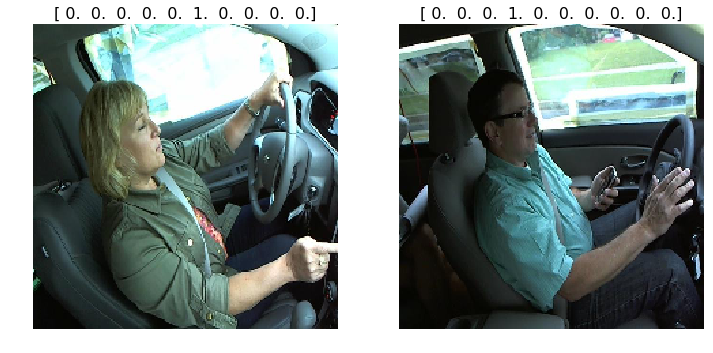

In [53]:
plots(imgs, titles=labels)

## Import class and instantiate it

In [14]:
# As large as you can, but no larger than 64 is recommended. 
# If you have an older or cheaper GPU, you'll run out of memory, so will have to decrease this.
batch_size=64

In [15]:
# Import our class, and instantiate
import vgg16; 
from vgg16 import Vgg16
vgg = Vgg16()

## Setup the batches

In [63]:
# Grab a few images at a time for training and validation.
# NB: They must be in subdirectories named based on their category
print(data_path+'/train')
batches = vgg.get_batches(data_path+'/train', batch_size = batch_size)
val_batches = vgg.get_batches(data_path+'/valid', batch_size = batch_size*2)

data//train
Found 18587 images belonging to 10 classes.
Found 3837 images belonging to 10 classes.


'Fine-tune' the model

In [ ]:
vgg.finetune(batches)

## Run a few epochs of fitting, saving the weights each time

N.B. OR load in the weights already trained (if re-running this notebook)

In [17]:
make_sure_path_exists(data_path + '/results')

In [13]:
vgg.fit(batches, val_batches, nb_epoch=1)

Epoch 1/1
18587/18587 [==============================] - 215s - loss: 1.8258 - acc: 0.4884 - val_loss: 2.0550 - val_acc: 0.4157


In [19]:
vgg.model.save_weights(data_path + '/results/ft1.h5')
vgg.model.load_weights(data_path + '/results/ft1.h5')

In [20]:
vgg.fit(batches, val_batches, nb_epoch=1)

Epoch 1/1
18587/18587 [==============================] - 215s - loss: 0.9580 - acc: 0.6939 - val_loss: 2.0223 - val_acc: 0.3849


In [21]:
vgg.model.save_weights(data_path + '/results/ft2.h5')
vgg.model.load_weights(data_path + '/results/ft2.h5')

In [22]:
vgg.fit(batches, val_batches, nb_epoch=1)

Epoch 1/1
18587/18587 [==============================] - 214s - loss: 0.8159 - acc: 0.7348 - val_loss: 2.1032 - val_acc: 0.3670


In [23]:
vgg.model.save_weights(data_path + '/results/ft3.h5')
vgg.model.load_weights(data_path + '/results/ft3.h5')

In [24]:
vgg.model.optimizer.lr = 0.01

In [25]:
vgg.fit(batches, val_batches, nb_epoch=1)

Epoch 1/1
18587/18587 [==============================] - 221s - loss: 0.7757 - acc: 0.7500 - val_loss: 2.1537 - val_acc: 0.3930


In [ ]:
vgg.model.save_weights(data_path + '/results/ft4.h5')

In [17]:
vgg.model.load_weights(data_path + '/results/ft4.h5')

## Generate predictions vs. test set

Count files at a path, using glob

In [21]:
print(test_path)
g = glob(test_path + '/unknown/*.jpg')
print(len(g)) 

data/test
79726


Count files at a path, using bash (n.b. counts '.' and '..', so high by two)

In [22]:
%ls -afq $test_path/unknown/ | wc -l

79728


### A reminder (post-bugfix)

N.B. if you just place the test files in 'data/test', you'll get the error:

'Test' will <strong> only </strong> work if you place them in 'data/test/<strong>unknown</strong>/*.jpg' (though the 'test_path' should point to 'data/test', not the 'unknown' sub-directory.)

N.B. the parameter 'class_mode=None' gets vgg.get_batches to pass the same arg to Keras' gen.flow_from_directory() when it calls it. This ensures that the predictions are in terms of <strong>probabilities against each class</strong>, not single predicted classes. See fast.ai lecture 2 for details (https://www.youtube.com/watch?v=e3aM6XTekJc&t=1370s), or read Keras documentation.

### Make predictions

The prediction process takes over 13 mins, for the full test set.

In [48]:
batch_size=8
test_batches = vgg.get_batches(test_path, shuffle=False, batch_size=batch_size, class_mode=None)
batches = test_batches
preds = vgg.model.predict_generator(test_batches, test_batches.nb_sample)

Found 79726 images belonging to 1 classes.


Let's get the filenames that get_batches collected, while we're here.

In [56]:
filenames = batches.filenames

Let's see what the first one looks like.

In [58]:
print(filenames[:1], preds[:1])

['unknown/img_14408.jpg'] [[ 0.0049  0.0593  0.0019  0.0022  0.0018  0.5976  0.1468  0.0105  0.0023  0.1727]]


Save both arrays (preds, filenames) for easy later recovery.

In [60]:
save_array(all_data_path + '/results/test_preds.dat', preds)
save_array(all_data_path + '/results/test_filenames.dat', filenames) 

## Reload predictions

So, the code below reloads raw predictions, with no clipping (e.g.).

In [32]:
preds = load_array(all_data_path + '/results/test_preds.dat')
filenames = load_array(all_data_path + '/results/test_filenames.dat') 
preds.shape

(79726, 10)

## 'Clip' the predictions, to avoid log loss problems nr p={0, 1}

In [33]:
preds = np.clip(preds, 0.02, 0.98)

## Inspect the results

Set-up the image viewer.

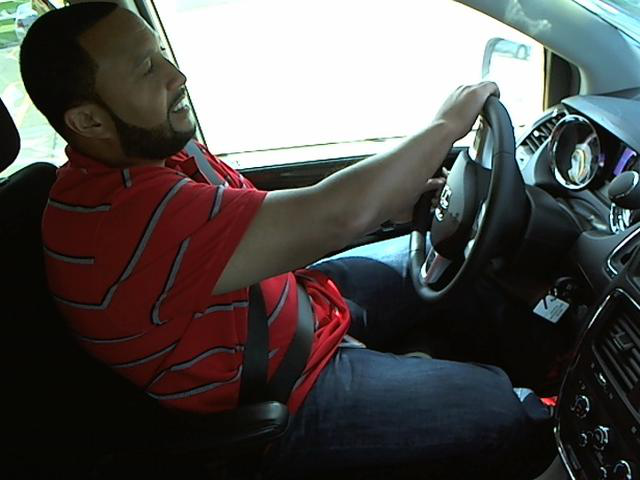

In [24]:
from PIL import Image
Image.open(test_path + '/' + filenames[0])

## Submit initial predictions to Kaggle

### Inspect the Kaggle-supplied 'sample' submission

In [26]:
%ls data

driver_imgs_list.csv      results/                   test/      valid/
driver_imgs_list.csv.zip  sample/                    train/
imgs.zip                  sample_submission.csv.zip  unzipped/


In [29]:
!unzip $all_data_path/sample_submission.csv.zip -d $all_data_path/unzipped

Archive:  data/sample_submission.csv.zip
  inflating: data/unzipped/sample_submission.csv  


In [27]:
!head -n5 $all_data_path/unzipped/sample_submission.csv

img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
img_1.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
img_10.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
img_100.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
img_1000.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1


So it's expecting file, p(c0), p(c1), ..., p(c9), with a header as above. In this competition, 'Submissions are evaluated using the multi-class logarithmic loss.' https://www.kaggle.com/wiki/MultiClassLogLoss

We could create something pretty close to this with the two arrays we now have:

In [34]:
print(filenames[:3])
print(preds[:1])

['unknown/img_14408.jpg' 'unknown/img_100147.jpg' 'unknown/img_81285.jpg']
[[ 0.02    0.0593  0.02    0.02    0.02    0.5976  0.1468  0.02    0.02    0.1727]]


...using a pandas dataframe.

In [35]:
preds_df = pd.DataFrame(preds)
files_df = pd.DataFrame([ f[8 : f.find('.jpg')+4] for f in filenames ])
submission = pd.concat([files_df, preds_df], axis=1)
submission.columns = ['img', 'c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']
submission[:2] 

,img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,img_14408.jpg,0.02,0.059333,0.02,0.02,0.02,0.59756,0.146798,0.02,0.02,0.172651
1,img_100147.jpg,0.02,0.020000,0.02,0.98,0.02,0.02000,0.020000,0.02,0.02,0.020000


In [36]:
dst = data_path + '/results/submission.csv'
submission.to_csv(dst, index=False, float_format='%.2f')

A quick check, to see that it saved correctly.

In [40]:
!head -n5 $dst

img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
img_14408.jpg,0.02,0.06,0.02,0.02,0.02,0.60,0.15,0.02,0.02,0.17
img_100147.jpg,0.02,0.02,0.02,0.98,0.02,0.02,0.02,0.02,0.02,0.02
img_81285.jpg,0.02,0.02,0.02,0.02,0.02,0.98,0.02,0.02,0.02,0.02
img_1711.jpg,0.02,0.08,0.02,0.06,0.21,0.13,0.03,0.02,0.14,0.33


In [41]:
from IPython.display import FileLink
FileLink(dst)

/home/mark/Study/dl.fast.ai/deeplearning1/_MDR/2_distracted_driver/data/results/submission.csv

## Results and discussion

## Initial scores

First score achieved: <strong>3.28</strong> = v.v.bad! Error? Seems more likely that the transfer process needs more work, given the accuracy levels achieved on the validation set.

After clipping the same predictions (to 0.02 <= pred <= 0.98), to avoid the degradation of the log loss function at the extreme ends of the probability scale, I resubmitted them.

Second score achieved: <strong> 1.57</strong>, which would have put me 680/1440. This is quite an improvement.
The task in Jeremy's assignment was to achieve top 50%, which I have (just), but I'd like to do better. Clearly, I haven't yet done:
* extensive diving into the dense layers, nor 
* data augmentation, 
* batchnorm, 
* dropout adjustments, nor 
* ensembling. 

I should probably do these, in order. 

Let's plot some examples of the members of each category in the confusion matrix.

First we need a helper function for plotting files by ID, from the validation set.

In [172]:
from PIL import Image
def plots_idx(idx, titles = None):
    plots([image.load_img(data_path + '/valid/' + filenames[i]) for i in idx], titles = titles)

Quick test.

And to extract lists of filenames and labels.

In [55]:
vgg.model.load_weights(data_path + '/results/ft4.h5')
val_batches, probs = vgg.test(data_path + '/valid', batch_size = batch_size)

Found 3837 images belonging to 10 classes.


In [117]:
labels = val_batches.classes
filenames = val_batches.filenames
print(labels.shape, labels[454:458], type(labels[0]))    # inspect
print(len(filenames), filenames[454:458], type(filenames[0]))   # inspect

(3837,) [0 0 1 1] <class 'numpy.int32'>
3837 ['c0/img_75810.jpg', 'c0/img_25783.jpg', 'c1/img_59482.jpg', 'c1/img_86904.jpg'] <class 'str'>


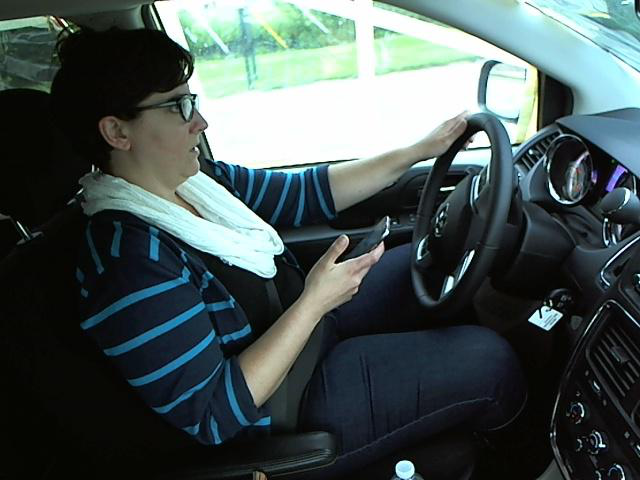

In [173]:
Image.open(data_path + '/valid/' + filenames[456])

If we round the predictions up and down, we 'force' them into a state where we can ask easily whether they were 'correct' or not. For simplicity, we'll call the rounded 'probabilities' 'preds'.

In [109]:
preds = np.round(probs)
print(probs.shape, probs[454:458])
print(preds[0].shape)
print(preds.shape, preds[454:458])

(3837, 10) [[  8.2280e-02   5.4839e-02   8.9139e-07   2.3561e-01   7.4448e-03   9.9570e-02   2.5208e-02
    6.7670e-02   2.5191e-03   4.2486e-01]
 [  1.7504e-01   8.1855e-03   1.1544e-02   2.2844e-02   7.2008e-01   4.0634e-03   4.8886e-02
    8.4922e-04   2.9277e-03   5.5815e-03]
 [  1.4348e-02   5.3970e-01   5.9105e-02   2.9316e-02   1.4302e-01   1.9040e-03   1.1236e-01
    9.7742e-03   8.7622e-02   2.8489e-03]
 [  1.4837e-02   1.0422e-01   1.8731e-02   1.6438e-02   7.1515e-01   5.5118e-04   7.7591e-02
    7.2924e-03   4.4602e-02   5.8247e-04]]
(10,)
(3837, 10) [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]]


This <strong>isn't</strong> quite the right answer, in this case. As we're checking whether the predictied <strong>class</strong> is correct, we need to create an array that records, for each row, which column has the highest value.

In [111]:
preds = np.argmax(probs, axis=1)
print(probs[454:458])   
print(preds[454:458])
print(labels[454:458])

[[  8.2280e-02   5.4839e-02   8.9139e-07   2.3561e-01   7.4448e-03   9.9570e-02   2.5208e-02
    6.7670e-02   2.5191e-03   4.2486e-01]
 [  1.7504e-01   8.1855e-03   1.1544e-02   2.2844e-02   7.2008e-01   4.0634e-03   4.8886e-02
    8.4922e-04   2.9277e-03   5.5815e-03]
 [  1.4348e-02   5.3970e-01   5.9105e-02   2.9316e-02   1.4302e-01   1.9040e-03   1.1236e-01
    9.7742e-03   8.7622e-02   2.8489e-03]
 [  1.4837e-02   1.0422e-01   1.8731e-02   1.6438e-02   7.1515e-01   5.5118e-04   7.7591e-02
    7.2924e-03   4.4602e-02   5.8247e-04]]
[9 4 1 4]
[0 0 1 1]


## Inspecting specific examples

Howard recommends that one looks at five types of examples:
1. correct labels, at random
2. incorrect labels, at random
3. the labels, in each class, with highest probability and correct
4. the labels, in each class, with highest probability but incorrect
5. the 'most-uncertain' labels (p=0.5)

Overall Precision: 0.39014855355746675
Predicted: [3 3]
Labelled : [3 3]


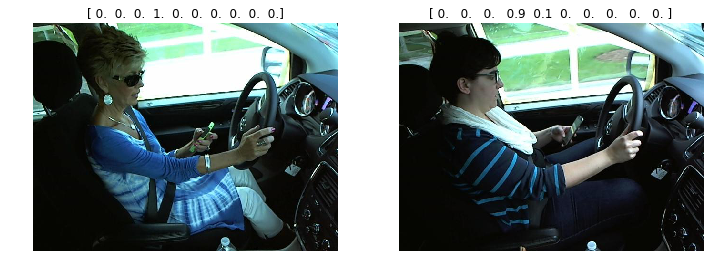

In [227]:
#1. A few correct labels, at random 
n_view = 2
correct = np.where(preds == labels)[0]
print('Overall Precision:', len(correct) / len(preds))
idx = permutation(correct)[:n_view]
print('Predicted:', preds[idx])
print('Labelled :', labels[idx])
plots_idx(idx, np.round(probs[idx], 1))

Overall precision: 0.3901485535574668
Predicted: [7 6]
Labelled : [9 0]


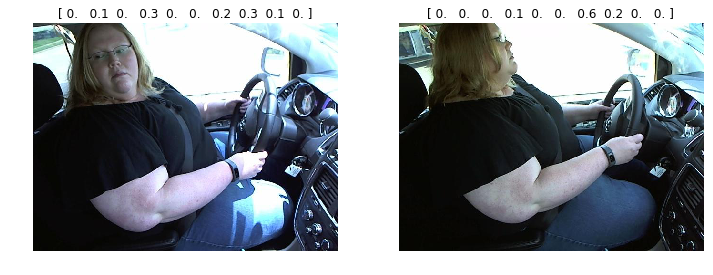

In [209]:
#2. a few incorrect labels, at random
incorrect = np.where(preds != labels)[0]
print('Overall precision:', 1-(len(incorrect) / len(labels)))
idx = permutation(incorrect)[:n_view]
print('Predicted:', preds[idx])
print('Labelled :', labels[idx])
plots_idx(idx, np.round(probs[idx], 1))


### Confident and correct

Precision (Class # 1 ): 0.04106280193236715
[16  7]


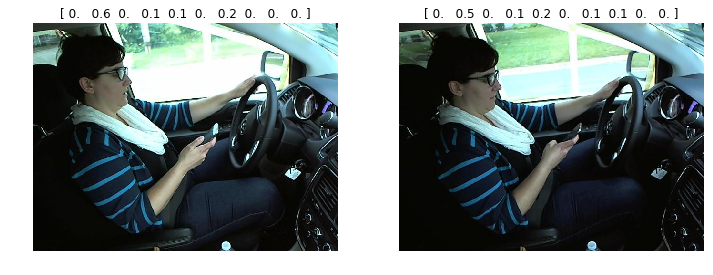

In [225]:
# Most-confident correct examples from c1
c = 1
correct_cx = np.where((preds == c) & (preds == labels))[0]
labelled_cx = np.where(labels == c)[0]
print('Precision (Class #', c, '):', len(correct_cx) / len(labelled_cx))
most_correct_cx = np.argsort(np.argmax(probs[correct_cx], axis=1))[::-1][:n_view]   # N.B. 10, not 1, probs
print(most_correct_cx)
plots_idx(correct_cx[most_correct_cx], np.round(probs[correct_cx][most_correct_cx], 1))

Overall precision: 0.5295566502463054
[214  79]


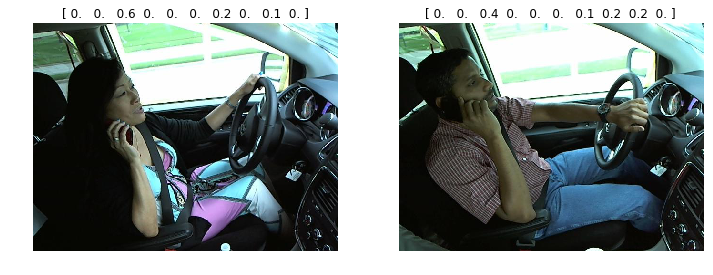

In [224]:
# Most-confident correct examples from c2
c = 2
correct_cx = np.where((preds == c) & (preds == labels))[0]
labelled_cx = np.where(labels == c)[0]
print('Precision (Class #', c, '):', len(correct_cx) / len(labelled_cx))
most_correct_cx = np.argsort(np.argmax(probs[correct_cx], axis=1))[::-1][:n_view]   # N.B. 10, not 1, probs
print(most_correct_cx)
plots_idx(correct_cx[most_correct_cx], np.round(probs[correct_cx][most_correct_cx], 1))

### Confident but wrong

Precision(Class # 0 ): 0.9035087719298246
[43 42]


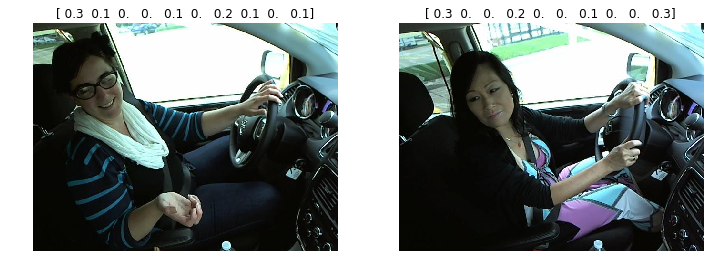

In [223]:
#The images where we were most confident that they were c0, but they were NOT
c = 0
incorrect_cx = np.where((preds == c) & (preds != labels))[0]
labelled_c = np.where(labels == c)[0]
print('Precision (Class #', c, '):', 1 - (len(incorrect_cx) / len(labelled_c)))
most_incorrect_cx = np.argsort(np.argmax(probs[incorrect_cx], axis=1))[::-1][:n_view]   # N.B. 10, not 1, probs
print(most_incorrect_cx)
plots_idx(incorrect_cx[most_incorrect_cx], np.round(probs[incorrect_cx][most_incorrect_cx], 1))

Precision(Class # 1 ): 0.927536231884058
[29 28]


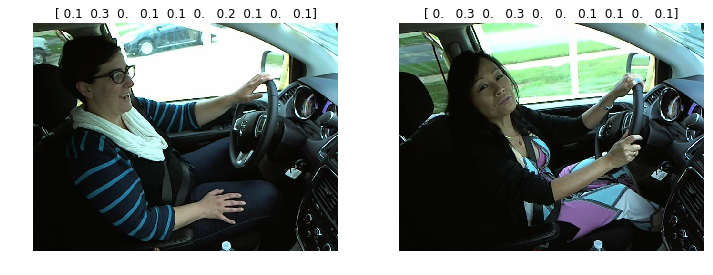

In [221]:
#The images where we were most confident that they were c1, but they were NOT
c = 1
incorrect_cx = np.where((preds == c) & (preds != labels))[0]
labelled_c = np.where(labels == c)[0]
print('Precision (Class #', c, '):', 1 - (len(incorrect_cx) / len(labelled_c)))
most_incorrect_cx = np.argsort(np.argmax(probs[incorrect_cx], axis=1))[::-1][:n_view]   # N.B. 10, not 1, probs
print(most_incorrect_cx)
plots_idx(incorrect_cx[most_incorrect_cx], np.round(probs[incorrect_cx][most_incorrect_cx], 1))

Precision(Class # 2 ): 0.4408866995073891
[226  56]


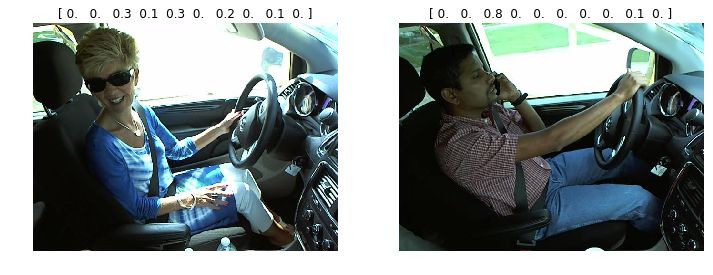

In [216]:
#The images where we were most confident that they were cx, but they were NOT
c = 2
incorrect_cx = np.where((preds == c) & (preds != labels))[0]
labelled_c = np.where(labels == c)[0]
print('Precision (Class #', c, '):', 1 - (len(incorrect_cx) / len(labelled_c)))
most_incorrect_cx = np.argsort(np.argmax(probs[incorrect_cx], axis=1))[::-1][:n_view]   # N.B. 10, not 1, probs
print(most_incorrect_cx)
plots_idx(incorrect_cx[most_incorrect_cx], np.round(probs[incorrect_cx][most_incorrect_cx], 1))

Precision(Class # 3 ): 0.42705570291777184
[215  67]


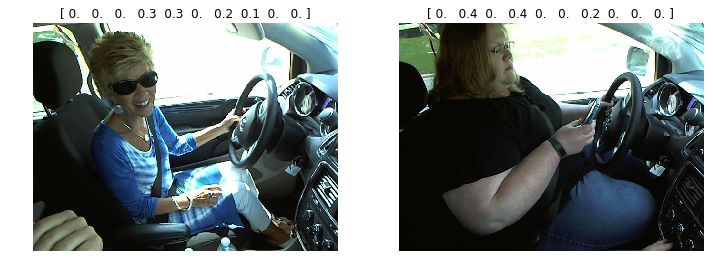

In [217]:
#The images where we were most confident that they were cx, but they were NOT
c = 3
incorrect_cx = np.where((preds == c) & (preds != labels))[0]
labelled_c = np.where(labels == c)[0]
print('Precision (Class #', c, '):', 1 - (len(incorrect_cx) / len(labelled_c)))
most_incorrect_cx = np.argsort(np.argmax(probs[incorrect_cx], axis=1))[::-1][:n_view]   # N.B. 10, not 1, probs
print(most_incorrect_cx)
plots_idx(incorrect_cx[most_incorrect_cx], np.round(probs[incorrect_cx][most_incorrect_cx], 1))

...  we could look at more.

### Least certain (lowest max prob)

[ 125 3565]


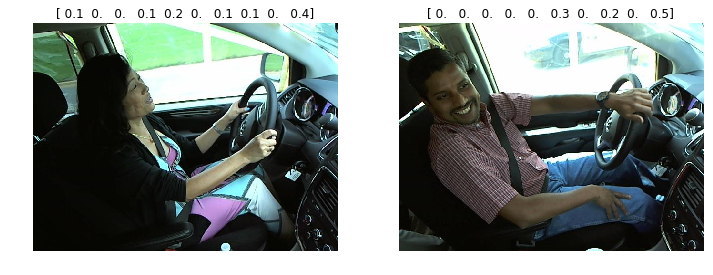

In [244]:
#The cells with the lowest maximum probability across a row
n_view = 2
most_uncertain = np.argsort(np.argmax(probs, axis = 1))[::-1]
print(most_uncertain[:n_view])
plots_idx(most_uncertain[:n_view], np.round(probs[most_uncertain], 1))

## Conclusion on Expt.1

Given that the training error is so much higher than the validation error, we can safely assume that our model is underfitting the data. Likely it needs more layers opening up to training, and possibly many more of the standard changes recommended by Howerd.

## Reviewing the structure of VGG

The structure of the model may provide some ideas on how to achieve a better result.

In [245]:
vgg.model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_1 (Lambda)                (None, 3, 224, 224)   0           lambda_input_1[0][0]             
____________________________________________________________________________________________________
zeropadding2d_1 (ZeroPadding2D)  (None, 3, 226, 226)   0           lambda_1[0][0]                   
____________________________________________________________________________________________________
convolution2d_1 (Convolution2D)  (None, 64, 224, 224)  1792        zeropadding2d_1[0][0]            
____________________________________________________________________________________________________
zeropadding2d_2 (ZeroPadding2D)  (None, 64, 226, 226)  0           convolution2d_1[0][0]            
___________________________________________________________________________________________

From memory, it seems that JH removed the layers from flatten_1 onwards.

# Expt series #2 - Making deeper changes to the model

## Common setup for all these experiments

### Import major packages

In [7]:
%matplotlib inline
import numpy as np
import os
from numpy.random import random, permutation
from scipy import misc, ndimage
from scipy.ndimage.interpolation import zoom
import keras
from keras import backend as k
from keras.utils.data_utils import get_file
from keras.models import Sequential, Model
from keras.layers import Input
from keras.layers.core import Flatten, Dense, Dropout, Lambda
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.optimizers import SGD, RMSprop
from keras.preprocessing import image

In [10]:
import utils
from utils import *
#from imp import reload  # fixes a P2-P3 incompatibility
#reload(utils)

### Setup path variables (re-run, every session)

This is a better way to setup the path variables (and the only one that suits the batch_setup code below). Eventually I'll refactor the other code to match.

In [11]:
all_data_path = "data/"
sampled_path = all_data_path + "sample"
test_path = all_data_path + "test"

# The following allows for easy switching...
data_path = all_data_path   
#data_path = sampled_path      

%ls $all_data_path

driver_imgs_list.csv      results/                   test/      valid/
driver_imgs_list.csv.zip  sample/                    train/
imgs.zip                  sample_submission.csv.zip  unzipped/


## Expt 2.1 - First 'deeper' VGG expt (abandoned - test?)

Strategy: follow JH's processes from here on, tweaking these where alternatives to his experiments become apparent:
1. Create a VGG-based model without its final, non-conv layers; use it to compute 'features' for a second, new net to learn. 
2. ...
3. reduce the dropout rate (but not to 0), and adjust the weights to suit;

In [10]:
import vgg16
from vgg16 import Vgg16    # not needed, given above?
vgg = Vgg16()
model = vgg.model
last_conv_idx = [i for i,l in enumerate(model.layers) if type(l) is Convolution2D][-1]
conv_layers = model.layers[:last_conv_idx + 1]

N.B. I was briefly confused ... why '...idx + 1'. Then remembered - the last term in a slicing instruction is <strong>not</strong> included in the returned object.

In [11]:
conv_model = Sequential(conv_layers)

In [12]:
conv_model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_1 (Lambda)                (None, 3, 224, 224)   0           lambda_input_1[0][0]             
____________________________________________________________________________________________________
zeropadding2d_1 (ZeroPadding2D)  (None, 3, 226, 226)   0           lambda_1[0][0]                   
                                                                   lambda_1[0][0]                   
____________________________________________________________________________________________________
convolution2d_1 (Convolution2D)  (None, 64, 224, 224)  1792        zeropadding2d_1[0][0]            
                                                                   zeropadding2d_1[1][0]            
___________________________________________________________________________________________

Total params: 14,714,688
Trainable params: 14,714,688
Non-trainable params: 0
____________________________________________________________________________________________________


### Setup the batches

In [13]:
batch_size = 64
aug_gen = image.ImageDataGenerator(channel_shift_range=20, height_shift_range=0.05, 
                                 rotation_range=15, shear_range=0.1, width_shift_range=0.1) 
batches = get_batches(data_path + 'train', aug_gen, batch_size = batch_size)

## The commented code below looks wrong - we shouldn't be using augmented data for validation, should we?
#val_batches = get_batches(data_path + 'valid', aug_trn_set, batch_size = batch_size * 2, shuffle = False)
val_batches = get_batches(data_path + 'valid', batch_size = batch_size * 2, shuffle = False)

(val_classes, trn_classes, val_labels, trn_labels, val_filenames, filenames, test_filenames) = get_classes(data_path)

Found 18587 images belonging to 10 classes.
Found 3837 images belonging to 10 classes.
Found 18587 images belonging to 10 classes.
Found 3837 images belonging to 10 classes.
Found 79726 images belonging to 1 classes.


In [22]:
conv_feat = conv_model.predict_generator(batches, batches.nb_sample)

In [21]:
conv_val_feat  = conv_model.predict_generator(val_batches, val_batches.nb_sample)
## conv_test_feat = conv_model.predict_generator(batches, test_batches.nb_sample)
# can't imagine how that last one would work - test_batches hasn't been defined anywhere!

See - doesn't exist. And I'm not sure how to define it (yet).

In [20]:
len(test_batches)

NameError: name 'test_batches' is not defined

But I can save the first two sets, tonight, to save some effort.

In [23]:
save_array(data_path + 'results/conv_feat.dat', conv_feat)
save_array(data_path + 'results/conv_val_feat.dat', conv_val_feat)

=== TERMINATED ===
: I got this far, but I don't see how he calculates the test_batches. So I'm going to park this, for now, and try to build a single network that does the job.

### STOP !!!

## Expt 2.2 - Build a whole (BN) network based on VGG's conv layers

### Planning

The order of tasks for this experiment is...
* import the model and instantiate the object representing it
* pop off the last few dense layers, and replace with a new set (BN, DO)
* setup the batches
* update self.classes with the new training data (e.g. copying vgg.finetune() ) - <strong>don't forget this step!</strong>
* compile the model
* fit the model

### Import VGG, setup basic model

In [13]:
## previously...
# import vgg16
# from vgg16 import Vgg16
# vgg = Vgg16()
import vgg16
from vgg16 import Vgg16    # not needed, given above?
vgg = Vgg16()
model2 = vgg.model

In [14]:
model2.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_2 (Lambda)                (None, 3, 224, 224)   0           lambda_input_2[0][0]             
____________________________________________________________________________________________________
zeropadding2d_14 (ZeroPadding2D) (None, 3, 226, 226)   0           lambda_2[0][0]                   
____________________________________________________________________________________________________
convolution2d_14 (Convolution2D) (None, 64, 224, 224)  1792        zeropadding2d_14[0][0]           
____________________________________________________________________________________________________
zeropadding2d_15 (ZeroPadding2D) (None, 64, 226, 226)  0           convolution2d_14[0][0]           
___________________________________________________________________________________________

### Define the (non-augmented) batches

In [14]:
batch_size = 64
gen = image.ImageDataGenerator()    ## no data augmentation
batches = gen.flow_from_directory(data_path+'/train', target_size=(224,224),
                class_mode='categorical', shuffle=True, batch_size=batch_size)
val_batches = gen.flow_from_directory(data_path+'/valid', target_size=(224,224),
                class_mode='categorical', shuffle=True, batch_size=batch_size)
## vgg(JH) version:
# batches = vgg.get_batches(data_path+'/train', batch_size = batch_size)
# val_batches = vgg.get_batches(data_path+'/valid', batch_size = batch_size*2)

Found 20441 images belonging to 10 classes.
Found 3837 images belonging to 10 classes.


### Construct the model

Partly to check I understand, and partly to see if I get the same repeating of layers that I saw in the previous experiment in this series, I'm going to build the next conv-net straight from VGG, and pop() the unwanted layers off - instead of the copying procedure shown above.

Here we remove the post-conv layers.

In [15]:
last_conv_idx = [i for i,l in enumerate(model2.layers) if type(l) is Convolution2D][-1]
layer_count = [i for i,l in enumerate(model2.layers)][-1]
conv_layers = model2.layers[:last_conv_idx +1]
print(len(conv_layers), 'conv layers')
print(layer_count, 'layers in model.')

31 conv layers
37 layers in model.


In [16]:
for i in range(layer_count, last_conv_idx, -1):
    print('removing layer', i)
    model2.pop()
print(len(model2.layers), 'layers in model.')

removing layer 37
removing layer 36
removing layer 35
removing layer 34
removing layer 33
removing layer 32
removing layer 31
31 layers in model.


Fix these layers' weights.

In [17]:
for layer in model2.layers: layer.trainable = False

And here we append JH's first, batchnorm- and (parameterised-)dropout-based model (which he has as a separate model).

In [18]:
def get_bn_layers(p):
    return [
        MaxPooling2D(input_shape=conv_layers[-1].output_shape[1:]),
        Flatten(),
        Dropout(p/2),
        Dense(128, activation='relu'),
        BatchNormalization(),
        Dropout(p/2),
        Dense(128, activation='relu'),
        BatchNormalization(),
        Dropout(p),
        Dense(10, activation='softmax')
    ]

In [19]:
p = 0.8   ## dropout probability
#model = Sequential(get_bn_layers(p))
for l in get_bn_layers(p):
    model2.add(l)

In [20]:
print(len(model2.layers), 'layers in model.')

41 layers in model.


There should now be 41 layers in the model.

In [80]:
model2.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_13 (Lambda)               (None, 3, 224, 224)   0           lambda_input_13[0][0]            
____________________________________________________________________________________________________
zeropadding2d_157 (ZeroPadding2D (None, 3, 226, 226)   0           lambda_13[0][0]                  
____________________________________________________________________________________________________
convolution2d_157 (Convolution2D (None, 64, 224, 224)  1792        zeropadding2d_157[0][0]          
____________________________________________________________________________________________________
zeropadding2d_158 (ZeroPadding2D (None, 64, 226, 226)  0           convolution2d_157[0][0]          
___________________________________________________________________________________________

Total params: 17,944,906
Trainable params: 17,944,394
Non-trainable params: 512
____________________________________________________________________________________________________


In [21]:
model2.compile(Adam(lr=0.001), loss= 'categorical_crossentropy', metrics=['accuracy'])

### Update model.classes with new training data

In JH's first, simplified finetuning process, this job was done by the 'finetune' method (after the model changes). This code is based on his method.

In [22]:
classes = list(iter(batches.class_indices))
## batches.class_indices is a dict, 
## with the class name as key and an index as value
## e.g. {'cats': 0, 'dogs': 1}
for c in batches.class_indices:
    classes[batches.class_indices[c]] = c
model2.classes = classes

### Fit the model

It's possible to skip most of these cells on subsequent runs, as the weights will have been saved.

In [45]:
## N.B. I had an error here, with model2.fit() - it expected a numpy array, not an iterator
## This was fixed by using the fit_generator method direct, rather than through JH's code
## I also had an out-of-memory error with fit_generator, with batch_size=64, =32 is fine
## then realised that I'd left all the layers trainable! Fixed. Back to 64, no probs.
model2.optimizer.lr = 0.001 # still at this level
gpu_fans_up(90)
model2.model.fit_generator(batches, samples_per_epoch=batches.nb_sample,  
                           validation_data=val_batches, 
                           nb_val_samples=val_batches.nb_sample, nb_epoch=1)
gpu_fans_up(0)

Epoch 1/1
20441/20441 [==============================] - 231s - loss: 2.0813 - acc: 0.4467 - val_loss: 0.8850 - val_acc: 0.7224


In [25]:
model2.model.save_weights(data_path + 'results/Ex2_1_wts1.h5')

In [26]:
model2.optimizer.lr = 0.001 # still at this level
gpu_fans_up(90)
model2.model.fit_generator(batches, samples_per_epoch=batches.nb_sample,  
                           validation_data=val_batches, 
                           nb_val_samples=val_batches.nb_sample, nb_epoch=1)
gpu_fans_up(0)

Epoch 1/1
18587/18587 [==============================] - 214s - loss: 0.2941 - acc: 0.9082 - val_loss: 1.5939 - val_acc: 0.5267


In [28]:
model2.optimizer.lr = 0.0001
gpu_fans_up(90)
model2.model.fit_generator(batches, samples_per_epoch=batches.nb_sample,  
                           validation_data=val_batches, 
                           nb_val_samples=val_batches.nb_sample, nb_epoch=1)
gpu_fans_up(0)

Epoch 1/1
18587/18587 [==============================] - 214s - loss: 0.0936 - acc: 0.9752 - val_loss: 2.0005 - val_acc: 0.4853


In [84]:
model2.model.save_weights(data_path + 'results/Ex2_1_wts2.h5')

In [20]:
model2.model.load_weights(data_path + 'results/Ex2_1_wts2.h5')

There's some serious overfitting going on. It's noticeable, after several runs with different LR's, that - as acc increases, val_acc decreases!

In [21]:
model2.optimizer.lr = 0.0001 # still at this level
model2.model.fit_generator(batches, samples_per_epoch=batches.nb_sample,  
                           validation_data=val_batches, 
                           nb_val_samples=val_batches.nb_sample, nb_epoch=1)

Epoch 1/1
18587/18587 [==============================] - 217s - loss: 0.1369 - acc: 0.9586 - val_loss: 1.4317 - val_acc: 0.6187


In [24]:
model2.model.save_weights(data_path + 'results/Ex2_1_wts3.h6')

In [18]:
model2.model.load_weights(data_path + 'results/Ex2_1_wts3.h6')

In [25]:
model2.optimizer.lr = 0.0001 # still at this level
model2.model.fit_generator(batches, samples_per_epoch=batches.nb_sample,  
                           validation_data=val_batches, 
                           nb_val_samples=val_batches.nb_sample, nb_epoch=1)

Epoch 1/1
18587/18587 [==============================] - 214s - loss: 0.0670 - acc: 0.9811 - val_loss: 1.6560 - val_acc: 0.6112


In [26]:
model2.model.save_weights(data_path + 'results/Ex2_1_wts3.h5')

In [29]:
model2.model.load_weights(data_path + 'results/Ex2_1_wts3.h5')

### Make predictions on Kaggle test data

This next step takes about <strong>13 mins</strong>(?)

In [30]:
## should output something like 'Found 79726 images belonging to 1 classes.'
gpu_fans_up(90)
batch_size=8    # at 64, takes 12m 40s; at 8, takes 13m 26s
test_batches = vgg.get_batches(test_path, shuffle=False, batch_size=batch_size, class_mode=None)
batches = test_batches         ## leave this in, or the setting of filenames (below) might be wrong?
preds = model2.model.predict_generator(test_batches, test_batches.nb_sample)
gpu_fans_up(0)

Found 79726 images belonging to 1 classes.


### Save the raw results, process them, and convert to Kaggle-ready file

Save the results (and reload if needed)

In [31]:
filenames = batches.filenames
## save for easy recovery, if needed
save_array(all_data_path + 'results/test_preds.dat', preds)
save_array(all_data_path + 'results/test_filenames.dat', filenames) 
# preds = load_array(all_data_path + '/results/test_preds.dat')
# filenames = load_array(all_data_path + '/results/test_filenames.dat') 
# preds.shape

Clip the predictions

In [32]:
## clip the predictions, to avoid the log loss problem nr p={0,1}
preds = np.clip(preds, 0.02, 0.98)

Convert to submissable format, using a pandas dataframe.

In [33]:
preds_df = pd.DataFrame(preds)
files_df = pd.DataFrame([ f[8 : f.find('.jpg')+4] for f in filenames ])
submission = pd.concat([files_df, preds_df], axis=1)
submission.columns = ['img', 'c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']
submission[:2] 

,img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,img_14408.jpg,0.833132,0.02,0.02,0.020000,0.02,0.02,0.02,0.02,0.020455,0.139351
1,img_100147.jpg,0.020000,0.02,0.02,0.977978,0.02,0.02,0.02,0.02,0.020000,0.020000


Save for submission

In [34]:
dst = data_path + 'results/Ex2_2_submission.csv'  ## check the filename!
submission.to_csv(dst, index=False, float_format='%.2f')

In [35]:
from IPython.display import FileLink
FileLink(dst)

/home/mark/Study/dl.fast.ai/deeplearning1/_MDR/2_distracted_driver/data/results/Ex2_1_submission.csv

### Results, and Discussion

By the last epoch, the accuracy (trn batches) had reached 0.9754, and val_acc = 0.6289. But it's almost certainly overfitting at this point, as the trn_acc is so much higher than the val_acc. And val_acc has dropped.

Kaggle result: 0.97410 (529/1440)

### Conclusions and recommendations

Therefore, I should:
* investigate the lesson's other suggestions for mitigating overfitting;
* try a half-way point between 32 and 64, for batch_size;

## Expt. 2.3 - Add Data Augmentation 

### Prep the batches

In [23]:
batch_size=64
gen_t = image.ImageDataGenerator(rotation_range=15, height_shift_range=0.05, 
                                 shear_range=0.01, channel_shift_range=20, 
                                 width_shift_range=0.1)
batches = get_batches(data_path+'train', gen_t, batch_size=batch_size, shuffle=True)
val_batches = get_batches(data_path+'valid', shuffle=False, batch_size=batch_size) #edited

Found 20441 images belonging to 10 classes.
Found 3837 images belonging to 10 classes.


We're going to reuse the same model as in Expt 2.1, above.

### Compile and fit the model

In [38]:
model2.compile(optimizer=(Adam(lr=0.001)), loss='categorical_crossentropy', metrics=['accuracy'])

In [39]:
# model2.optimizer.lr = 0.001 # already set, above
gpu_fans_up(90)
model2.fit_generator(batches, samples_per_epoch=batches.nb_sample, nb_epoch=1, 
                        validation_data=val_batches, nb_val_samples=val_batches.nb_sample)
gpu_fans_up(0)
model2.save_weights(data_path + 'results/Ex2_2_wts1.h5')

Epoch 1/1
18587/18587 [==============================] - 213s - loss: 0.4336 - acc: 0.8782 - val_loss: 1.3521 - val_acc: 0.6680


This isn't too shabby. 

(N.B. I noticed it was initially updating the values 10x per second. Then I realised I'd left the batch_size=8!)

<strong>Q: Do I need to do more to ensure that the weights are cleared when starting this model after running a similar one, or does 'compile' on its own ensure this happens?

In [41]:
gpu_fans_up(90)
model2.fit_generator(batches, samples_per_epoch=batches.nb_sample, nb_epoch=1, 
                        validation_data=val_batches, nb_val_samples=val_batches.nb_sample)
gpu_fans_up(0)
model2.save_weights(data_path + 'results/Ex2_2_wts2.h5')

Epoch 1/1
18587/18587 [==============================] - 214s - loss: 0.2637 - acc: 0.9197 - val_loss: 1.1659 - val_acc: 0.6951


In [43]:
model2.optimizer.lr = 0.0001
gpu_fans_up(90)
model2.fit_generator(batches, samples_per_epoch=batches.nb_sample, nb_epoch=1, 
                        validation_data=val_batches, nb_val_samples=val_batches.nb_sample)
gpu_fans_up(0)
model2.model.save_weights(data_path + 'results/Ex2_2_wts3.h5')

Epoch 1/1
18587/18587 [==============================] - 214s - loss: 0.2114 - acc: 0.9372 - val_loss: 1.1997 - val_acc: 0.6852


I think it's overfitting at the expense of val_acc, at this point. A good time to stop.

### Make predictions

First we setup the test batches.

In [44]:
test_batch_size=8
test_batches = vgg.get_batches(test_path, shuffle=False, batch_size=test_batch_size, class_mode=None)
batches = test_batches         # leave this in, or the setting of filenames (below) might be wrong?
## should output something like 'Found 79726 images belonging to 1 classes.'

Found 79726 images belonging to 1 classes.


This next step takes about <strong>13 mins</strong>(?). I've tried increasing the batch_size, but it only saves about a minute.

In [45]:
gpu_fans_up(90)
preds = model2.model.predict_generator(test_batches, test_batches.nb_sample)
gpu_fans_up(0)

Save the results (and reload if needed)

### Save the raw results, process them, and convert to Kaggle-ready file

In [46]:
filenames = batches.filenames
## save for easy recovery, if needed
save_array(all_data_path + 'results/test_preds.dat', preds)
save_array(all_data_path + 'results/test_filenames.dat', filenames) 

Clip the predictions

In [47]:
## clip the predictions, to avoid the log loss problem nr p={0,1}
preds = np.clip(preds, 0.02, 0.98)

Convert to submissable format, using a pandas dataframe.

In [48]:
preds_df = pd.DataFrame(preds)
files_df = pd.DataFrame([ f[8 : f.find('.jpg')+4] for f in filenames ])
submission = pd.concat([files_df, preds_df], axis=1)
submission.columns = ['img', 'c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']
submission[:2] 

,img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,img_14408.jpg,0.032333,0.02,0.02,0.02,0.02,0.02,0.060832,0.238384,0.548089,0.11342
1,img_100147.jpg,0.020000,0.02,0.02,0.98,0.02,0.02,0.020000,0.020000,0.020000,0.02000


Save for submission

In [51]:
dst = data_path + 'results/Ex2_3_submission.csv'  ## check the filename!
submission.to_csv(dst, index=False, float_format='%.2f')

In [52]:
from IPython.display import FileLink
FileLink(dst)

/home/mark/Study/dl.fast.ai/deeplearning1/_MDR/2_distracted_driver/data/results/Ex2_3_submission.csv

Originally something went wrong during the first submission, according to Kaggle. It seemed to be something to do with me setting the 'batches' wrong. I'd originally commented it out of the test_batch setup process - couldn't see what it was for. Then realised it's used to set filenames for the predictions, during the prediction-processing stage ('filenames = batches.filenames').

But surely it would be cleaner just to write 'filenames = <strong>test_batches</strong>.filenames' in the processing stage, and omit the earlier copying (even by reference) of the test_batches into batches?

### Results, and discussion

Hmm. Still not great. I realise I should move one of the drives from the validation set back into the training set. Let's play with some other tricks first.

## Expt 2.4 - Reduce validation set, from 5/26 to 3/26 drivers

### Planning

Done:
* move drivers from val->trn until there's only 3 in val (actually done in code above - which is cheating, slightly!)

### Prep the batches

In [12]:
batch_size=64
gen_t = image.ImageDataGenerator(rotation_range=15, height_shift_range=0.05, 
                                 shear_range=0.01, channel_shift_range=20, 
                                 width_shift_range=0.1)
batches = get_batches(data_path+'train', gen_t, batch_size=batch_size, shuffle=True)
val_batches = get_batches(data_path+'valid', shuffle=False, batch_size=batch_size) #edited

Found 20441 images belonging to 10 classes.
Found 3837 images belonging to 10 classes.


We're going to reuse the same model as in Expt 2.1, above.
<strong>N.B. go and re-run the apt cell above!</strong>

### Compile and fit the model

In [24]:
model2.compile(optimizer=(Adam(lr=0.001)), loss='categorical_crossentropy', metrics=['accuracy'])

In [83]:
# model2.optimizer.lr = 0.001 # already set, above
gpu_fans_up(90)
model2.fit_generator(batches, samples_per_epoch=batches.nb_sample, nb_epoch=1, 
                        validation_data=val_batches, nb_val_samples=val_batches.nb_sample)
gpu_fans_up(0)
model2.save_weights(data_path + 'results/Ex2_4_wts1.h5')

Epoch 1/1
20441/20441 [==============================] - 231s - loss: 0.3560 - acc: 0.8916 - val_loss: 0.6278 - val_acc: 0.8241


Interesting result! <strong>Increasing the size of the validation set</strong> (at the expense of the validation set) made all the difference - in <strong>one epoch</strong> I've achieved a better score than in any previous experiment?!

In [84]:
gpu_fans_up(90)
model2.fit_generator(batches, samples_per_epoch=batches.nb_sample, nb_epoch=1, 
                        validation_data=val_batches, nb_val_samples=val_batches.nb_sample)
gpu_fans_up(0)
model2.save_weights(data_path + 'results/Ex2_4_wts2.h5')

Epoch 1/1
20441/20441 [==============================] - 232s - loss: 0.2642 - acc: 0.9176 - val_loss: 0.8166 - val_acc: 0.7941


EXAMPLE
20441/20441 [==============================] - 233s - loss: 0.6246 - acc: 0.7955 - val_loss: 0.5229 - val_acc: 0.8389

These results are quite a relief, after the previous experiments!
Now I'm wondering whether the dropout is too high.

In [75]:
model2.model.load_weights(data_path + 'results/Ex2_4_wts2.h5')

In [85]:
model2.optimizer.lr = 0.0001
gpu_fans_up(90)
model2.fit_generator(batches, samples_per_epoch=batches.nb_sample, nb_epoch=1, 
                        validation_data=val_batches, nb_val_samples=val_batches.nb_sample)
gpu_fans_up(0)
model2.model.save_weights(data_path + 'results/Ex2_4_wts3.h5')

Epoch 1/1
20441/20441 [==============================] - 232s - loss: 0.2127 - acc: 0.9353 - val_loss: 0.6894 - val_acc: 0.8199


This may be overfitting?

In [25]:
model2.model.load_weights(data_path + 'results/Ex2_4_wts3.h5')

In [86]:
model2.optimizer.lr = 0.0001
gpu_fans_up(90)
model2.fit_generator(batches, samples_per_epoch=batches.nb_sample, nb_epoch=4, 
                        validation_data=val_batches, nb_val_samples=val_batches.nb_sample)
gpu_fans_up(0)
model2.model.save_weights(data_path + 'results/Ex2_4_wts4.h5')

Epoch 1/4
20441/20441 [==============================] - 232s - loss: 0.1849 - acc: 0.9440 - val_loss: 0.6638 - val_acc: 0.8204
Epoch 2/4
20441/20441 [==============================] - 232s - loss: 0.1604 - acc: 0.9518 - val_loss: 1.0249 - val_acc: 0.7759
Epoch 3/4
20441/20441 [==============================] - 232s - loss: 0.1593 - acc: 0.9523 - val_loss: 0.7579 - val_acc: 0.8097
Epoch 4/4
20441/20441 [==============================] - 232s - loss: 0.1530 - acc: 0.9552 - val_loss: 0.7427 - val_acc: 0.8241


These results seem to be comparable with JH's (in 'Enter State Farm')

In [75]:
model2.model.load_weights(data_path + 'results/Ex2_4_wts4.h5')

### Make predictions

First we setup the test batches.

In [87]:
test_batch_size=8
test_batches = vgg.get_batches(test_path, shuffle=False, batch_size=test_batch_size, class_mode=None)
##batches = test_batches         # leave this in, or the setting of filenames (below) might be wrong?
## should output something like 'Found 79726 images belonging to 1 classes.'

Found 79726 images belonging to 1 classes.


This next step takes about <strong>13 mins</strong>(?). I've tried increasing the batch_size, but it only saves about a minute.

In [88]:
gpu_fans_up(90)
preds = model2.model.predict_generator(test_batches, test_batches.nb_sample)
gpu_fans_up(0)

### Save the raw results

Save the results (and reload if needed)

In [89]:
filenames = test_batches.filenames  ## edited - should fix confusion over reuse of the batches variable
## save for easy recovery, if needed
save_array(all_data_path + 'results/Ex2_4_test_preds.dat', preds)
save_array(all_data_path + 'results/Ex2_4_test_filenames.dat', filenames) 

### Find a good value to clip the predictions at, process them, and convert to Kaggle-ready

Clip the predictions

In [90]:
## clip the predictions, to avoid the log loss problem nr p={0,1}
preds = np.clip(preds, 0.02, 0.98)
#preds = np.clip(preds, 0.07, 0.93)  ## JH used this value

Convert to submissable format, using a pandas dataframe.

In [91]:
preds_df = pd.DataFrame(preds)
files_df = pd.DataFrame([ f[8 : f.find('.jpg')+4] for f in filenames ])
submission = pd.concat([files_df, preds_df], axis=1)
submission.columns = ['img', 'c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']
submission[:2] 

,img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,img_14408.jpg,0.031209,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.298835,0.65848
1,img_100147.jpg,0.020000,0.02,0.02,0.98,0.02,0.02,0.02,0.02,0.020000,0.02000


Save for submission

In [92]:
dst = data_path + 'results/Ex2_4_submission.csv'  ## check the filename!
submission.to_csv(dst, index=False, float_format='%.2f')

In [93]:
from IPython.display import FileLink
FileLink(dst)

/home/mark/Study/dl.fast.ai/deeplearning1/_MDR/2_distracted_driver/data/results/Ex2_4_submission.csv

### Results

This is a lot lower-ranked than I expected.

## Expt 2.5 - Pseudo-labelling

### Planning

Plan
* apply pseudo-labelling (following JH's process in the State Farm nb)
* try and work out where and how he applies knowledge distillation

The logic of pseudo-labelling is that you use an existing model (here, the one from Expt2.4?) to predict the results for the another dataset, B (without labels, of course). You then combine the training and B sets into a new training set, using the predictions for the B set as the labels for this part of this new training set. The theory is that the providing additional contextual data points enables the model to develop a better understanding of the data as a whole. 

### Constructing the Expt 2.2/4 model and loading a weight-set for it

In [28]:
## No need for this...
#test_pseudo = model2.predict(some_data, batch_size=batch_size)

## As we should just be able to load them:
preds = load_array(all_data_path + '/results/Ex2_4_test_preds.dat')
filenames = load_array(all_data_path + '/results/Ex2_4_test_filenames.dat') 
preds.shape

(79726, 10)

Now we concatenate the training data and its labels with this test-derived data...

Oh, hell. Can't. His method used the features predicted by an earlier network. I've been using a batch generator for my, all-in-one model. I'll leave this for now.